# Necessary libraries

In [15]:
#!pip install pystan==2.19.1.1 convertdate==2.4.0 lunarcalendar==0.0.9 holidays==0.13 fbprophet

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import lagrange
from scipy.interpolate import CubicSpline, InterpolatedUnivariateSpline, Akima1DInterpolator
from datetime import datetime, timedelta
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
import statsmodels.api as sm
#from datetime import timedelta
#import datetime
#import fbprophet
#from matplotlib import pyplot
from pandas import to_datetime
from statsmodels.tsa.arima_model import ARIMA
#from fbprophet import Prophet
#from pmdarima.arima import auto_arima
#import pmdarima
from scipy import interpolate
#from fbprophet import Prophet
from matplotlib import pyplot
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras import Sequential, layers, callbacks
from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
import plotly.graph_objs as go
import sklearn.model_selection
from scipy import stats
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow import keras
from imblearn.over_sampling import SMOTE
from scipy.interpolate import CubicSpline as CS
from statistics import mean
import math
from fbprophet import Prophet

2023-09-04 17:00:48.778257: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-04 17:00:48.799736: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-04 17:00:48.800380: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-04 17:00:49.258129: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
#!pip install pystan==2.19.1.1 lunarcalendar==0.0.9 holidays==0.13 fbprophet

In [3]:
df_for=pd.read_csv("6_df_interpolated_for_forecasting_aug10.csv")
df_for=df_for.drop(["Unnamed: 0"],axis=1)
df_for

,Date,Area,Gender,Race,Ethinicity,Wound
0,2016-10-26,4.0000,M,White,Non-Hispanic,1
1,2016-10-27,4.0000,M,White,Non-Hispanic,1
2,2016-10-28,4.0000,M,White,Non-Hispanic,1
3,2016-10-29,4.0000,M,White,Non-Hispanic,1
4,2016-10-30,4.0000,M,White,Non-Hispanic,1
...,...,...,...,...,...,...
1290115,2023-01-05,2.7064,F,White,Non-Hispanic,17884
1290116,2023-01-06,2.7064,F,White,Non-Hispanic,17884
1290117,2023-01-07,2.7064,F,White,Non-Hispanic,17884
1290118,2023-01-08,2.7064,F,White,Non-Hispanic,17884


In [4]:
# # #function for model input in ARIMA only
# def make_input_for_arima(dff):
#     dff_interpolated = dff
#     train_set_number=int(0.85*len(dff_interpolated))
#     test_set_number=len(dff_interpolated)-train_set_number

#     #Creating train and test set 
#     train=dff_interpolated[0:train_set_number] 
#     test=dff_interpolated[train_set_number:]

#     #to get the future dates for forecasting
#     date_specific=test.loc[:,'Date']
#     ff=date_specific.reset_index(drop=True)
#     #print(ff)
#     import datetime
#     for aa in range(0,14,1):    #range is given till 14 days as we are forecasting for 14 days or 2 weeks
#         u = datetime.datetime.strptime(str(ff[len(ff)-1]),"%Y-%m-%d")
#         d = datetime.timedelta(days=1)
#         t = u + d     #adds one new day with the dataframe
#         tt =t.strftime("%Y-%m-%d")   #creates that added new date from datetime object to string
#         dict={'Date':[tt]}
#         dff_2 = pd.DataFrame(dict)
#         test = test.append(dff_2, ignore_index = True)
#         date_specific=test.loc[:,'Date']
#         ff=date_specific.reset_index(drop=True)

#     #Aggregating the dataset at daily level
#     dff_interpolated.Timestamp = pd.to_datetime(dff_interpolated.Date,format='%Y-%m-%d %H:%M:%S') 
#     dff_interpolated.index = dff_interpolated.Timestamp 
#     dff_interpolated = dff_interpolated.resample('D').mean()
#     train.Timestamp = pd.to_datetime(train.Date,format='%Y-%m-%d %H:%M:%S') 
#     train.index = train.Timestamp 
#     train = train.resample('D').mean()
#     test.Timestamp = pd.to_datetime(test.Date,format='%Y-%m-%d %H:%M:%S') 
#     test.index = test.Timestamp 
#     test = test.resample('D').mean()
#     return (test, train)

In [5]:
def make_input_for_arima(df):    
    #display(df)
    df=df.reset_index()
    total_n=df.shape[0]
    n=math.ceil(0.15*total_n)
    dff=pd.concat([df, df.tail(n), df.tail(n)]).drop_duplicates(keep=False)
    #display(test)
    #display(dff)
    sample_row=dff.sample(1)
    a=int(sample_row.index.values)
    b=int(sample_row.index.values)+n
    print(a)
    print(b)
    test=df[a:b]
    train=pd.concat([df, test, test]).drop_duplicates(keep=False)
    # #display(train)
    return (test,train)

In [16]:
def model_prophet(df, test, train):
    # prepare expected column names
    dff=df
    dff.columns = ['ds', 'y']
    dff['ds']= to_datetime(dff['ds'])
    # define the model
    model = Prophet(daily_seasonality=True)
    #model=Prophet()
    # fit the model
    model.fit(dff)

    #print(test.Date.iloc[0])

    # define the period for which we want a prediction
    future = []
    for j in range(0, len(test)):
        date = test.Date.iloc[j]
        future.append([date])
    future = pd.DataFrame(future)
    future.columns = ['ds']
    future['ds']= to_datetime(future['ds'])
    # use the model to make a forecast
    forecast = model.predict(future)
    # summarize the forecast
    #print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())
    # plot forecast
    model.plot(forecast)
    
    y_hat_avg = test.copy()
    y_hat_avg['Prophet']=pd.DataFrame(forecast)['yhat'].values
    
    plt.figure(figsize=(16,8))
    #plt.plot( train['y'], label='Train')
    #plt.plot(test['y'], label='Test')
    plt.plot(df['y'],label='Original')
    plt.plot(y_hat_avg['Prophet'], label='Forecasted by Prophet')
    plt.legend(loc='best')
    #plt.axhline(0)
    plt.grid()
    plt.xlabel('Days')
    plt.ylabel('Wound Area')
    
    pyplot.show()

    #Accuracy measure of Prophet
    forecastP=forecast.yhat
    actual=test.Area
    training_series=train.Area
    testing_series=test.Area
    prediction_series= forecast.yhat

    forecastPP=forecastP.reset_index()
    actualPP=actual.reset_index()
    training_seriesPP=training_series.reset_index()
    testing_seriesPP=testing_series.reset_index()
    prediction_seriesPP=prediction_series.reset_index()

    n = training_seriesPP.Area.shape[0]
    d = np.abs(  np.diff(training_seriesPP.Area) ).sum()/(n-1)
    errors = np.abs(testing_seriesPP.Area - prediction_seriesPP.yhat )
    mase=errors.mean()/d                                                         #mase
    mape = np.mean(np.abs(forecastPP.yhat-actualPP.Area)/np.abs(actualPP.Area))  # MAPE
    me = np.mean(forecastPP.yhat - actualPP.Area)             # ME
    mae = np.mean(np.abs(forecastPP.yhat - actualPP.Area))    # MAE
    mpe = np.mean((forecastPP.yhat - actualPP.Area)/actualPP.Area)   # MPE
    rmse = np.mean((forecastPP.yhat - actualPP.Area)**2)**.5  # RMSE
    corr= np.corrcoef(forecastPP.yhat,actualPP.Area)[0,1]     #corr
    r_square= corr**2  
    
    return (rmse, mase, r_square)

## Counting the number of wounds from patients from different categories and running Prophet model

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 1
55
75
Initial log joint probability = -5.04723
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       144.636   2.29465e-05       81.8486   2.746e-07       0.001      109  LS failed, Hessian reset 
      84       144.637   8.91213e-09       74.7236      0.5662      0.5662      150   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


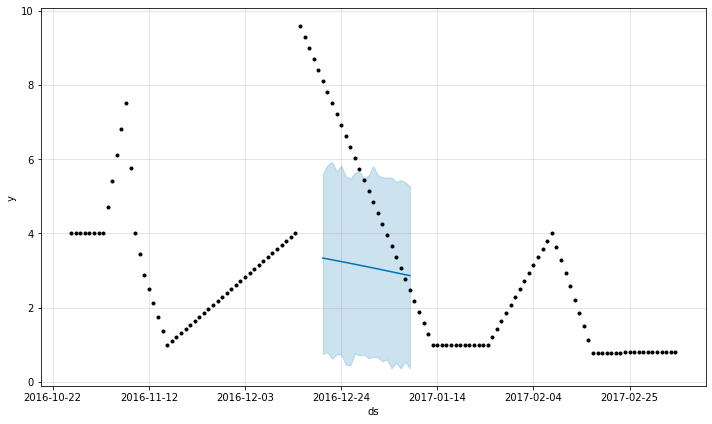

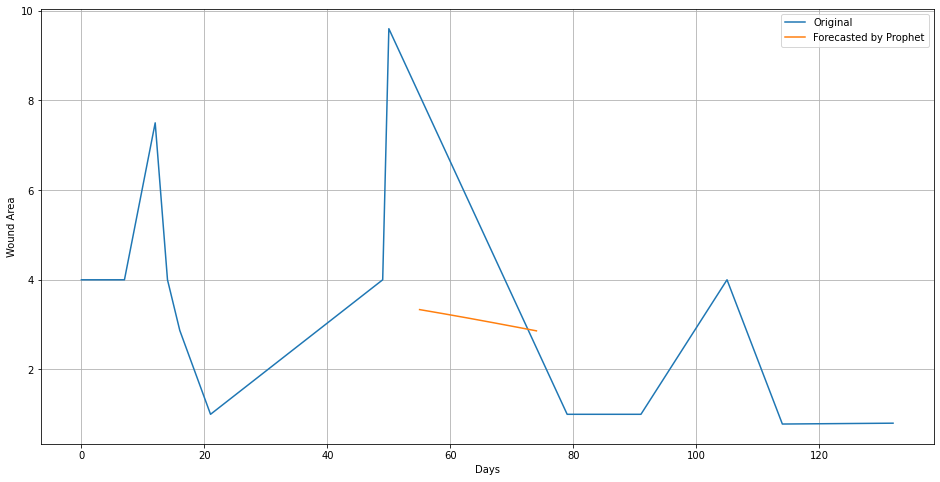

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 2
6
19

Initial log joint probability = -77.9364
Iteration  1. Log joint probability =    50.8756. Improved by 128.812.
Iteration  2. Log joint probability =    76.6817. Improved by 25.8061.
Iteration  3. Log joint probability =    81.4686. Improved by 4.78691.
Iteration  4. Log joint probability =    81.7862. Improved by 0.317593.
Iteration  5. Log joint probability =    81.8051. Improved by 0.0188342.
Iteration  6. Log joint probability =    81.8643. Improved by 0.0592532.
Iteration  7. Log joint probability =    81.8724. Improved by 0.00811655.
Iteration  8. Log joint probability =    81.9566. Improved by 0.084213.
Iteration  9. Log joint probability =    81.9652. Improved by 0.00855911.
Iteration 10. Log joint probability =    81.9686. Improved by 0.00343382.
Iteration 11. Log joint probability =    81.9706. Improved by 0.00195578.
Iteration 12. Log joint probability =     81.977. Improved by 0.0064146.
Iteration 13. Log joint probability =    81.9885. Improved by 0.0114663.

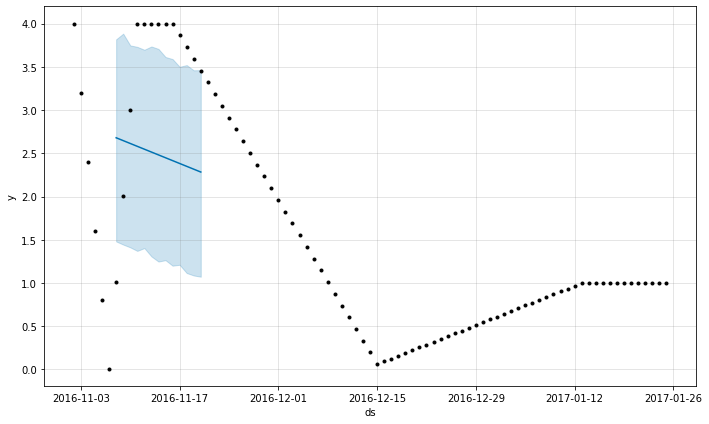

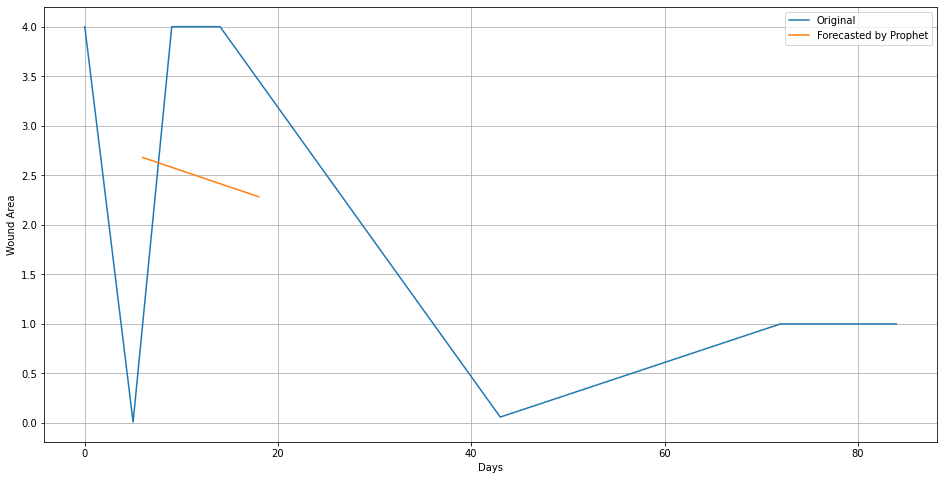

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 9.


Wound: 3
3
5

Initial log joint probability = -24.3502
Iteration  1. Log joint probability =    12.2809. Improved by 36.6312.
Iteration  2. Log joint probability =    16.9866. Improved by 4.70569.
Iteration  3. Log joint probability =    29.6127. Improved by 12.6261.
Iteration  4. Log joint probability =    30.6495. Improved by 1.03683.
Iteration  5. Log joint probability =    33.3024. Improved by 2.65287.
Iteration  6. Log joint probability =    34.2095. Improved by 0.907118.
Iteration  7. Log joint probability =    34.2593. Improved by 0.0497576.
Iteration  8. Log joint probability =    34.2675. Improved by 0.00824367.
Iteration  9. Log joint probability =    34.3269. Improved by 0.0593844.
Iteration 10. Log joint probability =    34.3427. Improved by 0.0157604.
Iteration 11. Log joint probability =    35.6237. Improved by 1.28109.
Iteration 12. Log joint probability =    35.7795. Improved by 0.155723.
Iteration 13. Log joint probability =    35.8969. Improved by 0.117477.
Iteration 

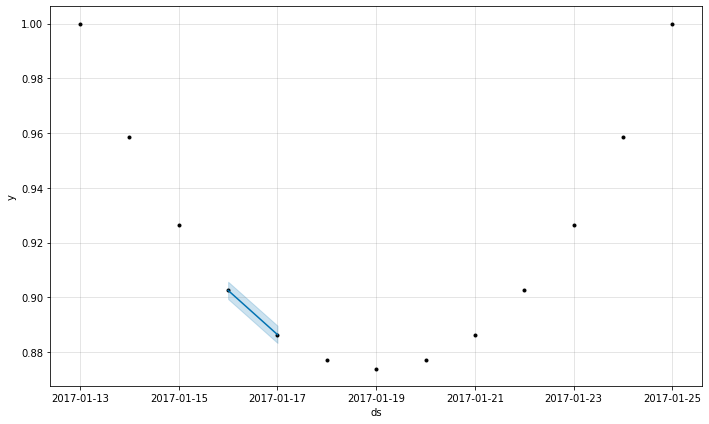

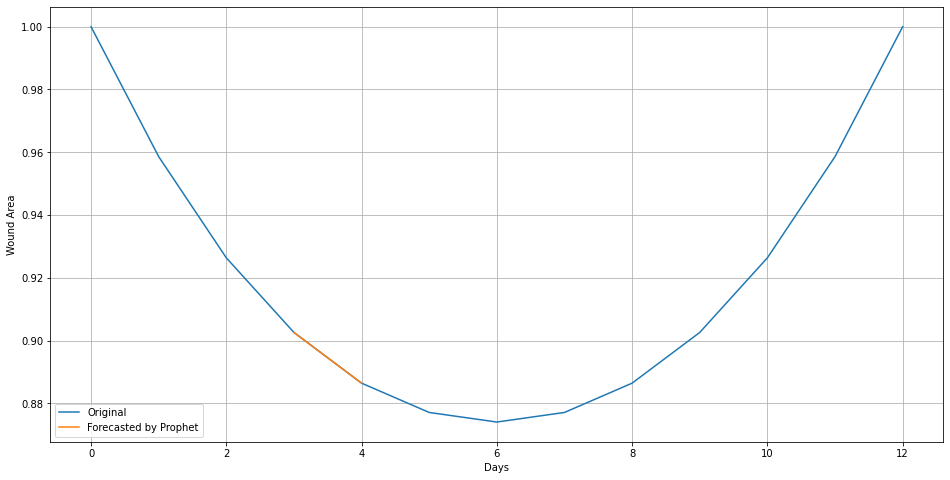

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 4
2
5

Initial log joint probability = -41.7995
Iteration  1. Log joint probability =    27.9257. Improved by 69.7252.
Iteration  2. Log joint probability =    42.4025. Improved by 14.4768.
Iteration  3. Log joint probability =    49.2688. Improved by 6.86632.
Iteration  4. Log joint probability =    58.7221. Improved by 9.45326.
Iteration  5. Log joint probability =    59.6852. Improved by 0.9631.
Iteration  6. Log joint probability =    59.7316. Improved by 0.046418.
Iteration  7. Log joint probability =    59.8805. Improved by 0.148928.
Iteration  8. Log joint probability =    60.6456. Improved by 0.76514.
Iteration  9. Log joint probability =    69.7685. Improved by 9.12288.
Iteration 10. Log joint probability =    79.2078. Improved by 9.43927.
Iteration 11. Log joint probability =    89.2253. Improved by 10.0175.
Iteration 12. Log joint probability =    98.4733. Improved by 9.24801.
Iteration 13. Log joint probability =    100.947. Improved by 2.47345.
Iteration 14. Log joi

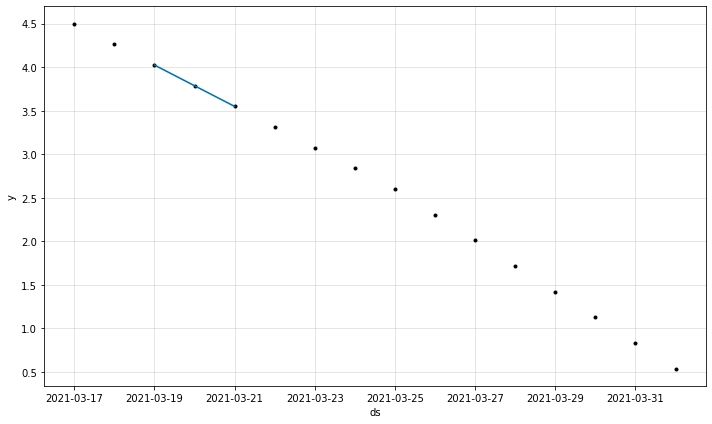

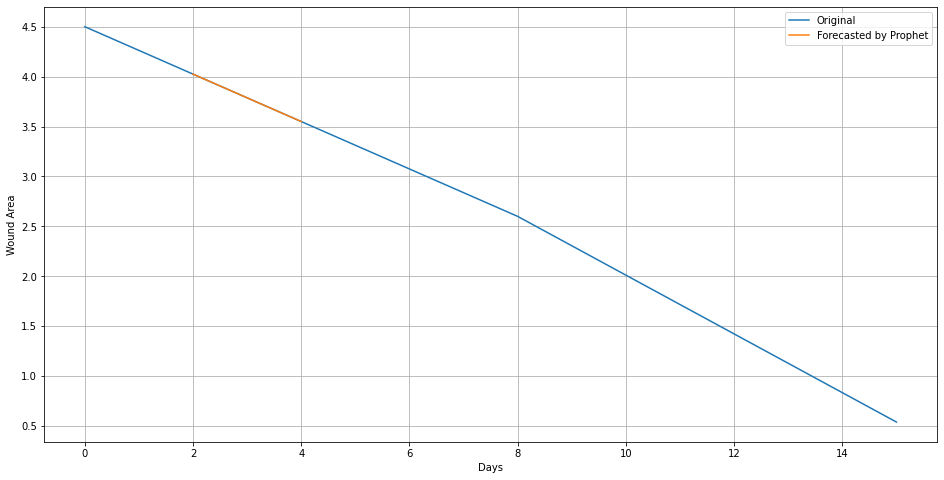

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 5
10
13

Initial log joint probability = -42.3418
Iteration  1. Log joint probability =    9.70306. Improved by 52.0449.
Iteration  2. Log joint probability =    19.7769. Improved by 10.0739.
Iteration  3. Log joint probability =    21.9322. Improved by 2.15532.
Iteration  4. Log joint probability =    23.8605. Improved by 1.92821.
Iteration  5. Log joint probability =    24.5736. Improved by 0.713138.
Iteration  6. Log joint probability =    24.6496. Improved by 0.0760481.
Iteration  7. Log joint probability =    24.9082. Improved by 0.258587.
Iteration  8. Log joint probability =    25.0541. Improved by 0.145852.
Iteration  9. Log joint probability =    25.0732. Improved by 0.0190831.
Iteration 10. Log joint probability =    25.1102. Improved by 0.036991.
Iteration 11. Log joint probability =    25.1783. Improved by 0.068108.
Iteration 12. Log joint probability =     25.206. Improved by 0.0277864.
Iteration 13. Log joint probability =    25.2286. Improved by 0.0225874.
Iterati

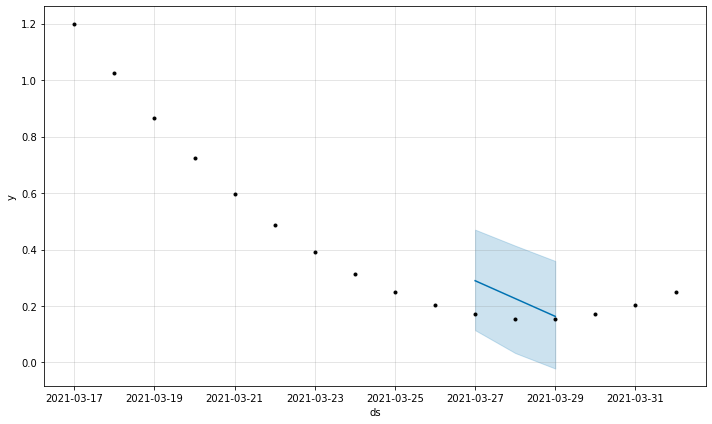

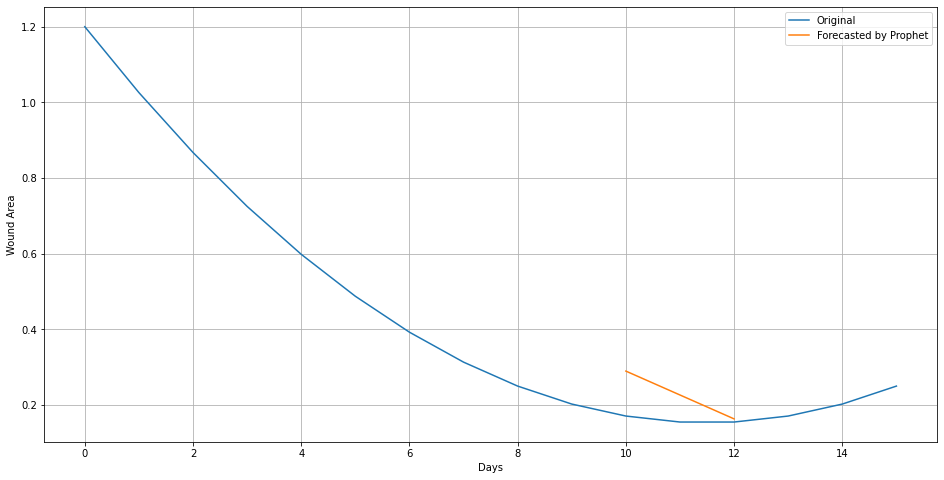

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 6
125
177
Initial log joint probability = -30.562
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       341.672   0.000462894       61.6592      0.5657      0.5657      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       342.787     0.0047503       62.3251   5.423e-05       0.001      204  LS failed, Hessian reset 
     182       343.233   0.000305709       66.6604   4.428e-06       0.001      311  LS failed, Hessian reset 
     199       343.242   7.22527e-07       37.0629       0.393       0.393      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     222       343.242   3.19666e-09       80.7438     0.00589     0.00589      379   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


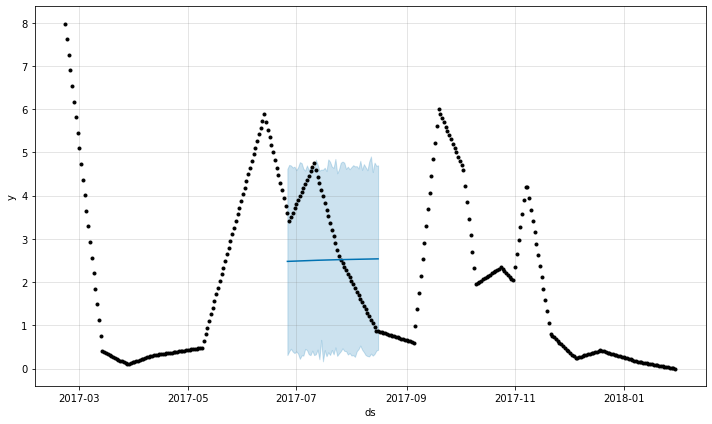

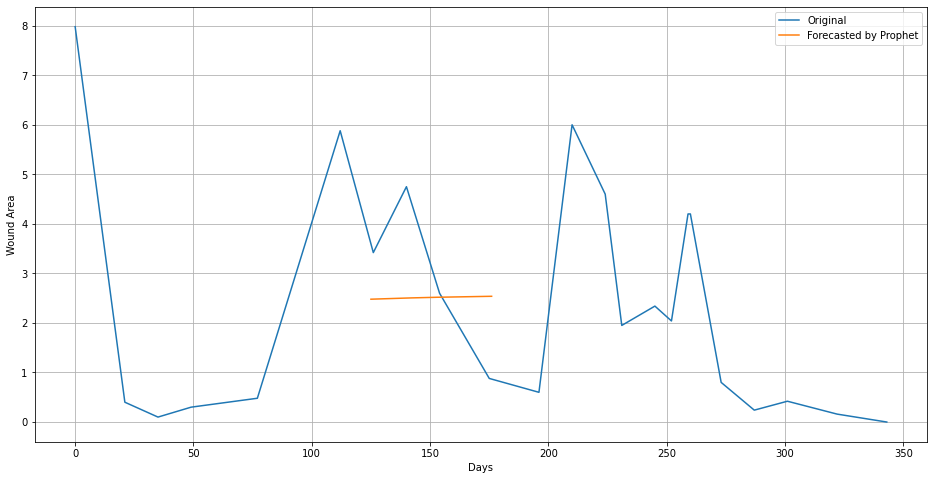

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 7
7
10

Initial log joint probability = -40.9209
Iteration  1. Log joint probability =    15.4392. Improved by 56.3601.
Iteration  2. Log joint probability =    22.2015. Improved by 6.76221.
Iteration  3. Log joint probability =    32.3305. Improved by 10.129.
Iteration  4. Log joint probability =    39.1655. Improved by 6.83506.
Iteration  5. Log joint probability =    39.7801. Improved by 0.614602.
Iteration  6. Log joint probability =    39.8261. Improved by 0.0459259.
Iteration  7. Log joint probability =    39.8576. Improved by 0.0315101.
Iteration  8. Log joint probability =     39.867. Improved by 0.00945698.
Iteration  9. Log joint probability =    42.8497. Improved by 2.98262.
Iteration 10. Log joint probability =    44.6035. Improved by 1.75382.
Iteration 11. Log joint probability =    45.4268. Improved by 0.823342.
Iteration 12. Log joint probability =    47.7543. Improved by 2.32752.
Iteration 13. Log joint probability =    49.6795. Improved by 1.92517.
Iteration 14.

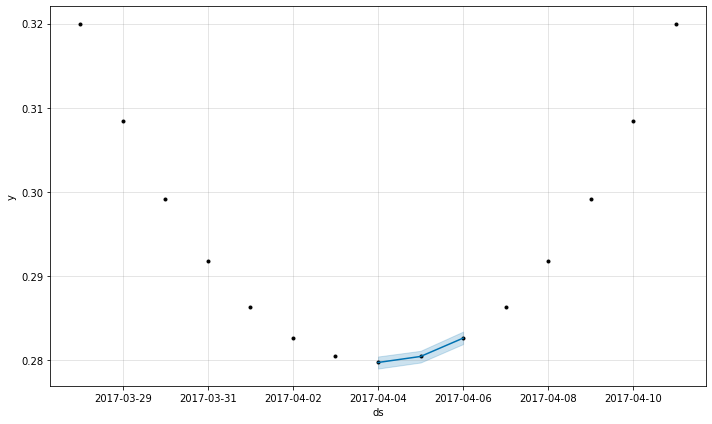

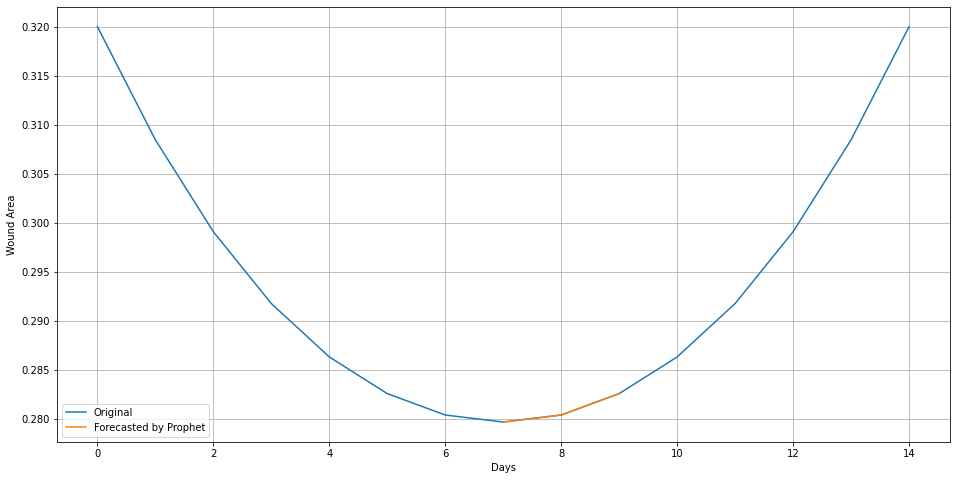

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 8
23
29

Initial log joint probability = -29.3603
Iteration  1. Log joint probability =    18.3637. Improved by 47.7241.
Iteration  2. Log joint probability =    47.7219. Improved by 29.3582.
Iteration  3. Log joint probability =    51.5151. Improved by 3.79316.
Iteration  4. Log joint probability =    54.4527. Improved by 2.93762.
Iteration  5. Log joint probability =    55.2022. Improved by 0.749472.
Iteration  6. Log joint probability =    55.2217. Improved by 0.0195413.
Iteration  7. Log joint probability =    55.2325. Improved by 0.0108395.
Iteration  8. Log joint probability =    55.3754. Improved by 0.142821.
Iteration  9. Log joint probability =    55.4184. Improved by 0.0430484.
Iteration 10. Log joint probability =    55.5384. Improved by 0.120015.
Iteration 11. Log joint probability =    55.5693. Improved by 0.0308853.
Iteration 12. Log joint probability =    55.6356. Improved by 0.0662583.
Iteration 13. Log joint probability =    55.8433. Improved by 0.207721.
Iterat

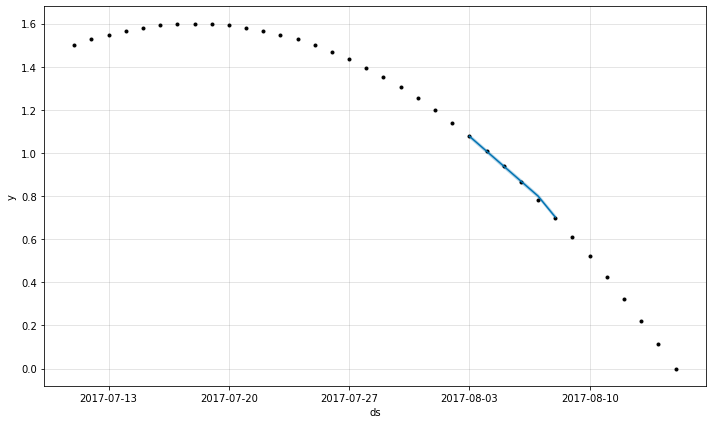

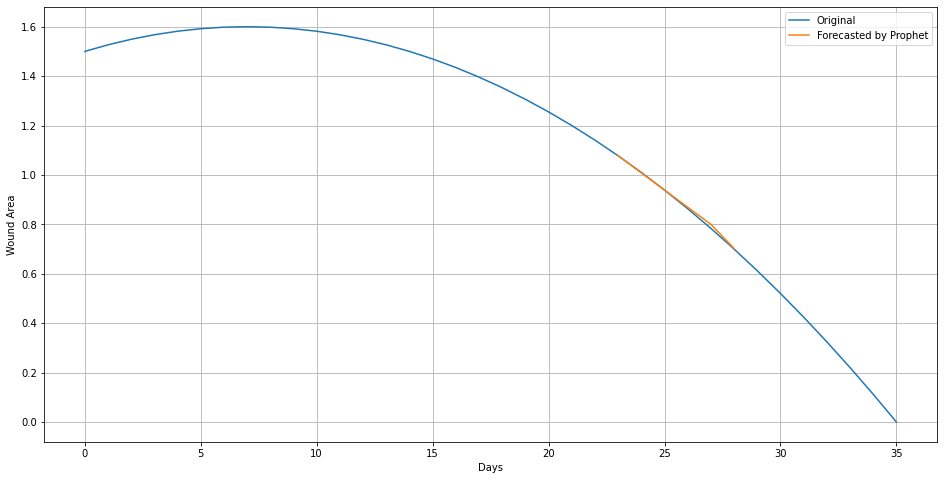

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 9
26
64
Initial log joint probability = -13.5515
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       302.679   0.000136044       85.5755           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       302.766   6.38694e-05       66.5013      0.7086      0.7086      257   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       302.782   5.56949e-05       81.7459       4.694      0.4694      379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     381       303.051   5.34625e-09       69.9442   7.384e-05           1      493   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


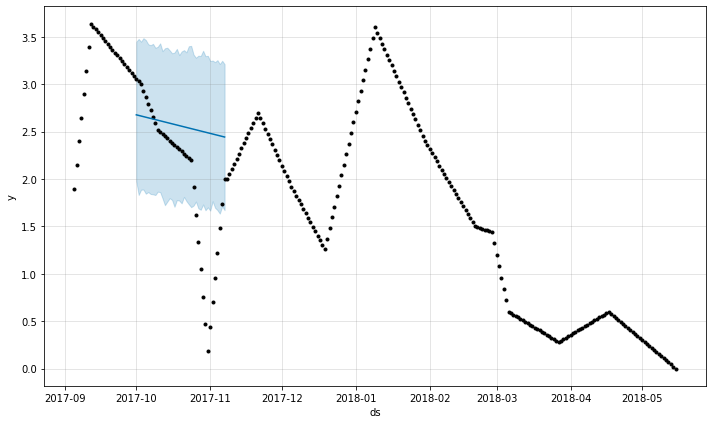

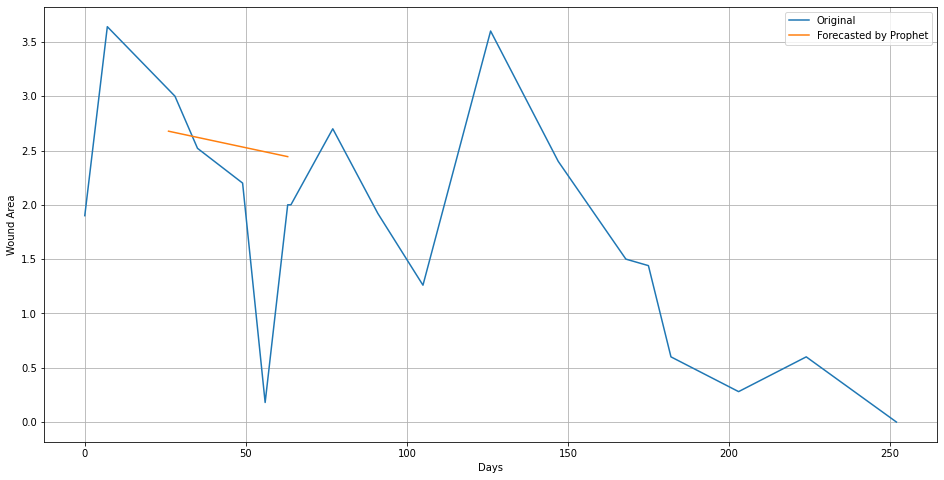

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 10
20
43
Initial log joint probability = -8.5879
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       176.436   1.96401e-06       69.0752      0.3315      0.3315      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       176.725    0.00235084       73.4872   2.478e-05       0.001      239  LS failed, Hessian reset 
     199        176.93   8.12433e-07       75.1916      0.5992      0.5992      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221        176.93   1.06378e-06       80.4177   1.173e-08       0.001      374  LS failed, Hessian reset 
     239        176.93   7.68164e-09       71.2875      0.6305      0.6305      398   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


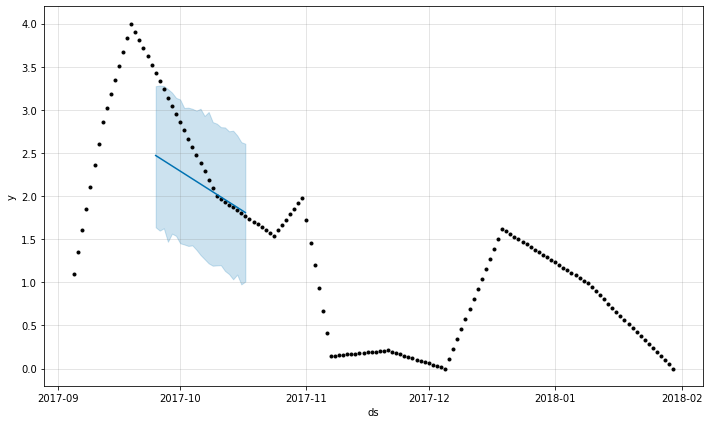

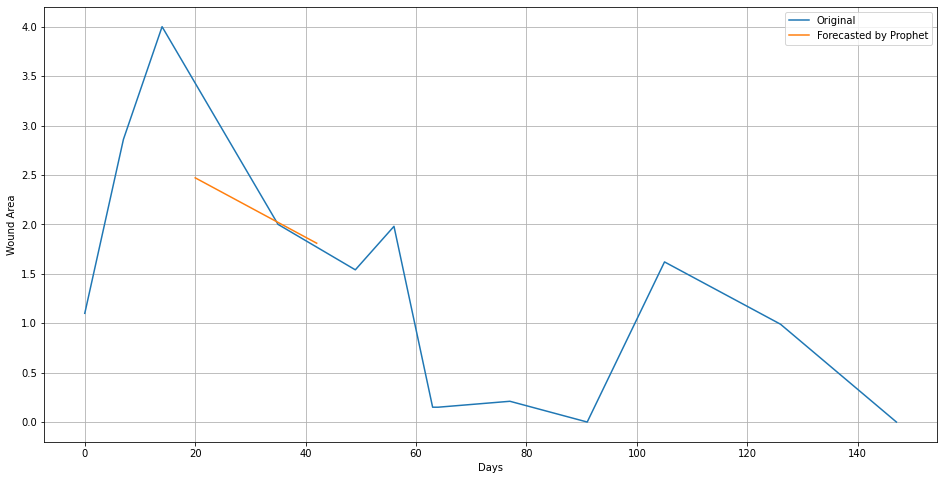

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 11
28
35

Initial log joint probability = -35.1009
Iteration  1. Log joint probability =    33.0833. Improved by 68.1842.
Iteration  2. Log joint probability =     61.277. Improved by 28.1937.
Iteration  3. Log joint probability =    73.8823. Improved by 12.6053.
Iteration  4. Log joint probability =    77.5348. Improved by 3.65251.
Iteration  5. Log joint probability =    78.3533. Improved by 0.818453.
Iteration  6. Log joint probability =    78.4273. Improved by 0.0740177.
Iteration  7. Log joint probability =    78.5914. Improved by 0.16407.
Iteration  8. Log joint probability =    78.5975. Improved by 0.00615244.
Iteration  9. Log joint probability =    78.8244. Improved by 0.226864.
Iteration 10. Log joint probability =    78.8428. Improved by 0.0183784.
Iteration 11. Log joint probability =    78.8429. Improved by 0.000109156.
Iteration 12. Log joint probability =    78.8949. Improved by 0.0520583.
Iteration 13. Log joint probability =     78.921. Improved by 0.0260901.
It

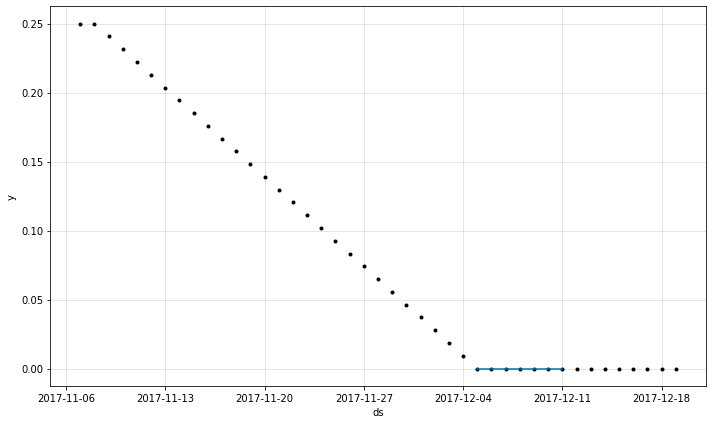

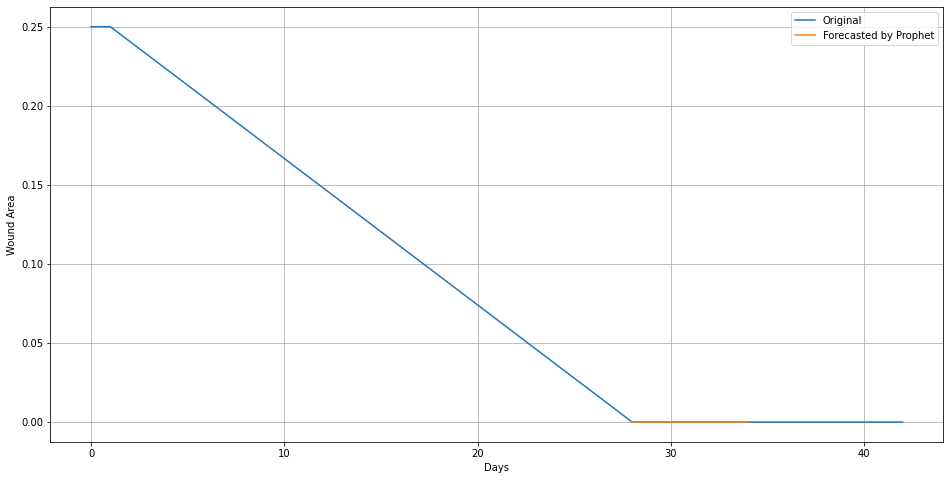

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 12
4
7

Initial log joint probability = -41.3221
Iteration  1. Log joint probability =    1.84178. Improved by 43.1639.
Iteration  2. Log joint probability =    2.34584. Improved by 0.504061.
Iteration  3. Log joint probability =    21.8926. Improved by 19.5468.
Iteration  4. Log joint probability =    21.9419. Improved by 0.0492302.
Iteration  5. Log joint probability =    21.9562. Improved by 0.0143761.
Iteration  6. Log joint probability =    21.9684. Improved by 0.012127.
Iteration  7. Log joint probability =    22.0366. Improved by 0.0682595.
Iteration  8. Log joint probability =    22.2581. Improved by 0.221468.
Iteration  9. Log joint probability =     22.277. Improved by 0.0189168.
Iteration 10. Log joint probability =    22.2952. Improved by 0.0182089.
Iteration 11. Log joint probability =    22.4081. Improved by 0.112913.
Iteration 12. Log joint probability =    22.4359. Improved by 0.0277402.
Iteration 13. Log joint probability =    22.4546. Improved by 0.0187515.
Ite

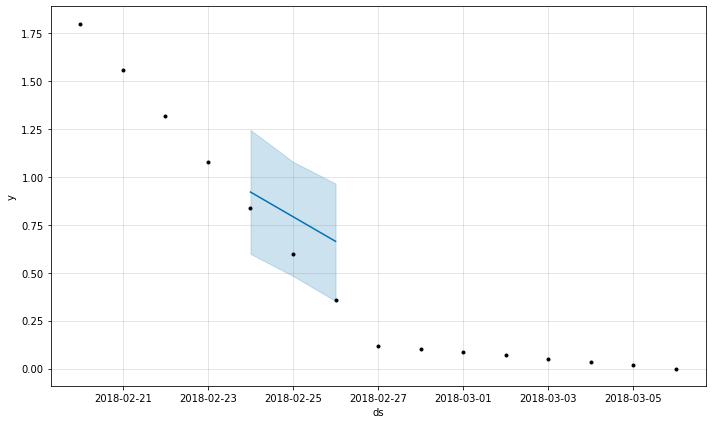

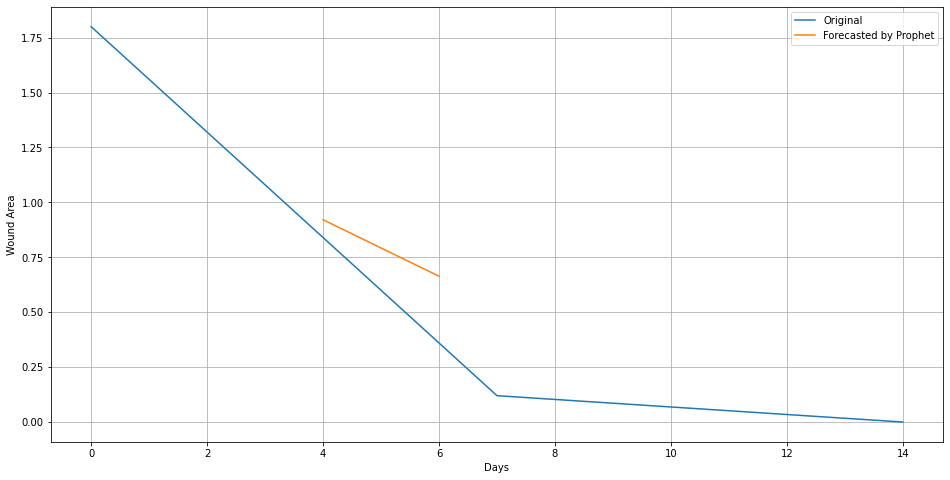

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 13
351
431
Initial log joint probability = -38.2458
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       719.537    0.00277418       72.9233      0.5636      0.5636      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       720.602    0.00435421       88.1041   5.185e-05       0.001      211  LS failed, Hessian reset 
     182        720.98   1.05572e-08       62.1563      0.2935     0.02935      286   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


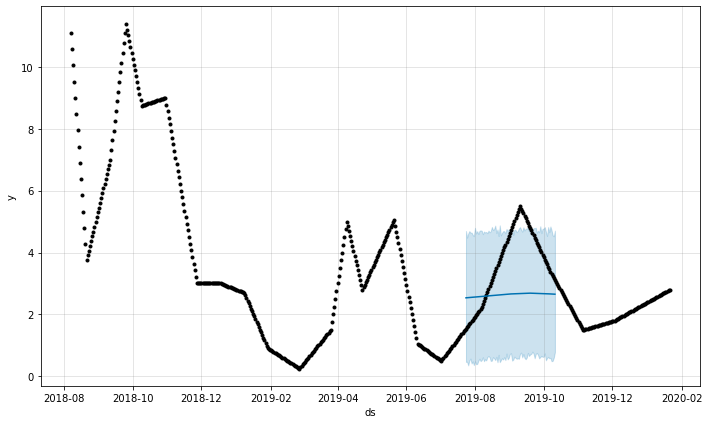

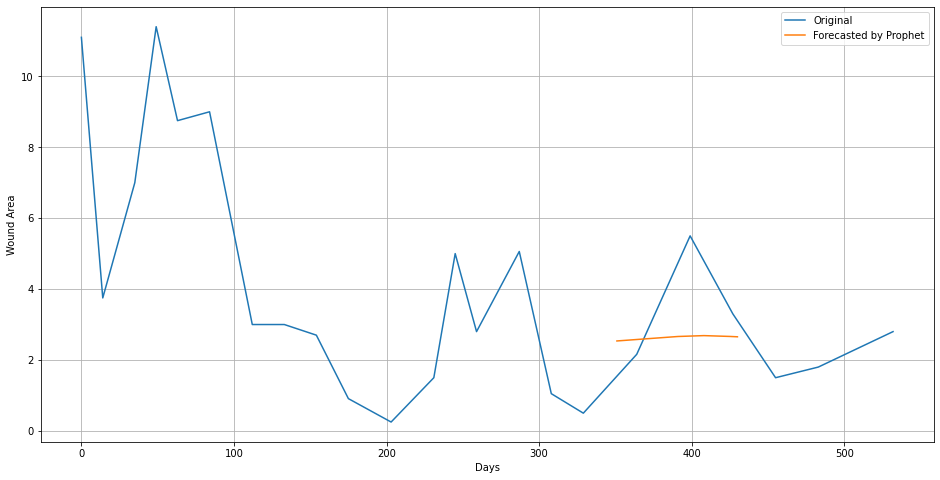

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 14
40
53

Initial log joint probability = -82.7443
Iteration  1. Log joint probability =    16.3959. Improved by 99.1402.
Iteration  2. Log joint probability =    26.5435. Improved by 10.1476.
Iteration  3. Log joint probability =    59.2008. Improved by 32.6573.
Iteration  4. Log joint probability =    59.4371. Improved by 0.236363.
Iteration  5. Log joint probability =    59.9668. Improved by 0.529718.
Iteration  6. Log joint probability =    60.4375. Improved by 0.470628.
Iteration  7. Log joint probability =    60.6749. Improved by 0.237476.
Iteration  8. Log joint probability =    60.7537. Improved by 0.0787329.
Iteration  9. Log joint probability =    63.1454. Improved by 2.39172.
Iteration 10. Log joint probability =    63.1868. Improved by 0.0414334.
Iteration 11. Log joint probability =    63.2743. Improved by 0.0875244.
Iteration 12. Log joint probability =    63.2964. Improved by 0.0220379.
Iteration 13. Log joint probability =    67.6212. Improved by 4.32482.
Iterati

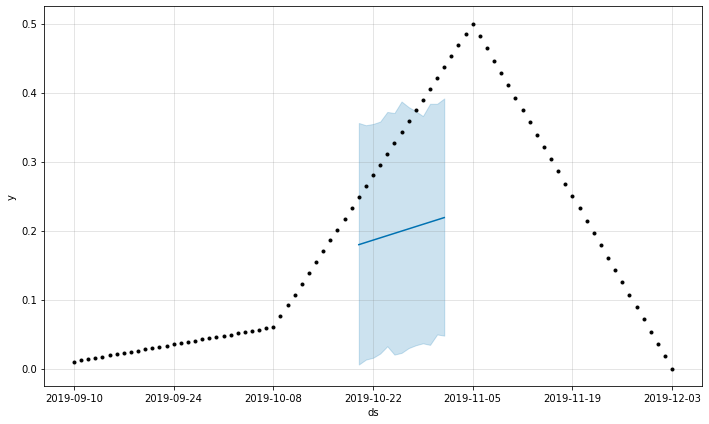

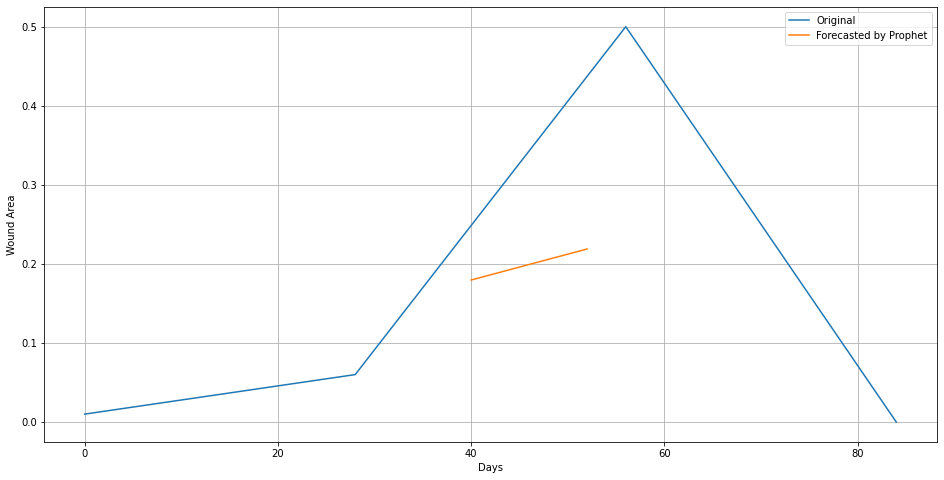

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 15
155
195
Initial log joint probability = -13.9819
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         331.6    0.00149264       91.9269      0.2697           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       331.868   2.67923e-07       89.5903           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       331.868   8.32547e-09       75.9497       0.548       0.548      264   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


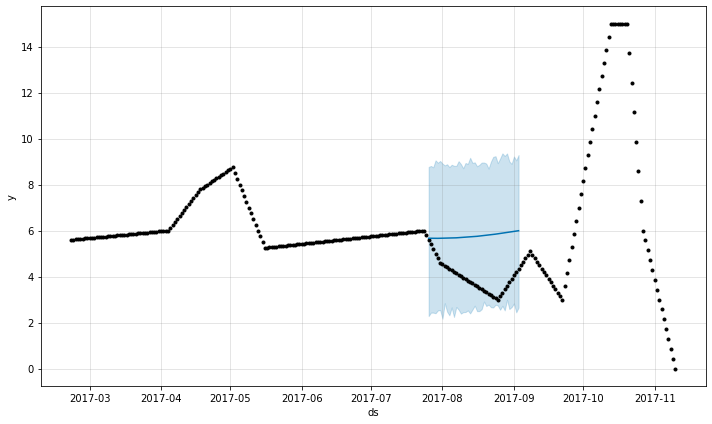

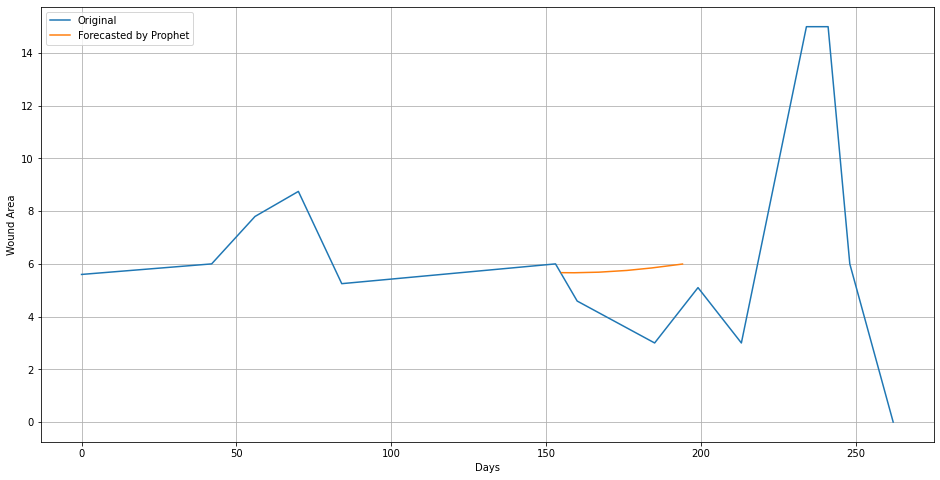

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 16
2
8

Initial log joint probability = -28.1757
Iteration  1. Log joint probability =    26.2758. Improved by 54.4515.
Iteration  2. Log joint probability =     53.764. Improved by 27.4883.
Iteration  3. Log joint probability =    57.4878. Improved by 3.7238.
Iteration  4. Log joint probability =    57.7712. Improved by 0.283395.
Iteration  5. Log joint probability =    58.0614. Improved by 0.290202.
Iteration  6. Log joint probability =    58.3456. Improved by 0.284194.
Iteration  7. Log joint probability =    58.5766. Improved by 0.231017.
Iteration  8. Log joint probability =    58.6246. Improved by 0.0479496.
Iteration  9. Log joint probability =    58.7047. Improved by 0.0801075.
Iteration 10. Log joint probability =    58.7354. Improved by 0.0306938.
Iteration 11. Log joint probability =    58.9423. Improved by 0.206878.
Iteration 12. Log joint probability =    58.9681. Improved by 0.0258484.
Iteration 13. Log joint probability =    59.2617. Improved by 0.293554.
Iteratio

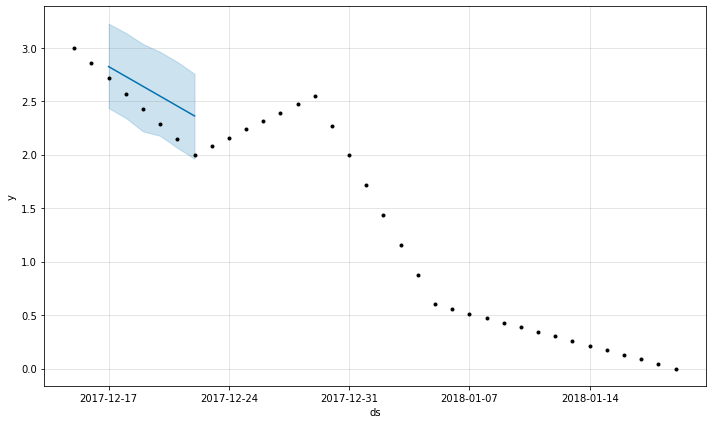

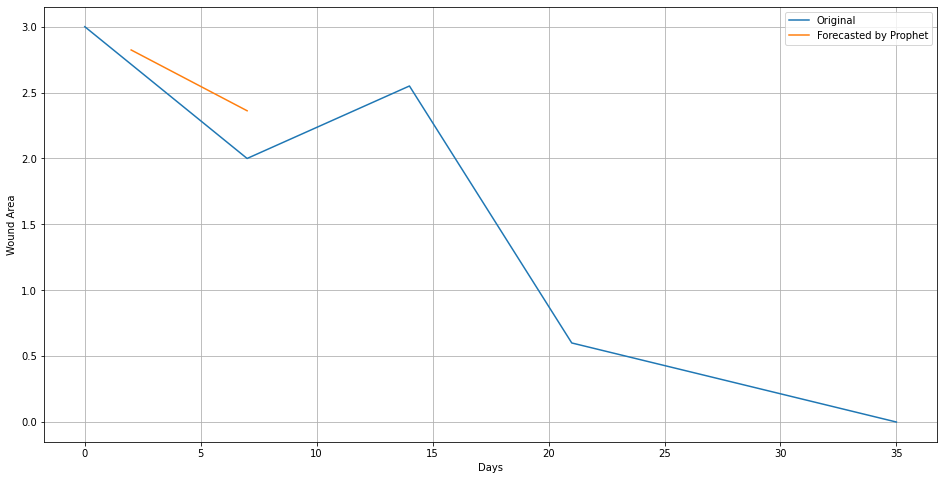

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 17
1
13

Initial log joint probability = -70.7986
Iteration  1. Log joint probability =    43.7549. Improved by 114.554.
Iteration  2. Log joint probability =    75.6281. Improved by 31.8732.
Iteration  3. Log joint probability =    79.1552. Improved by 3.52711.
Iteration  4. Log joint probability =    80.1301. Improved by 0.974826.
Iteration  5. Log joint probability =     80.131. Improved by 0.000974172.
Iteration  6. Log joint probability =    80.1364. Improved by 0.00536391.
Iteration  7. Log joint probability =    80.1426. Improved by 0.00621332.
Iteration  8. Log joint probability =    80.1652. Improved by 0.0225643.
Iteration  9. Log joint probability =     80.189. Improved by 0.0238473.
Iteration 10. Log joint probability =    80.4871. Improved by 0.298108.
Iteration 11. Log joint probability =    80.5165. Improved by 0.0293972.
Iteration 12. Log joint probability =    80.5194. Improved by 0.00282572.
Iteration 13. Log joint probability =    80.5612. Improved by 0.041873

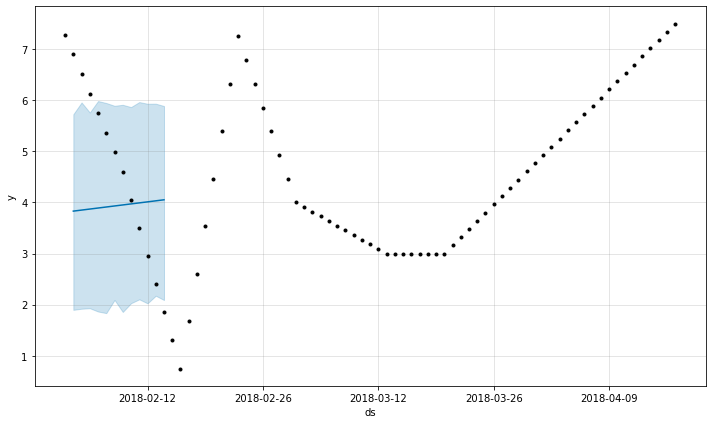

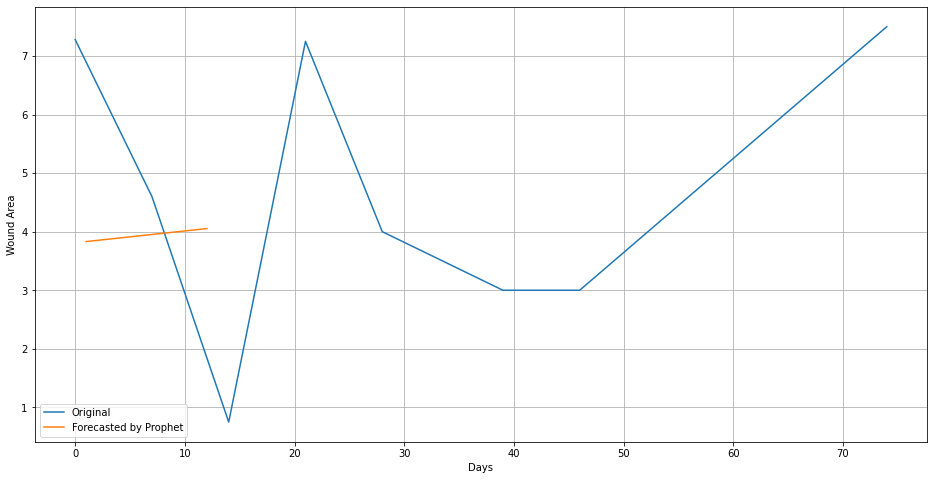

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 18
7
10

Initial log joint probability = -41.0728
Iteration  1. Log joint probability =    13.5635. Improved by 54.6364.
Iteration  2. Log joint probability =    14.6355. Improved by 1.07194.
Iteration  3. Log joint probability =     15.817. Improved by 1.18153.
Iteration  4. Log joint probability =    16.4466. Improved by 0.629639.
Iteration  5. Log joint probability =    16.5428. Improved by 0.0961399.
Iteration  6. Log joint probability =    16.5831. Improved by 0.040317.
Iteration  7. Log joint probability =    16.6944. Improved by 0.111314.
Iteration  8. Log joint probability =    16.7991. Improved by 0.104681.
Iteration  9. Log joint probability =    16.8811. Improved by 0.0819887.
Iteration 10. Log joint probability =    16.9443. Improved by 0.0631851.
Iteration 11. Log joint probability =    16.9571. Improved by 0.0128854.
Iteration 12. Log joint probability =    16.9729. Improved by 0.01573.
Iteration 13. Log joint probability =    16.9944. Improved by 0.0215198.
Iterat

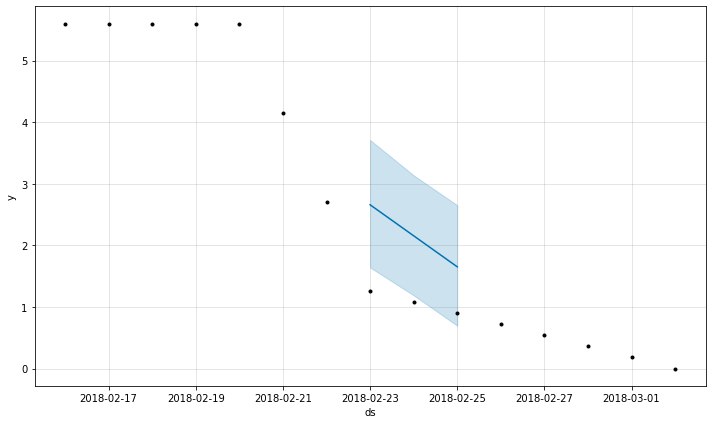

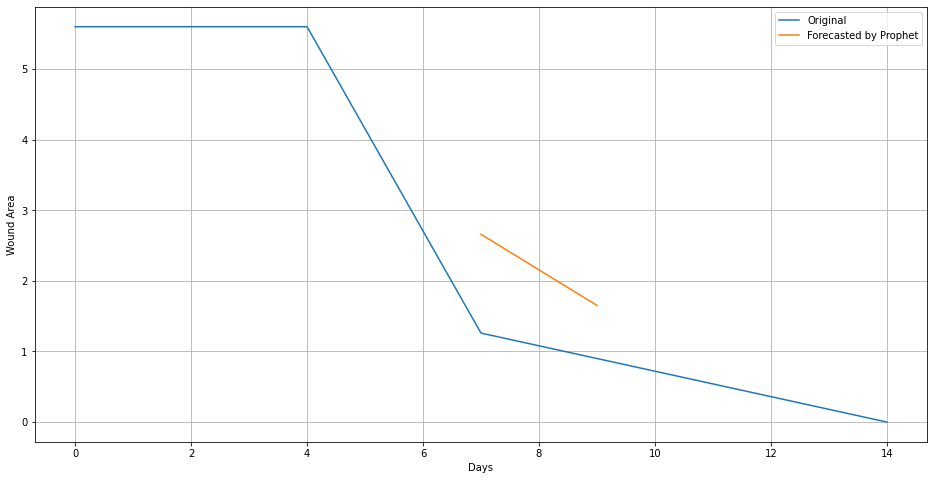

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 19
31
40

Initial log joint probability = -55.2154
Iteration  1. Log joint probability =    25.0918. Improved by 80.3072.
Iteration  2. Log joint probability =    45.2795. Improved by 20.1878.
Iteration  3. Log joint probability =    54.9821. Improved by 9.70261.
Iteration  4. Log joint probability =    56.7281. Improved by 1.746.
Iteration  5. Log joint probability =     56.744. Improved by 0.0158853.
Iteration  6. Log joint probability =    56.7574. Improved by 0.0133373.
Iteration  7. Log joint probability =    56.8893. Improved by 0.131963.
Iteration  8. Log joint probability =    57.0108. Improved by 0.121494.
Iteration  9. Log joint probability =    57.0512. Improved by 0.0403389.
Iteration 10. Log joint probability =    57.2472. Improved by 0.195999.
Iteration 11. Log joint probability =    57.3812. Improved by 0.134024.
Iteration 12. Log joint probability =    57.4379. Improved by 0.0567115.
Iteration 13. Log joint probability =    57.4498. Improved by 0.0119021.
Iterati

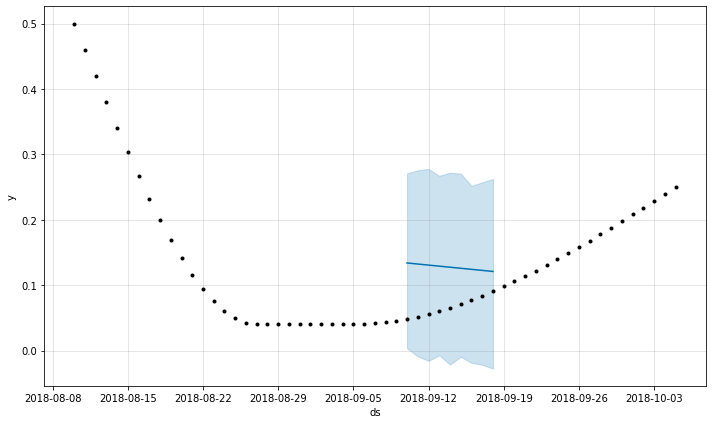

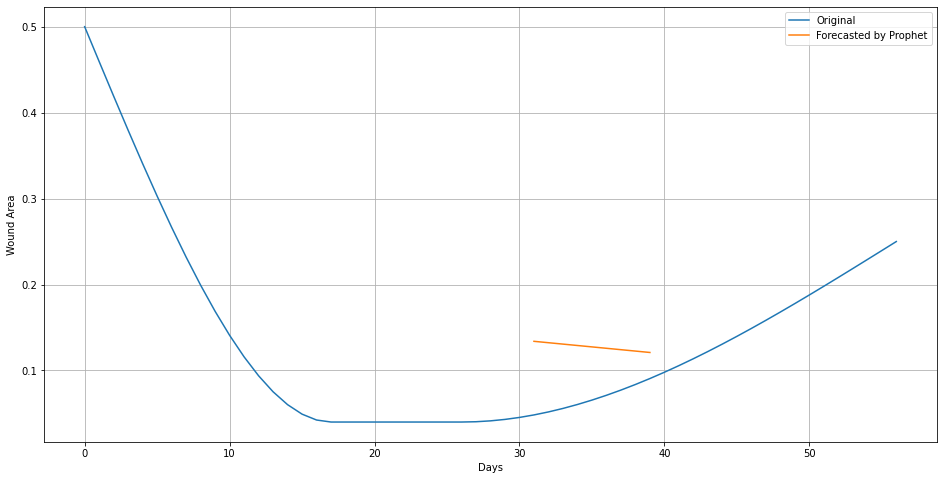

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 20
153
201
Initial log joint probability = -3.96383
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       567.539   0.000444833       78.5738   5.414e-06       0.001      121  LS failed, Hessian reset 
      99       567.647   8.74712e-05       76.1201       1.751      0.1751      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       567.667   0.000107679       85.1268   1.105e-06       0.001      324  LS failed, Hessian reset 
     199       567.672   8.19468e-07       74.8093      0.4855      0.4855      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       567.673   3.32177e-08       85.8504      0.7938      0.7938      405   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


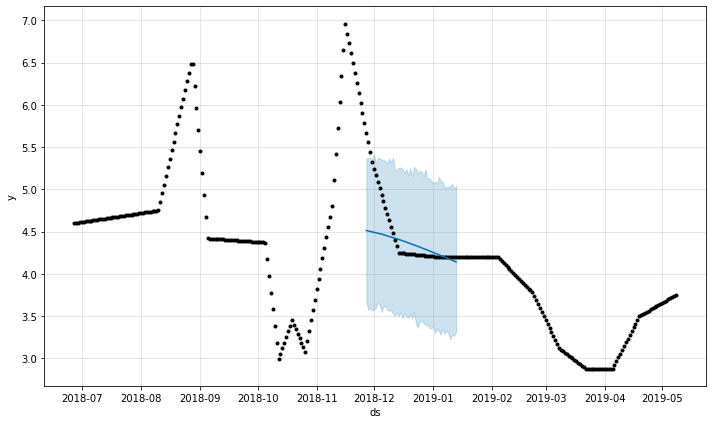

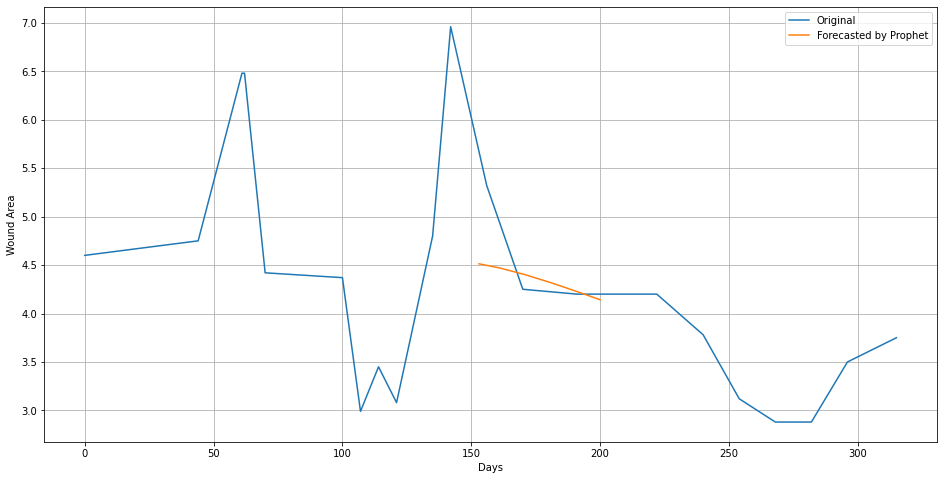

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 21
90
108
Initial log joint probability = -2.26496
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       377.657     0.0101474       101.642           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       380.373   0.000118438       130.623   1.135e-06       0.001      211  LS failed, Hessian reset 
     191       383.096   0.000338217       213.127     4.7e-06       0.001      331  LS failed, Hessian reset 
     199       383.173   7.85453e-05       67.9256      0.1277      0.1277      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       383.265   8.06676e-05       86.8049   5.205e-07       0.001      390  LS failed, Hessian reset 
     299       385.494     0.0012872       114.737      0.4849      0.4849      497   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

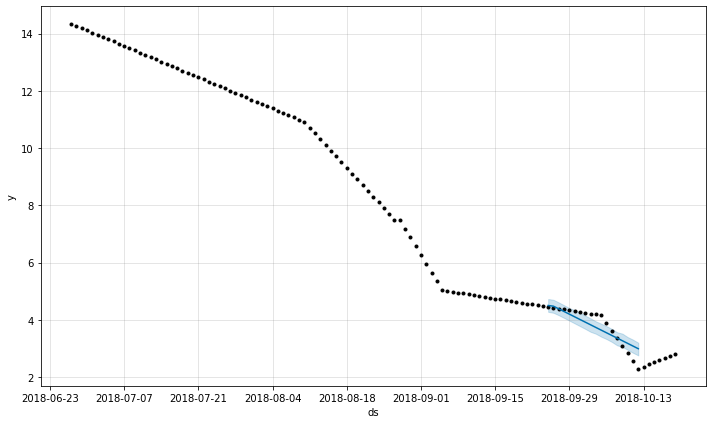

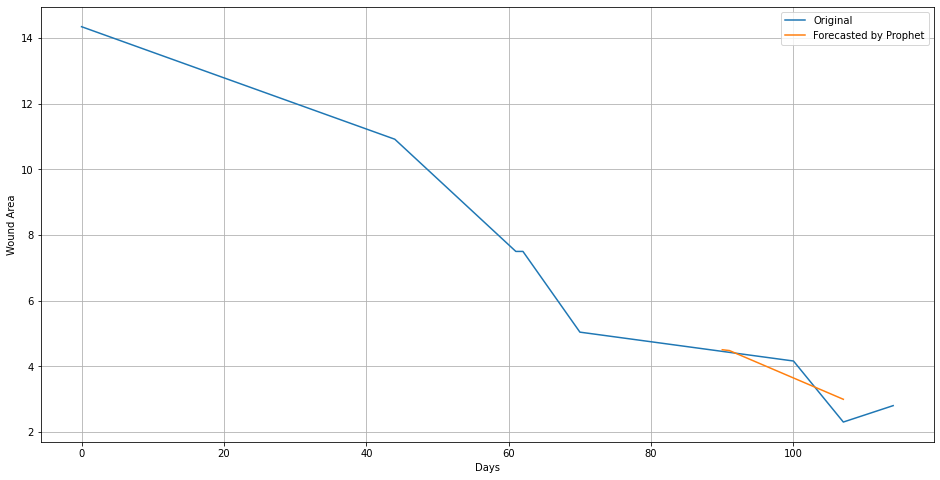

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 22
14
23

Initial log joint probability = -48.9937
Iteration  1. Log joint probability =    42.4005. Improved by 91.3942.
Iteration  2. Log joint probability =     77.119. Improved by 34.7185.
Iteration  3. Log joint probability =    93.4237. Improved by 16.3047.
Iteration  4. Log joint probability =     95.645. Improved by 2.22131.
Iteration  5. Log joint probability =    95.7116. Improved by 0.0666325.
Iteration  6. Log joint probability =    95.7449. Improved by 0.0332972.
Iteration  7. Log joint probability =    95.7616. Improved by 0.0166482.
Iteration  8. Log joint probability =    95.8684. Improved by 0.106795.
Iteration  9. Log joint probability =     95.875. Improved by 0.00668438.
Iteration 10. Log joint probability =    95.8821. Improved by 0.00708068.
Iteration 11. Log joint probability =    95.9703. Improved by 0.0882169.
Iteration 12. Log joint probability =    96.0143. Improved by 0.0439184.
Iteration 13. Log joint probability =    96.0175. Improved by 0.00326042.

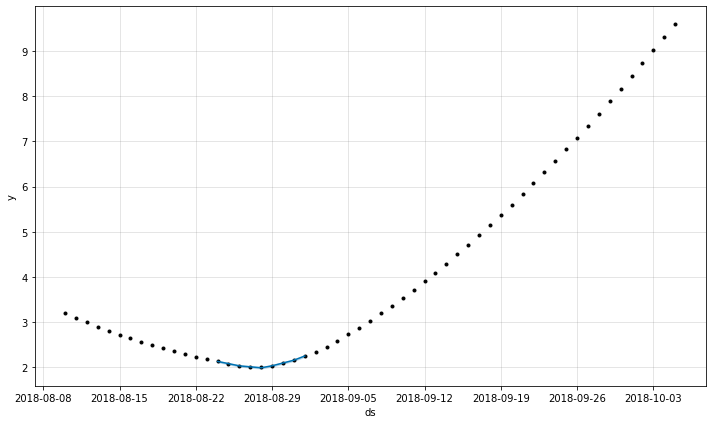

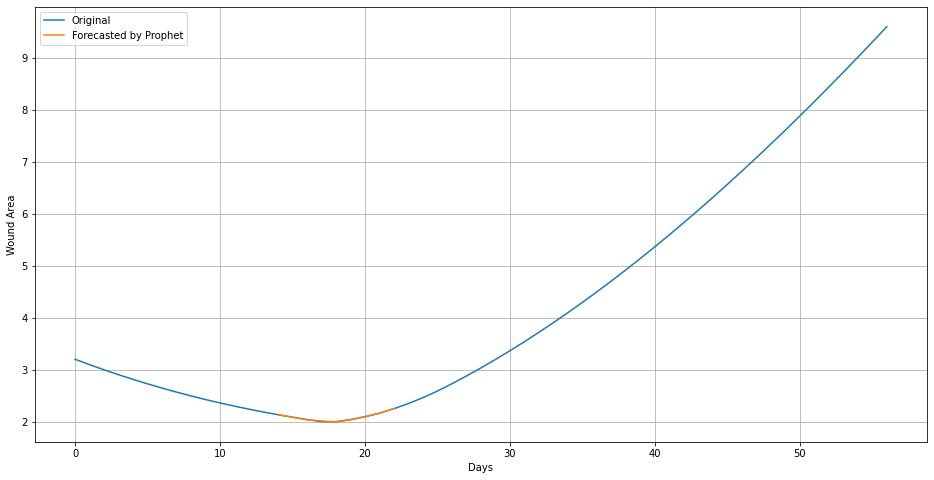

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 23
1
10

Initial log joint probability = -49.709
Iteration  1. Log joint probability =     36.812. Improved by 86.521.
Iteration  2. Log joint probability =    66.4288. Improved by 29.6168.
Iteration  3. Log joint probability =    81.3105. Improved by 14.8816.
Iteration  4. Log joint probability =    82.4355. Improved by 1.12501.
Iteration  5. Log joint probability =    82.4627. Improved by 0.027209.
Iteration  6. Log joint probability =    82.5399. Improved by 0.0772236.
Iteration  7. Log joint probability =    82.5975. Improved by 0.0575698.
Iteration  8. Log joint probability =    82.7225. Improved by 0.124985.
Iteration  9. Log joint probability =    82.7972. Improved by 0.0747124.
Iteration 10. Log joint probability =    89.5275. Improved by 6.73036.
Iteration 11. Log joint probability =    89.7872. Improved by 0.259665.
Iteration 12. Log joint probability =    90.1586. Improved by 0.371437.
Iteration 13. Log joint probability =    90.2772. Improved by 0.118576.
Iteration 1

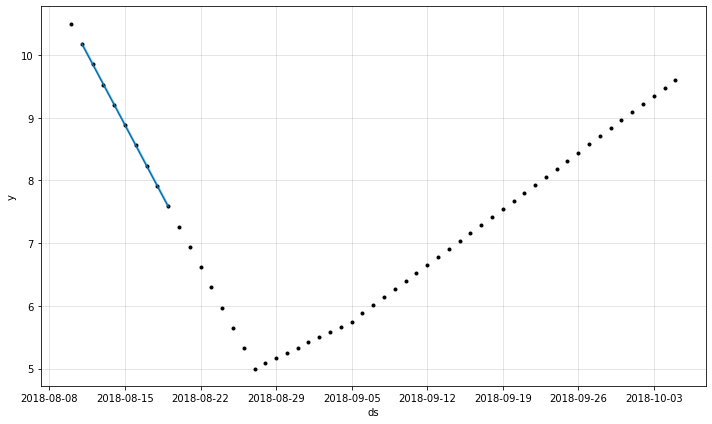

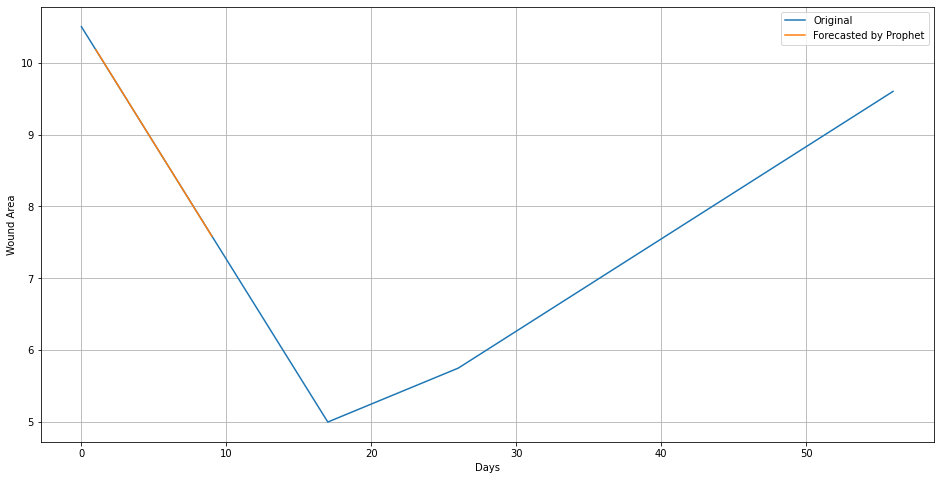

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 24
66
88
Initial log joint probability = -4.26284
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       182.608   0.000265804       84.5951       1.758      0.5825      142   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       182.693   1.24072e-05       77.6465           1           1      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       182.696   7.35127e-06       85.1709   9.546e-08       0.001      409  LS failed, Hessian reset 
     298       182.697   6.54765e-10       78.9182     0.02018     0.02018      464   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


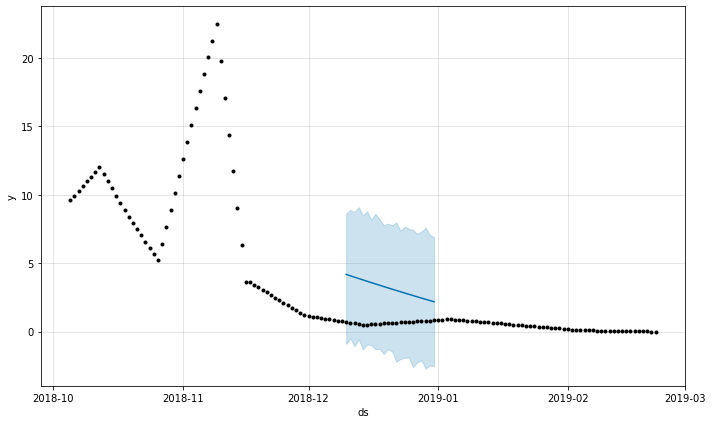

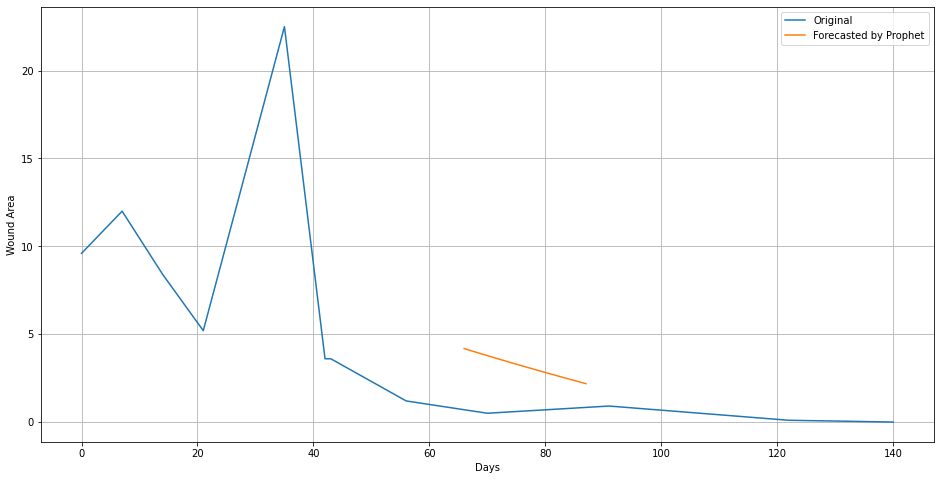

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 25
137
165
Initial log joint probability = -8.87675
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      98         323.8    0.00239301       101.922   1.567e-05       0.001      170  LS failed, Hessian reset 
      99       323.876    0.00103126       82.1164           1           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       324.875    6.7163e-05       86.1115           1           1      298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       325.561    0.00027964       81.7357      0.1771      0.1771      425   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306       325.653   0.000736775       98.7716   1.191e-05       0.001      475  LS failed, Hessian reset 
     386       325.792   0.000391665        75.736   5.082e-06       0.001      615  LS fa

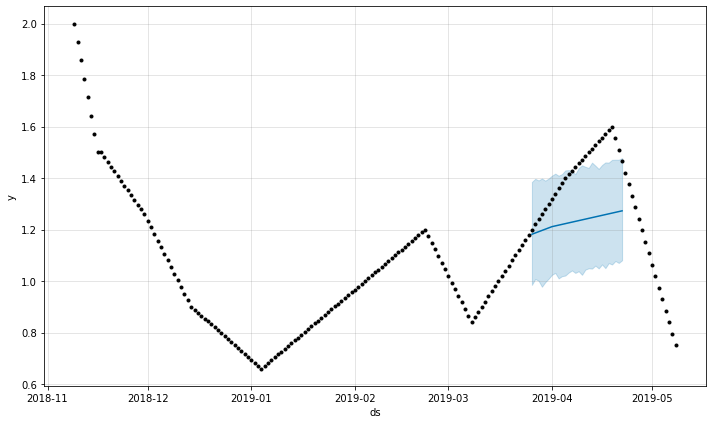

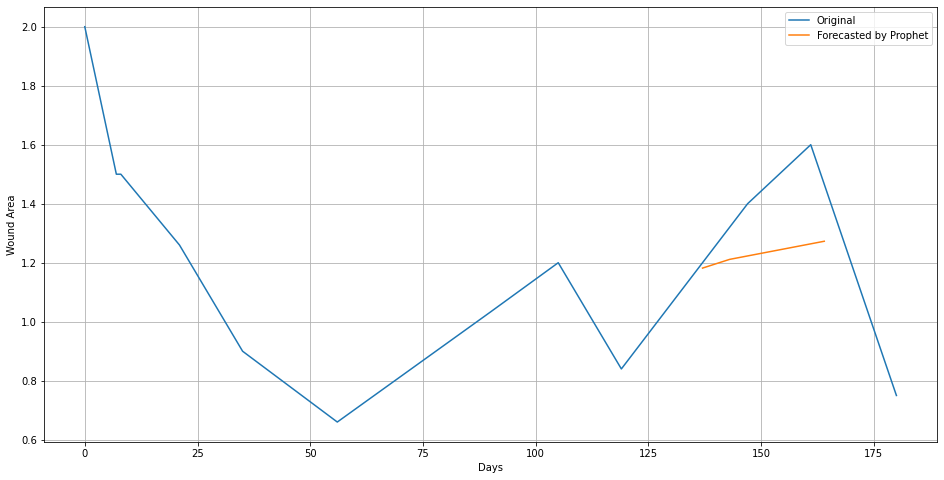

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 26
362
434
Initial log joint probability = -11.5924
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1010.45     0.0137684        190.54           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       1013.15   0.000366158       92.5404   4.825e-06       0.001      214  LS failed, Hessian reset 
     199       1019.92     0.0188711        95.666           1           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       1022.63   0.000391949        97.192   2.806e-06       0.001      369  LS failed, Hessian reset 
     299       1024.75   0.000380007       83.4642      0.2965      0.2965      455   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     345       1025.51   0.000605045       143.784   6.217e-06       0.001      551  LS fa

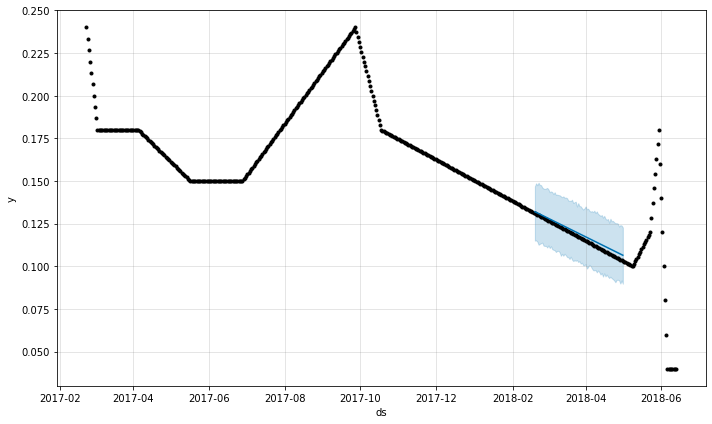

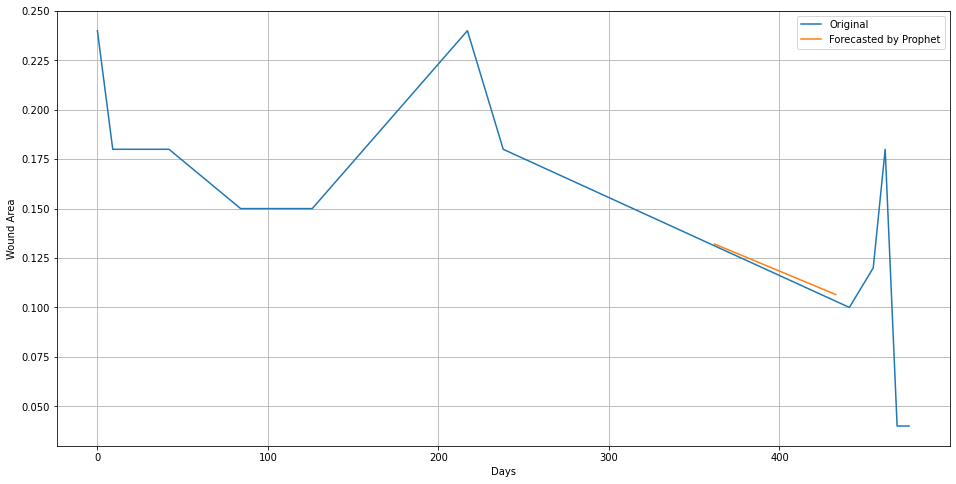

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 27
53
81
Initial log joint probability = -14.7367
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       171.015   0.000406579       81.6836   4.803e-06       0.001      160  LS failed, Hessian reset 
      99       171.045   5.20624e-05       73.6694           1           1      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     147       171.051   4.96667e-06        87.945   6.103e-08       0.001      271  LS failed, Hessian reset 
     177       171.051   4.98585e-09       77.6059      0.6123      0.6123      307   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


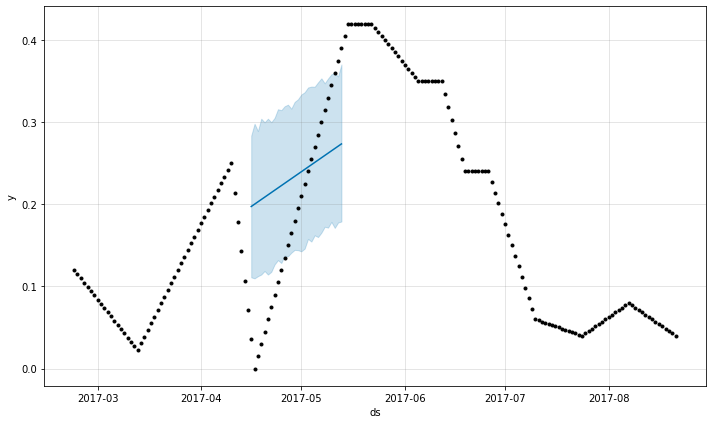

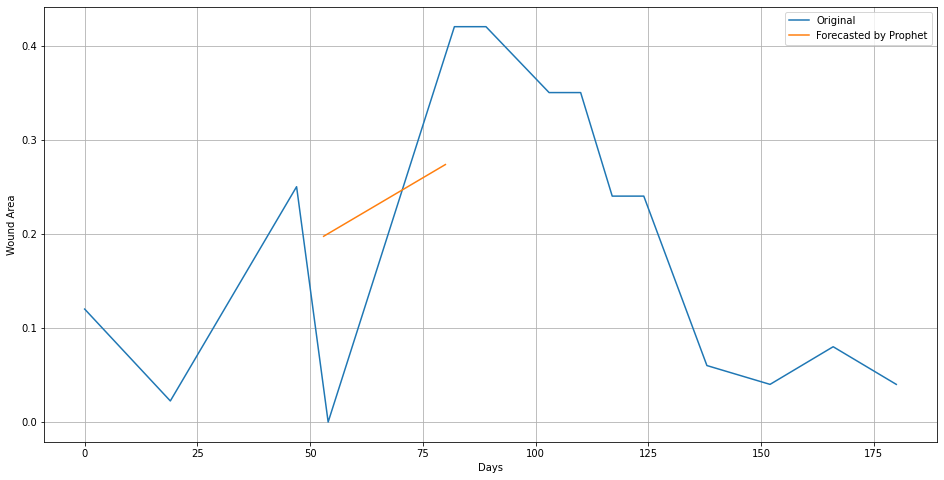

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 28
23
36

Initial log joint probability = -83.4469
Iteration  1. Log joint probability =   -12.3071. Improved by 71.1398.
Iteration  2. Log joint probability =    26.8518. Improved by 39.1588.
Iteration  3. Log joint probability =    43.5846. Improved by 16.7328.
Iteration  4. Log joint probability =    44.0415. Improved by 0.456889.
Iteration  5. Log joint probability =    44.6023. Improved by 0.560862.
Iteration  6. Log joint probability =    44.6724. Improved by 0.0701079.
Iteration  7. Log joint probability =    45.1807. Improved by 0.508289.
Iteration  8. Log joint probability =    45.2443. Improved by 0.0635534.
Iteration  9. Log joint probability =    45.5142. Improved by 0.269939.
Iteration 10. Log joint probability =    45.6492. Improved by 0.134996.
Iteration 11. Log joint probability =     45.683. Improved by 0.0337526.
Iteration 12. Log joint probability =    45.6914. Improved by 0.00843837.
Iteration 13. Log joint probability =    45.6926. Improved by 0.00118433.
It

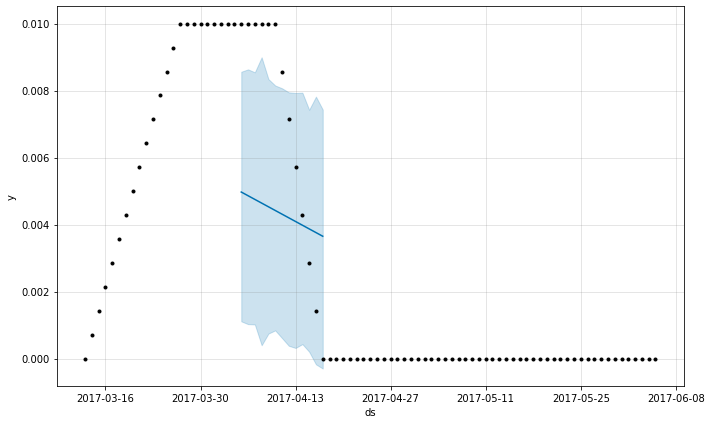

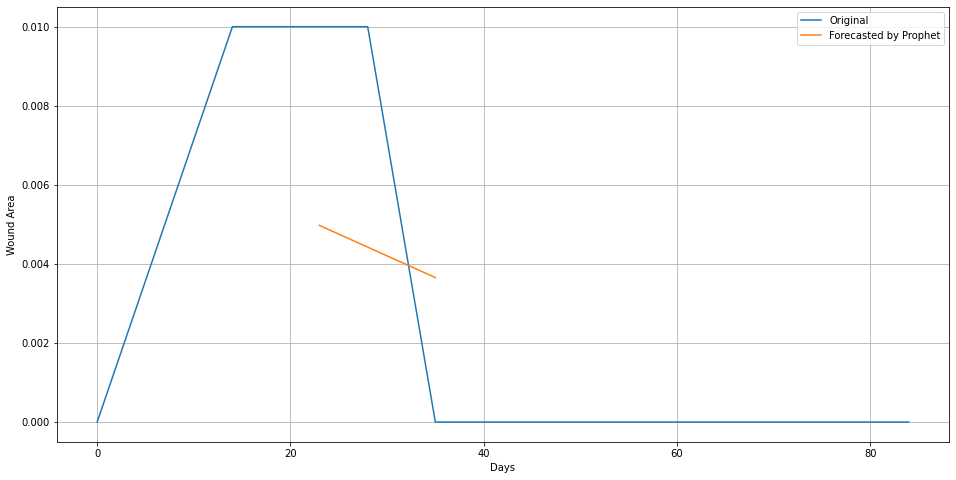

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 29
27
34

Initial log joint probability = -36.5203
Iteration  1. Log joint probability =    24.3255. Improved by 60.8458.
Iteration  2. Log joint probability =    40.8134. Improved by 16.4879.
Iteration  3. Log joint probability =    42.1728. Improved by 1.35939.
Iteration  4. Log joint probability =     42.409. Improved by 0.236154.
Iteration  5. Log joint probability =    42.4287. Improved by 0.0197454.
Iteration  6. Log joint probability =    42.4513. Improved by 0.0225798.
Iteration  7. Log joint probability =    42.5198. Improved by 0.0685451.
Iteration  8. Log joint probability =    42.5776. Improved by 0.0577958.
Iteration  9. Log joint probability =    42.6595. Improved by 0.0818264.
Iteration 10. Log joint probability =    42.6801. Improved by 0.0206261.
Iteration 11. Log joint probability =    42.8424. Improved by 0.162303.
Iteration 12. Log joint probability =    42.8937. Improved by 0.0513087.
Iteration 13. Log joint probability =    42.9157. Improved by 0.0219764.
I

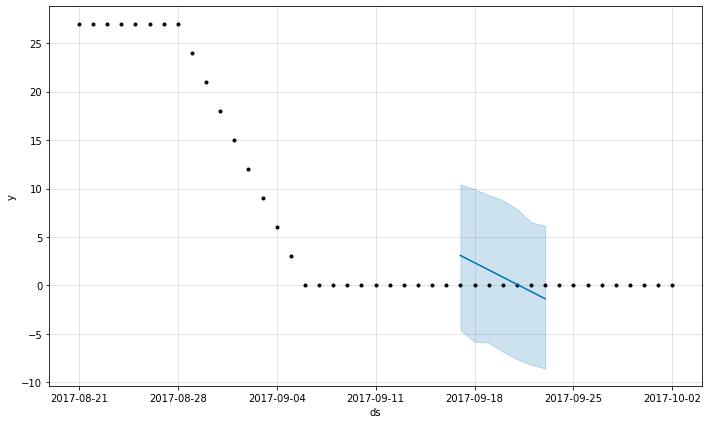

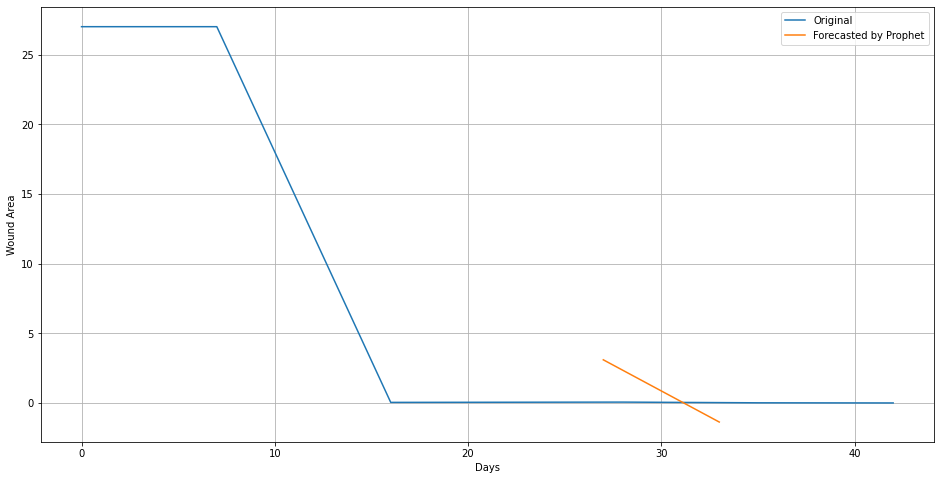

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 30
26
37

Initial log joint probability = -63.1566
Iteration  1. Log joint probability =    44.9737. Improved by 108.13.
Iteration  2. Log joint probability =    66.7951. Improved by 21.8213.
Iteration  3. Log joint probability =    68.7267. Improved by 1.93164.
Iteration  4. Log joint probability =    68.7411. Improved by 0.0143978.
Iteration  5. Log joint probability =    68.7519. Improved by 0.0108442.
Iteration  6. Log joint probability =    68.7722. Improved by 0.0202426.
Iteration  7. Log joint probability =    68.8227. Improved by 0.050533.
Iteration  8. Log joint probability =     68.863. Improved by 0.0402439.
Iteration  9. Log joint probability =    68.9598. Improved by 0.0968768.
Iteration 10. Log joint probability =    69.0002. Improved by 0.0403811.
Iteration 11. Log joint probability =    69.0178. Improved by 0.0175601.
Iteration 12. Log joint probability =    69.0351. Improved by 0.0173143.
Iteration 13. Log joint probability =    69.0438. Improved by 0.0087537.
I

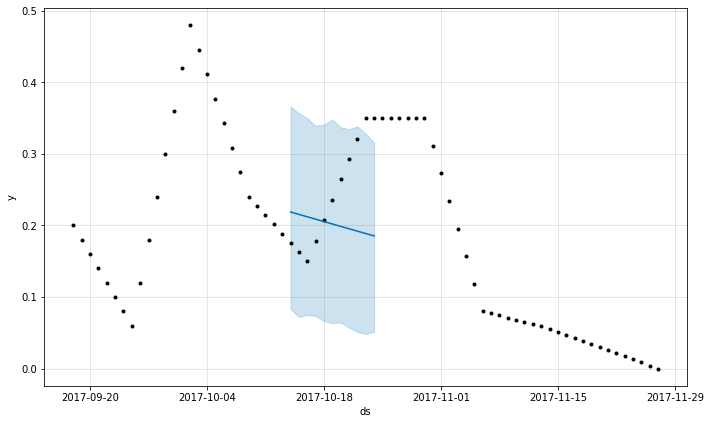

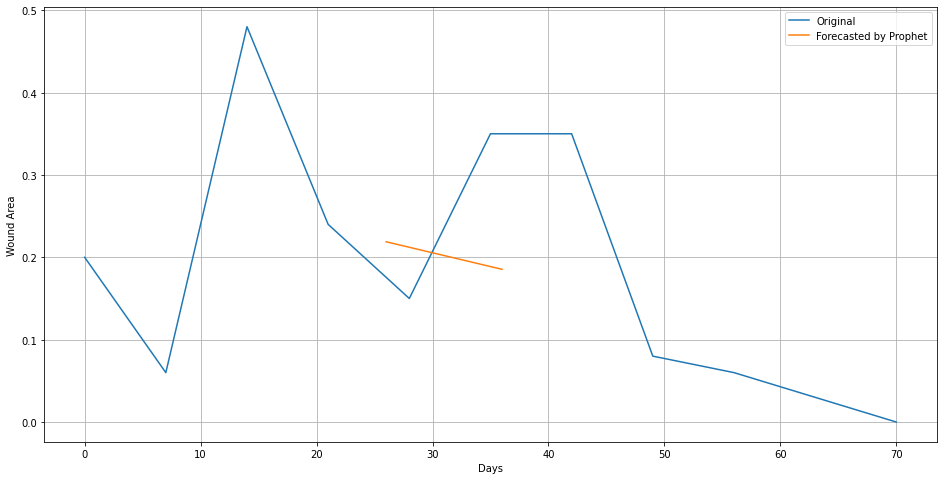

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 31
17
21

Initial log joint probability = -36.953
Iteration  1. Log joint probability =    4.67656. Improved by 41.6296.
Iteration  2. Log joint probability =    20.3142. Improved by 15.6377.
Iteration  3. Log joint probability =    27.8805. Improved by 7.56624.
Iteration  4. Log joint probability =    28.1832. Improved by 0.302786.
Iteration  5. Log joint probability =    28.1933. Improved by 0.0101038.
Iteration  6. Log joint probability =     28.224. Improved by 0.0306686.
Iteration  7. Log joint probability =    28.4894. Improved by 0.26534.
Iteration  8. Log joint probability =      28.63. Improved by 0.140594.
Iteration  9. Log joint probability =    28.6785. Improved by 0.0485001.
Iteration 10. Log joint probability =     28.692. Improved by 0.0135781.
Iteration 11. Log joint probability =    28.6992. Improved by 0.00712998.
Iteration 12. Log joint probability =    28.7042. Improved by 0.00504663.
Iteration 13. Log joint probability =    28.7121. Improved by 0.00794326.
I

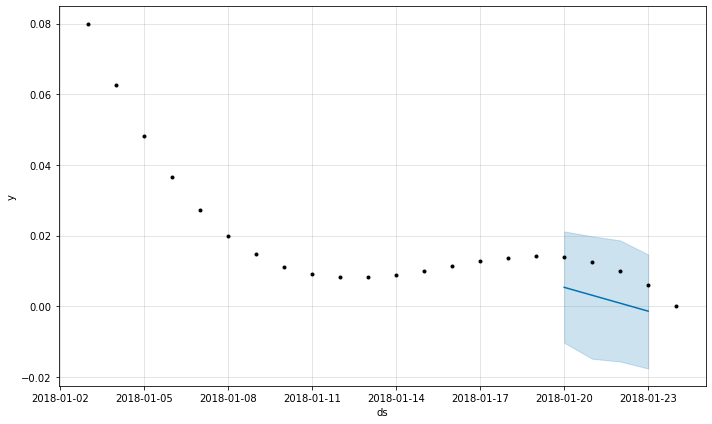

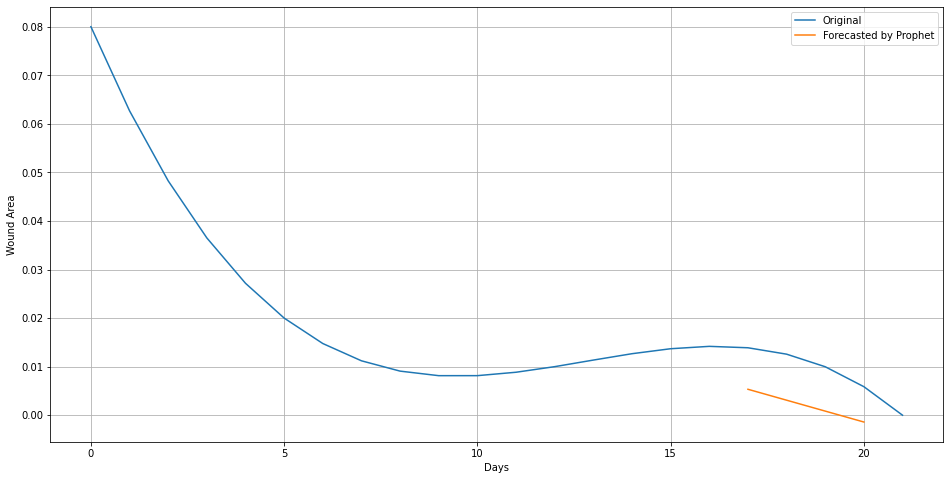

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 32
49
73
Initial log joint probability = -6.12802
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       165.343   4.46937e-06       59.4871           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     124       165.344   5.31072e-06       79.8079   1.018e-07       0.001      203  LS failed, Hessian reset 
     179       165.344   1.03054e-08       59.5108      0.7373      0.7373      280   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


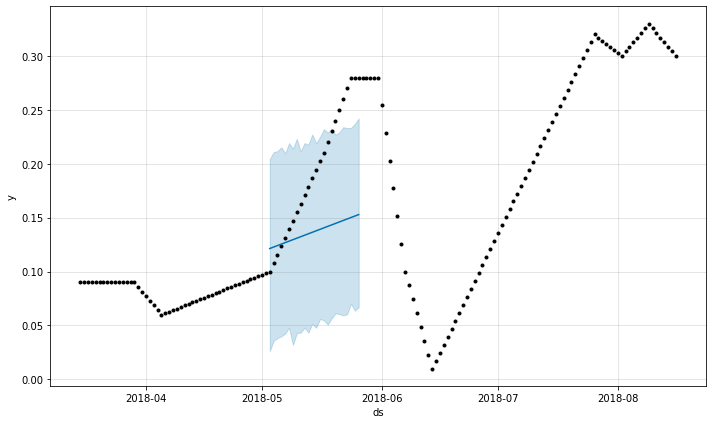

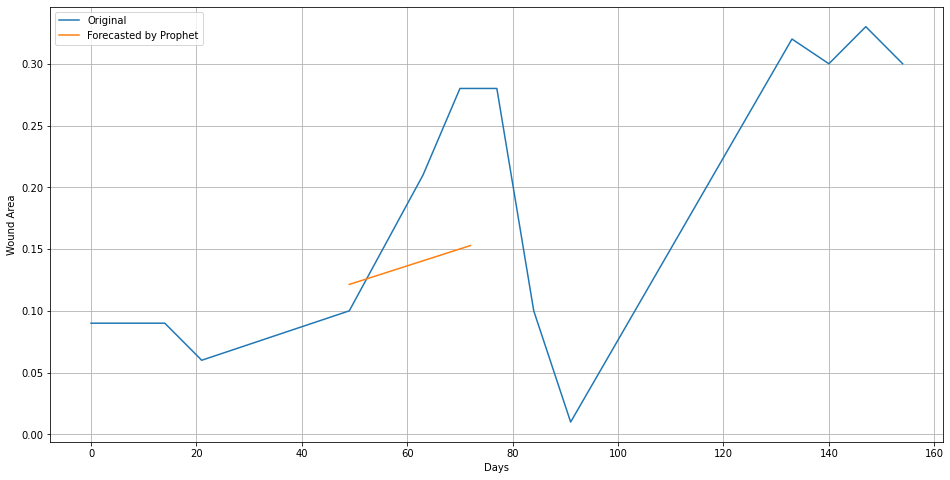

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 33
14
18

Initial log joint probability = -35.9054
Iteration  1. Log joint probability =    20.4296. Improved by 56.3351.
Iteration  2. Log joint probability =    41.2798. Improved by 20.8501.
Iteration  3. Log joint probability =    45.5879. Improved by 4.3081.
Iteration  4. Log joint probability =    48.4792. Improved by 2.8913.
Iteration  5. Log joint probability =    56.9246. Improved by 8.4454.
Iteration  6. Log joint probability =    57.0509. Improved by 0.126367.
Iteration  7. Log joint probability =    57.0815. Improved by 0.0305923.
Iteration  8. Log joint probability =    57.1811. Improved by 0.099561.
Iteration  9. Log joint probability =    57.3761. Improved by 0.195034.
Iteration 10. Log joint probability =     57.396. Improved by 0.0198817.
Iteration 11. Log joint probability =    57.6084. Improved by 0.212386.
Iteration 12. Log joint probability =    57.7634. Improved by 0.155036.
Iteration 13. Log joint probability =    57.8127. Improved by 0.049288.
Iteration 14

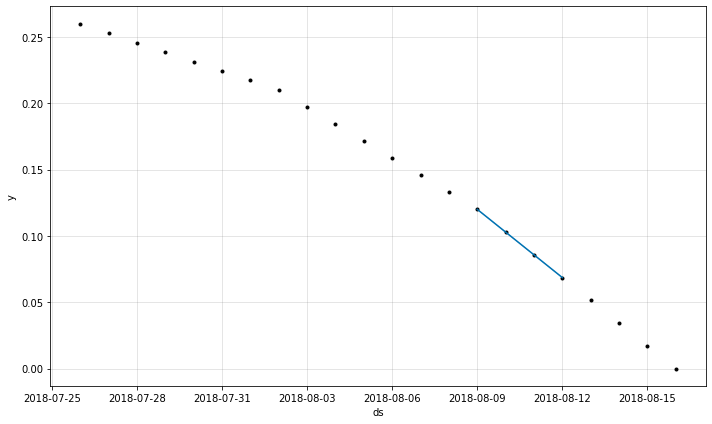

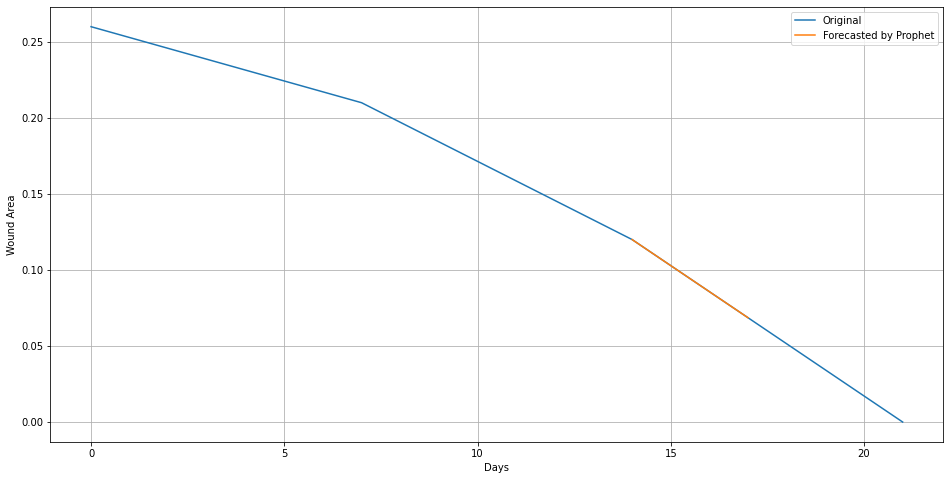

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 34
162
236
Initial log joint probability = -50.1152
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       849.415   0.000828555       56.3437      0.4173     0.04173      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       849.982   0.000955703       94.6148   1.954e-05       0.001      233  LS failed, Hessian reset 
     199       851.405    0.00014423        73.627      0.2191           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        851.71     0.0018569       69.1786      0.5873      0.5873      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     322       851.905    0.00134685       66.0741   2.027e-05       0.001      550  LS failed, Hessian reset 
     385       852.266   4.71266e-06       74.2923    1.05e-07       0.001      659  LS fa

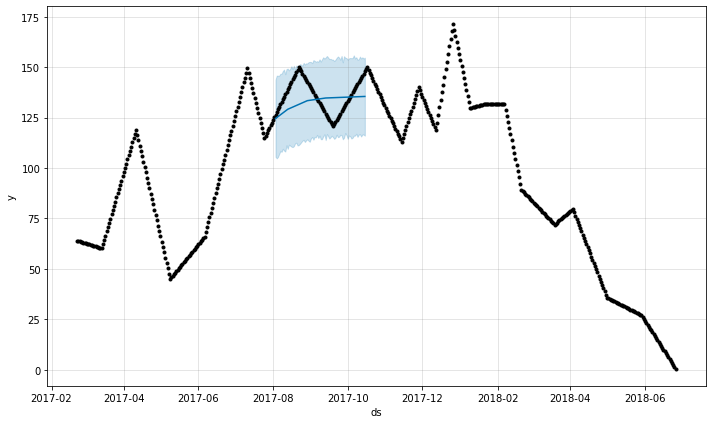

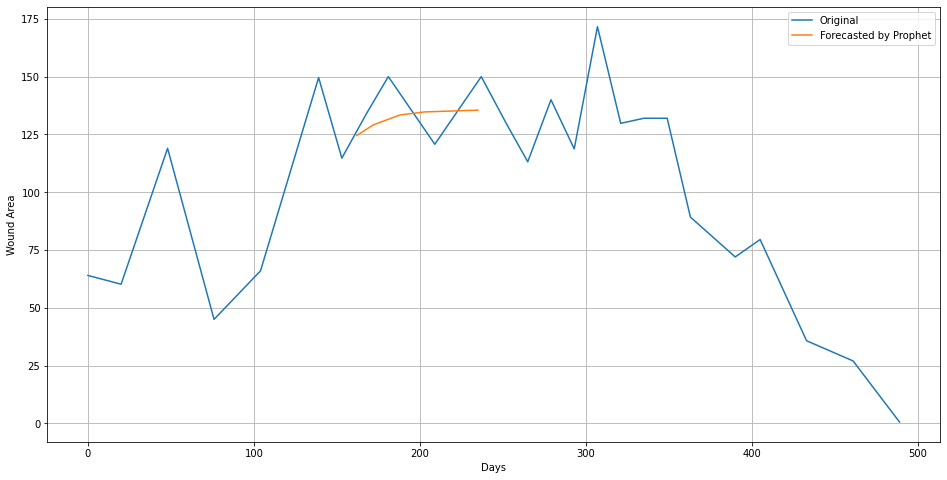

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 35
60
77
Initial log joint probability = -11.0869
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       123.026     0.0101135       82.5875           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       129.051    0.00721893       86.6729   6.763e-05       0.001      201  LS failed, Hessian reset 
     199       135.014     0.0333436       88.1702      0.5421      0.5421      290   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       137.315     0.0176688       95.1265   0.0002031       0.001      334  LS failed, Hessian reset 
     299       140.001    0.00376216       68.8715      0.4861      0.4861      452   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        142.14   6.06714e-05       70.6024      0.5376      0.1623      585   
    I

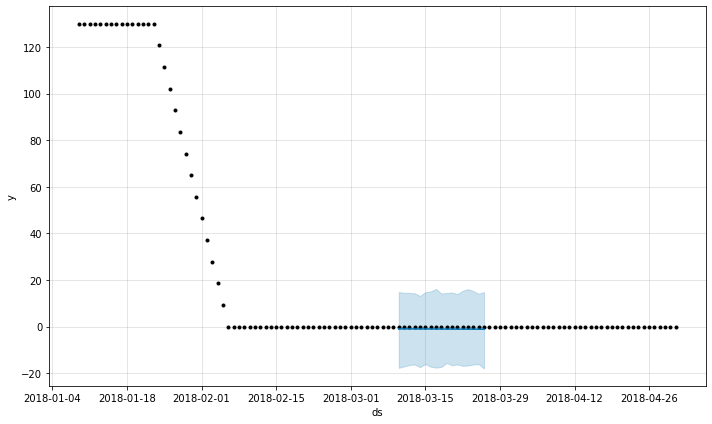

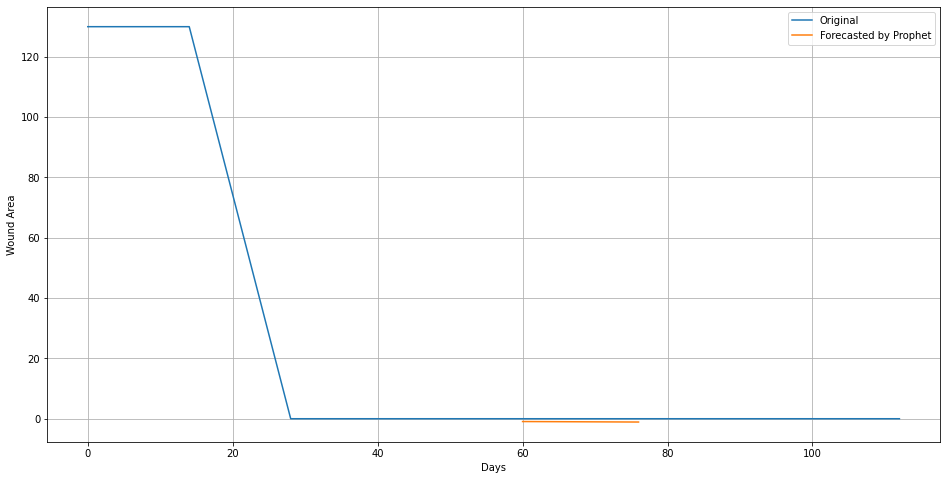

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 36
6
11

Initial log joint probability = -28.4857
Iteration  1. Log joint probability =    12.5759. Improved by 41.0616.
Iteration  2. Log joint probability =    62.2706. Improved by 49.6947.
Iteration  3. Log joint probability =    75.3175. Improved by 13.0469.
Iteration  4. Log joint probability =    76.5286. Improved by 1.21108.
Iteration  5. Log joint probability =    79.1948. Improved by 2.66627.
Iteration  6. Log joint probability =    79.2498. Improved by 0.0549175.
Iteration  7. Log joint probability =    79.2855. Improved by 0.035749.
Iteration  8. Log joint probability =    79.3929. Improved by 0.107404.
Iteration  9. Log joint probability =    79.4548. Improved by 0.0618948.
Iteration 10. Log joint probability =    79.5366. Improved by 0.0817985.
Iteration 11. Log joint probability =    79.6255. Improved by 0.0888946.
Iteration 12. Log joint probability =    79.7208. Improved by 0.0953104.
Iteration 13. Log joint probability =    79.8117. Improved by 0.0908829.
Iterat

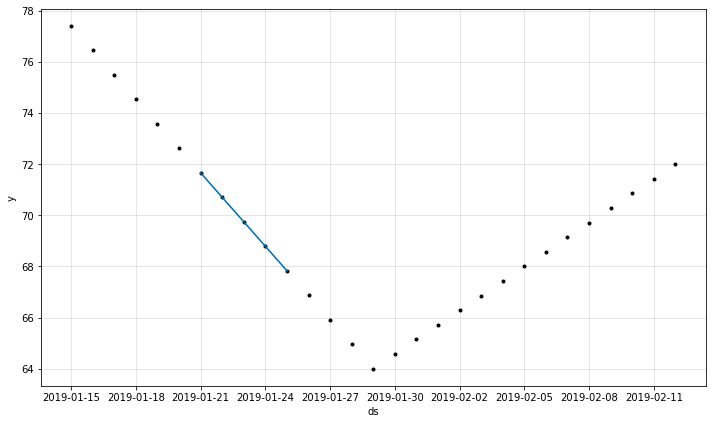

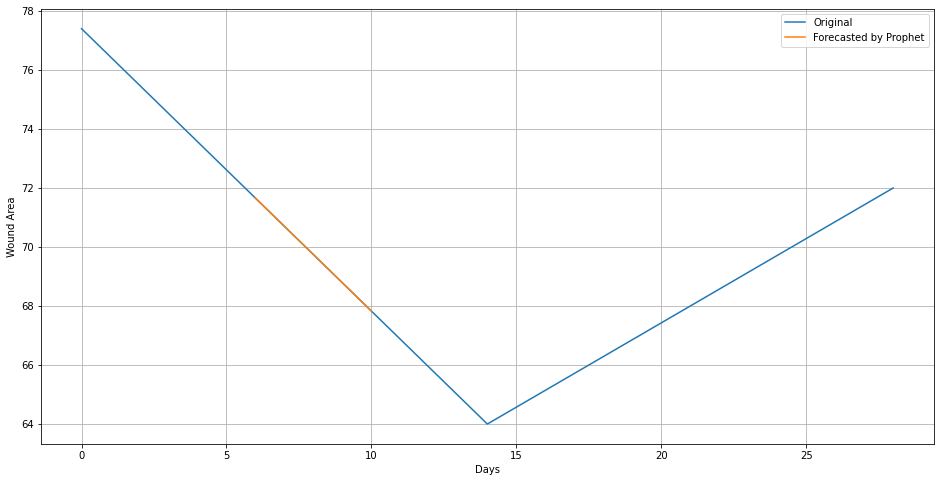

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 37
110
135
Initial log joint probability = -14.521
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       514.602    0.00698356       144.554           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        554.12     0.0281705       796.909           1           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       570.335     0.0016379       126.201           1           1      381   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     353       580.064   6.50595e-05       154.868   2.386e-07       0.001      511  LS failed, Hessian reset 
     399       583.448    0.00102704       483.608      0.1642      0.5655      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       591.786 

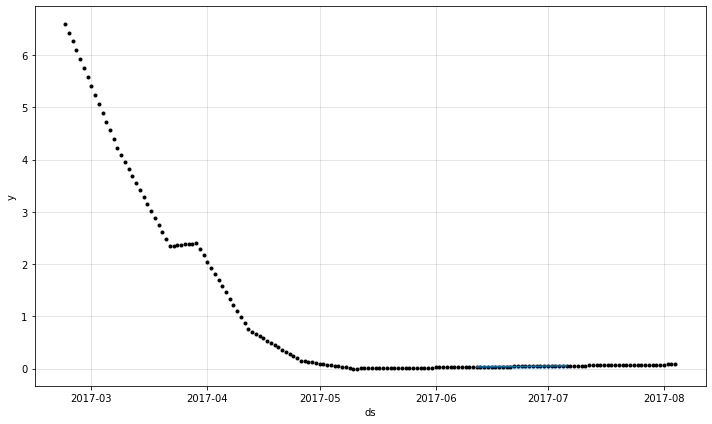

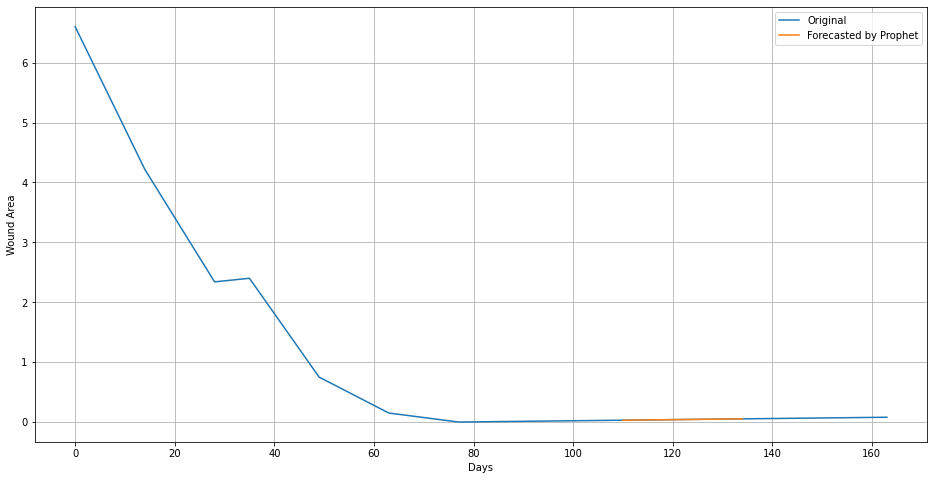

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 38
18
36
Initial log joint probability = -3.83204
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       218.522      0.189939       115.272      0.5028           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185        222.22   0.000395447       68.4919   5.284e-06       0.001      279  LS failed, Hessian reset 
     199       222.237    3.3642e-05       76.2435      0.1344      0.7903      298   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     261       222.303   0.000218426        70.936   2.976e-06       0.001      414  LS failed, Hessian reset 
     299       222.327   5.49248e-05       67.9721      0.7846      0.7846      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       222.328   2.96696e-05       56.9456   3.948e-07       0.001      508  LS fail

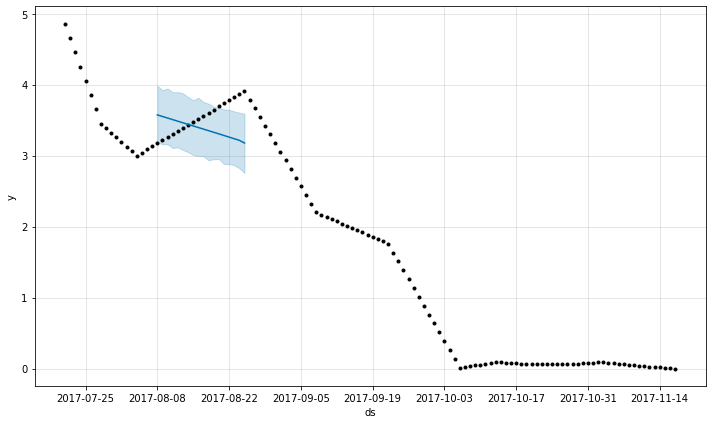

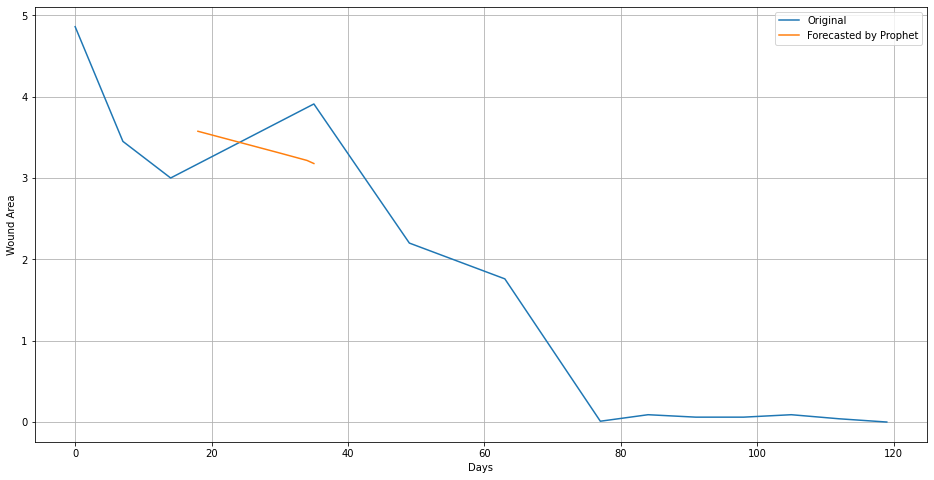

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 39
28
51
Initial log joint probability = -4.37717
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       215.659   0.000520977       78.0767   6.277e-06       0.001      167  LS failed, Hessian reset 
      99        215.74    6.3253e-05       68.4691     0.05691           1      180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       215.855   3.15984e-05       72.0261           1           1      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       215.871   0.000162047       58.0815      0.5428      0.5428      428   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       215.896   2.08212e-07       74.6376      0.1208      0.5856      569   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       215.908  

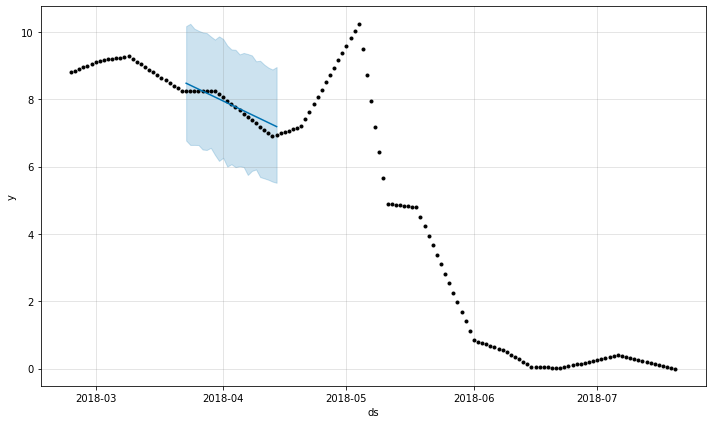

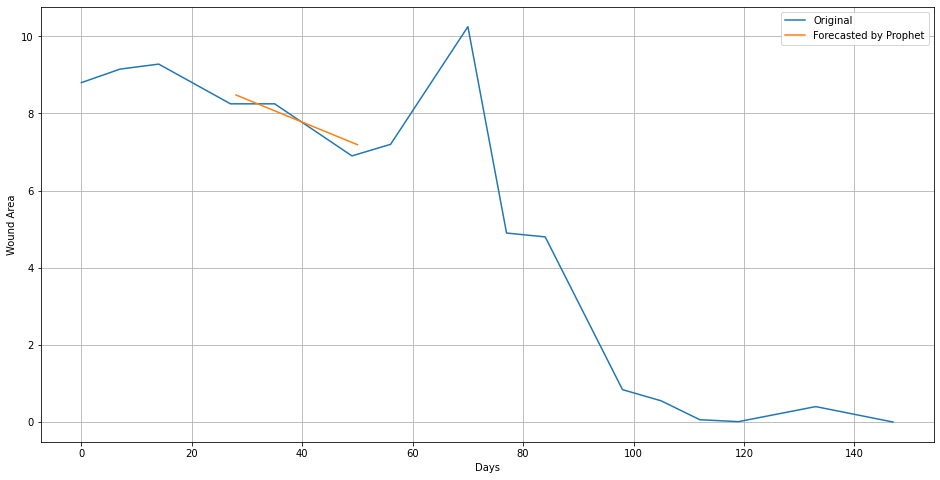

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 40
13
20

Initial log joint probability = -34.9391
Iteration  1. Log joint probability =    38.0585. Improved by 72.9975.
Iteration  2. Log joint probability =    66.8981. Improved by 28.8397.
Iteration  3. Log joint probability =    68.9151. Improved by 2.01698.
Iteration  4. Log joint probability =    68.9633. Improved by 0.0481446.
Iteration  5. Log joint probability =    69.0357. Improved by 0.0724485.
Iteration  6. Log joint probability =    69.0676. Improved by 0.0319329.
Iteration  7. Log joint probability =    69.1662. Improved by 0.0985842.
Iteration  8. Log joint probability =    69.2702. Improved by 0.103984.
Iteration  9. Log joint probability =     69.433. Improved by 0.162822.
Iteration 10. Log joint probability =    69.6006. Improved by 0.167593.
Iteration 11. Log joint probability =    69.6164. Improved by 0.0157557.
Iteration 12. Log joint probability =     69.624. Improved by 0.00760801.
Iteration 13. Log joint probability =       69.7. Improved by 0.0759778.
I

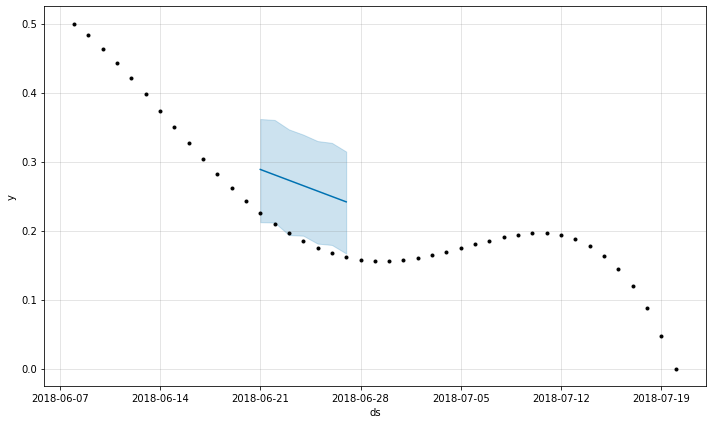

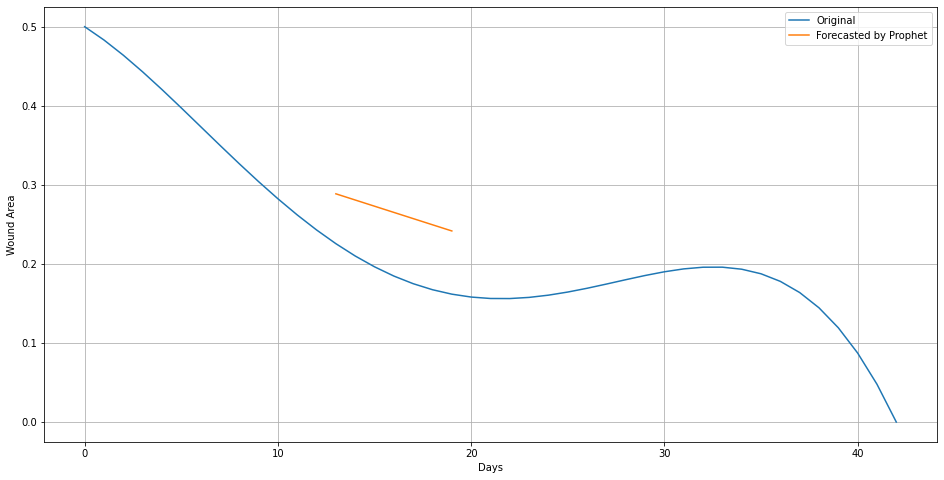

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 41
6
9

Initial log joint probability = -41.4607
Iteration  1. Log joint probability =    8.12103. Improved by 49.5817.
Iteration  2. Log joint probability =    16.3215. Improved by 8.20043.
Iteration  3. Log joint probability =    20.1243. Improved by 3.80287.
Iteration  4. Log joint probability =    20.4095. Improved by 0.285142.
Iteration  5. Log joint probability =    20.4273. Improved by 0.017835.
Iteration  6. Log joint probability =    20.4372. Improved by 0.0098423.
Iteration  7. Log joint probability =    20.4393. Improved by 0.00217997.
Iteration  8. Log joint probability =    20.4454. Improved by 0.00605459.
Iteration  9. Log joint probability =    20.4472. Improved by 0.00176895.
Iteration 10. Log joint probability =    20.4483. Improved by 0.00114189.
Iteration 11. Log joint probability =    20.4516. Improved by 0.00332938.
Iteration 12. Log joint probability =     20.453. Improved by 0.00137645.
Iteration 13. Log joint probability =    20.4549. Improved by 0.001882

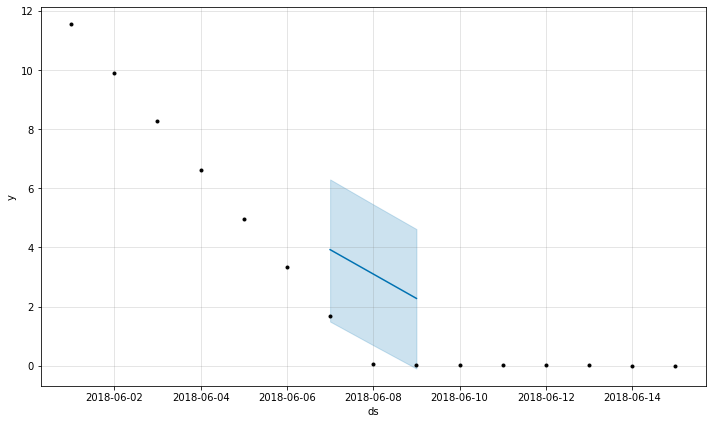

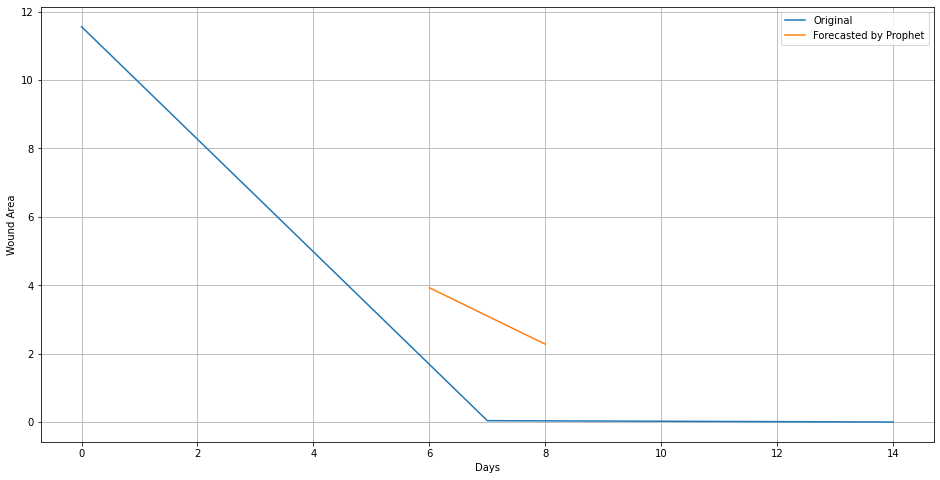

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 42
3
11

Initial log joint probability = -39.0123
Iteration  1. Log joint probability =    67.4141. Improved by 106.426.
Iteration  2. Log joint probability =    97.3563. Improved by 29.9422.
Iteration  3. Log joint probability =    100.284. Improved by 2.92724.
Iteration  4. Log joint probability =    159.803. Improved by 59.5192.
Iteration  5. Log joint probability =    164.008. Improved by 4.205.
Iteration  6. Log joint probability =    168.524. Improved by 4.51632.
Iteration  7. Log joint probability =    170.633. Improved by 2.10841.
Iteration  8. Log joint probability =    183.854. Improved by 13.2213.
Iteration  9. Log joint probability =     188.08. Improved by 4.22587.
Iteration 10. Log joint probability =    189.379. Improved by 1.29884.
Iteration 11. Log joint probability =    190.774. Improved by 1.39572.
Iteration 12. Log joint probability =    192.884. Improved by 2.11011.
Iteration 13. Log joint probability =    193.416. Improved by 0.53185.
Iteration 14. Log join

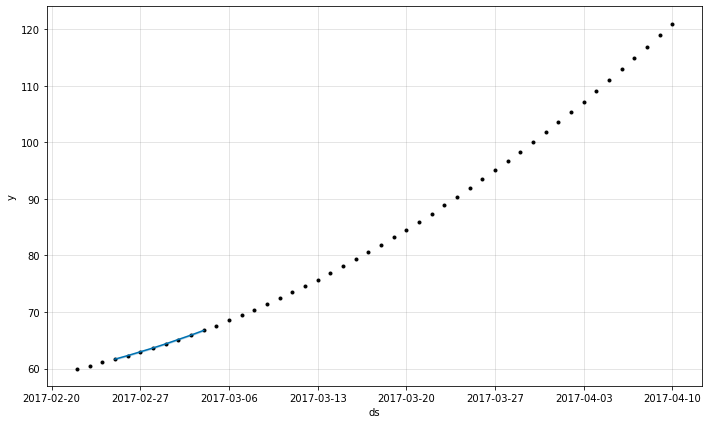

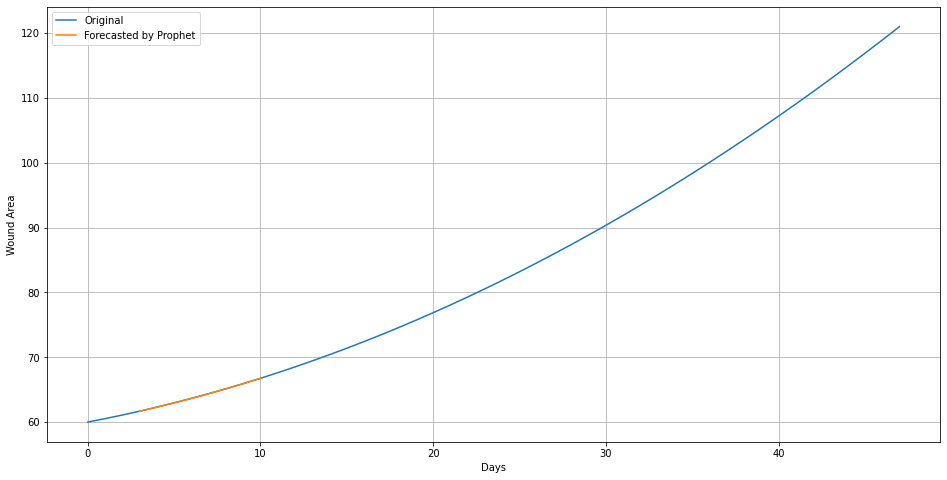

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 43
41
50

Initial log joint probability = -49.2036
Iteration  1. Log joint probability =    90.7682. Improved by 139.972.
Iteration  2. Log joint probability =    125.212. Improved by 34.4442.
Iteration  3. Log joint probability =    134.886. Improved by 9.6734.
Iteration  4. Log joint probability =    135.275. Improved by 0.389437.
Iteration  5. Log joint probability =    135.567. Improved by 0.291751.
Iteration  6. Log joint probability =    135.631. Improved by 0.0636796.
Iteration  7. Log joint probability =    135.892. Improved by 0.261169.
Iteration  8. Log joint probability =    135.923. Improved by 0.0313672.
Iteration  9. Log joint probability =    135.929. Improved by 0.00579892.
Iteration 10. Log joint probability =    136.051. Improved by 0.121844.
Iteration 11. Log joint probability =    136.132. Improved by 0.0808289.
Iteration 12. Log joint probability =    136.171. Improved by 0.0397843.
Iteration 13. Log joint probability =    136.176. Improved by 0.00415566.
It

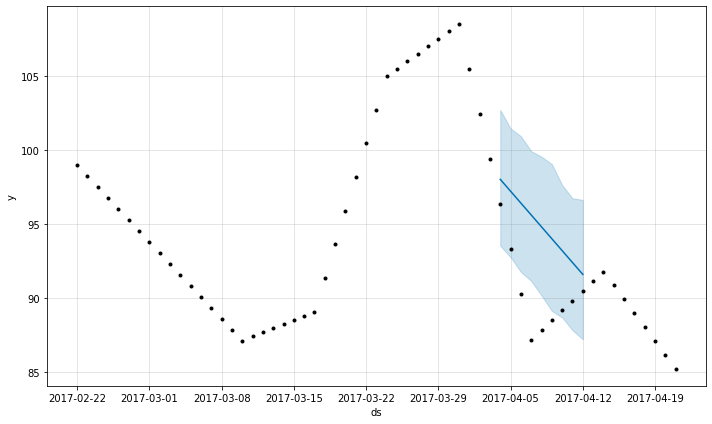

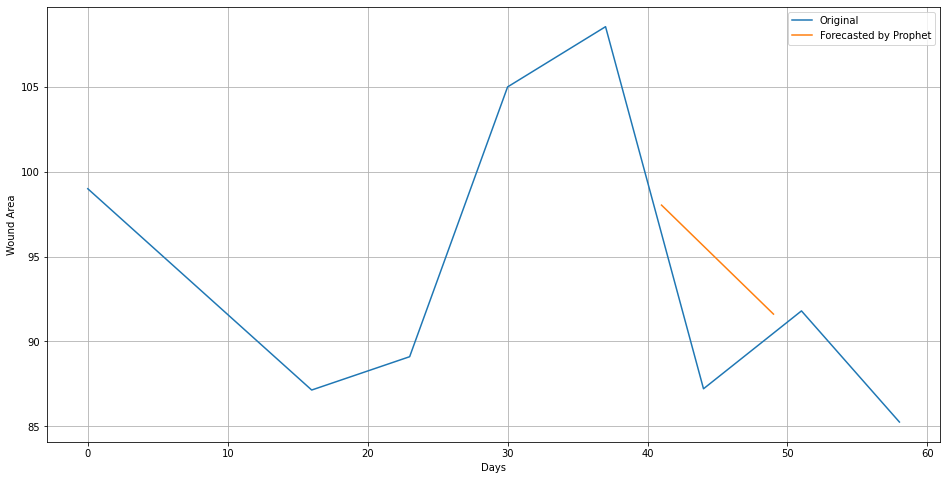

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 44
16
26

Initial log joint probability = -54.9016
Iteration  1. Log joint probability =    48.7594. Improved by 103.661.
Iteration  2. Log joint probability =    90.4185. Improved by 41.6591.
Iteration  3. Log joint probability =    103.815. Improved by 13.3965.
Iteration  4. Log joint probability =    118.522. Improved by 14.707.
Iteration  5. Log joint probability =    118.526. Improved by 0.00437189.
Iteration  6. Log joint probability =     118.74. Improved by 0.214015.
Iteration  7. Log joint probability =    118.886. Improved by 0.145554.
Iteration  8. Log joint probability =     119.01. Improved by 0.124376.
Iteration  9. Log joint probability =    119.085. Improved by 0.0743707.
Iteration 10. Log joint probability =    119.557. Improved by 0.472481.
Iteration 11. Log joint probability =    119.882. Improved by 0.324961.
Iteration 12. Log joint probability =    119.932. Improved by 0.0497365.
Iteration 13. Log joint probability =    120.072. Improved by 0.139827.
Iterati

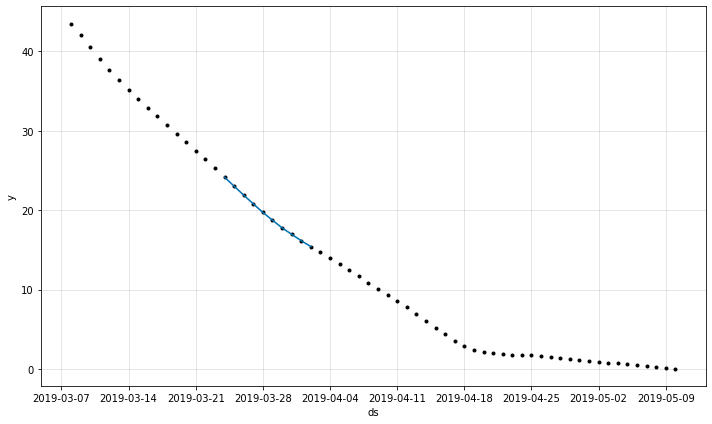

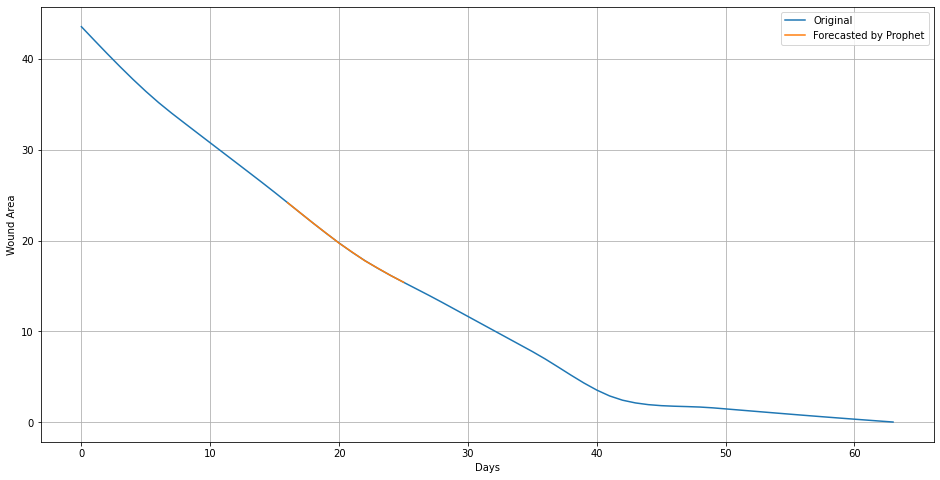

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 45
20
26

Initial log joint probability = -30.2558
Iteration  1. Log joint probability =     22.162. Improved by 52.4178.
Iteration  2. Log joint probability =    42.0328. Improved by 19.8708.
Iteration  3. Log joint probability =    51.2207. Improved by 9.18797.
Iteration  4. Log joint probability =    51.5947. Improved by 0.373932.
Iteration  5. Log joint probability =    51.7134. Improved by 0.11874.
Iteration  6. Log joint probability =    51.7323. Improved by 0.0188903.
Iteration  7. Log joint probability =    51.7934. Improved by 0.0611627.
Iteration  8. Log joint probability =    51.8091. Improved by 0.0156699.
Iteration  9. Log joint probability =    51.8193. Improved by 0.010207.
Iteration 10. Log joint probability =    51.8245. Improved by 0.0052267.
Iteration 11. Log joint probability =    51.8361. Improved by 0.0115188.
Iteration 12. Log joint probability =    51.8371. Improved by 0.000999778.
Iteration 13. Log joint probability =    51.8394. Improved by 0.00236719.


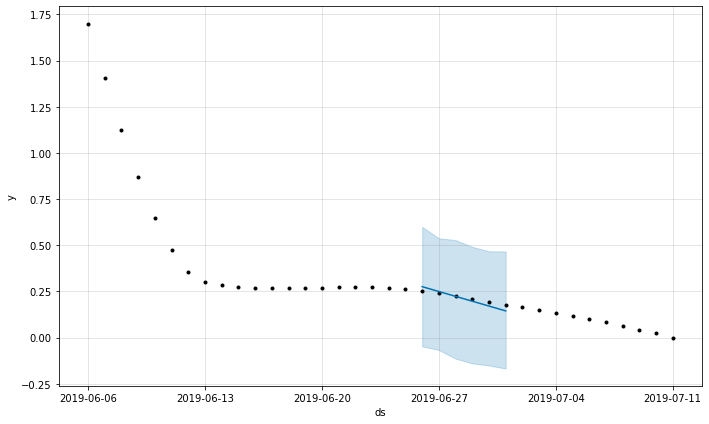

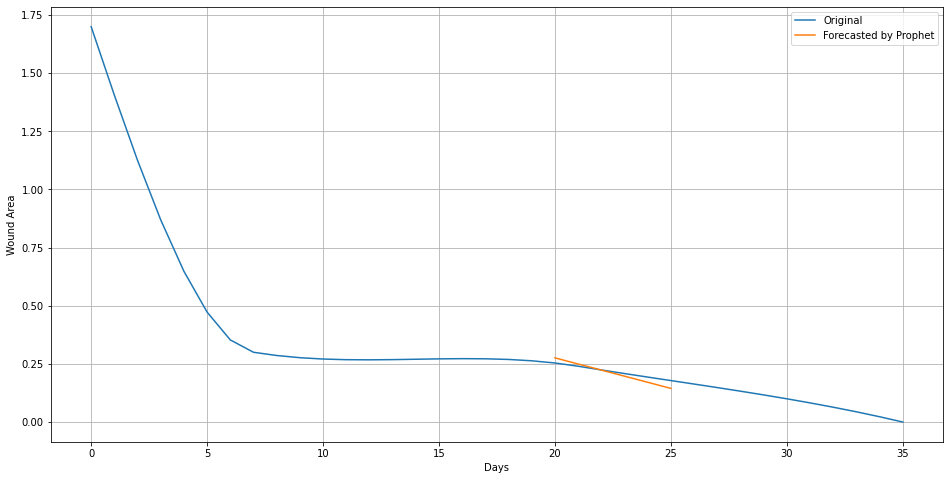

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 46
16
24

Initial log joint probability = -40.842
Iteration  1. Log joint probability =    40.1086. Improved by 80.9505.
Iteration  2. Log joint probability =    69.0957. Improved by 28.9872.
Iteration  3. Log joint probability =    89.5234. Improved by 20.4277.
Iteration  4. Log joint probability =    91.4985. Improved by 1.97514.
Iteration  5. Log joint probability =    92.0924. Improved by 0.593835.
Iteration  6. Log joint probability =    92.1519. Improved by 0.0595253.
Iteration  7. Log joint probability =    92.1809. Improved by 0.028977.
Iteration  8. Log joint probability =    92.1954. Improved by 0.0144941.
Iteration  9. Log joint probability =    92.2499. Improved by 0.0545095.
Iteration 10. Log joint probability =    92.2635. Improved by 0.0136416.
Iteration 11. Log joint probability =    92.3459. Improved by 0.0823343.
Iteration 12. Log joint probability =     92.366. Improved by 0.0201146.
Iteration 13. Log joint probability =    92.3828. Improved by 0.0168026.
Iter

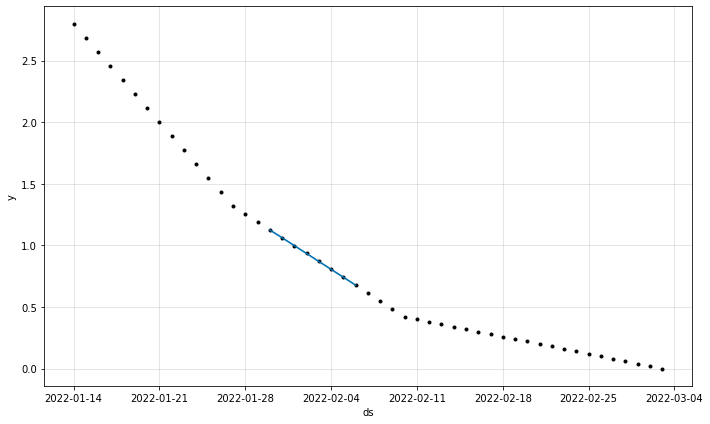

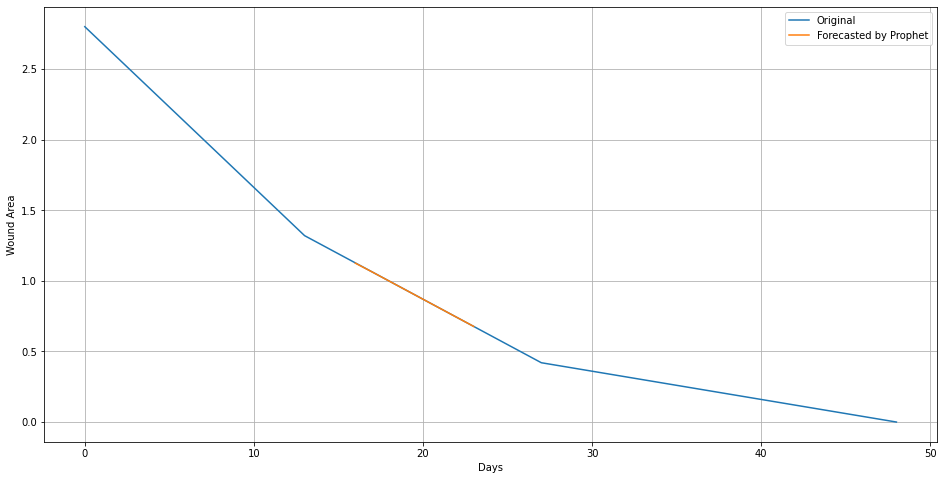

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 47
6
18

Initial log joint probability = -70.1644
Iteration  1. Log joint probability =    49.7947. Improved by 119.959.
Iteration  2. Log joint probability =    63.1517. Improved by 13.357.
Iteration  3. Log joint probability =     107.85. Improved by 44.6985.
Iteration  4. Log joint probability =     111.33. Improved by 3.47973.
Iteration  5. Log joint probability =    111.339. Improved by 0.00892484.
Iteration  6. Log joint probability =     111.34. Improved by 0.000909958.
Iteration  7. Log joint probability =    111.376. Improved by 0.0362657.
Iteration  8. Log joint probability =    111.385. Improved by 0.00906399.
Iteration  9. Log joint probability =    111.417. Improved by 0.0321579.
Iteration 10. Log joint probability =    111.431. Improved by 0.0135797.
Iteration 11. Log joint probability =    111.514. Improved by 0.083428.
Iteration 12. Log joint probability =    111.556. Improved by 0.0417413.
Iteration 13. Log joint probability =    111.577. Improved by 0.0208776.


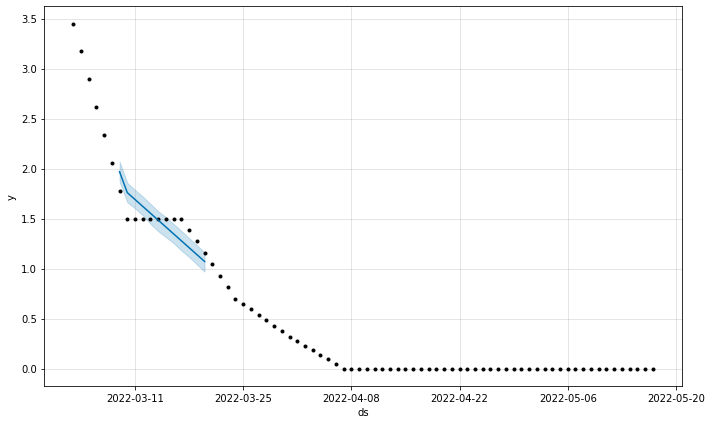

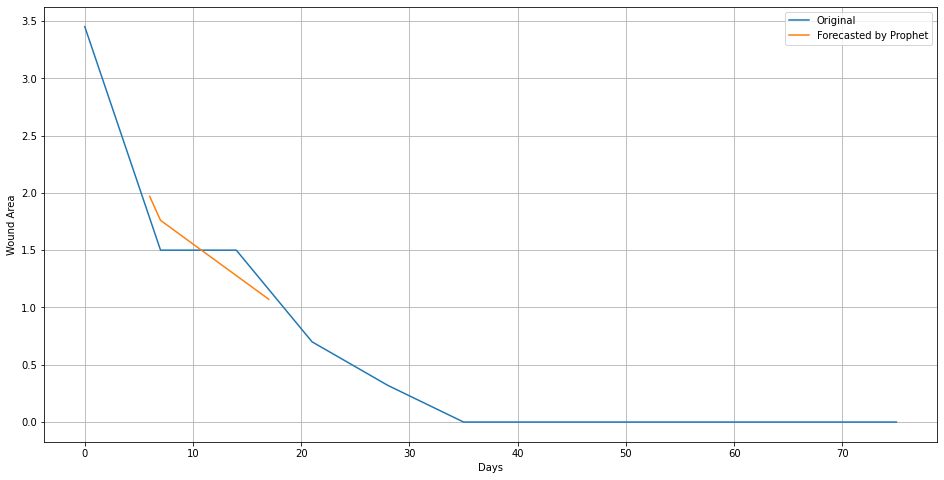

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 48
57
74
Initial log joint probability = -3.81866
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      56        239.98   0.000716798       85.1849   7.871e-06       0.001      110  LS failed, Hessian reset 
      99       240.042   1.66716e-07       88.9598      0.8527      0.8527      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       240.042   2.69497e-09       90.0472      0.1759      0.1759      187   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


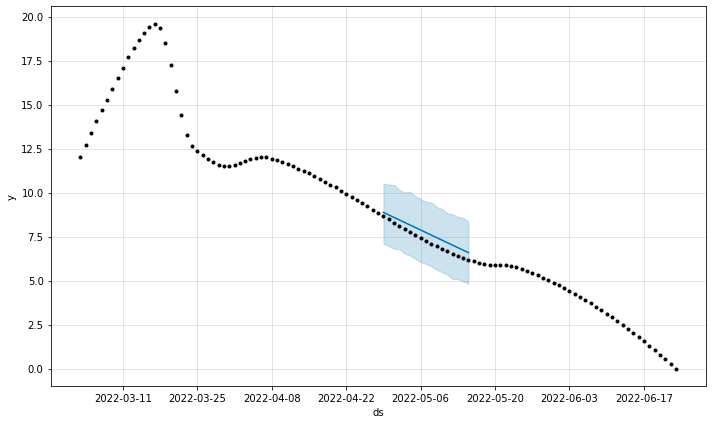

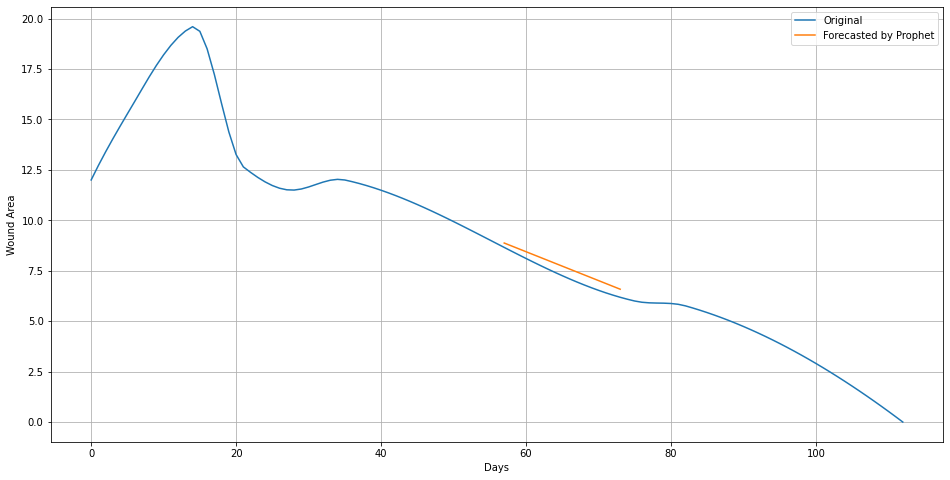

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 49
26
42
Initial log joint probability = -8.98236
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       314.088      0.058238       305.234       4.532           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       332.923   0.000231102       225.832     1.2e-06       0.001      256  LS failed, Hessian reset 
     199       336.938   0.000312758       89.6344      0.4184      0.4184      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       343.536     0.0023842       308.817           1           1      421   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     353       346.643    5.7299e-05       49.4039   3.703e-07       0.001      566  LS failed, Hessian reset 
     387       346.878   9.99156e-05       107.638   4.028e-07       0.001      671  LS fail

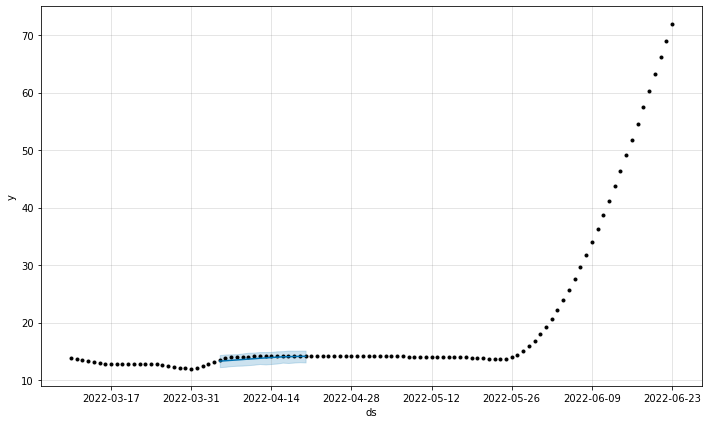

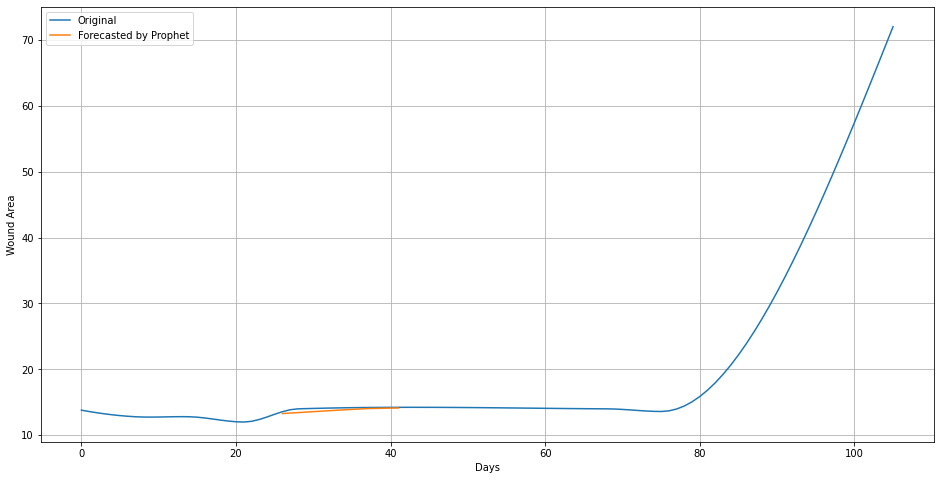

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 50
31
39

Initial log joint probability = -40.9783
Iteration  1. Log joint probability =     54.998. Improved by 95.9763.
Iteration  2. Log joint probability =    94.1945. Improved by 39.1965.
Iteration  3. Log joint probability =    117.466. Improved by 23.2711.
Iteration  4. Log joint probability =    117.494. Improved by 0.0281589.
Iteration  5. Log joint probability =    117.624. Improved by 0.130277.
Iteration  6. Log joint probability =    117.722. Improved by 0.097647.
Iteration  7. Log joint probability =    117.749. Improved by 0.0277065.
Iteration  8. Log joint probability =    117.991. Improved by 0.241762.
Iteration  9. Log joint probability =    118.597. Improved by 0.605352.
Iteration 10. Log joint probability =    118.678. Improved by 0.0815526.
Iteration 11. Log joint probability =    118.934. Improved by 0.256029.
Iteration 12. Log joint probability =    118.995. Improved by 0.0609554.
Iteration 13. Log joint probability =    122.882. Improved by 3.88698.
Iterat

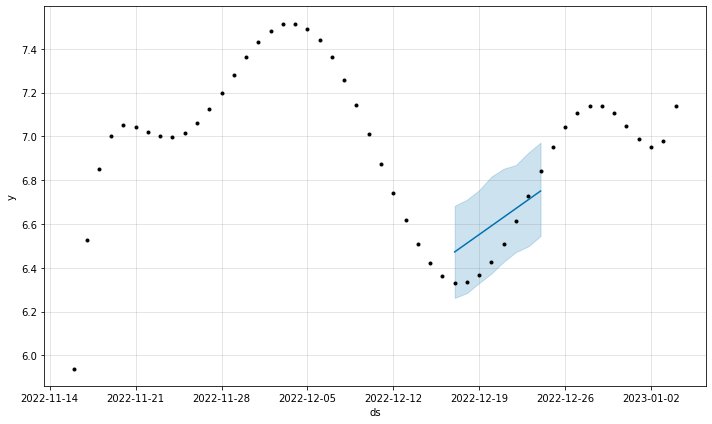

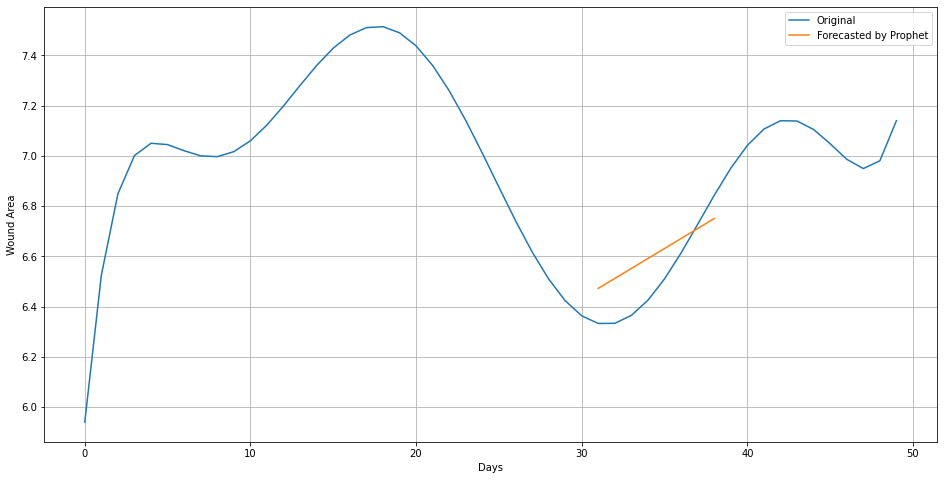

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 51
31
40

Initial log joint probability = -47.9731
Iteration  1. Log joint probability =    62.5537. Improved by 110.527.
Iteration  2. Log joint probability =    77.3854. Improved by 14.8318.
Iteration  3. Log joint probability =    77.6784. Improved by 0.293003.
Iteration  4. Log joint probability =    77.7778. Improved by 0.0993304.
Iteration  5. Log joint probability =    77.8933. Improved by 0.11549.
Iteration  6. Log joint probability =    77.9046. Improved by 0.0112993.
Iteration  7. Log joint probability =    77.9375. Improved by 0.03294.
Iteration  8. Log joint probability =    77.9563. Improved by 0.0187882.
Iteration  9. Log joint probability =    77.9678. Improved by 0.0114975.
Iteration 10. Log joint probability =    77.9733. Improved by 0.00547368.
Iteration 11. Log joint probability =    77.9781. Improved by 0.00487898.
Iteration 12. Log joint probability =    77.9859. Improved by 0.00779681.
Iteration 13. Log joint probability =    77.9874. Improved by 0.00148698

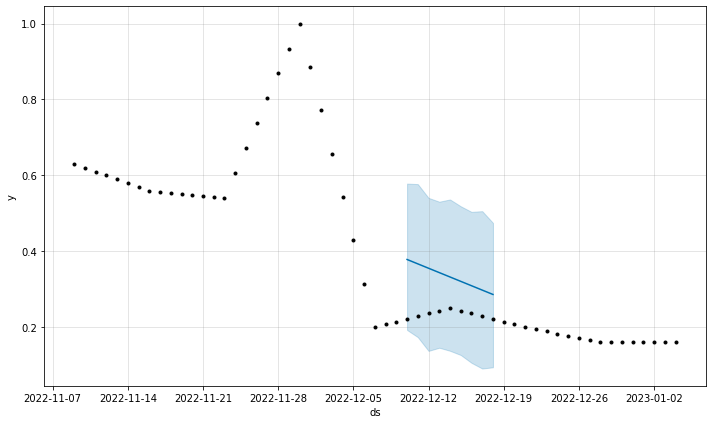

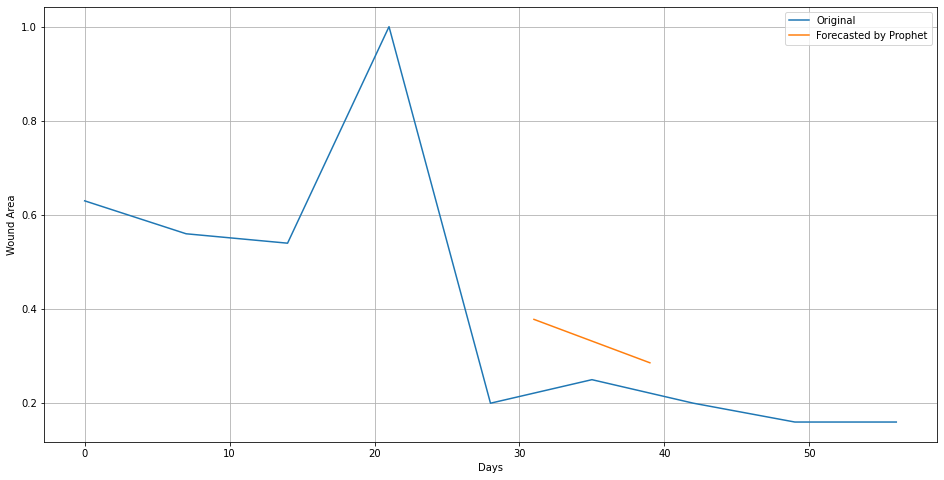

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 52
12
16

Initial log joint probability = -36.9096
Iteration  1. Log joint probability =    2.64986. Improved by 39.5595.
Iteration  2. Log joint probability =    22.2742. Improved by 19.6244.
Iteration  3. Log joint probability =    30.0053. Improved by 7.73108.
Iteration  4. Log joint probability =    30.1289. Improved by 0.123637.
Iteration  5. Log joint probability =    30.1427. Improved by 0.0137672.
Iteration  6. Log joint probability =    30.2024. Improved by 0.059715.
Iteration  7. Log joint probability =    30.2172. Improved by 0.0147647.
Iteration  8. Log joint probability =     30.222. Improved by 0.00482552.
Iteration  9. Log joint probability =    30.2407. Improved by 0.0186702.
Iteration 10. Log joint probability =    30.2598. Improved by 0.0191766.
Iteration 11. Log joint probability =    30.2672. Improved by 0.00739922.
Iteration 12. Log joint probability =    30.2728. Improved by 0.00557728.
Iteration 13. Log joint probability =    30.2775. Improved by 0.0047179

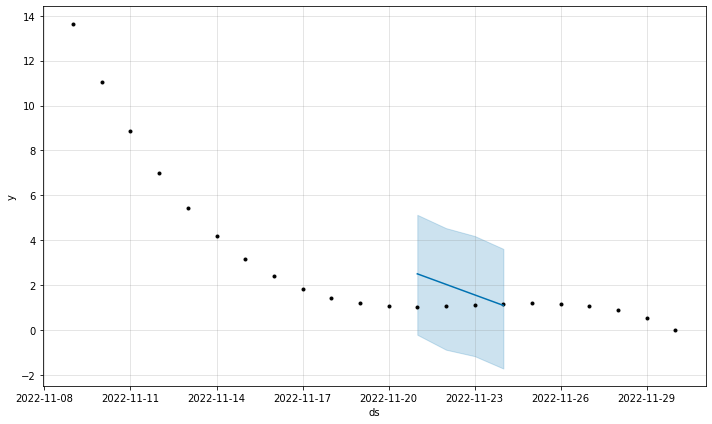

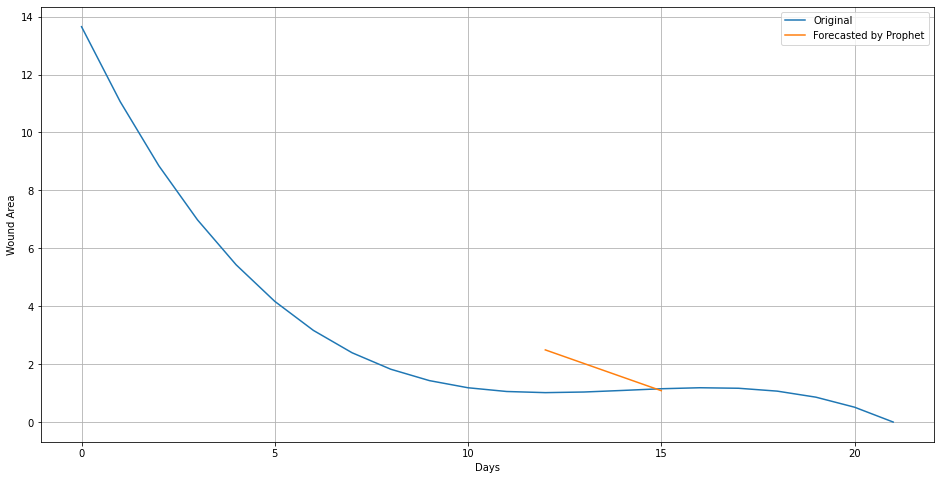

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 53
4
10

Initial log joint probability = -32.279
Iteration  1. Log joint probability =    18.0132. Improved by 50.2922.
Iteration  2. Log joint probability =    21.2912. Improved by 3.27798.
Iteration  3. Log joint probability =    31.0406. Improved by 9.74935.
Iteration  4. Log joint probability =    31.8497. Improved by 0.809116.
Iteration  5. Log joint probability =    31.9182. Improved by 0.068556.
Iteration  6. Log joint probability =    31.9486. Improved by 0.0303531.
Iteration  7. Log joint probability =    32.1649. Improved by 0.216322.
Iteration  8. Log joint probability =      32.19. Improved by 0.0250872.
Iteration  9. Log joint probability =    32.2497. Improved by 0.0597141.
Iteration 10. Log joint probability =    32.3272. Improved by 0.0775285.
Iteration 11. Log joint probability =    32.5364. Improved by 0.209161.
Iteration 12. Log joint probability =    32.6571. Improved by 0.120708.
Iteration 13. Log joint probability =    33.0416. Improved by 0.384499.
Iterati

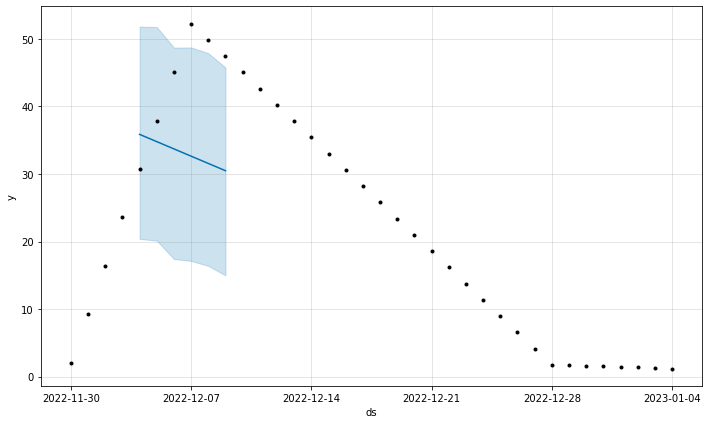

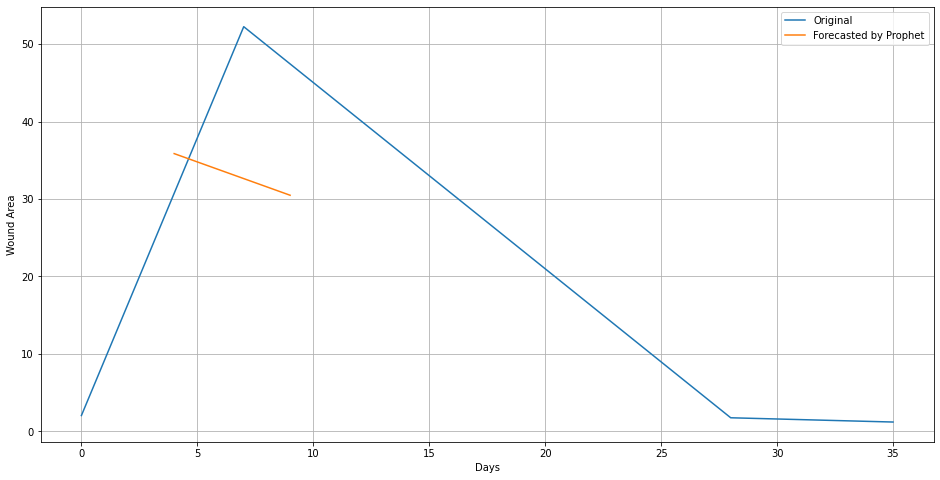

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 54
8
11

Initial log joint probability = -41.0436
Iteration  1. Log joint probability =    12.3819. Improved by 53.4255.
Iteration  2. Log joint probability =    17.1986. Improved by 4.81674.
Iteration  3. Log joint probability =    24.7271. Improved by 7.5285.
Iteration  4. Log joint probability =    28.0421. Improved by 3.31499.
Iteration  5. Log joint probability =    28.8459. Improved by 0.803838.
Iteration  6. Log joint probability =     28.925. Improved by 0.0790816.
Iteration  7. Log joint probability =    28.9559. Improved by 0.0308814.
Iteration  8. Log joint probability =    28.9667. Improved by 0.0107709.
Iteration  9. Log joint probability =    28.9996. Improved by 0.032899.
Iteration 10. Log joint probability =     29.084. Improved by 0.0844415.
Iteration 11. Log joint probability =    29.1474. Improved by 0.0633994.
Iteration 12. Log joint probability =    29.1521. Improved by 0.00463185.
Iteration 13. Log joint probability =    29.1694. Improved by 0.0173077.
Iter

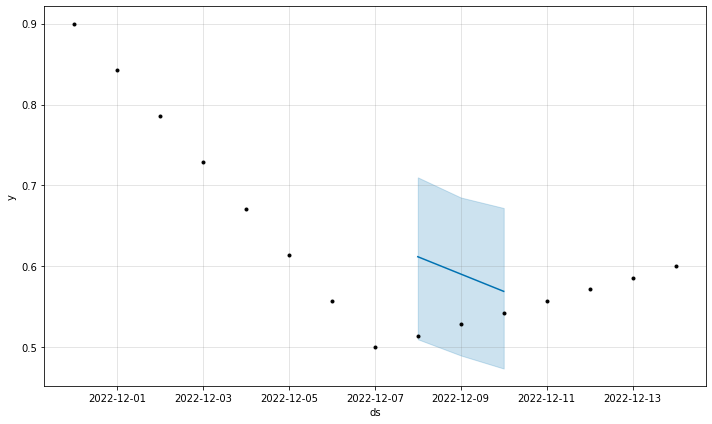

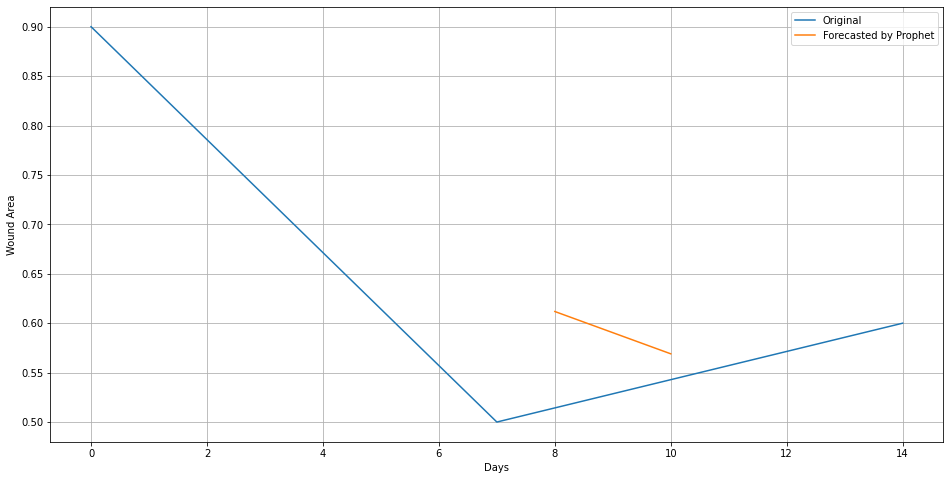

Wound: 55
62
262
Initial log joint probability = -2.13235
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       5789.41     0.0166835       1553.31           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       6152.88   0.000623402       3685.73       0.223      0.9814      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6460.63    0.00122205       7427.59           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       6594.45   0.000659068       1925.03           1           1      477   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       6815.46    0.00191799       20652.6     0.04972           1      597   
    Iter      log prob        ||dx||      ||gra

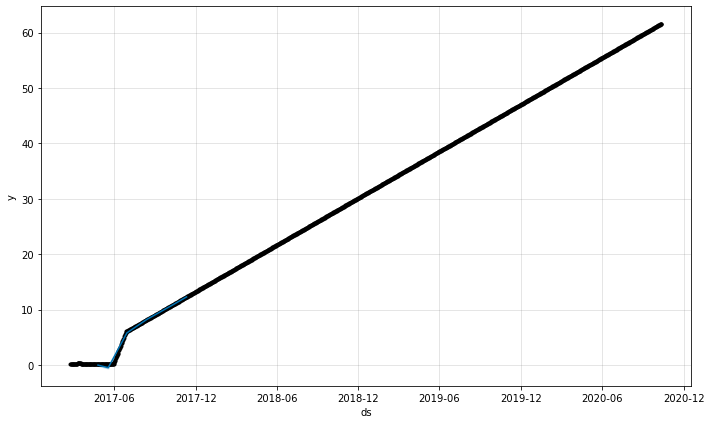

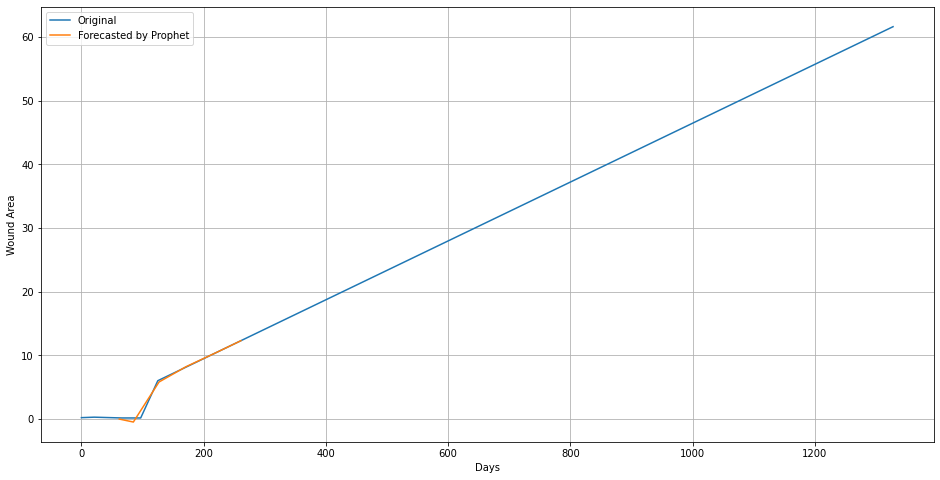

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 56
71
95
Initial log joint probability = -11.4478
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       198.321   0.000834005       77.6616   1.009e-05       0.001      133  LS failed, Hessian reset 
      99       198.362   1.12178e-05       84.8017      0.4447      0.4447      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     104       198.367   3.78683e-05       73.0797   4.424e-07       0.001      197  LS failed, Hessian reset 
     135       198.369   2.71612e-09       68.6753      0.1026      0.1026      243   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


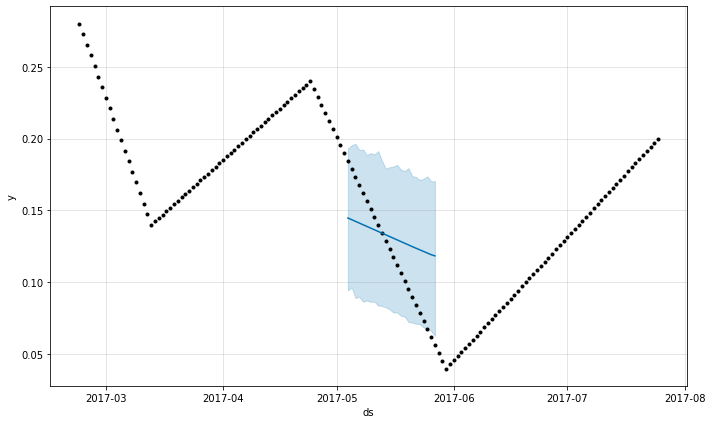

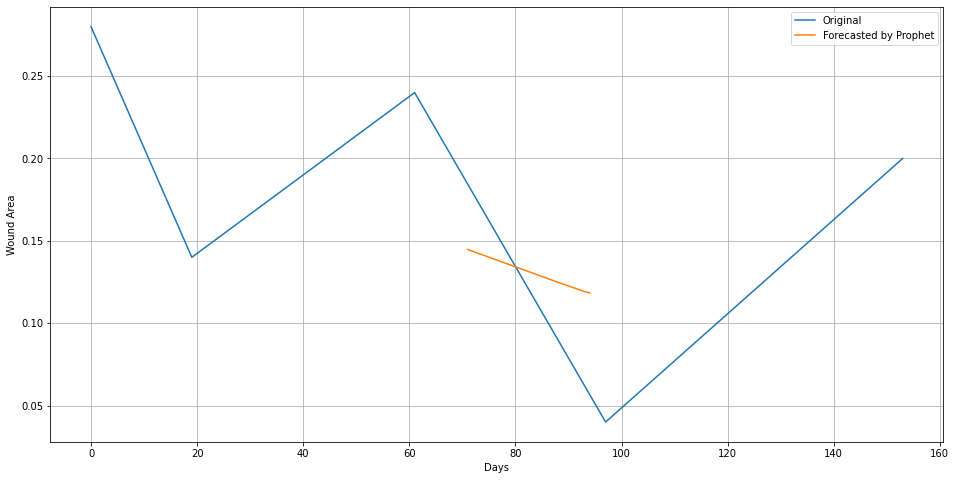

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 57
39
49

Initial log joint probability = -54.9081
Iteration  1. Log joint probability =    41.9748. Improved by 96.8829.
Iteration  2. Log joint probability =    77.6144. Improved by 35.6396.
Iteration  3. Log joint probability =    90.7995. Improved by 13.1851.
Iteration  4. Log joint probability =     91.541. Improved by 0.74149.
Iteration  5. Log joint probability =    91.5534. Improved by 0.0123806.
Iteration  6. Log joint probability =    91.5615. Improved by 0.00806497.
Iteration  7. Log joint probability =    91.5871. Improved by 0.0256736.
Iteration  8. Log joint probability =    91.6102. Improved by 0.0230621.
Iteration  9. Log joint probability =    92.5522. Improved by 0.941951.
Iteration 10. Log joint probability =    92.6719. Improved by 0.119737.
Iteration 11. Log joint probability =    92.6994. Improved by 0.0274669.
Iteration 12. Log joint probability =    92.7295. Improved by 0.0301373.
Iteration 13. Log joint probability =     92.744. Improved by 0.0144673.
It

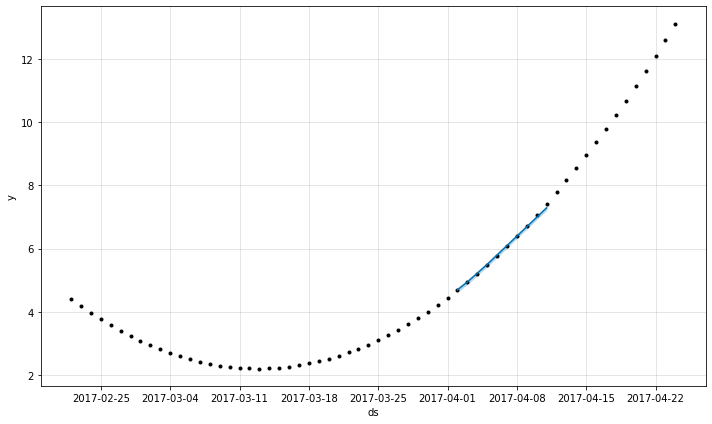

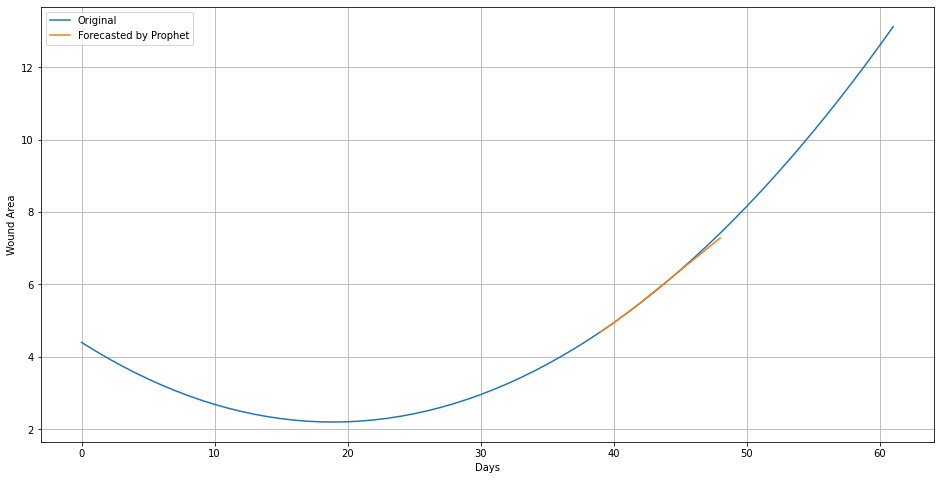

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 58
49
73
Initial log joint probability = -2.67661
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       641.105     0.0226357       689.989           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       743.224     0.0132106       1463.06           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       768.465      0.002697       703.252           1           1      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       793.136     0.0064227       4559.02      0.1705           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       824.939    0.00174392       1617.73     0.03975           1      603   
    Iter      log prob        ||dx||      ||grad

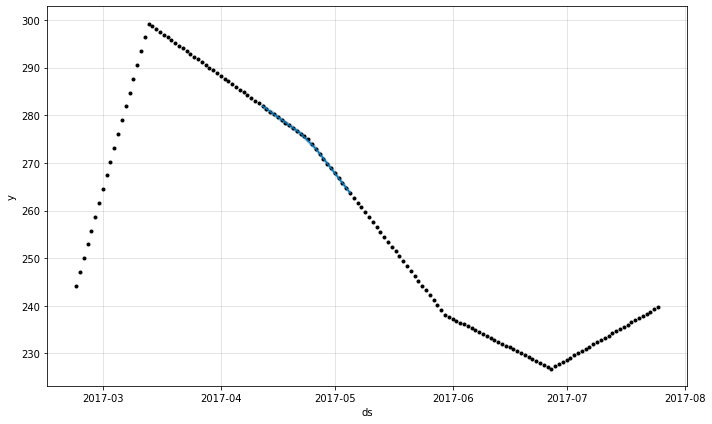

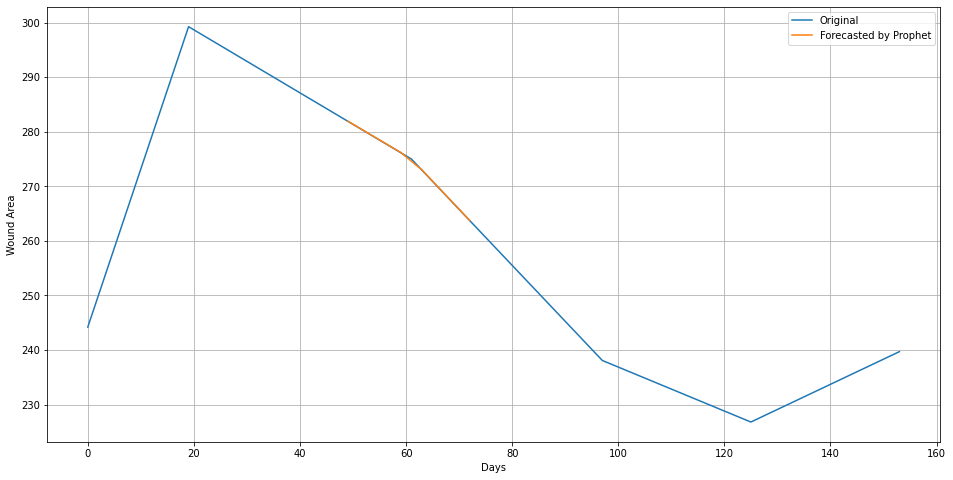

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 59
41
62
Initial log joint probability = -3.99763
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       580.447     0.0085583       625.739           1           1      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       676.569    0.00859027          2357           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       724.002     0.0004224       469.977           1           1      364   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       748.542    0.00512143        2623.1           1           1      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       763.769    0.00234074       729.924           1           1      603   
    Iter      log prob        ||dx||      ||grad

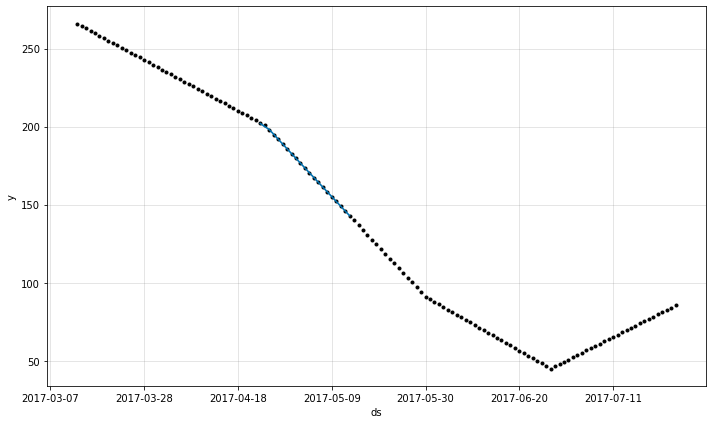

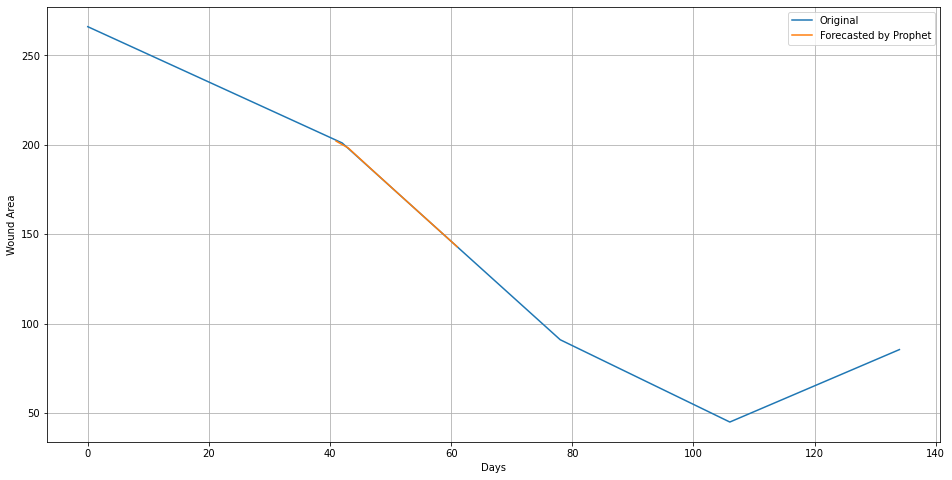

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 60
108
129
Initial log joint probability = -29.1901
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       430.227      0.018129       2157.59       1.762      0.1762      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       507.908    0.00767809       953.236      0.1241           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        548.42    0.00591964       583.135           1           1      384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       573.797    0.00557586       543.975      0.2832           1      502   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       586.016   0.000533009       432.891           1           1      641   
    Iter      log prob        ||dx||      ||gr

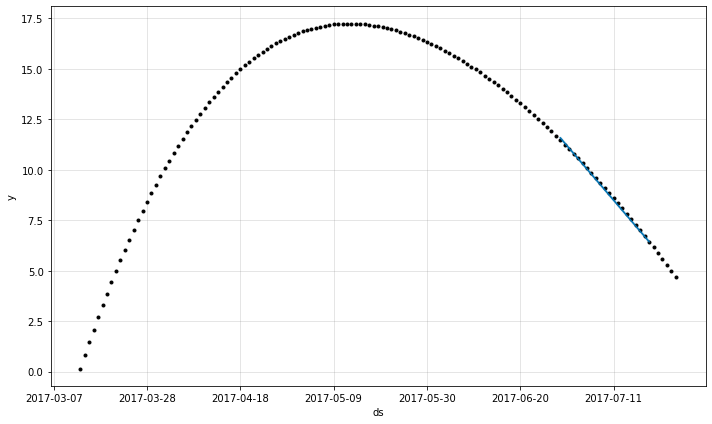

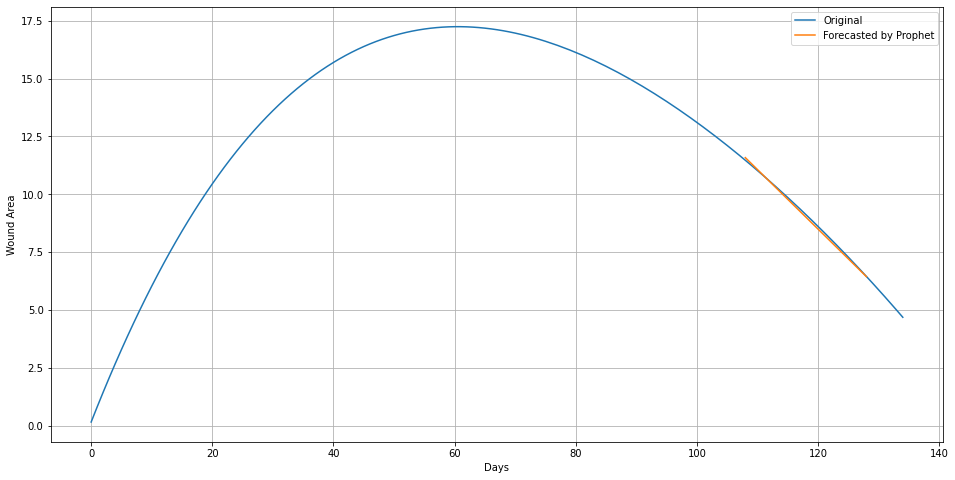

Wound: 61
400
597
Initial log joint probability = -57.0885
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2490.25    0.00638417       171.248      0.4974      0.4974      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       2539.14      0.008119       98.8019           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       2545.16   0.000669571       134.828   1.355e-06       0.001      315  LS failed, Hessian reset 
     299       2571.49      0.158103       724.672      0.2566           1      418   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       2635.86     0.0377534       408.229           1           1      544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       2651.09

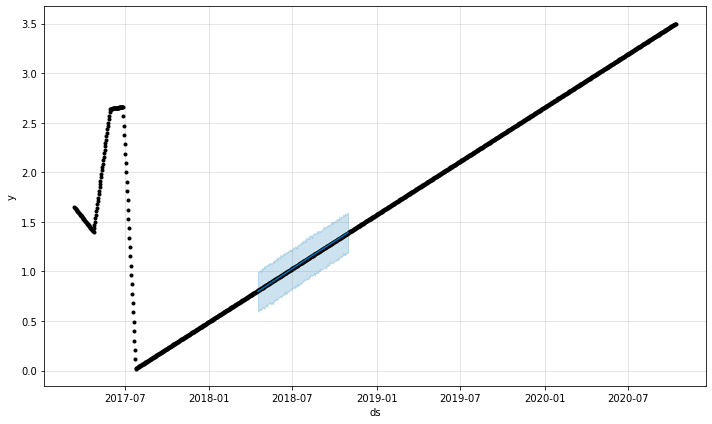

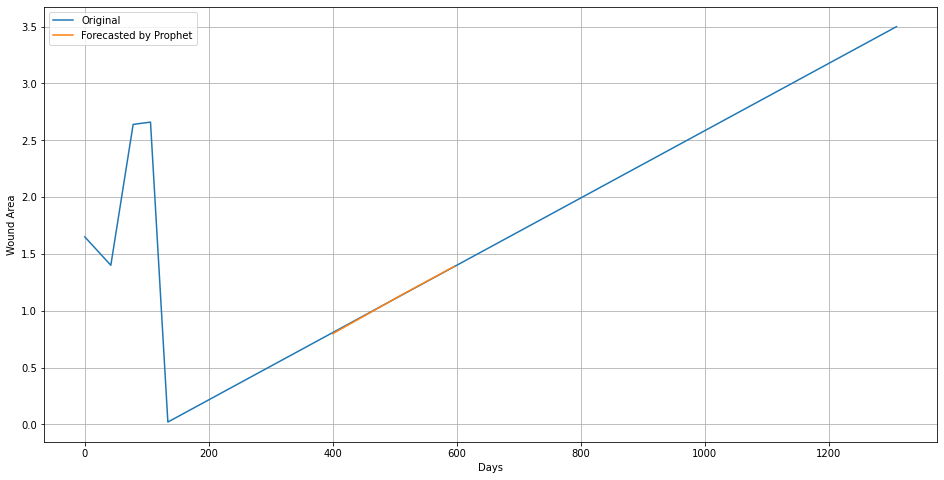

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 62
3
24
Initial log joint probability = -18.444
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       132.751   0.000351364        77.432   4.349e-06       0.001      137  LS failed, Hessian reset 
      99       132.769    1.3384e-06        78.447      0.7149      0.7149      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       132.769   4.38025e-09       71.5005      0.1147      0.1147      181   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


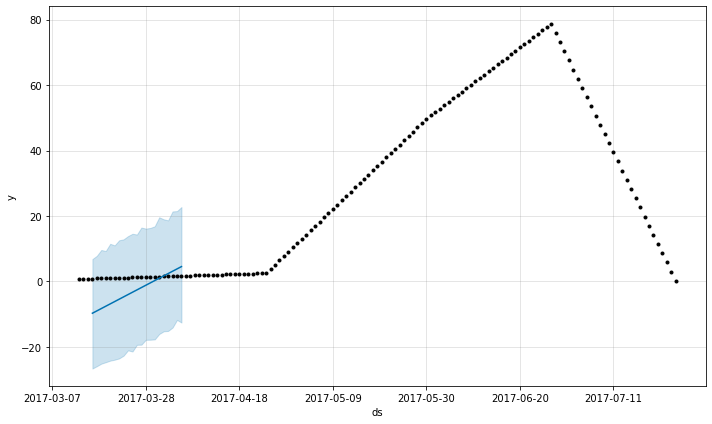

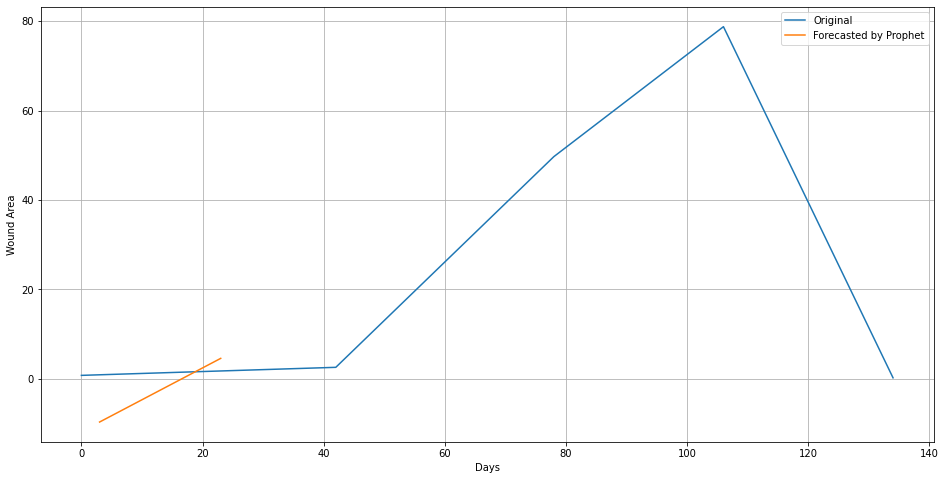

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 63
78
92

Initial log joint probability = -81.621
Iteration  1. Log joint probability =    83.6312. Improved by 165.252.
Iteration  2. Log joint probability =    92.1639. Improved by 8.53272.
Iteration  3. Log joint probability =    170.517. Improved by 78.3534.
Iteration  4. Log joint probability =    181.445. Improved by 10.9279.
Iteration  5. Log joint probability =    181.481. Improved by 0.036183.
Iteration  6. Log joint probability =    181.754. Improved by 0.273074.
Iteration  7. Log joint probability =     182.12. Improved by 0.365952.
Iteration  8. Log joint probability =    182.268. Improved by 0.147203.
Iteration  9. Log joint probability =    182.767. Improved by 0.499001.
Iteration 10. Log joint probability =    182.793. Improved by 0.0261441.
Iteration 11. Log joint probability =    183.377. Improved by 0.583866.
Iteration 12. Log joint probability =    183.589. Improved by 0.212438.
Iteration 13. Log joint probability =    183.769. Improved by 0.180088.
Iteration 

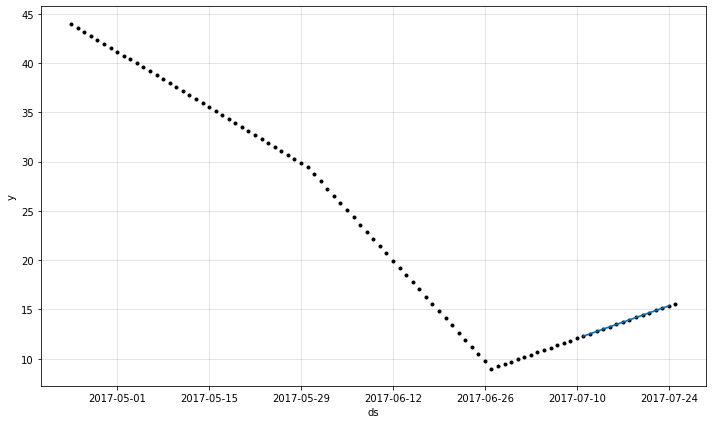

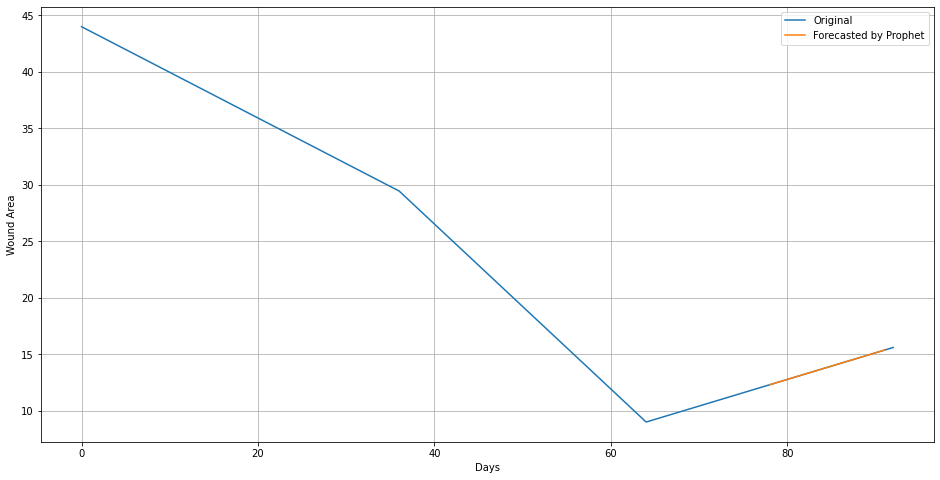

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 64
14
23

Initial log joint probability = -53.2303
Iteration  1. Log joint probability =    28.2741. Improved by 81.5045.
Iteration  2. Log joint probability =    36.9919. Improved by 8.71773.
Iteration  3. Log joint probability =    47.7533. Improved by 10.7614.
Iteration  4. Log joint probability =    47.7623. Improved by 0.00899455.
Iteration  5. Log joint probability =    47.7873. Improved by 0.02502.
Iteration  6. Log joint probability =    47.8035. Improved by 0.0162267.
Iteration  7. Log joint probability =    47.8116. Improved by 0.00811292.
Iteration  8. Log joint probability =    47.8345. Improved by 0.0229281.
Iteration  9. Log joint probability =    47.8441. Improved by 0.00953457.
Iteration 10. Log joint probability =    47.8516. Improved by 0.00750453.
Iteration 11. Log joint probability =     47.878. Improved by 0.0263888.
Iteration 12. Log joint probability =    47.8998. Improved by 0.0218517.
Iteration 13. Log joint probability =    47.9062. Improved by 0.006332

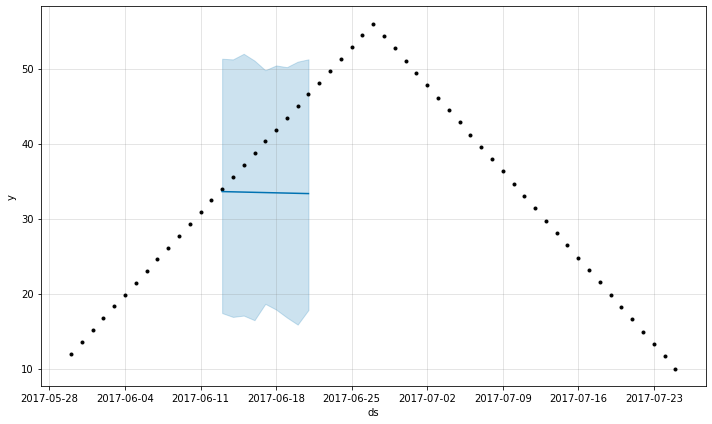

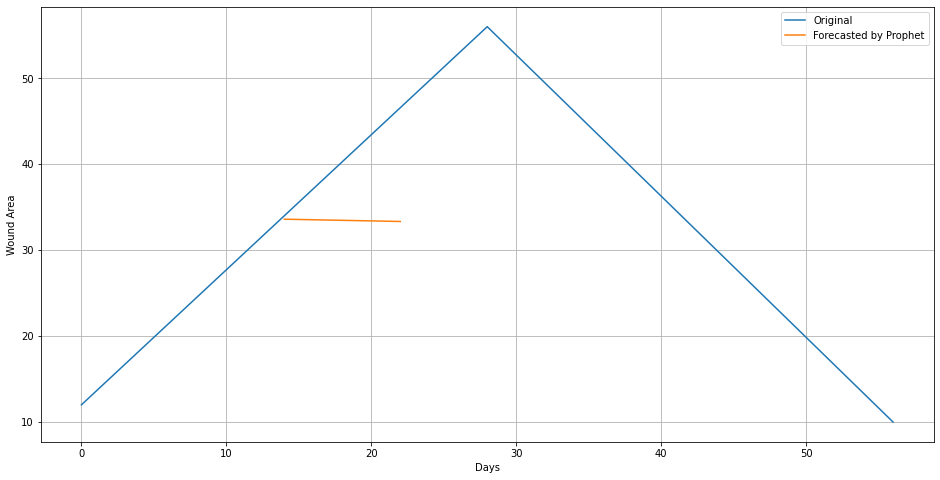

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 65
284
385
Initial log joint probability = -28.6543
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1323.84       0.28214       315.813           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1390.57      0.010454       190.251           1           1      256   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1399.32   0.000403066       70.3939      0.3206           1      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     320       1401.31    0.00191241       228.107   1.365e-05       0.001      446  LS failed, Hessian reset 
     399       1403.85    0.00202295       100.127           1           1      561   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     451       1406.74

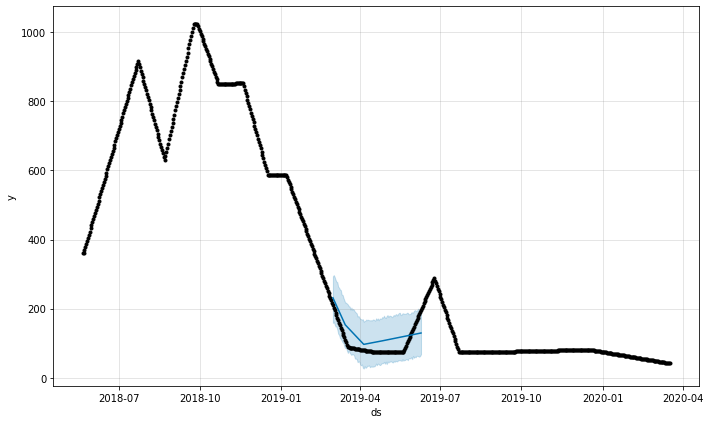

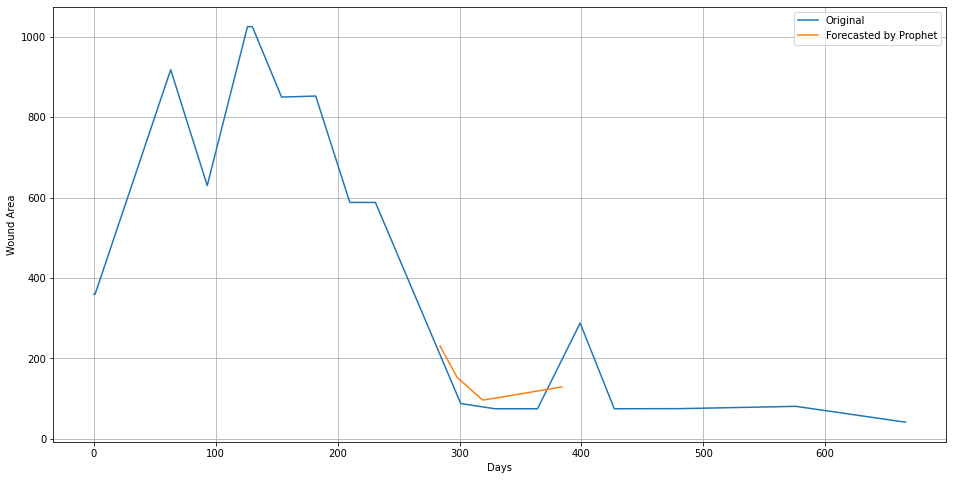

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 66
563
664
Initial log joint probability = -16.1644
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1217.55     0.0477151       122.928           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1246.43     0.0192011       136.754           1           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1261.19   0.000236336       66.3132      0.2483      0.6036      384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1262.36   6.93053e-05       65.4009      0.7325      0.7325      511   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     414       1262.62   0.000554641        65.508   6.927e-06       0.001      588  LS failed, Hessian reset 
     499       1262.87

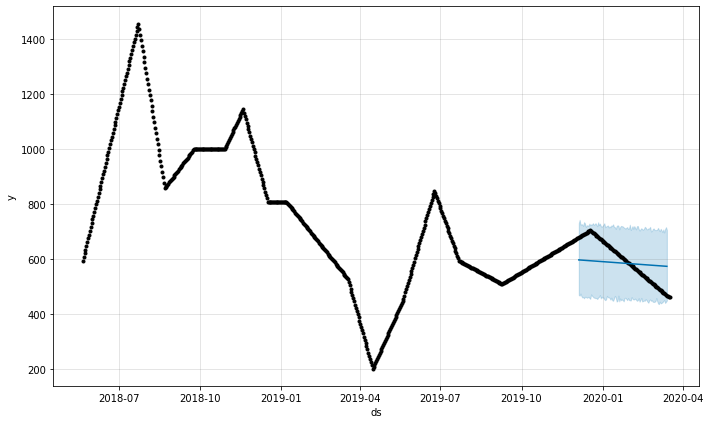

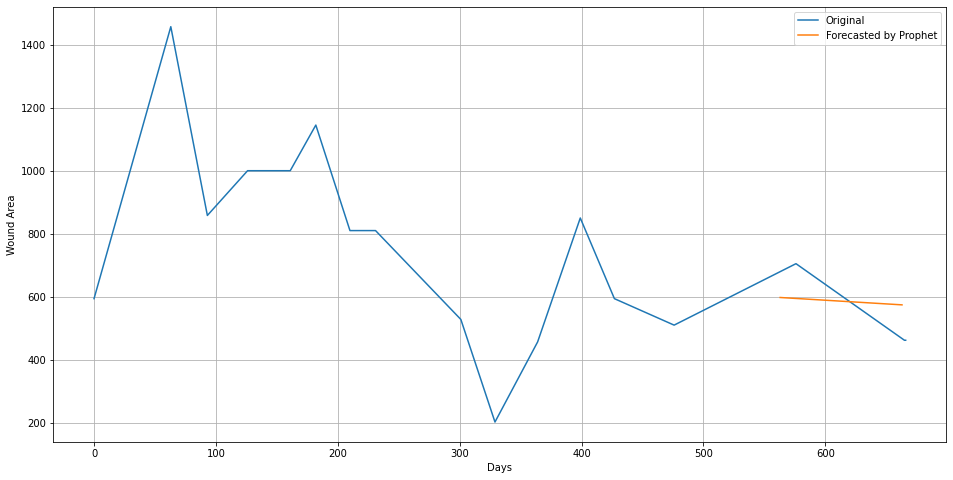

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 67
115
187
Initial log joint probability = -18.0625
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      67       550.651    0.00181976        61.104   3.638e-05       0.001      129  LS failed, Hessian reset 
      94       550.821   0.000801678       33.3971   1.356e-05       0.001      207  LS failed, Hessian reset 
      99       550.838   0.000107859        54.056      0.8623      0.2491      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       550.848   5.89504e-05        42.407   1.203e-06       0.001      274  LS failed, Hessian reset 
     128       550.848   1.32964e-06       43.1843   3.307e-08       0.001      323  LS failed, Hessian reset 
     136       550.849   4.85633e-07       59.1607   1.153e-08       0.001      373  LS failed, Hessian reset 
     142       550.849   8.30365e-09       55.3062      0.1202      0.1202      382   
Optimization terminated norm

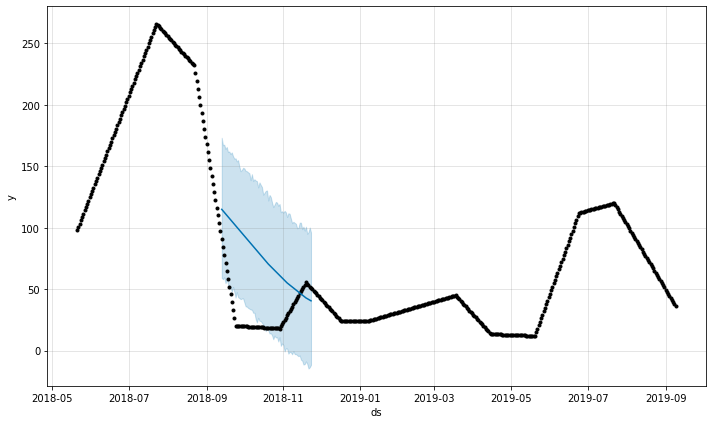

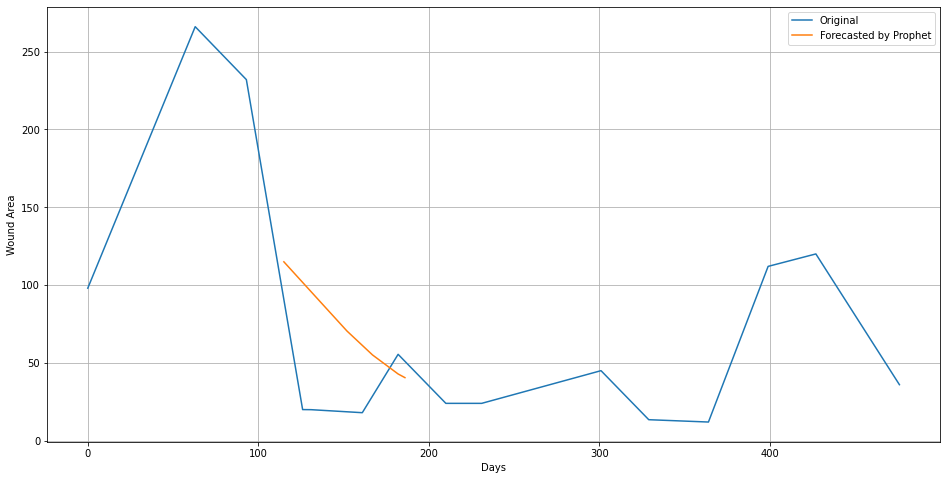

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 68
10
42
Initial log joint probability = -10.1429
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       207.713   0.000567961        64.793      0.4621           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       207.865   0.000527577       65.7572   6.508e-06       0.001      216  LS failed, Hessian reset 
     199       207.903    1.2862e-05        66.672       5.209      0.5209      314   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     249        207.91   3.48964e-07       67.2411   4.081e-09       0.001      417  LS failed, Hessian reset 
     260        207.91    5.5718e-09       69.9596      0.3612      0.3612      432   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


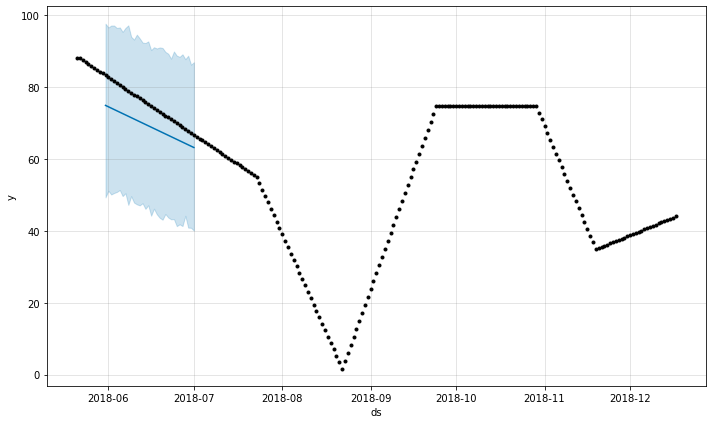

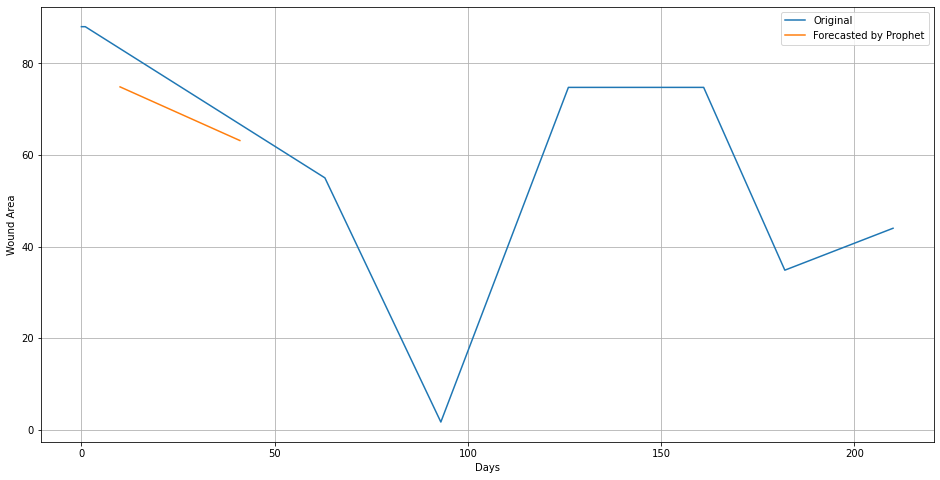

Wound: 69
384
506
Initial log joint probability = -17.1742
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1489.49     0.0108552        172.46      0.1994           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       1501.44   0.000633568       135.136   3.584e-06       0.001      258  LS failed, Hessian reset 
     199       1506.71    0.00141909       91.5075         0.8         0.8      299   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       1507.13    0.00393683       85.8644   3.967e-05       0.001      408  LS failed, Hessian reset 
     299       1507.27   1.73598e-07       72.6737           1           1      465   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303       1507.27   1.61092e-08       66.6848      0.1139      0.3457      471   
Opt

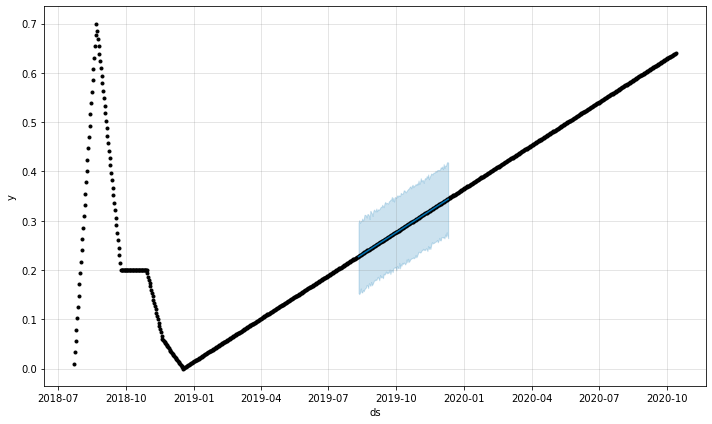

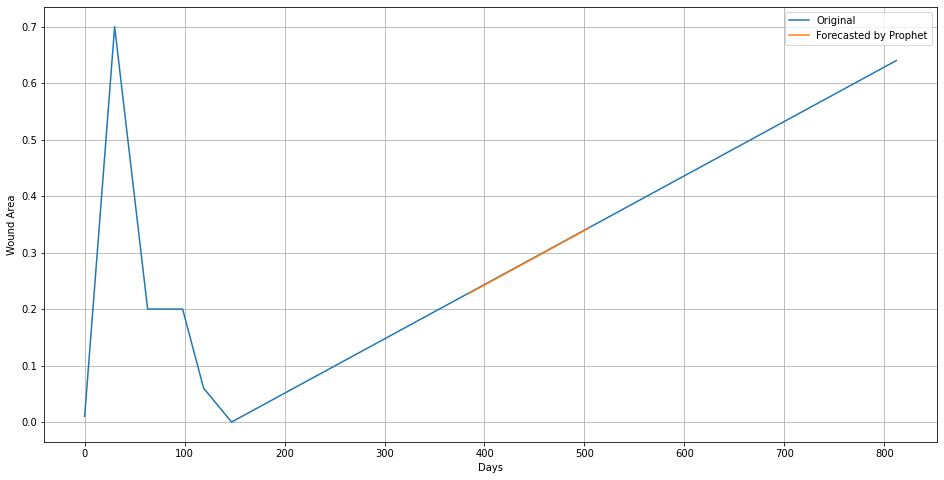

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 70
50
78
Initial log joint probability = -16.9013
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       431.891     0.0672264       962.417       0.497       0.497      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       532.326       0.17748       3426.13           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       596.042     0.0620394       3239.87           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       629.735    0.00327817       591.207           1           1      479   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       645.876    0.00152168       502.187           1           1      600   
    Iter      log prob        ||dx||      ||grad

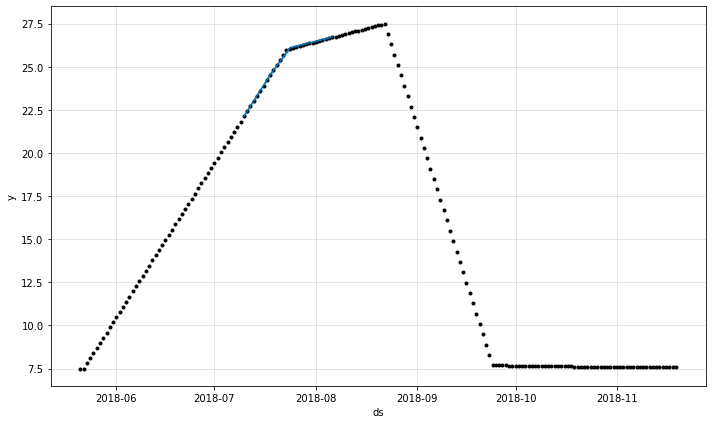

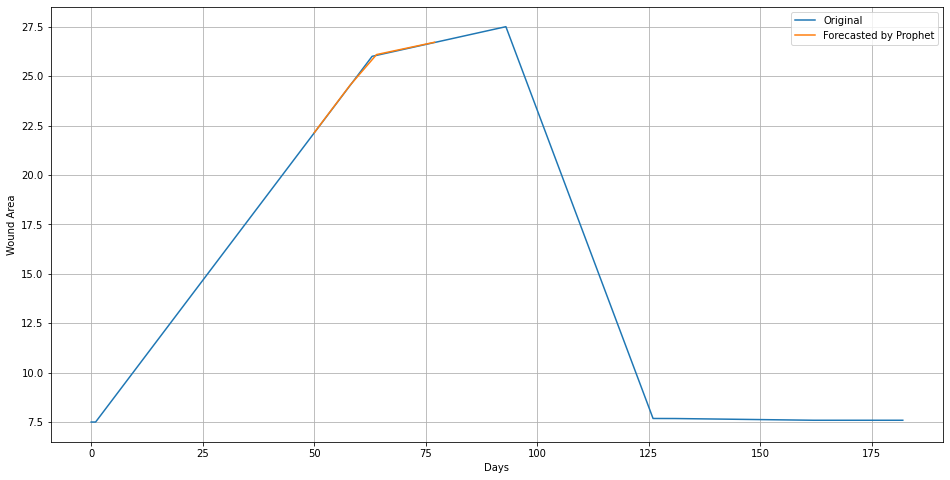

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 71
44
76
Initial log joint probability = -3.17616
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       570.833     0.0261658       295.918           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       705.127      0.027066       2338.36           1           1      229   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       795.541     0.0164983       2200.27           1           1      341   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       828.308     0.0155916       577.642           1           1      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       853.741    0.00378122        243.11           1           1      584   
    Iter      log prob        ||dx||      ||grad

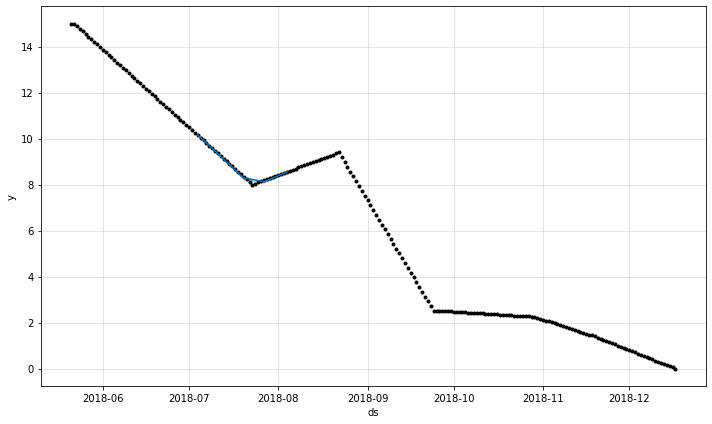

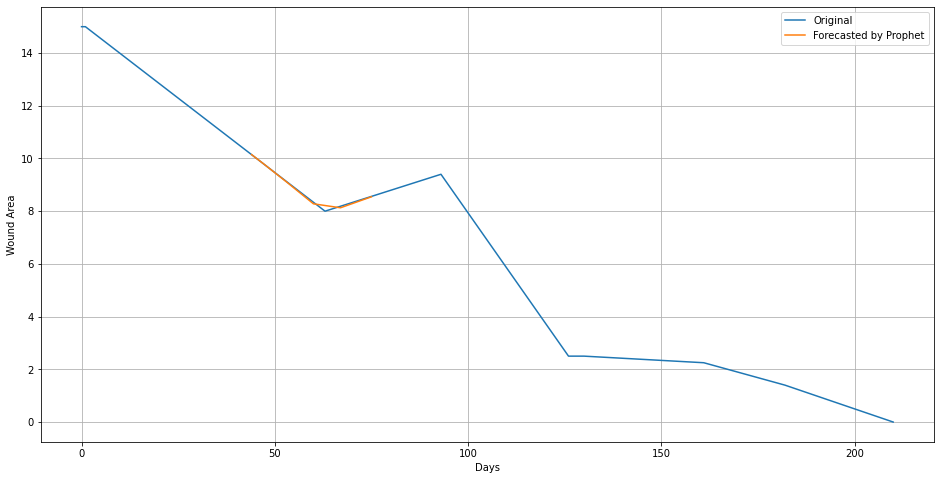

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 72
72
86

Initial log joint probability = -78.474
Iteration  1. Log joint probability =    251.317. Improved by 329.791.
Iteration  2. Log joint probability =    285.229. Improved by 33.9112.
Iteration  3. Log joint probability =     370.54. Improved by 85.3114.
Iteration  4. Log joint probability =    428.722. Improved by 58.1822.
Iteration  5. Log joint probability =    493.525. Improved by 64.8031.
Iteration  6. Log joint probability =     536.07. Improved by 42.5449.
Iteration  7. Log joint probability =    590.723. Improved by 54.6523.
Iteration  8. Log joint probability =    604.361. Improved by 13.6388.
Iteration  9. Log joint probability =    604.607. Improved by 0.245548.
Iteration 10. Log joint probability =        606. Improved by 1.39308.
Iteration 11. Log joint probability =    606.215. Improved by 0.215084.
Iteration 12. Log joint probability =    606.376. Improved by 0.160631.
Iteration 13. Log joint probability =    606.419. Improved by 0.0428569.
Iteration 14. L

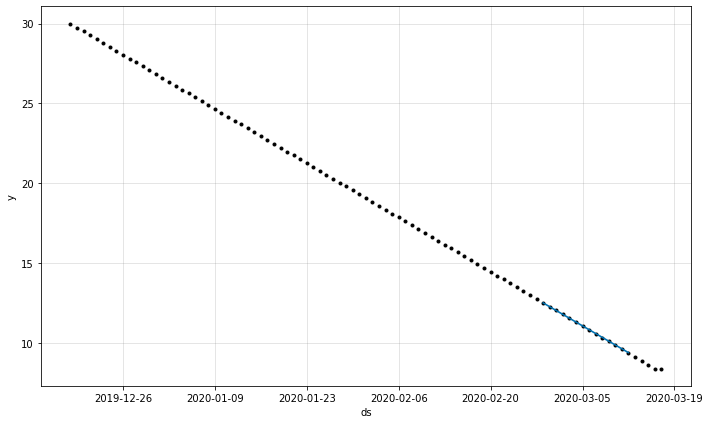

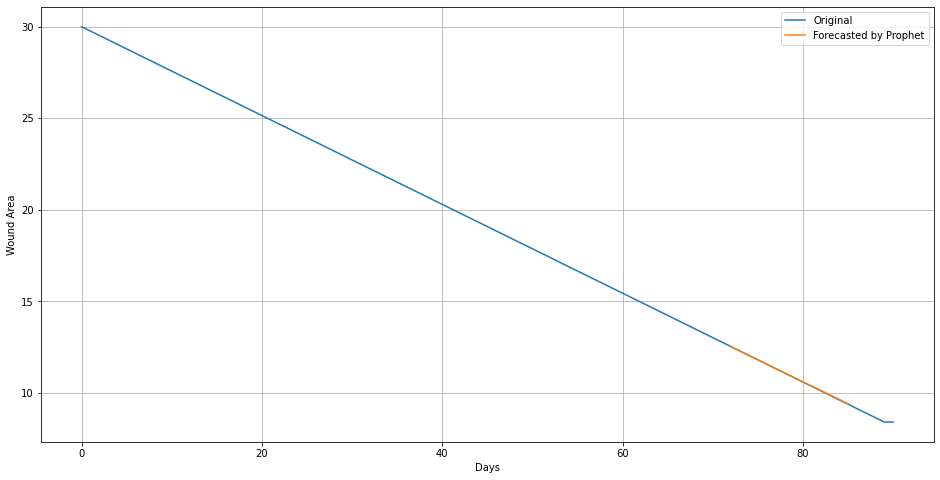

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 73
51
65

Initial log joint probability = -78.4813
Iteration  1. Log joint probability =    247.241. Improved by 325.723.
Iteration  2. Log joint probability =    306.073. Improved by 58.8314.
Iteration  3. Log joint probability =    363.404. Improved by 57.3315.
Iteration  4. Log joint probability =    419.937. Improved by 56.5329.
Iteration  5. Log joint probability =    501.622. Improved by 81.6852.
Iteration  6. Log joint probability =    550.703. Improved by 49.0805.
Iteration  7. Log joint probability =    573.289. Improved by 22.5859.
Iteration  8. Log joint probability =    575.199. Improved by 1.90991.
Iteration  9. Log joint probability =    577.749. Improved by 2.54998.
Iteration 10. Log joint probability =     578.89. Improved by 1.14169.
Iteration 11. Log joint probability =    582.357. Improved by 3.46721.
Iteration 12. Log joint probability =    582.628. Improved by 0.270829.
Iteration 13. Log joint probability =    583.109. Improved by 0.480859.
Iteration 14. Log

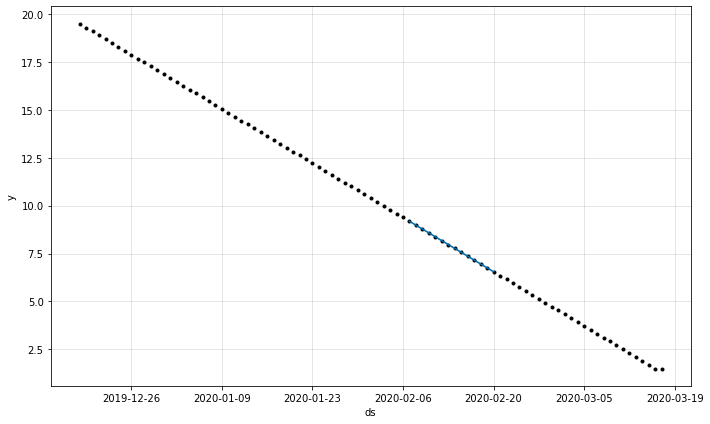

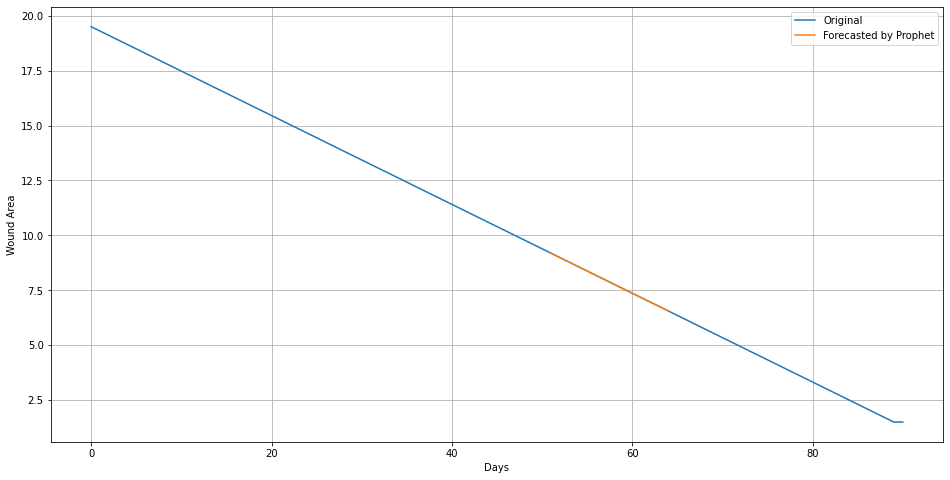

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 74
6
20

Initial log joint probability = -78.4697
Iteration  1. Log joint probability =    253.703. Improved by 332.173.
Iteration  2. Log joint probability =    318.933. Improved by 65.2295.
Iteration  3. Log joint probability =    352.162. Improved by 33.2297.
Iteration  4. Log joint probability =    437.538. Improved by 85.375.
Iteration  5. Log joint probability =    495.353. Improved by 57.8155.
Iteration  6. Log joint probability =    546.469. Improved by 51.1161.
Iteration  7. Log joint probability =    563.489. Improved by 17.0201.
Iteration  8. Log joint probability =    623.861. Improved by 60.3717.
Iteration  9. Log joint probability =    627.242. Improved by 3.38161.
Iteration 10. Log joint probability =    627.384. Improved by 0.141403.
Iteration 11. Log joint probability =    627.615. Improved by 0.231336.
Iteration 12. Log joint probability =    627.697. Improved by 0.08219.
Iteration 13. Log joint probability =    627.829. Improved by 0.131624.
Iteration 14. Log 

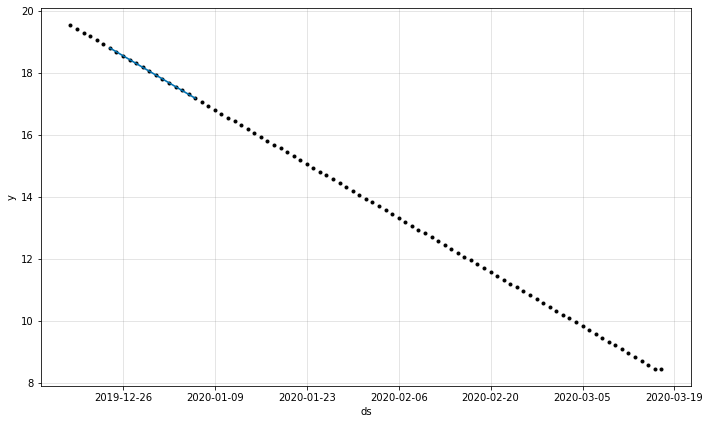

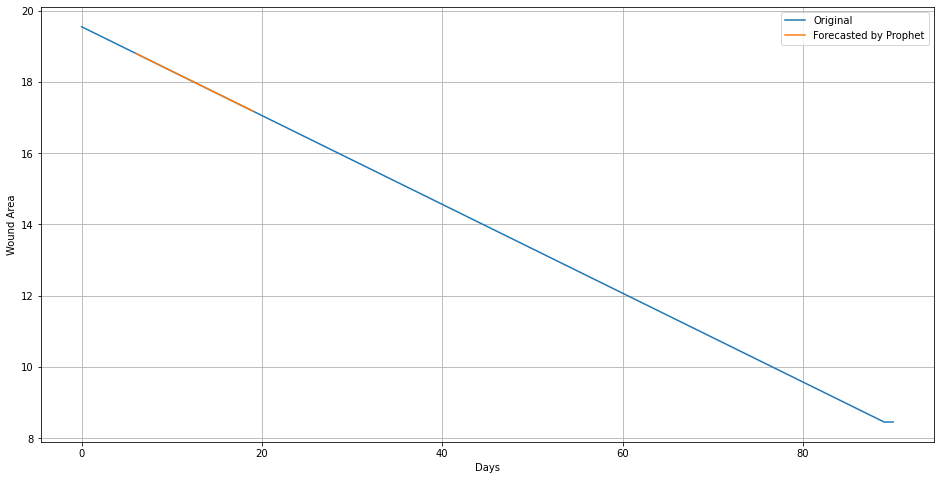

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 75
0
1
Wound: 76
5
33
Initial log joint probability = -9.03625
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75        222.84     0.0041285       63.9422   5.021e-05       0.001      132  LS failed, Hessian reset 
      99       223.149   9.87472e-06       55.8425      0.1583      0.1583      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       223.154   5.65209e-09       55.2301      0.1893      0.1893      210   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


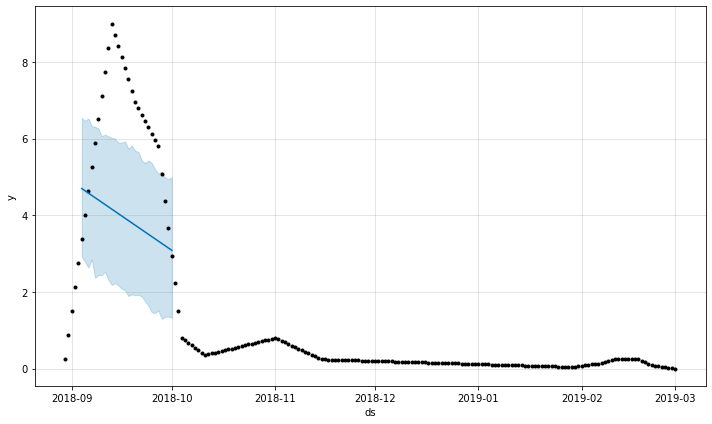

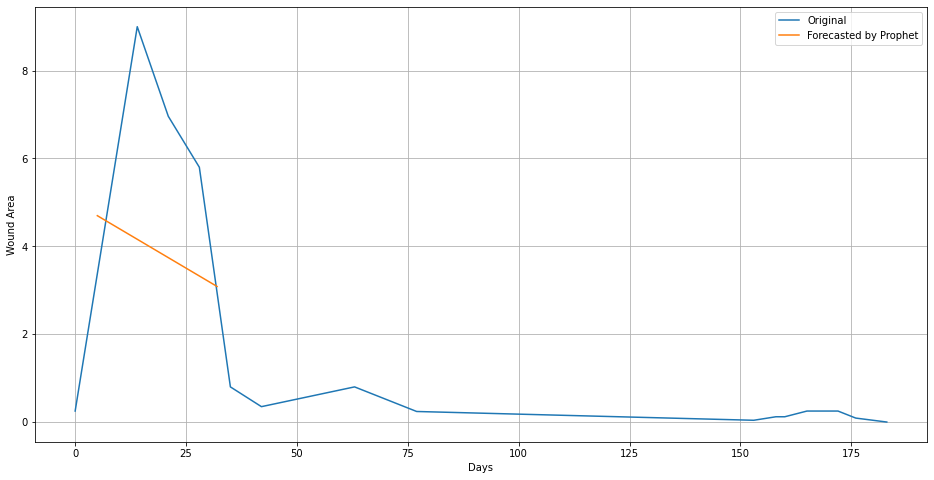

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 18.


Wound: 77
10
14

Initial log joint probability = -33.2056
Iteration  1. Log joint probability =    18.0238. Improved by 51.2294.
Iteration  2. Log joint probability =    43.4088. Improved by 25.385.
Iteration  3. Log joint probability =    43.4427. Improved by 0.0339184.
Iteration  4. Log joint probability =    43.4768. Improved by 0.0340335.
Iteration  5. Log joint probability =      43.51. Improved by 0.0332539.
Iteration  6. Log joint probability =     43.516. Improved by 0.00599479.
Iteration  7. Log joint probability =     43.826. Improved by 0.309945.
Iteration  8. Log joint probability =    43.8387. Improved by 0.0127659.
Iteration  9. Log joint probability =    43.8605. Improved by 0.021767.
Iteration 10. Log joint probability =    43.9115. Improved by 0.0510046.
Iteration 11. Log joint probability =    43.9382. Improved by 0.0267153.
Iteration 12. Log joint probability =    43.9678. Improved by 0.029574.
Iteration 13. Log joint probability =    43.9825. Improved by 0.014746.
I

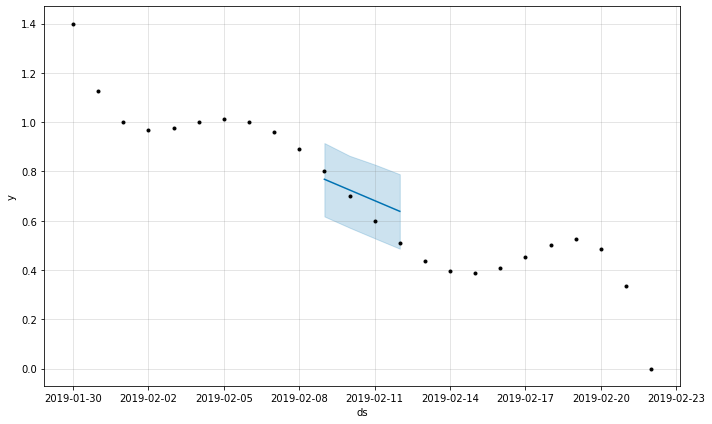

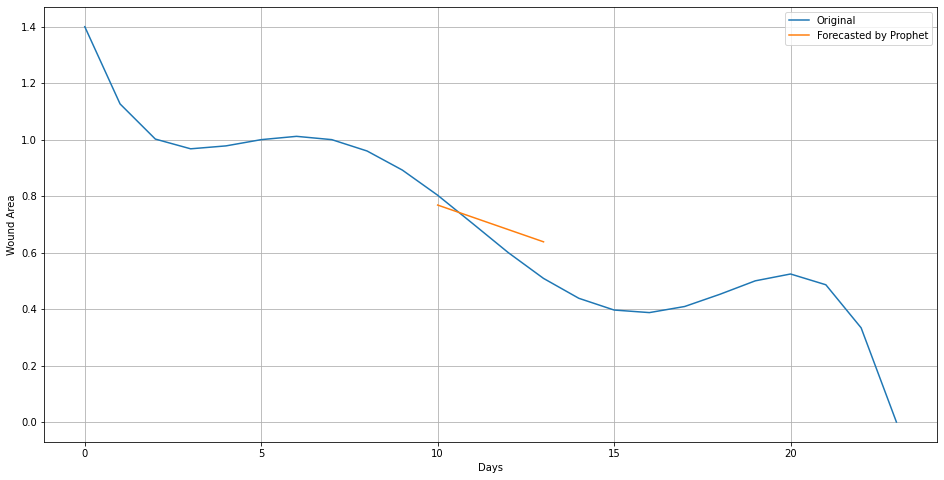

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 14.


Wound: 78
6
9

Initial log joint probability = -41.567
Iteration  1. Log joint probability =   0.600797. Improved by 42.1678.
Iteration  2. Log joint probability =    7.64431. Improved by 7.04351.
Iteration  3. Log joint probability =    11.3189. Improved by 3.67463.
Iteration  4. Log joint probability =    11.3306. Improved by 0.0116522.
Iteration  5. Log joint probability =    11.3649. Improved by 0.0343473.
Iteration  6. Log joint probability =    11.4045. Improved by 0.0396042.
Iteration  7. Log joint probability =    12.0984. Improved by 0.693906.
Iteration  8. Log joint probability =    12.1378. Improved by 0.0393056.
Iteration  9. Log joint probability =    12.2589. Improved by 0.121184.
Iteration 10. Log joint probability =    12.3178. Improved by 0.0588988.
Iteration 11. Log joint probability =    12.3577. Improved by 0.0398258.
Iteration 12. Log joint probability =    12.5439. Improved by 0.186224.
Iteration 13. Log joint probability =    12.8712. Improved by 0.32736.
Iterati

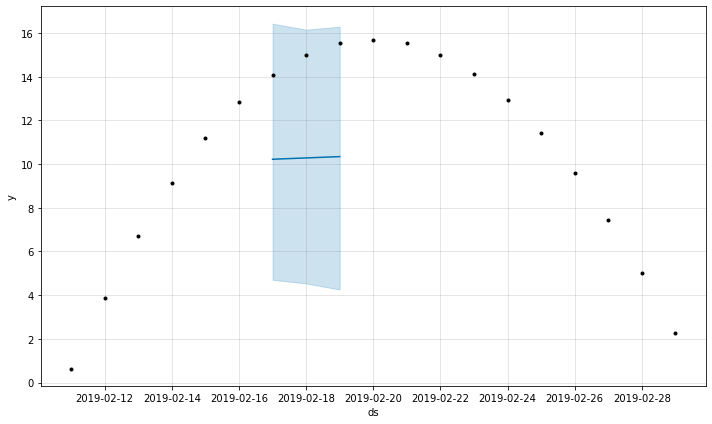

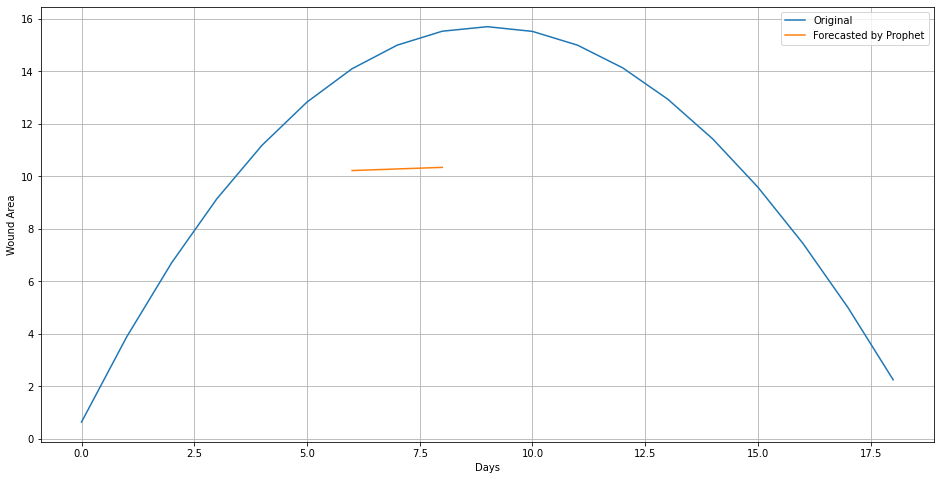

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 3.


Wound: 79
2
3

Initial log joint probability = -30.7791
Iteration  1. Log joint probability =    4.64411. Improved by 35.4232.
Iteration  2. Log joint probability =    8.22313. Improved by 3.57902.
Iteration  3. Log joint probability =    11.0008. Improved by 2.77765.
Iteration  4. Log joint probability =    12.1158. Improved by 1.11506.
Iteration  5. Log joint probability =    12.1178. Improved by 0.00196735.
Iteration  6. Log joint probability =    12.1199. Improved by 0.00206962.
Iteration  7. Log joint probability =    12.1201. Improved by 0.000260637.
Iteration  8. Log joint probability =    12.1215. Improved by 0.001377.
Iteration  9. Log joint probability =    12.1224. Improved by 0.000887601.
Iteration 10. Log joint probability =    12.1229. Improved by 0.000475507.
Iteration 11. Log joint probability =    12.1229. Improved by 1.4849e-05.
Iteration 12. Log joint probability =     12.123. Improved by 9.37776e-05.
Iteration 13. Log joint probability =    12.1231. Improved by 6.66

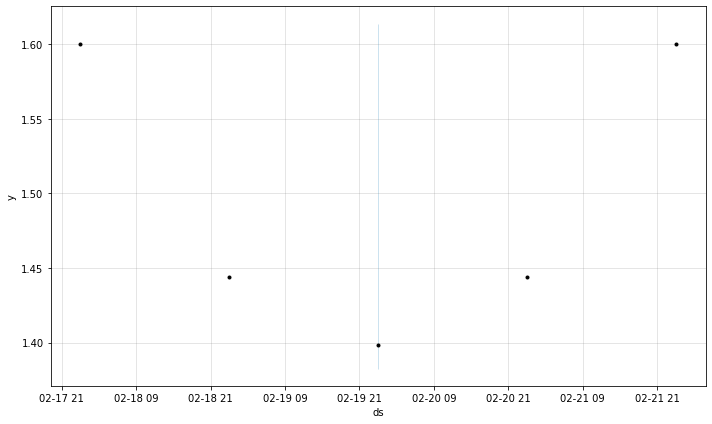

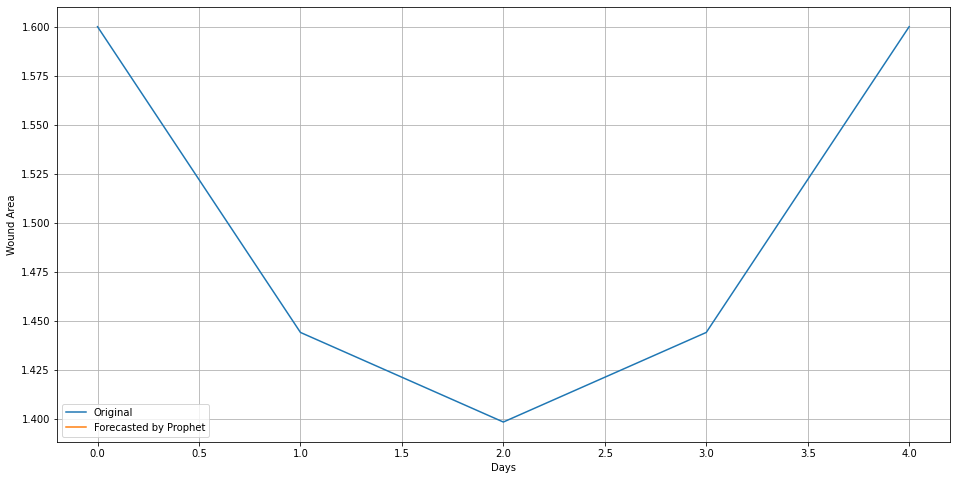

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 80
10
22

Initial log joint probability = -71.9084
Iteration  1. Log joint probability =    46.5505. Improved by 118.459.
Iteration  2. Log joint probability =    85.0602. Improved by 38.5097.
Iteration  3. Log joint probability =    88.5929. Improved by 3.5327.
Iteration  4. Log joint probability =    91.6181. Improved by 3.02523.
Iteration  5. Log joint probability =    91.6306. Improved by 0.0124934.
Iteration  6. Log joint probability =    91.6641. Improved by 0.0334606.
Iteration  7. Log joint probability =    91.6726. Improved by 0.00847742.
Iteration  8. Log joint probability =    92.1397. Improved by 0.467177.
Iteration  9. Log joint probability =    92.1971. Improved by 0.05735.
Iteration 10. Log joint probability =    92.2416. Improved by 0.0444813.
Iteration 11. Log joint probability =    92.3224. Improved by 0.0807767.
Iteration 12. Log joint probability =    92.3286. Improved by 0.0062666.
Iteration 13. Log joint probability =    96.6658. Improved by 4.3372.
Iterati

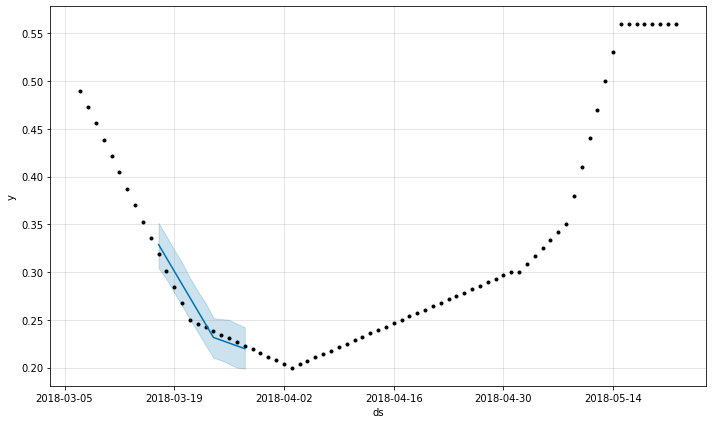

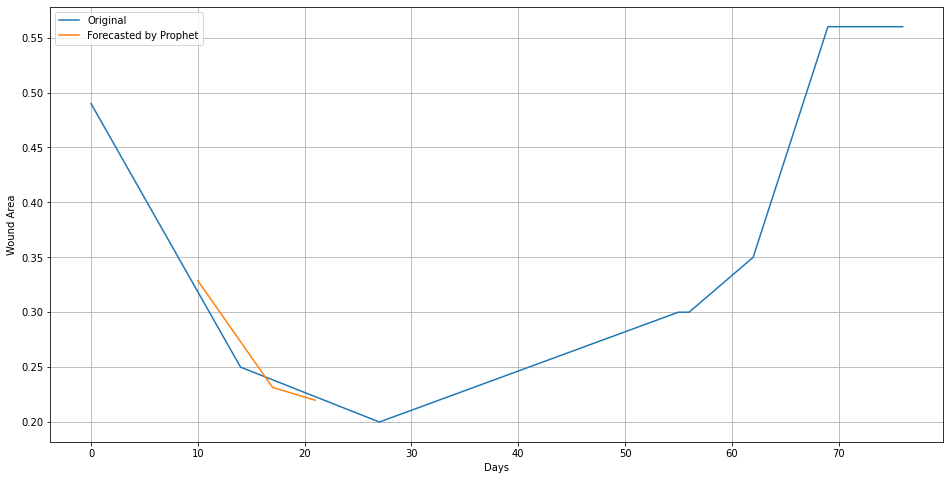

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 81
51
63

Initial log joint probability = -77.8501
Iteration  1. Log joint probability =    42.0436. Improved by 119.894.
Iteration  2. Log joint probability =    79.2438. Improved by 37.2002.
Iteration  3. Log joint probability =    82.3435. Improved by 3.09967.
Iteration  4. Log joint probability =    83.1176. Improved by 0.774161.
Iteration  5. Log joint probability =    83.1249. Improved by 0.00728039.
Iteration  6. Log joint probability =    83.1654. Improved by 0.0404764.
Iteration  7. Log joint probability =    83.5548. Improved by 0.389363.
Iteration  8. Log joint probability =    83.8182. Improved by 0.263472.
Iteration  9. Log joint probability =    83.8765. Improved by 0.058225.
Iteration 10. Log joint probability =    83.9148. Improved by 0.0383754.
Iteration 11. Log joint probability =    83.9373. Improved by 0.0224812.
Iteration 12. Log joint probability =    83.9762. Improved by 0.0389259.
Iteration 13. Log joint probability =    84.0708. Improved by 0.0945779.
It

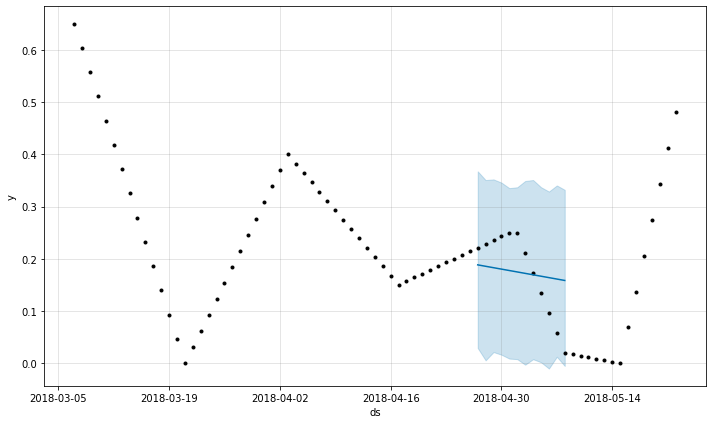

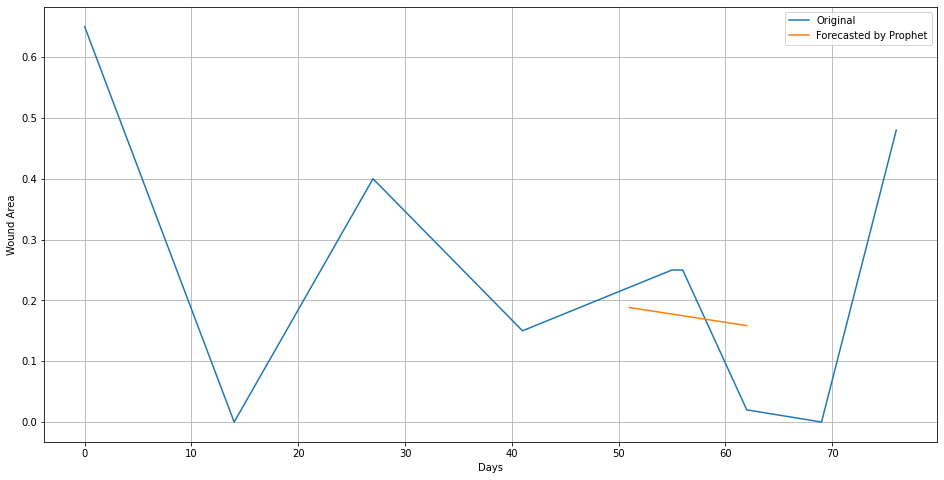

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 82
45
89
Initial log joint probability = -8.48432
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       564.348     0.0035958       94.4122           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       565.775   3.90455e-07       53.2358   5.157e-09       0.001      286  LS failed, Hessian reset 
     192       565.775   2.51114e-08       63.1506      0.5305      0.5305      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


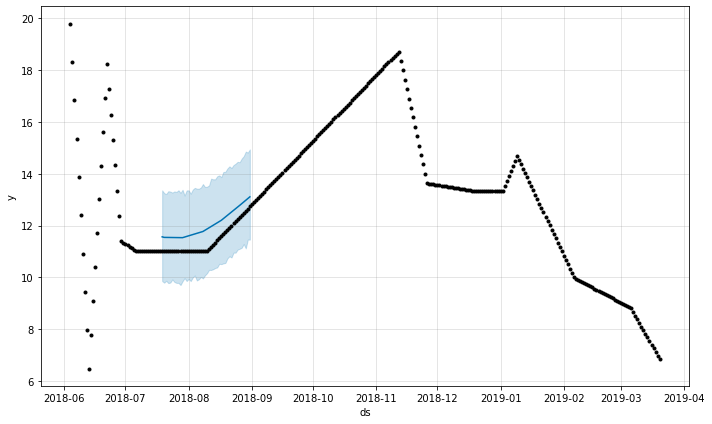

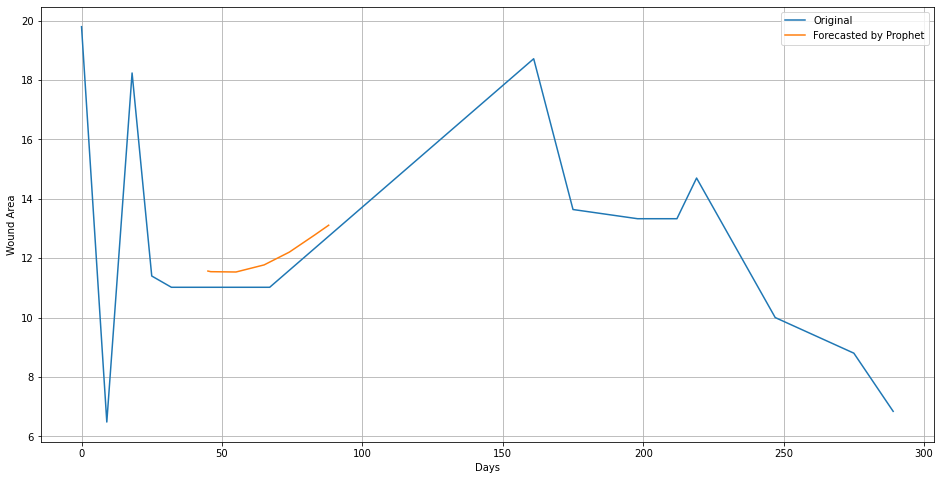

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 83
0
5

Initial log joint probability = -25.4325
Iteration  1. Log joint probability =    31.6734. Improved by 57.106.
Iteration  2. Log joint probability =    51.0571. Improved by 19.3837.
Iteration  3. Log joint probability =    56.4298. Improved by 5.37264.
Iteration  4. Log joint probability =    56.8907. Improved by 0.460972.
Iteration  5. Log joint probability =     56.897. Improved by 0.006265.
Iteration  6. Log joint probability =    56.9072. Improved by 0.0101697.
Iteration  7. Log joint probability =    56.9226. Improved by 0.0154511.
Iteration  8. Log joint probability =    56.9469. Improved by 0.0242337.
Iteration  9. Log joint probability =    56.9591. Improved by 0.0122744.
Iteration 10. Log joint probability =    57.0271. Improved by 0.0679313.
Iteration 11. Log joint probability =    57.0757. Improved by 0.0486833.
Iteration 12. Log joint probability =    57.1186. Improved by 0.0428115.
Iteration 13. Log joint probability =    57.1775. Improved by 0.0589101.
Iter

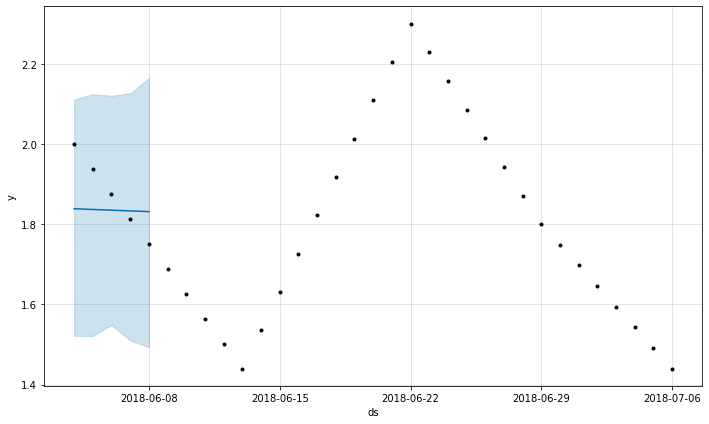

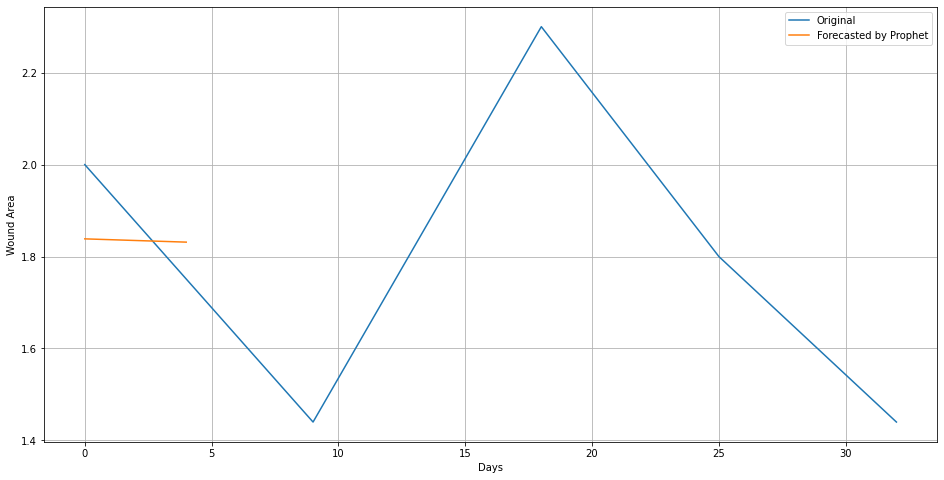

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 84
6
13

Initial log joint probability = -32.6336
Iteration  1. Log joint probability =    50.8811. Improved by 83.5147.
Iteration  2. Log joint probability =      77.23. Improved by 26.3489.
Iteration  3. Log joint probability =    100.176. Improved by 22.9455.
Iteration  4. Log joint probability =    105.701. Improved by 5.52528.
Iteration  5. Log joint probability =    109.118. Improved by 3.41686.
Iteration  6. Log joint probability =    109.357. Improved by 0.23954.
Iteration  7. Log joint probability =    109.371. Improved by 0.0133933.
Iteration  8. Log joint probability =    109.519. Improved by 0.148219.
Iteration  9. Log joint probability =    109.841. Improved by 0.322282.
Iteration 10. Log joint probability =    109.843. Improved by 0.00163181.
Iteration 11. Log joint probability =      109.9. Improved by 0.0568771.
Iteration 12. Log joint probability =    109.912. Improved by 0.0127288.
Iteration 13. Log joint probability =    110.023. Improved by 0.110839.
Iteratio

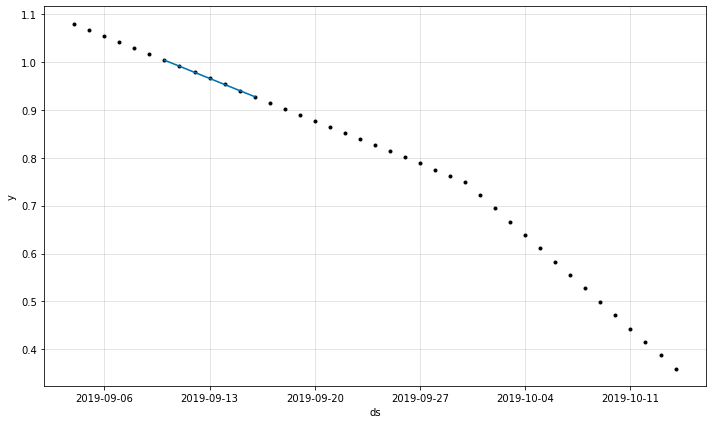

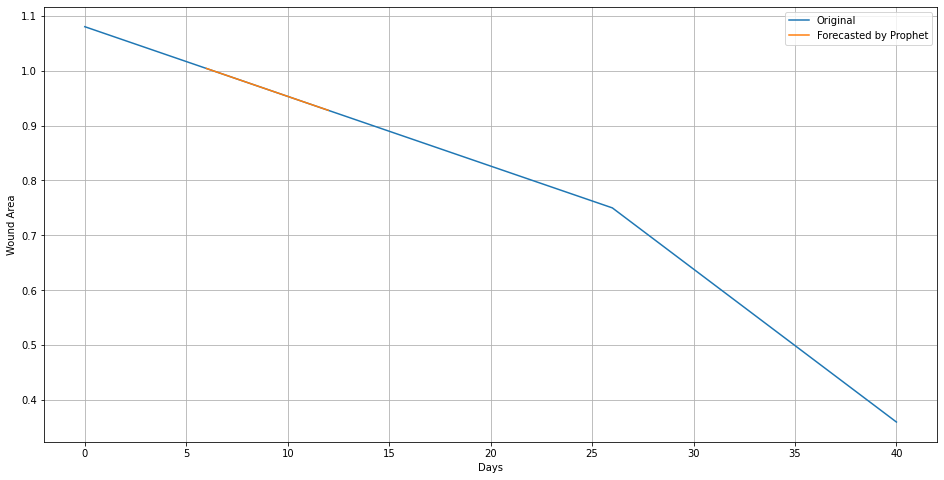

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 85
0
7

Initial log joint probability = -32.5349
Iteration  1. Log joint probability =    109.627. Improved by 142.162.
Iteration  2. Log joint probability =    151.095. Improved by 41.4679.
Iteration  3. Log joint probability =    176.719. Improved by 25.6246.
Iteration  4. Log joint probability =     201.96. Improved by 25.2408.
Iteration  5. Log joint probability =    245.962. Improved by 44.0018.
Iteration  6. Log joint probability =     262.33. Improved by 16.3681.
Iteration  7. Log joint probability =    286.254. Improved by 23.9236.
Iteration  8. Log joint probability =    286.419. Improved by 0.165355.
Iteration  9. Log joint probability =    336.468. Improved by 50.0486.
Iteration 10. Log joint probability =    365.667. Improved by 29.1998.
Iteration 11. Log joint probability =    395.164. Improved by 29.4962.
Iteration 12. Log joint probability =    422.161. Improved by 26.9972.
Iteration 13. Log joint probability =    475.786. Improved by 53.6255.
Iteration 14. Log jo

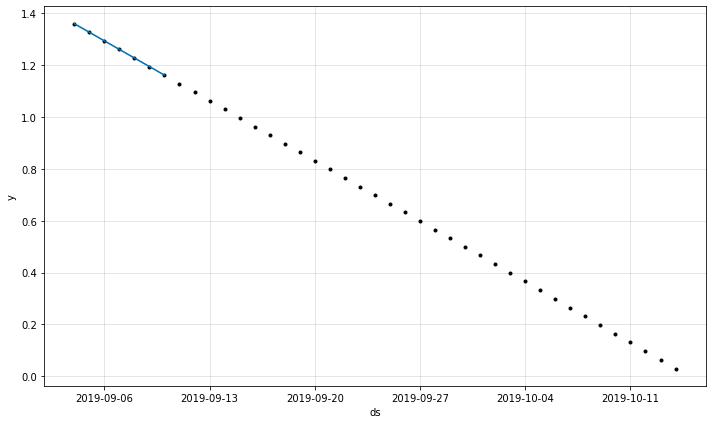

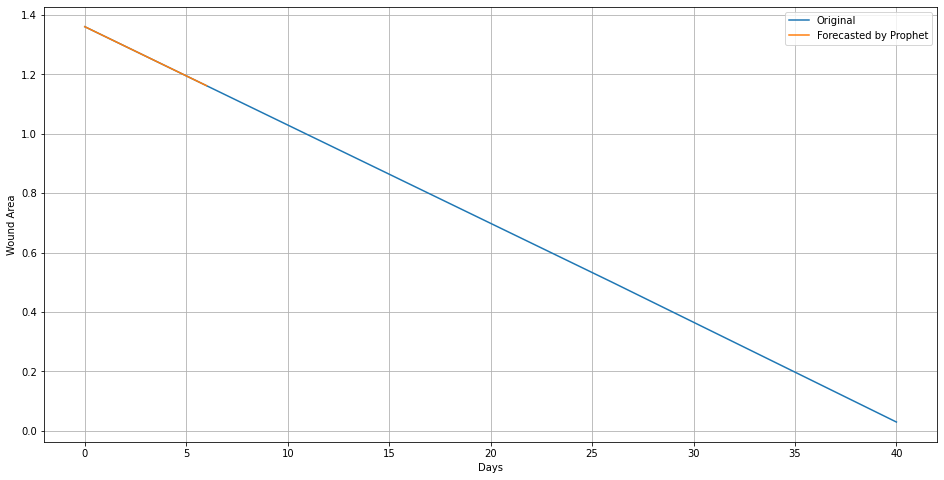

Wound: 86
107
327
Initial log joint probability = -225.479
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       2421.67    0.00594477        225.82     0.06323      0.3056      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122        2428.8   0.000643359       128.419   5.178e-06       0.001      184  LS failed, Hessian reset 
     199       2434.79    0.00291719       118.187           1           1      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     220       2437.05   0.000869327       170.383   7.262e-06       0.001      377  LS failed, Hessian reset 
     299       2440.59     0.0081191        94.204       2.205      0.7165      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     357       2440.92   0.000288689       49.5216   3.228e-06       0.001      583  LS fa

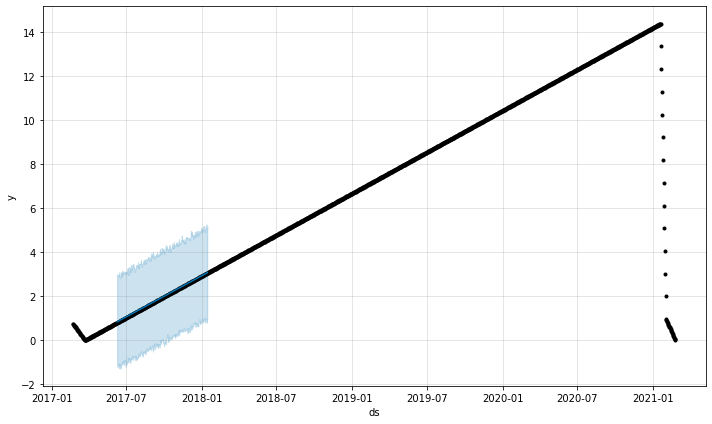

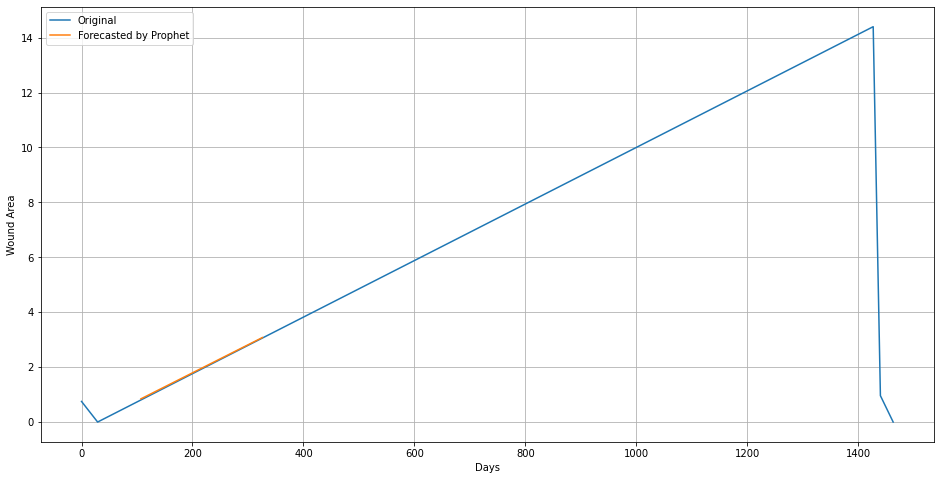

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 87
20
28

Initial log joint probability = -42.1445
Iteration  1. Log joint probability =    14.3106. Improved by 56.4551.
Iteration  2. Log joint probability =    43.0422. Improved by 28.7316.
Iteration  3. Log joint probability =     43.103. Improved by 0.0608254.
Iteration  4. Log joint probability =    43.1182. Improved by 0.0152063.
Iteration  5. Log joint probability =    43.2442. Improved by 0.126031.
Iteration  6. Log joint probability =    43.3517. Improved by 0.107435.
Iteration  7. Log joint probability =    43.5031. Improved by 0.151384.
Iteration  8. Log joint probability =    43.5169. Improved by 0.0138118.
Iteration  9. Log joint probability =    43.6168. Improved by 0.0999668.
Iteration 10. Log joint probability =     43.711. Improved by 0.0941773.
Iteration 11. Log joint probability =    43.7222. Improved by 0.0111723.
Iteration 12. Log joint probability =    43.7971. Improved by 0.0748737.
Iteration 13. Log joint probability =    43.8925. Improved by 0.0954863.


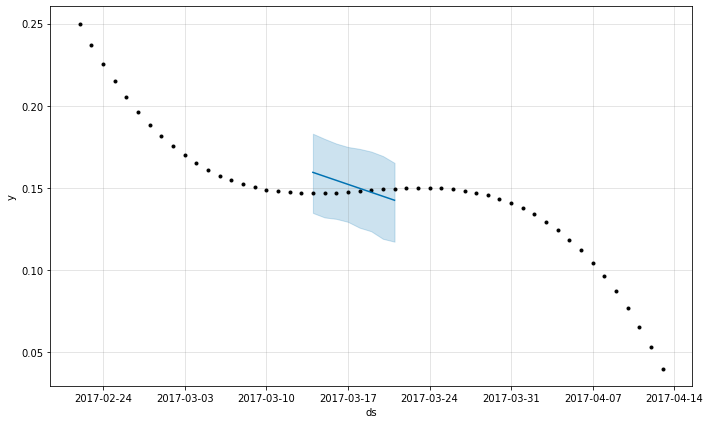

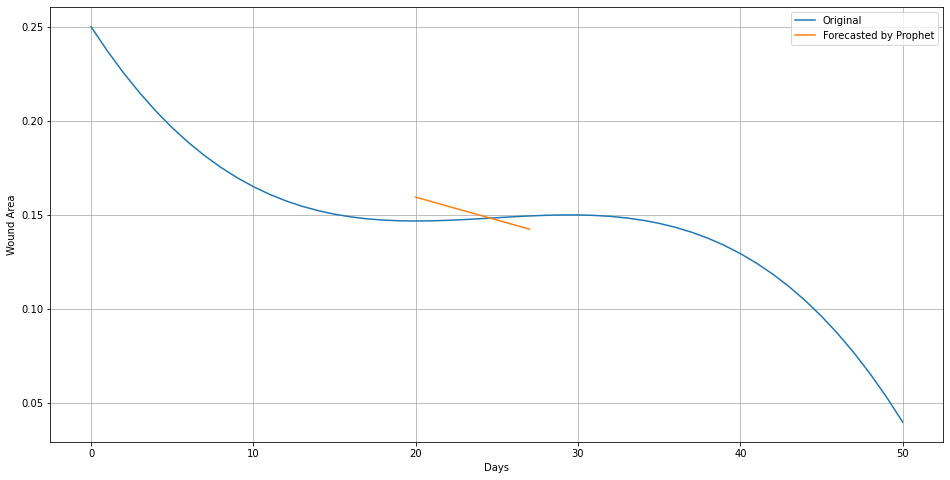

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 88
1
5

Initial log joint probability = -36.073
Iteration  1. Log joint probability =    17.3403. Improved by 53.4132.
Iteration  2. Log joint probability =    32.5555. Improved by 15.2152.
Iteration  3. Log joint probability =    45.6563. Improved by 13.1008.
Iteration  4. Log joint probability =    51.4334. Improved by 5.77711.
Iteration  5. Log joint probability =    51.4399. Improved by 0.00647657.
Iteration  6. Log joint probability =    51.4825. Improved by 0.0425958.
Iteration  7. Log joint probability =    51.4949. Improved by 0.0123829.
Iteration  8. Log joint probability =    51.5044. Improved by 0.00958291.
Iteration  9. Log joint probability =    51.5113. Improved by 0.00689775.
Iteration 10. Log joint probability =    51.5161. Improved by 0.00477541.
Iteration 11. Log joint probability =    51.5185. Improved by 0.00233644.
Iteration 12. Log joint probability =    51.5227. Improved by 0.00423592.
Iteration 13. Log joint probability =    51.5255. Improved by 0.0027842

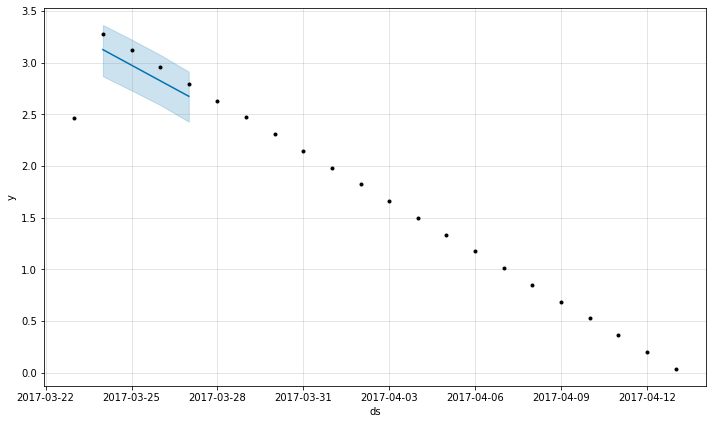

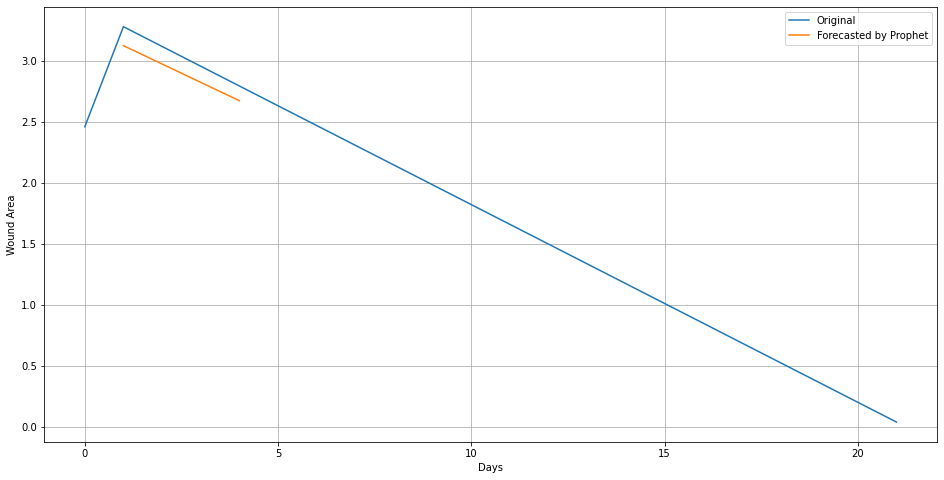

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 89
5
8

Initial log joint probability = -41.1414
Iteration  1. Log joint probability =    9.87378. Improved by 51.0152.
Iteration  2. Log joint probability =    21.3178. Improved by 11.444.
Iteration  3. Log joint probability =    25.9068. Improved by 4.58905.
Iteration  4. Log joint probability =    26.2904. Improved by 0.383567.
Iteration  5. Log joint probability =    26.3416. Improved by 0.0512306.
Iteration  6. Log joint probability =    26.3762. Improved by 0.0345733.
Iteration  7. Log joint probability =    26.4005. Improved by 0.0243503.
Iteration  8. Log joint probability =    26.4092. Improved by 0.00865648.
Iteration  9. Log joint probability =    26.4116. Improved by 0.0023874.
Iteration 10. Log joint probability =    26.4118. Improved by 0.000261499.
Iteration 11. Log joint probability =     26.416. Improved by 0.00413604.
Iteration 12. Log joint probability =    26.4259. Improved by 0.00990144.
Iteration 13. Log joint probability =    26.4283. Improved by 0.0024116

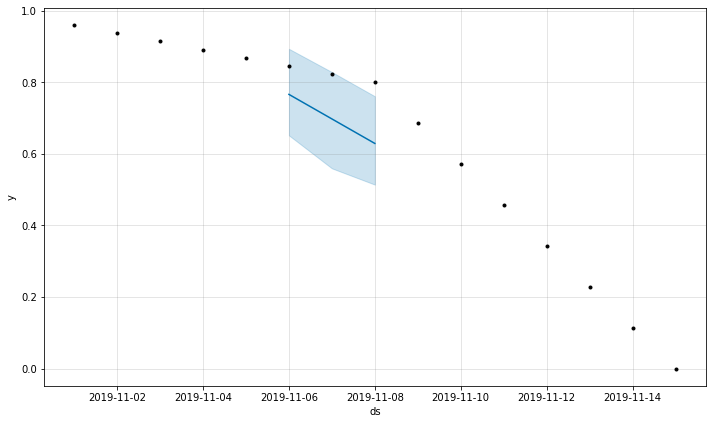

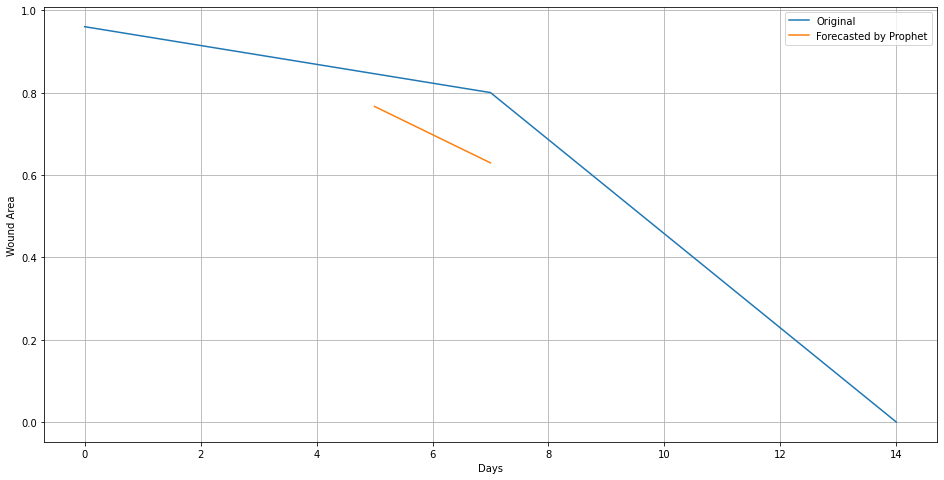

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 90
10
14

Initial log joint probability = -36.1529
Iteration  1. Log joint probability =    16.6112. Improved by 52.764.
Iteration  2. Log joint probability =    30.5399. Improved by 13.9287.
Iteration  3. Log joint probability =    40.6948. Improved by 10.1549.
Iteration  4. Log joint probability =    41.2079. Improved by 0.513073.
Iteration  5. Log joint probability =    41.2703. Improved by 0.0624502.
Iteration  6. Log joint probability =    41.3085. Improved by 0.038168.
Iteration  7. Log joint probability =    41.3258. Improved by 0.0173042.
Iteration  8. Log joint probability =    41.3341. Improved by 0.00836048.
Iteration  9. Log joint probability =    41.3344. Improved by 0.000280602.
Iteration 10. Log joint probability =    41.3369. Improved by 0.0025104.
Iteration 11. Log joint probability =    41.3476. Improved by 0.0107082.
Iteration 12. Log joint probability =    41.3542. Improved by 0.00656438.
Iteration 13. Log joint probability =    41.3558. Improved by 0.0016372

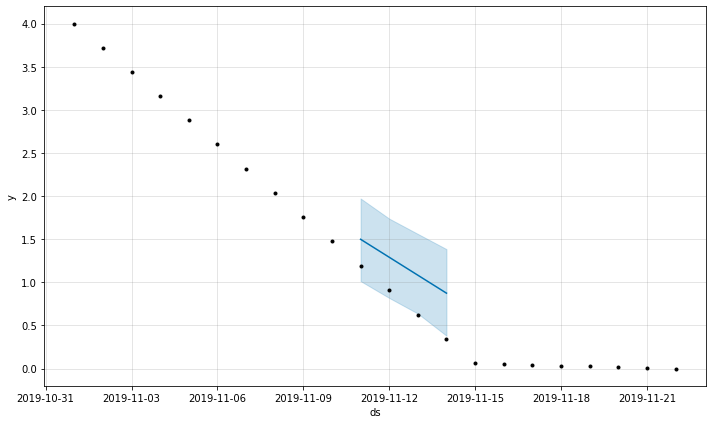

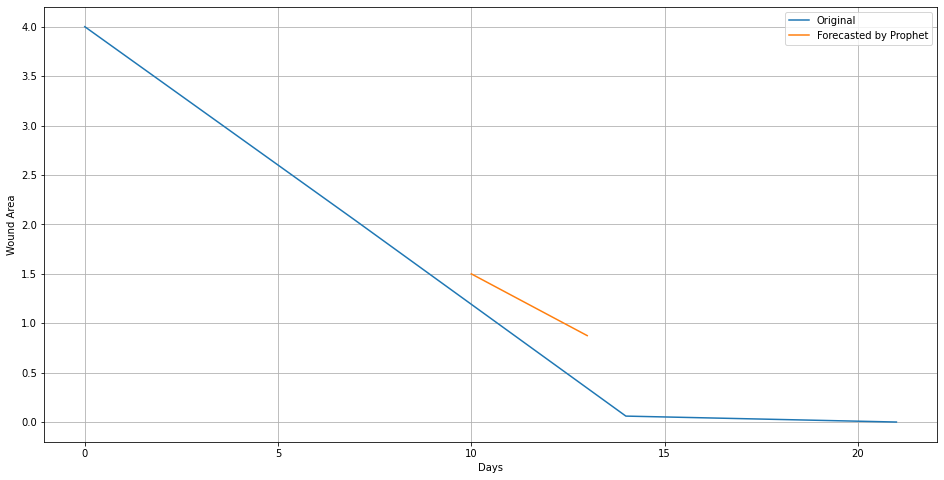

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 91
2
8

Initial log joint probability = -28.5209
Iteration  1. Log joint probability =    31.7661. Improved by 60.287.
Iteration  2. Log joint probability =     44.589. Improved by 12.823.
Iteration  3. Log joint probability =    52.3184. Improved by 7.72936.
Iteration  4. Log joint probability =    54.4237. Improved by 2.10534.
Iteration  5. Log joint probability =    54.5724. Improved by 0.148718.
Iteration  6. Log joint probability =     54.602. Improved by 0.029564.
Iteration  7. Log joint probability =    54.6196. Improved by 0.0176023.
Iteration  8. Log joint probability =    54.6415. Improved by 0.0218749.
Iteration  9. Log joint probability =    54.6643. Improved by 0.0228399.
Iteration 10. Log joint probability =    54.6658. Improved by 0.00150301.
Iteration 11. Log joint probability =    54.6947. Improved by 0.0288542.
Iteration 12. Log joint probability =    54.7091. Improved by 0.014429.
Iteration 13. Log joint probability =    54.7107. Improved by 0.00156696.
Iterat

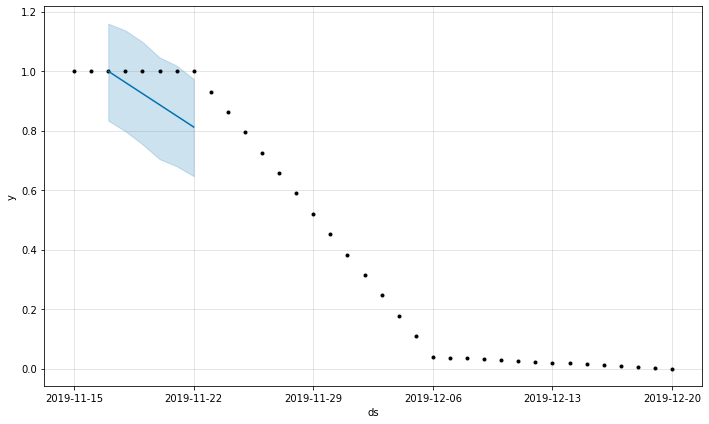

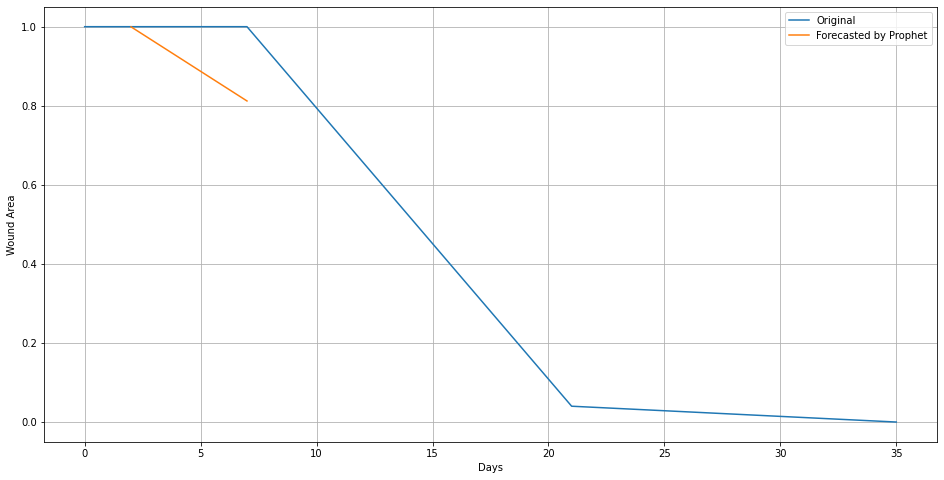

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 92
48
77
Initial log joint probability = -14.6828
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       346.695    0.00112612       88.2512   1.062e-05       0.001      111  LS failed, Hessian reset 
      99       347.196    0.00215928       109.108      0.4746      0.4746      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       348.229    0.00345332       165.795   3.995e-05       0.001      213  LS failed, Hessian reset 
     158       349.002   1.56023e-05       45.9474   3.211e-07       0.001      305  LS failed, Hessian reset 
     199       349.007   1.61054e-05       67.9314      0.4709      0.4709      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     249        349.48    0.00126266        83.008   1.356e-05       0.001      504  LS failed, Hessian reset 
     299       349.675   5.28465e-06       60.788

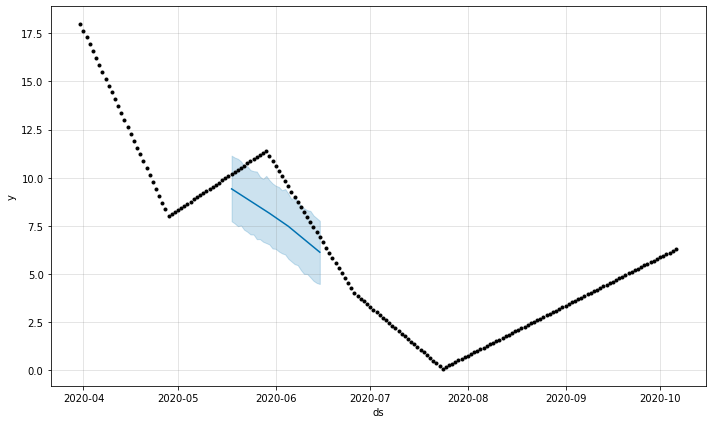

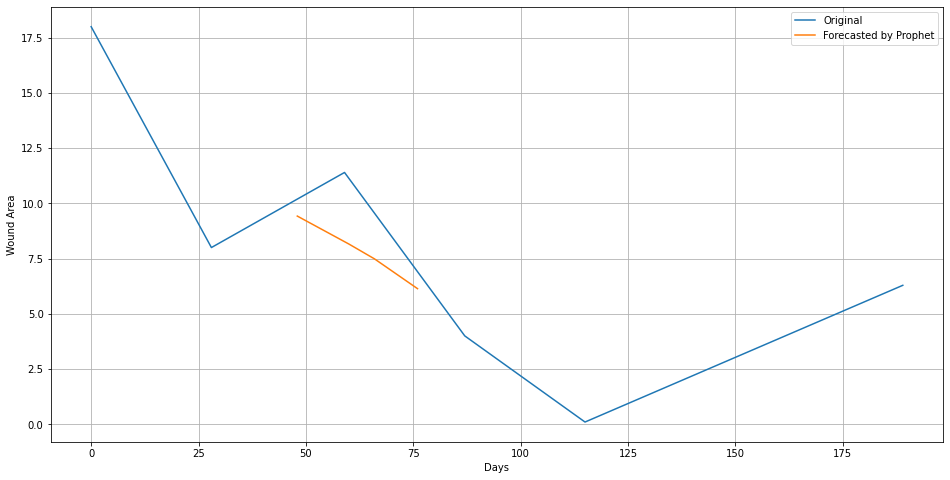

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 93
0
1
Wound: 94
0
1
Wound: 95
25
88
Initial log joint probability = -7.47395
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        820.41     0.0327042       125.739      0.2086      0.4992      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       825.333    0.00598567       121.719           1           1      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       826.413   0.000765543       126.674   7.278e-06       0.001      325  LS failed, Hessian reset 
     299       827.466   0.000730564       74.4066      0.7049      0.7049      432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     353        834.83   0.000697659       116.809   1.371e-05       0.001      540  LS failed, Hessian reset 
     399       835.637    0.00104925       71.6904      0.4783  

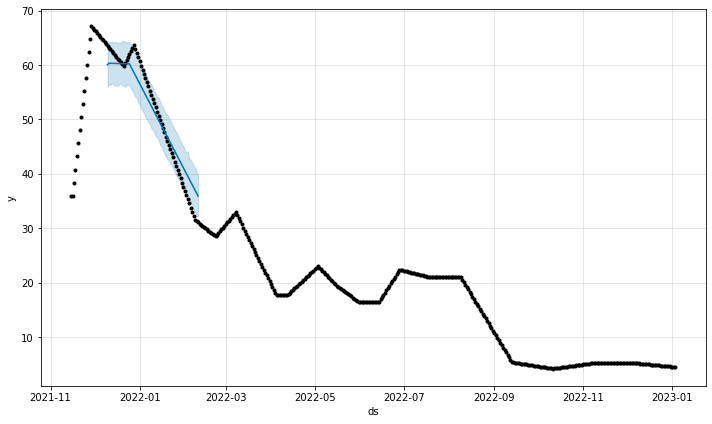

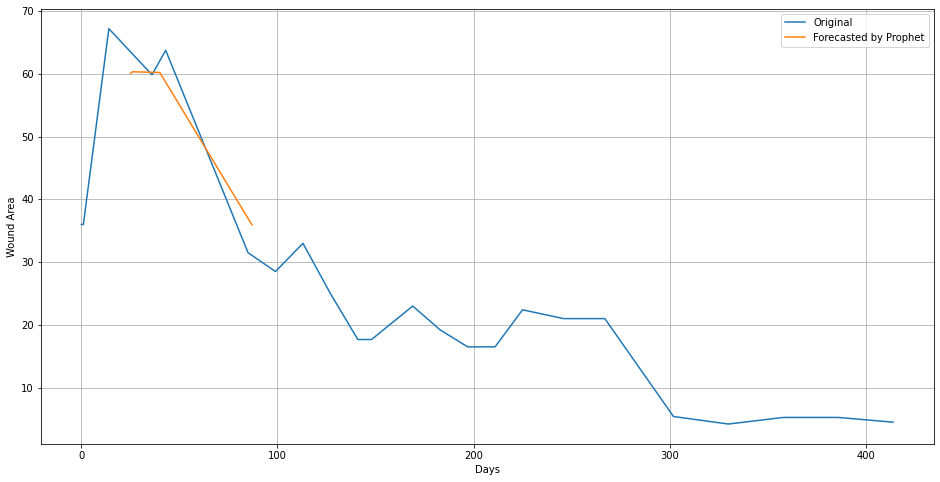

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 96
19
24

Initial log joint probability = -28.5436
Iteration  1. Log joint probability =    27.7339. Improved by 56.2775.
Iteration  2. Log joint probability =    48.6475. Improved by 20.9136.
Iteration  3. Log joint probability =    64.2034. Improved by 15.5558.
Iteration  4. Log joint probability =    72.0312. Improved by 7.82782.
Iteration  5. Log joint probability =    72.3543. Improved by 0.323121.
Iteration  6. Log joint probability =    72.3709. Improved by 0.0166021.
Iteration  7. Log joint probability =    72.4622. Improved by 0.0913325.
Iteration  8. Log joint probability =    72.5561. Improved by 0.0938715.
Iteration  9. Log joint probability =    72.6485. Improved by 0.0923852.
Iteration 10. Log joint probability =    85.8049. Improved by 13.1564.
Iteration 11. Log joint probability =    85.9129. Improved by 0.108.
Iteration 12. Log joint probability =    85.9337. Improved by 0.0207677.
Iteration 13. Log joint probability =    85.9472. Improved by 0.0135379.
Iteratio

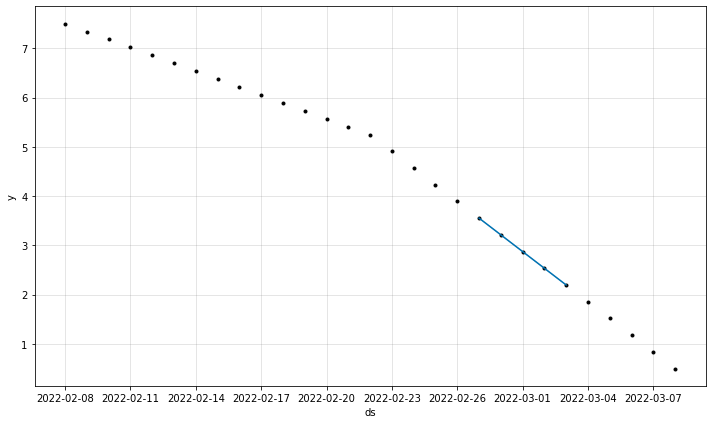

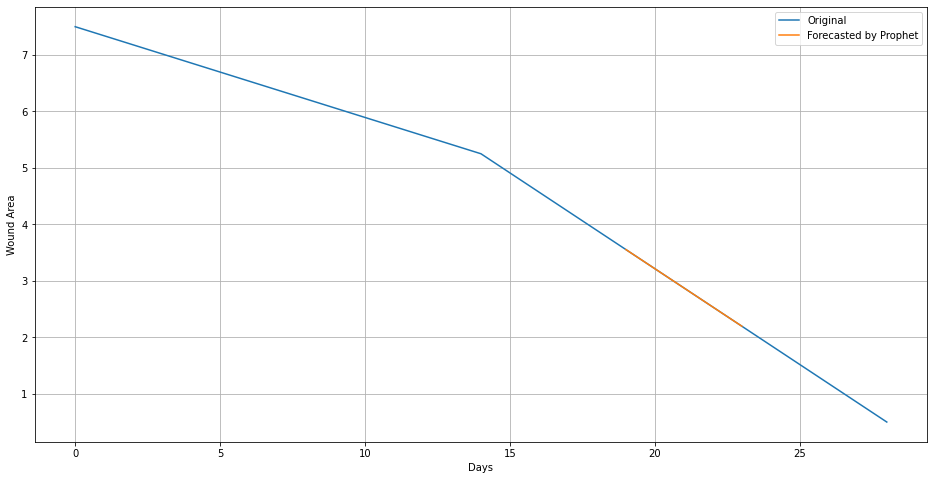

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 97
29
37

Initial log joint probability = -40.9095
Iteration  1. Log joint probability =    70.8649. Improved by 111.774.
Iteration  2. Log joint probability =    101.984. Improved by 31.1193.
Iteration  3. Log joint probability =    125.719. Improved by 23.735.
Iteration  4. Log joint probability =    126.678. Improved by 0.959055.
Iteration  5. Log joint probability =    131.981. Improved by 5.30274.
Iteration  6. Log joint probability =    132.072. Improved by 0.0908887.
Iteration  7. Log joint probability =    132.113. Improved by 0.0412164.
Iteration  8. Log joint probability =    132.178. Improved by 0.0645297.
Iteration  9. Log joint probability =    132.233. Improved by 0.0553013.
Iteration 10. Log joint probability =     132.49. Improved by 0.257106.
Iteration 11. Log joint probability =    132.581. Improved by 0.0906351.
Iteration 12. Log joint probability =    132.686. Improved by 0.105168.
Iteration 13. Log joint probability =    132.849. Improved by 0.162961.
Iterat

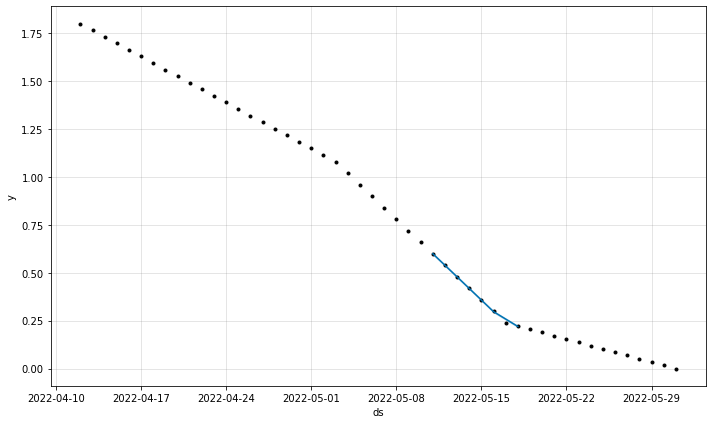

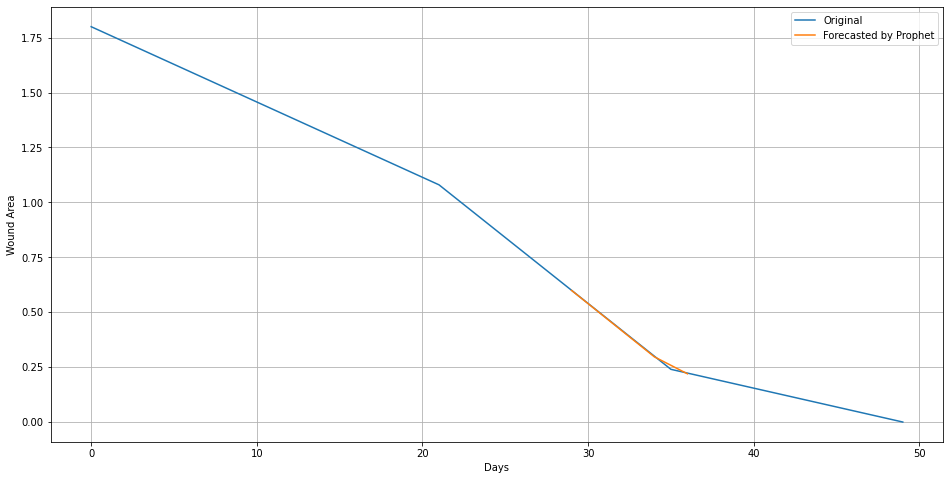

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 98
1
5

Initial log joint probability = -35.8712
Iteration  1. Log joint probability =     21.644. Improved by 57.5152.
Iteration  2. Log joint probability =     41.773. Improved by 20.129.
Iteration  3. Log joint probability =    54.1526. Improved by 12.3796.
Iteration  4. Log joint probability =    59.1083. Improved by 4.95572.
Iteration  5. Log joint probability =    59.5886. Improved by 0.480205.
Iteration  6. Log joint probability =    59.6275. Improved by 0.0389844.
Iteration  7. Log joint probability =    59.6489. Improved by 0.0214116.
Iteration  8. Log joint probability =    59.7095. Improved by 0.0605888.
Iteration  9. Log joint probability =    59.7547. Improved by 0.0451639.
Iteration 10. Log joint probability =    60.1103. Improved by 0.355572.
Iteration 11. Log joint probability =    66.7463. Improved by 6.63601.
Iteration 12. Log joint probability =     66.766. Improved by 0.0197259.
Iteration 13. Log joint probability =    67.0449. Improved by 0.278891.
Iteration

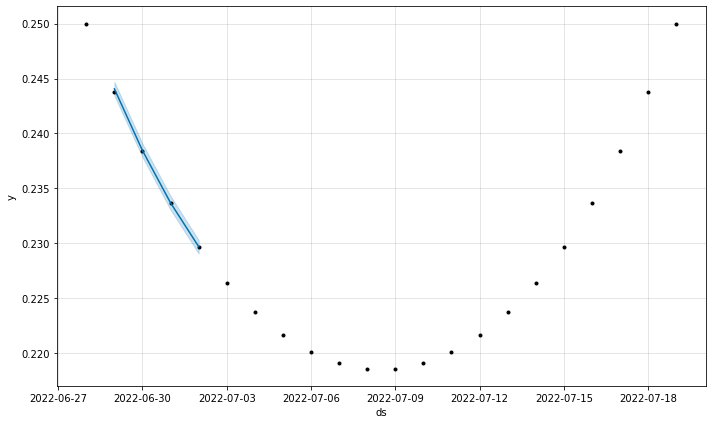

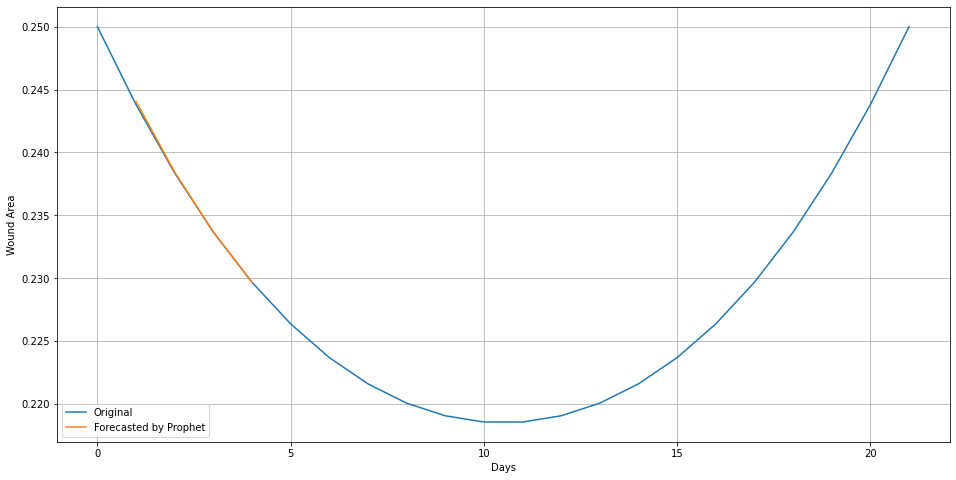

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 99
27
40

Initial log joint probability = -73.1725
Iteration  1. Log joint probability =    108.195. Improved by 181.367.
Iteration  2. Log joint probability =    161.308. Improved by 53.1137.
Iteration  3. Log joint probability =    173.383. Improved by 12.075.
Iteration  4. Log joint probability =    283.238. Improved by 109.855.
Iteration  5. Log joint probability =    319.179. Improved by 35.9409.
Iteration  6. Log joint probability =    321.318. Improved by 2.13907.
Iteration  7. Log joint probability =    325.882. Improved by 4.56373.
Iteration  8. Log joint probability =     331.27. Improved by 5.38757.
Iteration  9. Log joint probability =    332.997. Improved by 1.7272.
Iteration 10. Log joint probability =    334.542. Improved by 1.54484.
Iteration 11. Log joint probability =    335.648. Improved by 1.10609.
Iteration 12. Log joint probability =    335.771. Improved by 0.123388.
Iteration 13. Log joint probability =    336.434. Improved by 0.662487.
Iteration 14. Log j

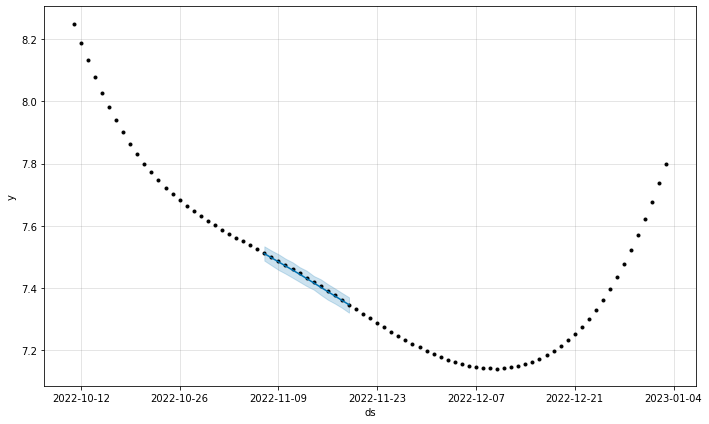

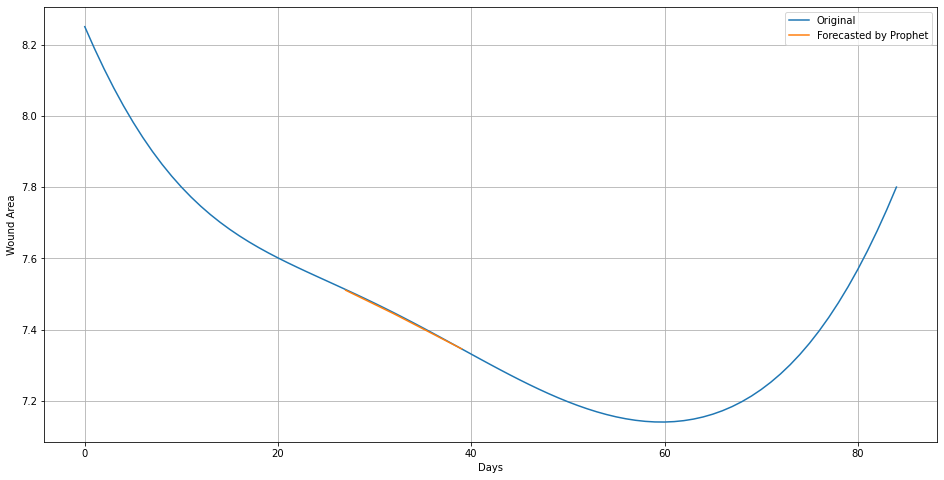

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 100
88
111
Initial log joint probability = -5.4134
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       175.194   3.05222e-05       70.0812      0.7152      0.7152      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       175.233   7.60884e-05       92.7479   9.515e-07       0.001      251  LS failed, Hessian reset 
     199       175.238   1.91011e-07       80.5063           1           1      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       175.239   6.09342e-07       83.5917   7.645e-09       0.001      338  LS failed, Hessian reset 
     221       175.239   8.66592e-09        75.916      0.8741      0.8741      355   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


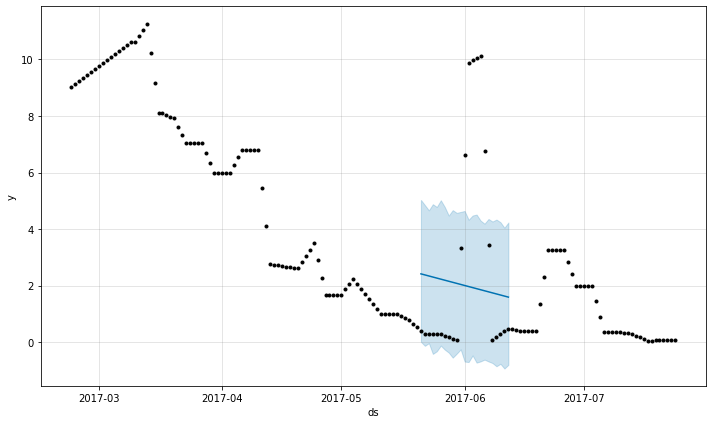

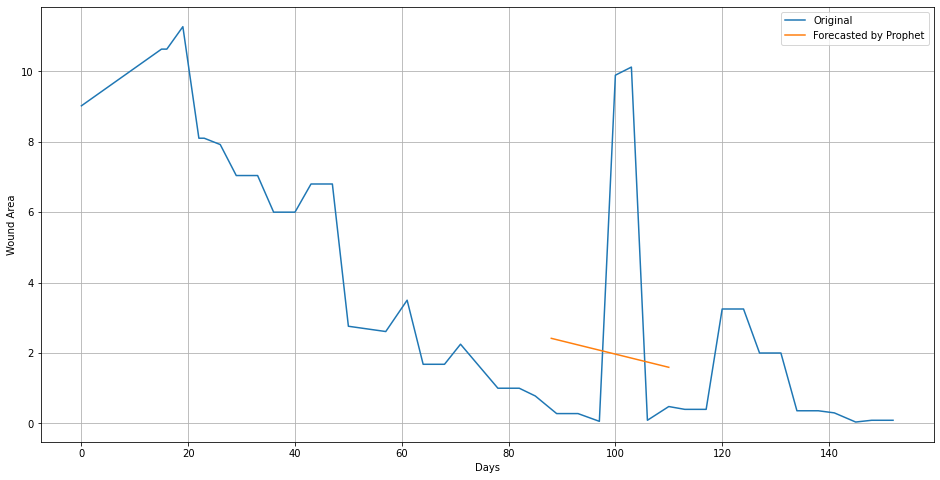

Wound: 101
721
891
Initial log joint probability = -61.8032
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1529.2     0.0324659       190.212       9.657      0.9657      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       1531.63     0.0103305       94.3345   8.867e-05       0.001      217  LS failed, Hessian reset 
     192       1532.19   0.000250782       90.7915   3.294e-06       0.001      329  LS failed, Hessian reset 
     199       1532.22   0.000103794       61.1898      0.5037           1      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       1532.23   3.39693e-08       70.4508      0.3141           1      382   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


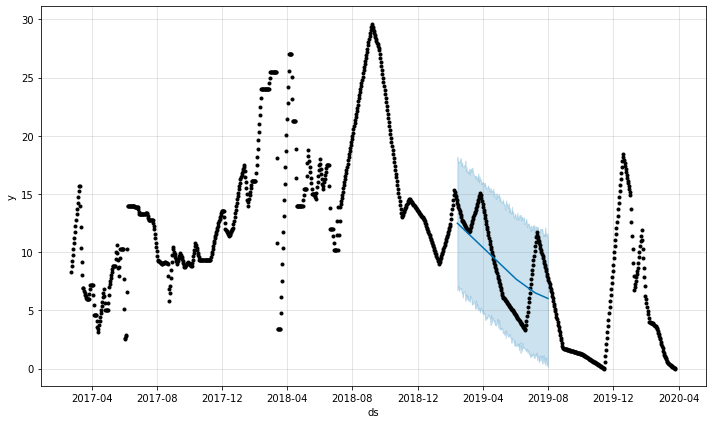

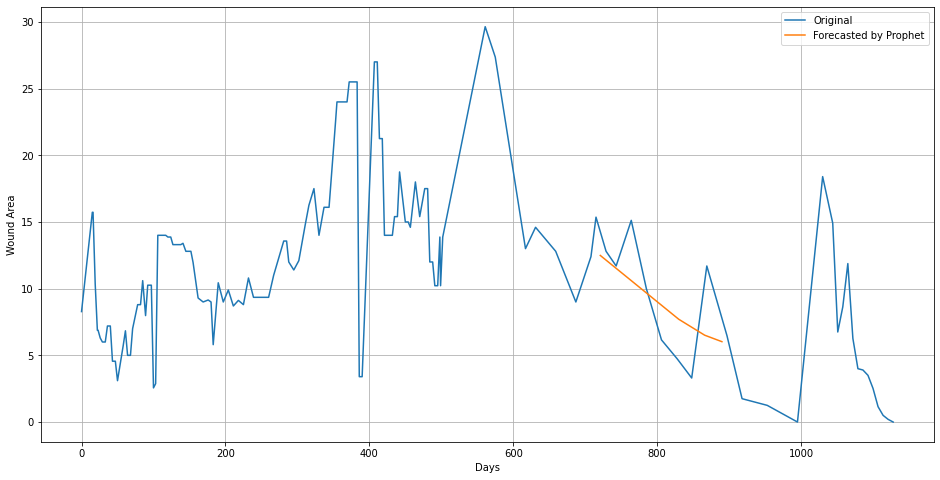

Wound: 102
36
190
Initial log joint probability = -170.78
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1929.9    0.00296143       91.6789           1           1      142   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       1933.62   0.000982256       190.938   8.276e-06       0.001      219  LS failed, Hessian reset 
     199       1935.16   8.90383e-05       81.5972           1           1      315   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233        1935.2   6.10816e-05       74.8516   7.291e-07       0.001      393  LS failed, Hessian reset 
     299       1935.21   1.65383e-05       89.4432           1           1      473   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     357       1937.01    0.00170377       149.698   1.736e-05       0.001      630  LS fai

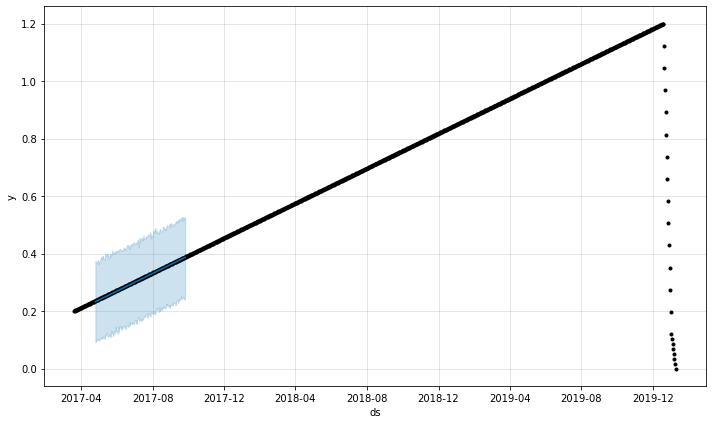

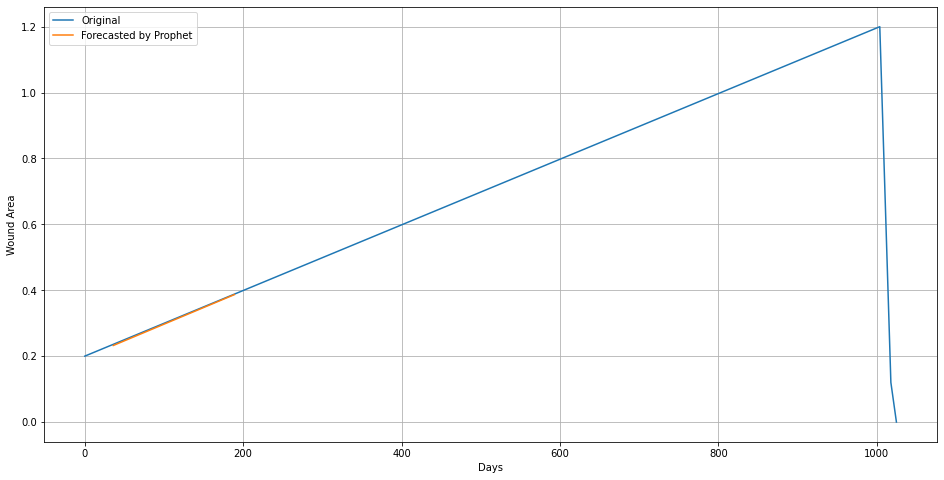

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 103
8
12

Initial log joint probability = -36.5513
Iteration  1. Log joint probability =    13.0237. Improved by 49.575.
Iteration  2. Log joint probability =    22.4596. Improved by 9.43587.
Iteration  3. Log joint probability =    22.5358. Improved by 0.0761872.
Iteration  4. Log joint probability =    24.0812. Improved by 1.54548.
Iteration  5. Log joint probability =    24.0983. Improved by 0.0170982.
Iteration  6. Log joint probability =    24.1354. Improved by 0.037078.
Iteration  7. Log joint probability =     24.154. Improved by 0.0185367.
Iteration  8. Log joint probability =    24.1889. Improved by 0.034903.
Iteration  9. Log joint probability =    24.2122. Improved by 0.0233509.
Iteration 10. Log joint probability =    24.2424. Improved by 0.0302263.
Iteration 11. Log joint probability =    24.3067. Improved by 0.0642186.
Iteration 12. Log joint probability =    24.3085. Improved by 0.00187875.
Iteration 13. Log joint probability =    24.3766. Improved by 0.0680894.
I

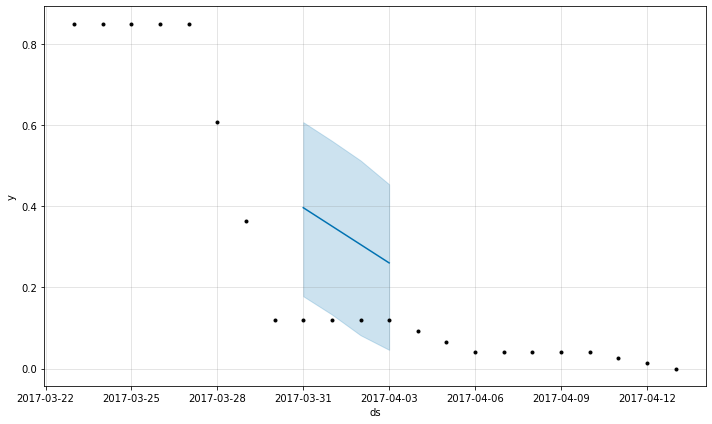

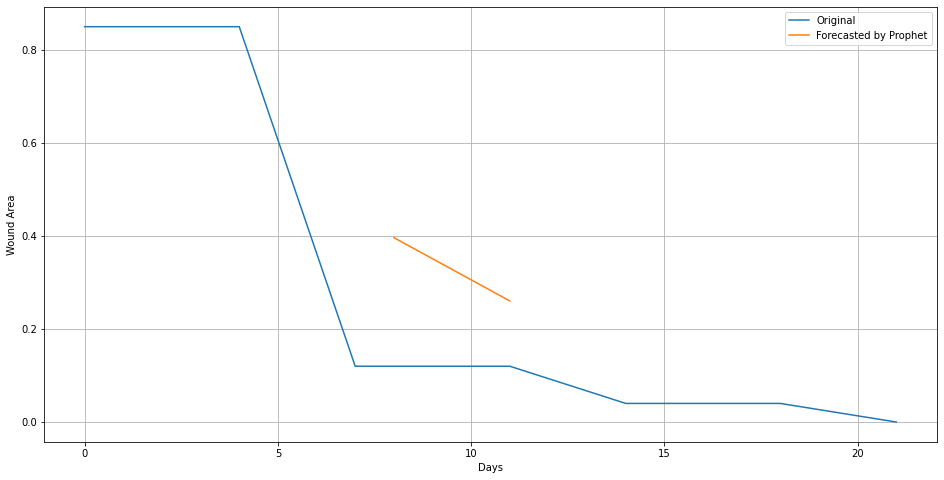

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 104
4
7

Initial log joint probability = -40.8821
Iteration  1. Log joint probability =    30.1503. Improved by 71.0325.
Iteration  2. Log joint probability =    32.2941. Improved by 2.14381.
Iteration  3. Log joint probability =    48.4459. Improved by 16.1518.
Iteration  4. Log joint probability =    56.9358. Improved by 8.48992.
Iteration  5. Log joint probability =    60.6902. Improved by 3.75441.
Iteration  6. Log joint probability =    70.7417. Improved by 10.0515.
Iteration  7. Log joint probability =    75.2168. Improved by 4.47504.
Iteration  8. Log joint probability =    85.6458. Improved by 10.4291.
Iteration  9. Log joint probability =    98.7461. Improved by 13.1003.
Iteration 10. Log joint probability =    109.967. Improved by 11.2206.
Iteration 11. Log joint probability =    122.169. Improved by 12.2022.
Iteration 12. Log joint probability =    130.924. Improved by 8.75518.
Iteration 13. Log joint probability =     132.73. Improved by 1.80636.
Iteration 14. Log jo

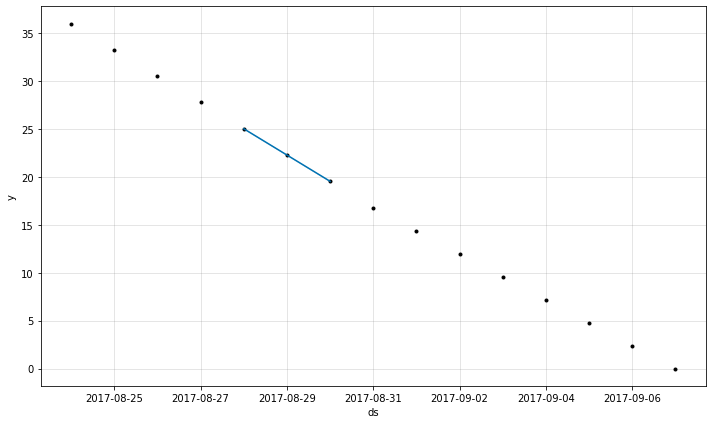

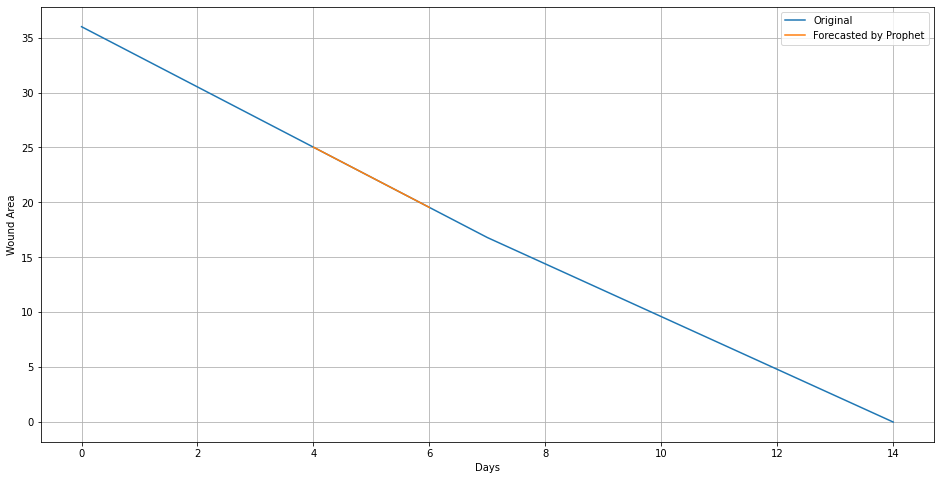

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 105
197
256
Initial log joint probability = -78.3738
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       501.705    0.00102629        83.302      0.3174           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       503.117   0.000956906       64.7266   1.507e-05       0.001      269  LS failed, Hessian reset 
     199       503.312    0.00365314       85.9262      0.5794           1      289   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       503.887   6.08388e-07       57.7105      0.5677      0.5677      416   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       503.888   2.53363e-08       70.5868     0.06451           1      446   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


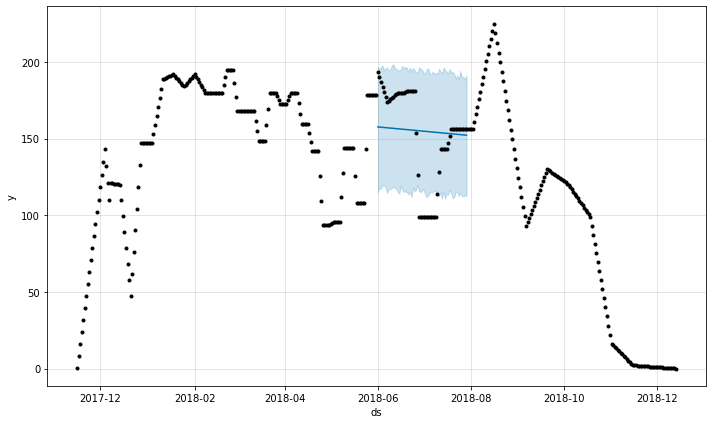

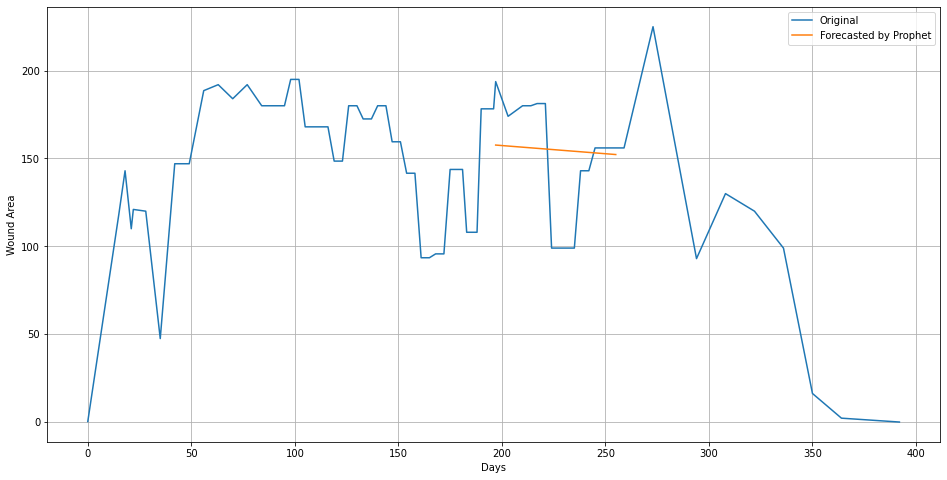

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 106
96
131
Initial log joint probability = -8.66778
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       264.008    0.00408938       99.1624   4.539e-05       0.001      111  LS failed, Hessian reset 
      99       264.254   6.35527e-06       98.6357      0.2628           1      159   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       264.264   7.44972e-05       86.4093   8.832e-07       0.001      220  LS failed, Hessian reset 
     167       264.274   1.32599e-07       75.9636   1.443e-09       0.001      337  LS failed, Hessian reset 
     171       264.274    4.0508e-09       82.7008      0.2749      0.2749      342   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


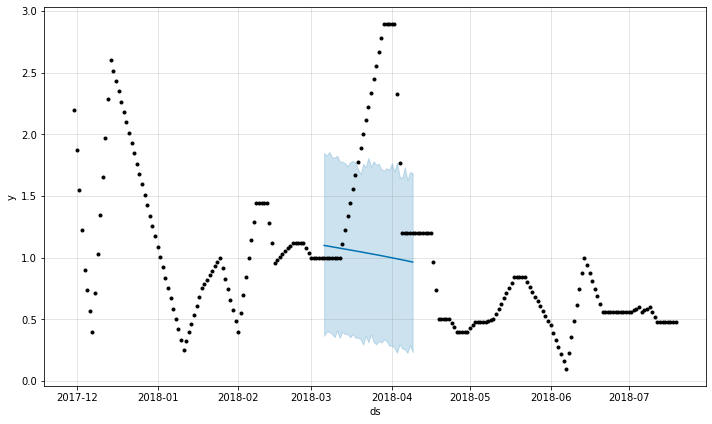

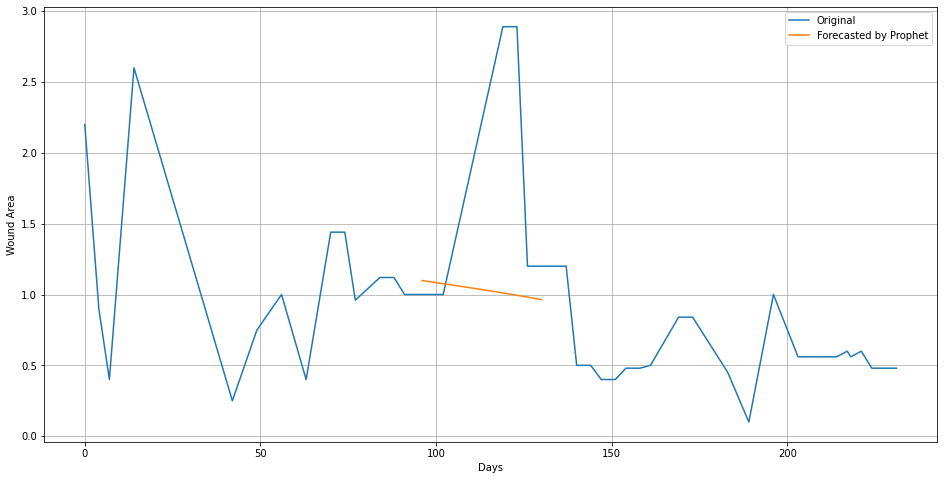

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 107
52
64

Initial log joint probability = -73.1837
Iteration  1. Log joint probability =    34.1114. Improved by 107.295.
Iteration  2. Log joint probability =    48.0595. Improved by 13.9481.
Iteration  3. Log joint probability =    48.5736. Improved by 0.514108.
Iteration  4. Log joint probability =     48.676. Improved by 0.102419.
Iteration  5. Log joint probability =    48.7244. Improved by 0.0483544.
Iteration  6. Log joint probability =    48.7612. Improved by 0.0368347.
Iteration  7. Log joint probability =     48.772. Improved by 0.0107501.
Iteration  8. Log joint probability =    48.7798. Improved by 0.00781478.
Iteration  9. Log joint probability =    48.7818. Improved by 0.00206535.
Iteration 10. Log joint probability =    48.7846. Improved by 0.00279489.
Iteration 11. Log joint probability =    48.7952. Improved by 0.0105517.
Iteration 12. Log joint probability =    48.8033. Improved by 0.00815621.
Iteration 13. Log joint probability =    48.8038. Improved by 0.000

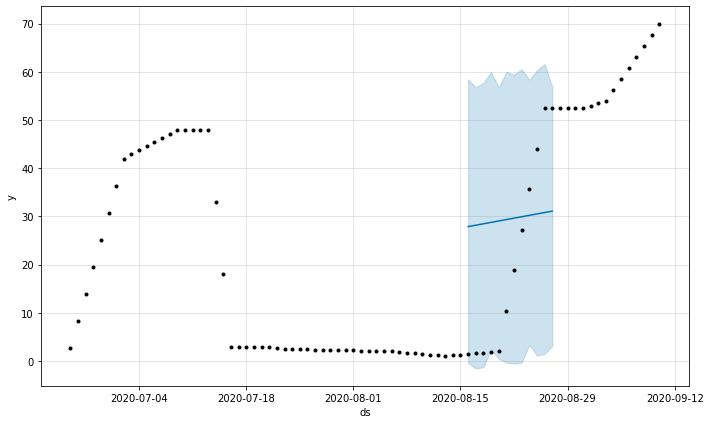

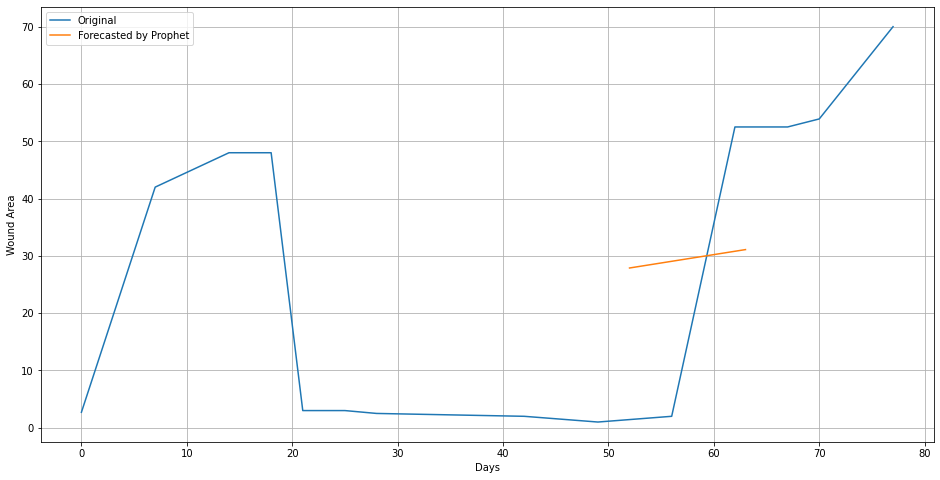

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 108
18
29

Initial log joint probability = -61.0683
Iteration  1. Log joint probability =    78.0475. Improved by 139.116.
Iteration  2. Log joint probability =    93.7379. Improved by 15.6903.
Iteration  3. Log joint probability =     93.762. Improved by 0.0241261.
Iteration  4. Log joint probability =    93.7869. Improved by 0.0248913.
Iteration  5. Log joint probability =    93.8239. Improved by 0.0369687.
Iteration  6. Log joint probability =    94.1701. Improved by 0.346253.
Iteration  7. Log joint probability =     94.186. Improved by 0.0159277.
Iteration  8. Log joint probability =    94.2033. Improved by 0.017303.
Iteration  9. Log joint probability =    94.2514. Improved by 0.0480066.
Iteration 10. Log joint probability =    94.2816. Improved by 0.0302801.
Iteration 11. Log joint probability =    94.2927. Improved by 0.011109.
Iteration 12. Log joint probability =    94.3206. Improved by 0.0278226.
Iteration 13. Log joint probability =    94.3993. Improved by 0.0786991.

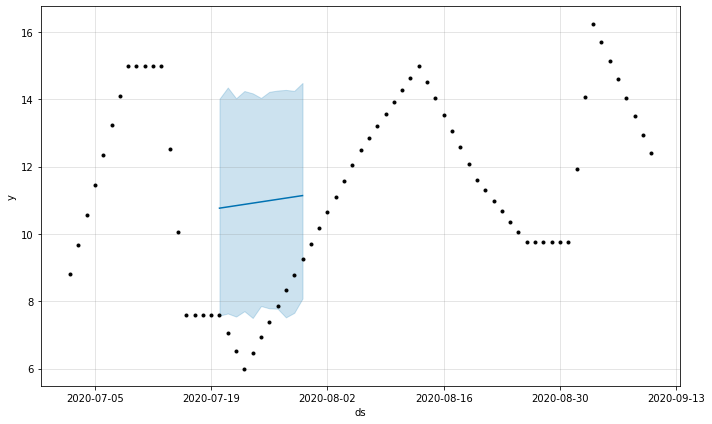

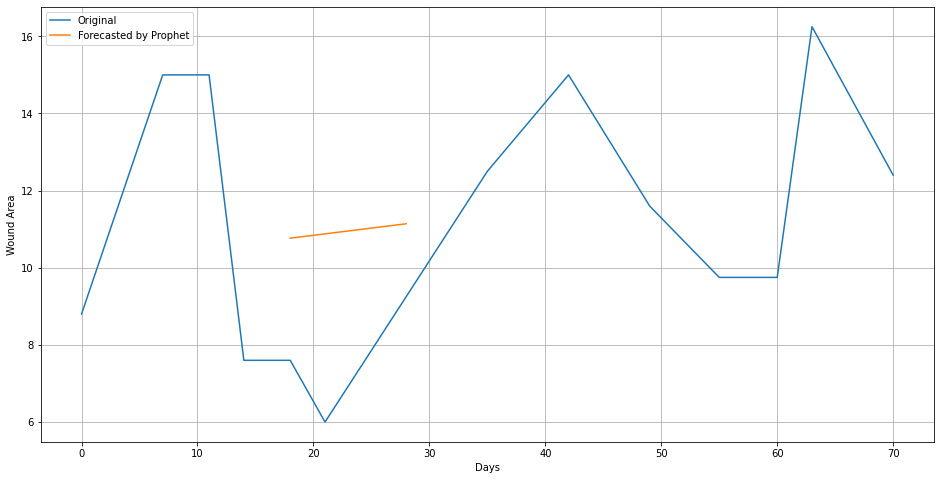

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 21.


Wound: 109
9
14

Initial log joint probability = -30.7289
Iteration  1. Log joint probability =    18.8423. Improved by 49.5712.
Iteration  2. Log joint probability =    30.0521. Improved by 11.2098.
Iteration  3. Log joint probability =    30.8078. Improved by 0.755689.
Iteration  4. Log joint probability =    31.0548. Improved by 0.246994.
Iteration  5. Log joint probability =    31.0866. Improved by 0.0317774.
Iteration  6. Log joint probability =    31.1078. Improved by 0.0211445.
Iteration  7. Log joint probability =     31.215. Improved by 0.107222.
Iteration  8. Log joint probability =    31.2916. Improved by 0.0765946.
Iteration  9. Log joint probability =    31.3309. Improved by 0.0393678.
Iteration 10. Log joint probability =    31.3401. Improved by 0.00918803.
Iteration 11. Log joint probability =    31.3636. Improved by 0.0234412.
Iteration 12. Log joint probability =    31.3657. Improved by 0.00215363.
Iteration 13. Log joint probability =    31.3705. Improved by 0.0047692

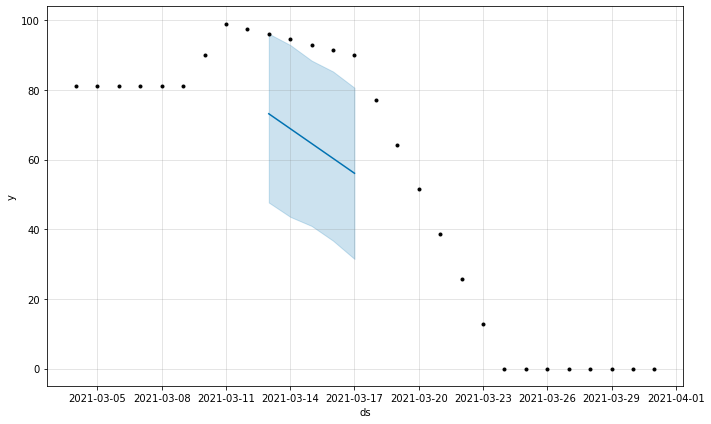

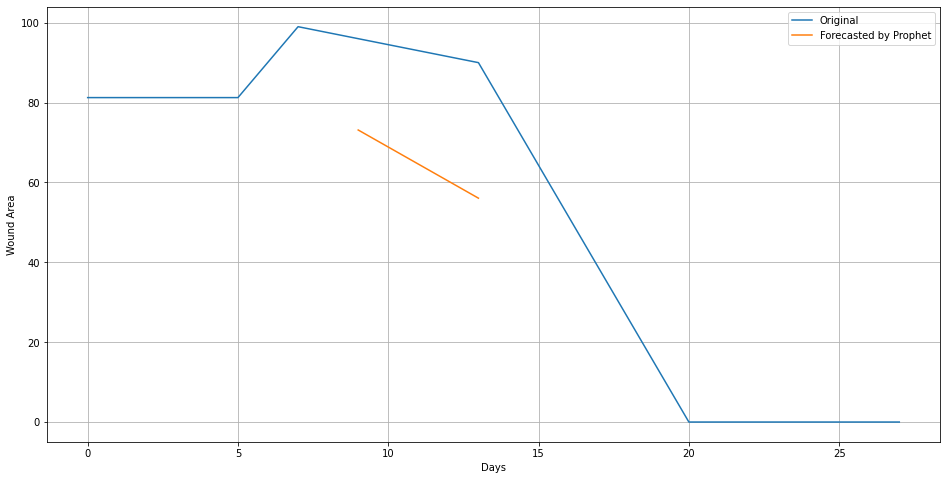

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 110
31
42

Initial log joint probability = -60.2266
Iteration  1. Log joint probability =    63.9875. Improved by 124.214.
Iteration  2. Log joint probability =    102.206. Improved by 38.2189.
Iteration  3. Log joint probability =    112.502. Improved by 10.2954.
Iteration  4. Log joint probability =    112.672. Improved by 0.170016.
Iteration  5. Log joint probability =    112.938. Improved by 0.266361.
Iteration  6. Log joint probability =    112.992. Improved by 0.0536094.
Iteration  7. Log joint probability =    113.054. Improved by 0.0618426.
Iteration  8. Log joint probability =    113.109. Improved by 0.0551341.
Iteration  9. Log joint probability =    113.172. Improved by 0.0628153.
Iteration 10. Log joint probability =    120.103. Improved by 6.93165.
Iteration 11. Log joint probability =    122.788. Improved by 2.68439.
Iteration 12. Log joint probability =    124.049. Improved by 1.26167.
Iteration 13. Log joint probability =    124.167. Improved by 0.118151.
Iterati

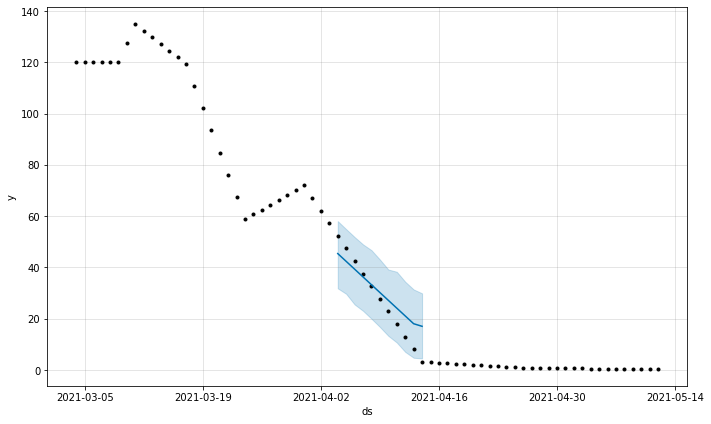

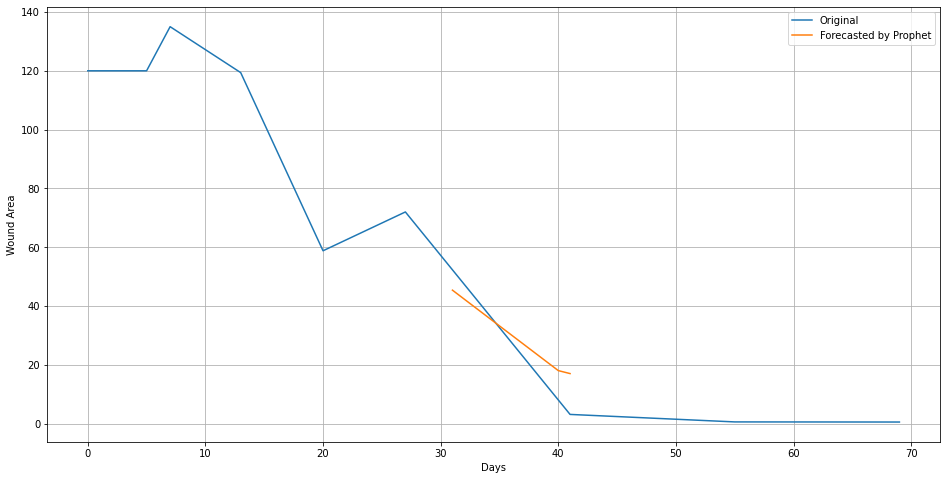

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 111
202
269
Initial log joint probability = -13.7322
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       541.927    0.00163389       58.3368      0.4902      0.4902      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       543.182   0.000569328       66.9099           1           1      269   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256       544.023   9.58437e-05       64.9054   1.217e-06       0.001      376  LS failed, Hessian reset 
     292       544.028   6.97024e-09       71.6908      0.1325      0.1325      429   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


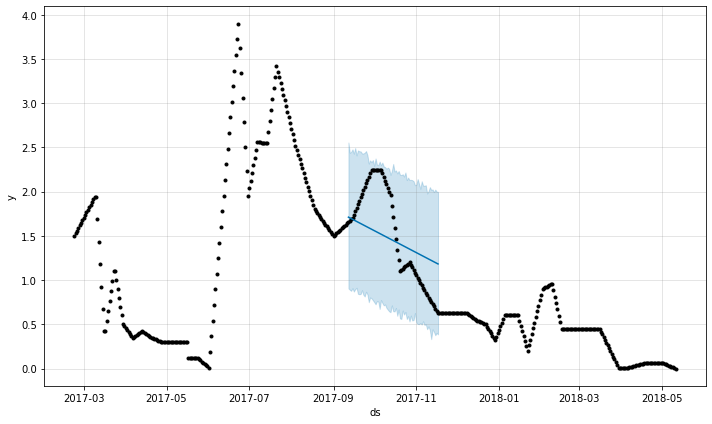

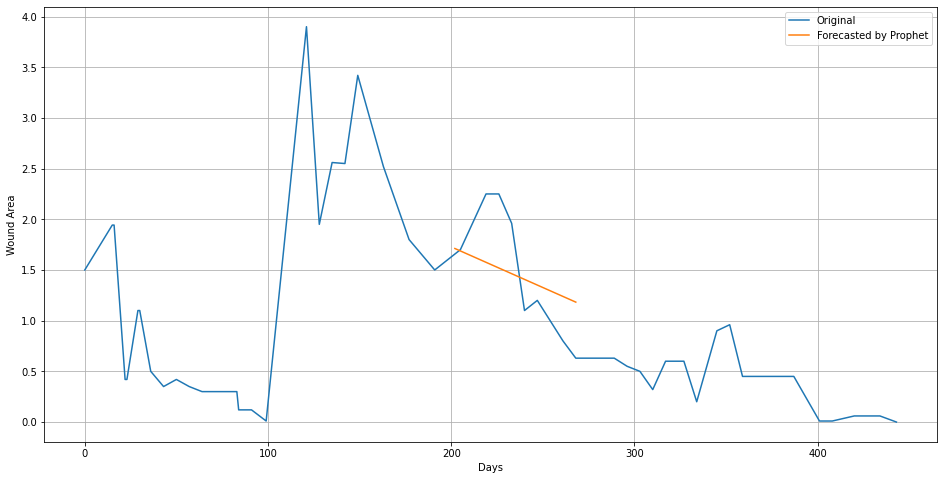

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 112
4
7

Initial log joint probability = -41.2953
Iteration  1. Log joint probability =    3.23006. Improved by 44.5254.
Iteration  2. Log joint probability =    19.3029. Improved by 16.0729.
Iteration  3. Log joint probability =    20.8875. Improved by 1.58454.
Iteration  4. Log joint probability =    22.0105. Improved by 1.12306.
Iteration  5. Log joint probability =    22.3006. Improved by 0.290116.
Iteration  6. Log joint probability =    22.4051. Improved by 0.104453.
Iteration  7. Log joint probability =    22.5352. Improved by 0.130098.
Iteration  8. Log joint probability =    22.5659. Improved by 0.0307569.
Iteration  9. Log joint probability =    22.6162. Improved by 0.0502111.
Iteration 10. Log joint probability =     22.647. Improved by 0.0308045.
Iteration 11. Log joint probability =     22.684. Improved by 0.0370545.
Iteration 12. Log joint probability =    22.7949. Improved by 0.110922.
Iteration 13. Log joint probability =    22.8334. Improved by 0.0384916.
Iterat

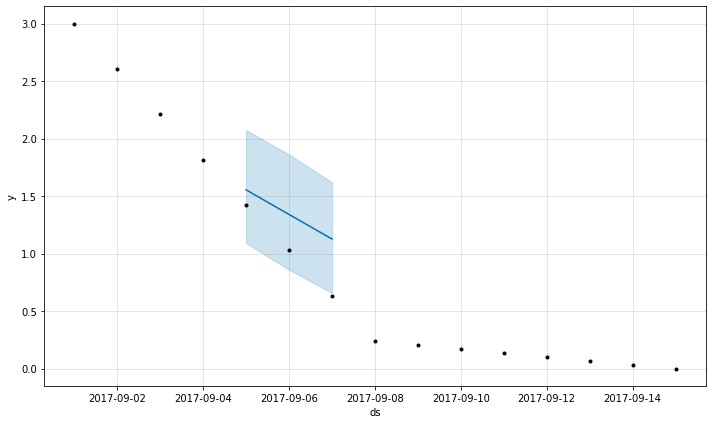

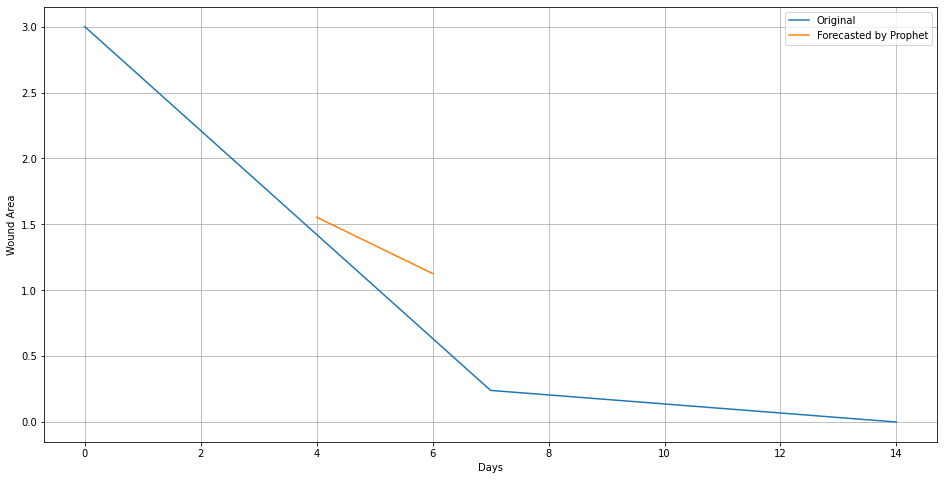

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 113
15
22

Initial log joint probability = -32.7002
Iteration  1. Log joint probability =    46.8756. Improved by 79.5758.
Iteration  2. Log joint probability =    56.6031. Improved by 9.72752.
Iteration  3. Log joint probability =    89.5311. Improved by 32.928.
Iteration  4. Log joint probability =    89.8383. Improved by 0.307216.
Iteration  5. Log joint probability =     89.877. Improved by 0.0387242.
Iteration  6. Log joint probability =    90.6787. Improved by 0.801731.
Iteration  7. Log joint probability =    96.9045. Improved by 6.2258.
Iteration  8. Log joint probability =    98.1526. Improved by 1.24812.
Iteration  9. Log joint probability =    98.7058. Improved by 0.553203.
Iteration 10. Log joint probability =    98.7202. Improved by 0.0143873.
Iteration 11. Log joint probability =    98.8677. Improved by 0.147418.
Iteration 12. Log joint probability =    99.0002. Improved by 0.132497.
Iteration 13. Log joint probability =    99.0744. Improved by 0.0742163.
Iteration

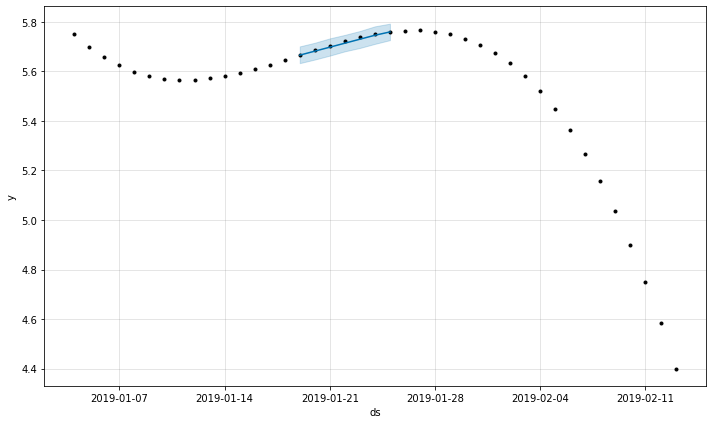

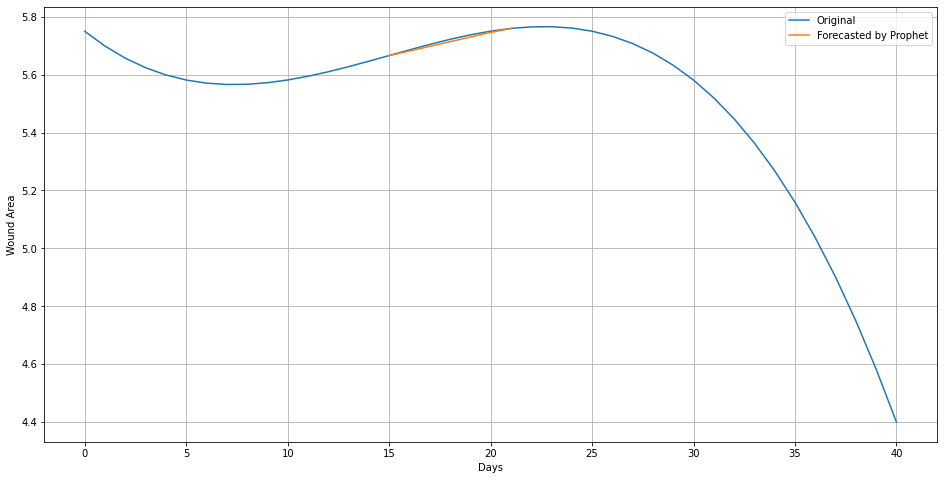

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 114
28
34

Initial log joint probability = -35.0483
Iteration  1. Log joint probability =    14.9283. Improved by 49.9766.
Iteration  2. Log joint probability =    31.3982. Improved by 16.4699.
Iteration  3. Log joint probability =    31.9396. Improved by 0.541477.
Iteration  4. Log joint probability =    31.9483. Improved by 0.00861793.
Iteration  5. Log joint probability =    32.0116. Improved by 0.0633107.
Iteration  6. Log joint probability =    32.0867. Improved by 0.0751367.
Iteration  7. Log joint probability =    32.1073. Improved by 0.0206223.
Iteration  8. Log joint probability =    32.1258. Improved by 0.0184822.
Iteration  9. Log joint probability =    32.1298. Improved by 0.00399672.
Iteration 10. Log joint probability =     32.132. Improved by 0.0022149.
Iteration 11. Log joint probability =    32.1478. Improved by 0.0157538.
Iteration 12. Log joint probability =    32.1503. Improved by 0.00246816.
Iteration 13. Log joint probability =    32.1539. Improved by 0.003

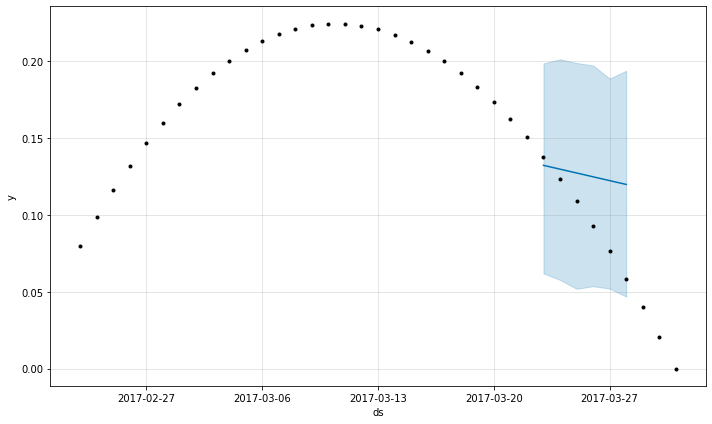

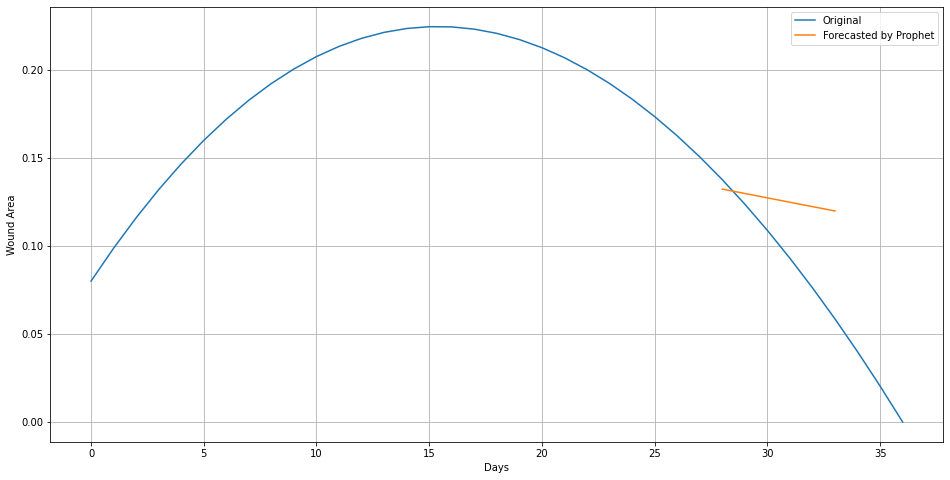

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 115
5
12

Initial log joint probability = -34.4943
Iteration  1. Log joint probability =    55.1647. Improved by 89.659.
Iteration  2. Log joint probability =    73.4162. Improved by 18.2515.
Iteration  3. Log joint probability =     81.185. Improved by 7.76881.
Iteration  4. Log joint probability =    89.9083. Improved by 8.72333.
Iteration  5. Log joint probability =    90.0955. Improved by 0.187192.
Iteration  6. Log joint probability =    90.4164. Improved by 0.320879.
Iteration  7. Log joint probability =    90.4739. Improved by 0.0574945.
Iteration  8. Log joint probability =    90.4828. Improved by 0.00894031.
Iteration  9. Log joint probability =    90.5538. Improved by 0.07096.
Iteration 10. Log joint probability =    90.6747. Improved by 0.120909.
Iteration 11. Log joint probability =    90.8748. Improved by 0.200054.
Iteration 12. Log joint probability =    90.9094. Improved by 0.0346985.
Iteration 13. Log joint probability =    90.9525. Improved by 0.0430147.
Iterati

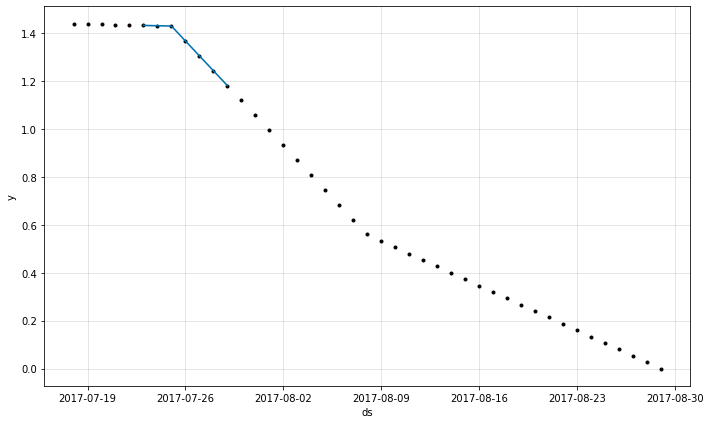

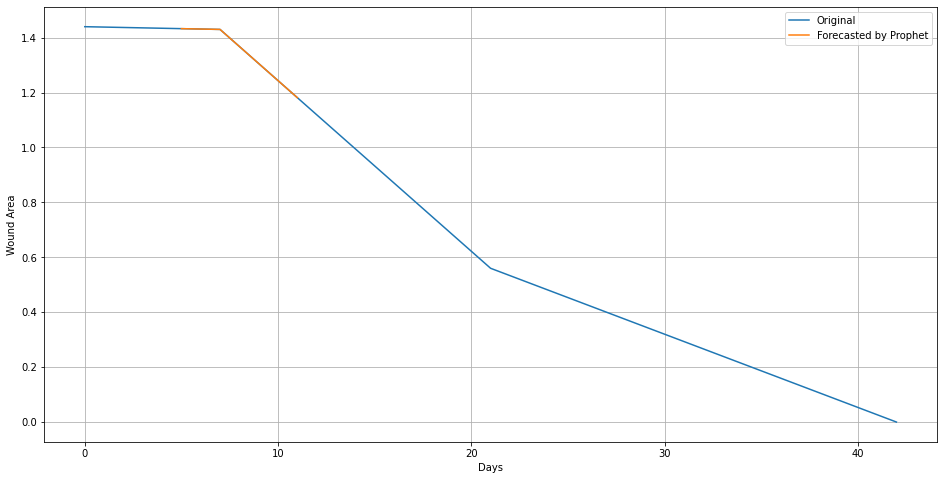

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 116
26
32

Initial log joint probability = -28.4674
Iteration  1. Log joint probability =    15.4996. Improved by 43.967.
Iteration  2. Log joint probability =    51.9469. Improved by 36.4473.
Iteration  3. Log joint probability =    71.6569. Improved by 19.71.
Iteration  4. Log joint probability =    75.3762. Improved by 3.71935.
Iteration  5. Log joint probability =    75.4301. Improved by 0.053862.
Iteration  6. Log joint probability =    75.5052. Improved by 0.0751388.
Iteration  7. Log joint probability =    75.5142. Improved by 0.00897324.
Iteration  8. Log joint probability =    75.5314. Improved by 0.0172131.
Iteration  9. Log joint probability =    75.5401. Improved by 0.00866876.
Iteration 10. Log joint probability =    75.6808. Improved by 0.140688.
Iteration 11. Log joint probability =    75.6946. Improved by 0.0138775.
Iteration 12. Log joint probability =     76.442. Improved by 0.747365.
Iteration 13. Log joint probability =     77.683. Improved by 1.24103.
Iterat

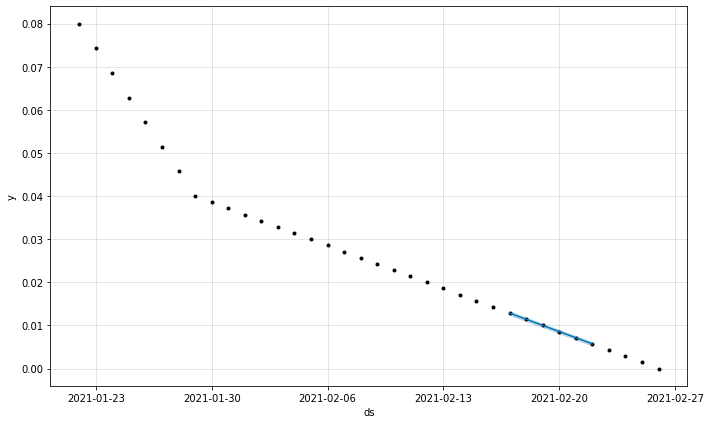

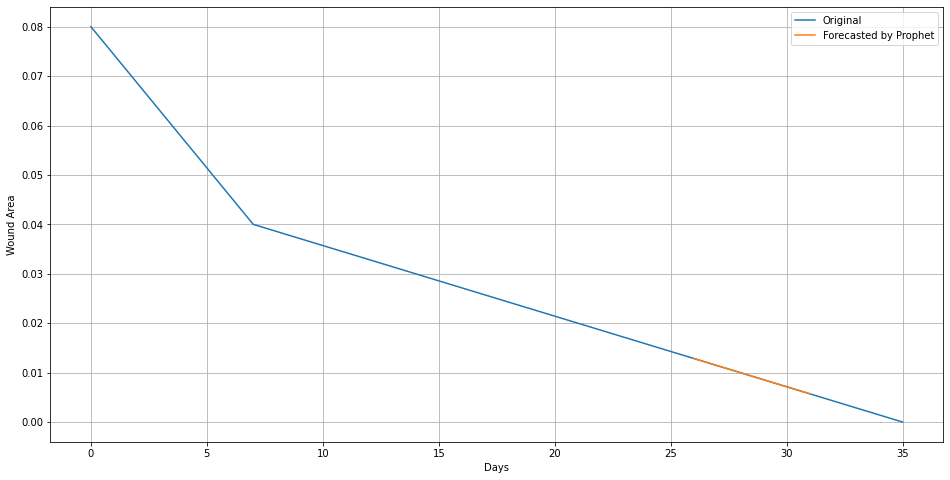

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 117
40
54

Initial log joint probability = -87.0491
Iteration  1. Log joint probability =    58.3777. Improved by 145.427.
Iteration  2. Log joint probability =    102.813. Improved by 44.4353.
Iteration  3. Log joint probability =    121.789. Improved by 18.9762.
Iteration  4. Log joint probability =    122.511. Improved by 0.721359.
Iteration  5. Log joint probability =    122.519. Improved by 0.00889085.
Iteration  6. Log joint probability =    122.565. Improved by 0.0459529.
Iteration  7. Log joint probability =    138.277. Improved by 15.7117.
Iteration  8. Log joint probability =    138.371. Improved by 0.0939789.
Iteration  9. Log joint probability =    138.406. Improved by 0.0353078.
Iteration 10. Log joint probability =     138.45. Improved by 0.0437266.
Iteration 11. Log joint probability =    138.554. Improved by 0.104206.
Iteration 12. Log joint probability =      138.7. Improved by 0.14589.
Iteration 13. Log joint probability =    138.818. Improved by 0.11803.
Itera

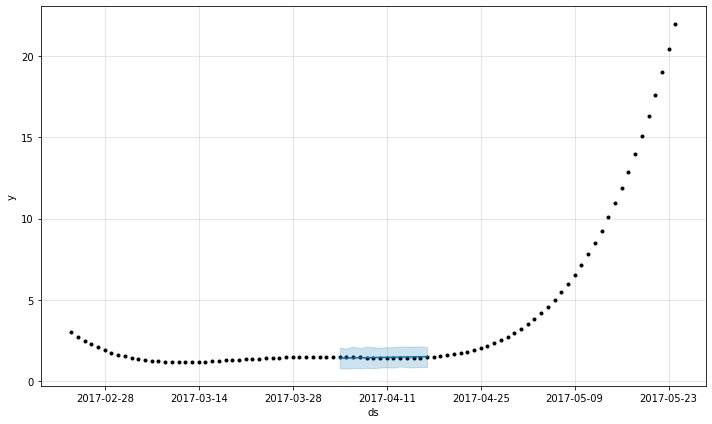

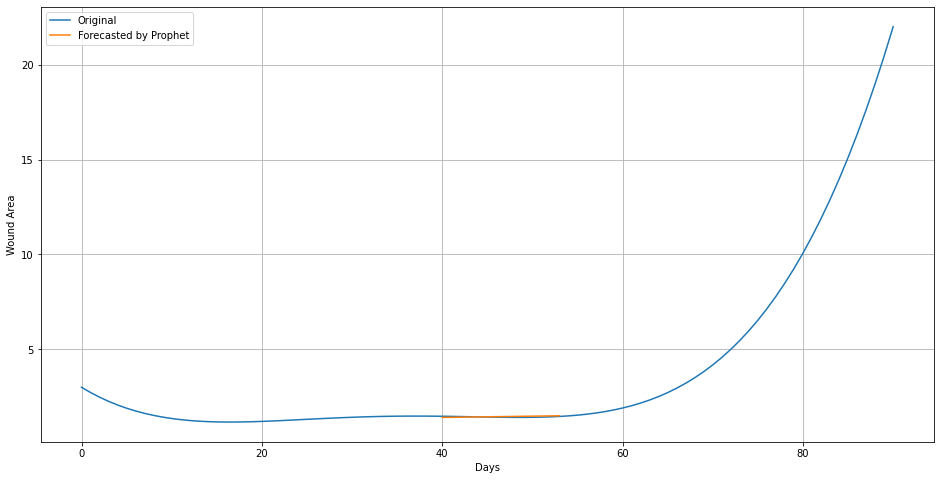

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


Wound: 118
7
12

Initial log joint probability = -27.4643
Iteration  1. Log joint probability =    25.0192. Improved by 52.4835.
Iteration  2. Log joint probability =    32.3536. Improved by 7.33444.
Iteration  3. Log joint probability =    54.4709. Improved by 22.1173.
Iteration  4. Log joint probability =    58.6583. Improved by 4.18736.
Iteration  5. Log joint probability =    58.6968. Improved by 0.0385309.
Iteration  6. Log joint probability =    58.7175. Improved by 0.0207221.
Iteration  7. Log joint probability =      58.74. Improved by 0.0224486.
Iteration  8. Log joint probability =    58.7456. Improved by 0.00558784.
Iteration  9. Log joint probability =    58.7475. Improved by 0.00197433.
Iteration 10. Log joint probability =    59.1427. Improved by 0.395187.
Iteration 11. Log joint probability =     59.213. Improved by 0.070286.
Iteration 12. Log joint probability =    59.2763. Improved by 0.0632885.
Iteration 13. Log joint probability =    59.3539. Improved by 0.0776492.
I

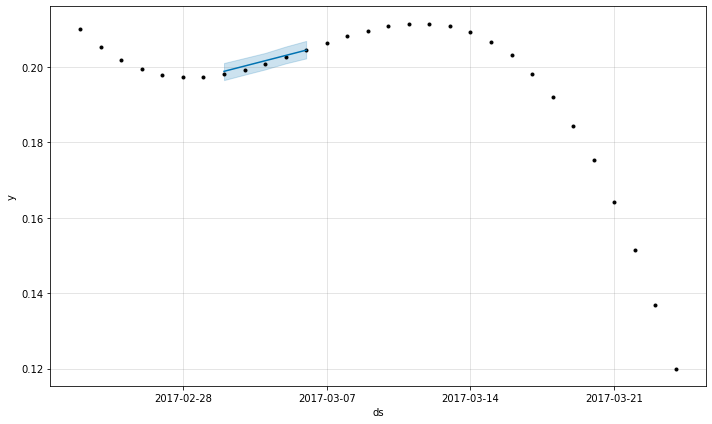

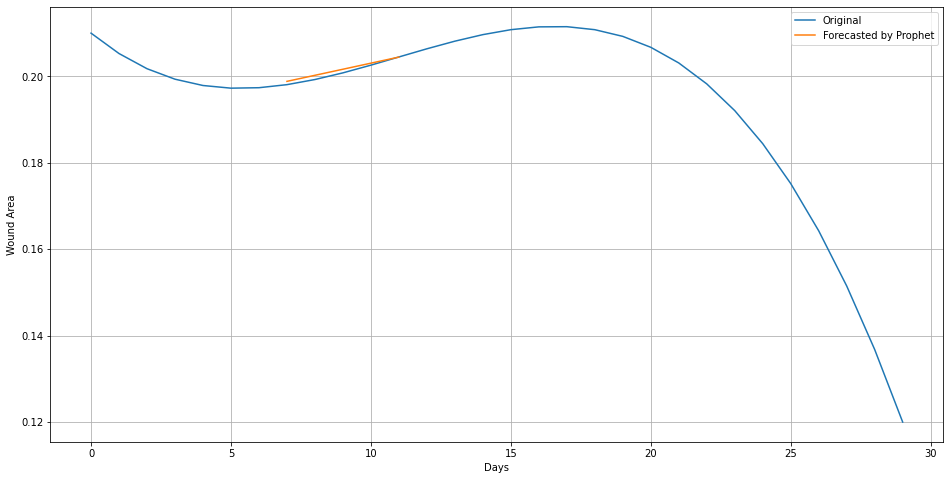

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 119
25
31

Initial log joint probability = -31.7302
Iteration  1. Log joint probability =    20.5623. Improved by 52.2924.
Iteration  2. Log joint probability =    38.9112. Improved by 18.3489.
Iteration  3. Log joint probability =     43.685. Improved by 4.77381.
Iteration  4. Log joint probability =    43.7856. Improved by 0.100612.
Iteration  5. Log joint probability =    43.8999. Improved by 0.114299.
Iteration  6. Log joint probability =    43.9188. Improved by 0.0188912.
Iteration  7. Log joint probability =    43.9372. Improved by 0.0184146.
Iteration  8. Log joint probability =    43.9389. Improved by 0.00164677.
Iteration  9. Log joint probability =    43.9458. Improved by 0.0069132.
Iteration 10. Log joint probability =    43.9467. Improved by 0.000905464.
Iteration 11. Log joint probability =    43.9513. Improved by 0.00457673.
Iteration 12. Log joint probability =    43.9557. Improved by 0.00440829.
Iteration 13. Log joint probability =    43.9569. Improved by 0.0011

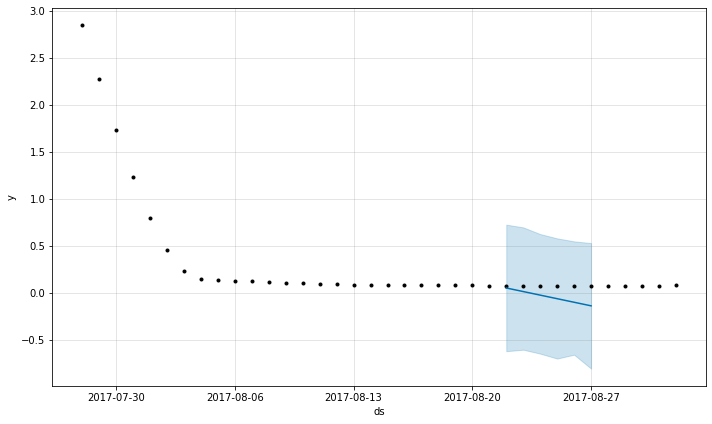

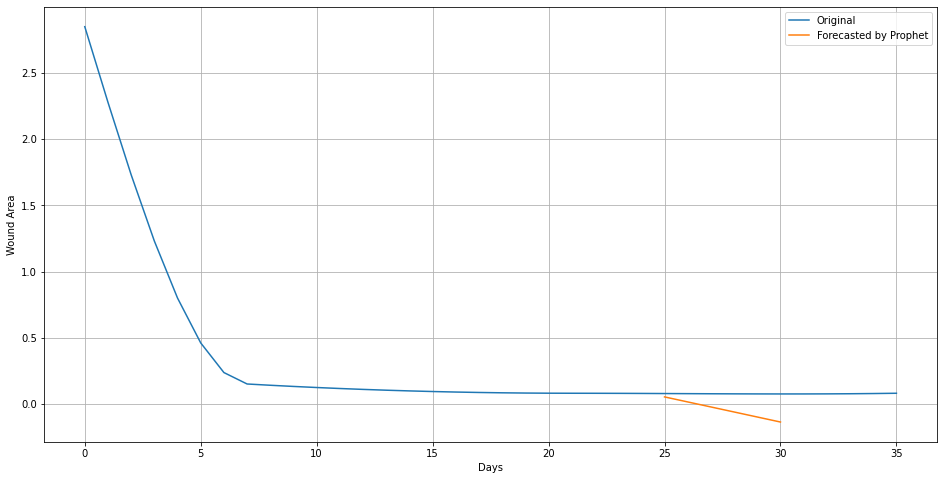

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 120
10
14

Initial log joint probability = -36.6786
Iteration  1. Log joint probability =    12.5695. Improved by 49.2481.
Iteration  2. Log joint probability =    14.4044. Improved by 1.83487.
Iteration  3. Log joint probability =    23.1792. Improved by 8.77486.
Iteration  4. Log joint probability =    29.0972. Improved by 5.918.
Iteration  5. Log joint probability =    29.1051. Improved by 0.00789119.
Iteration  6. Log joint probability =    29.1138. Improved by 0.00871118.
Iteration  7. Log joint probability =    29.1618. Improved by 0.0479848.
Iteration  8. Log joint probability =    29.5002. Improved by 0.338407.
Iteration  9. Log joint probability =    29.7379. Improved by 0.237669.
Iteration 10. Log joint probability =    29.7554. Improved by 0.0175432.
Iteration 11. Log joint probability =    30.0165. Improved by 0.261068.
Iteration 12. Log joint probability =    30.1407. Improved by 0.124139.
Iteration 13. Log joint probability =    30.3622. Improved by 0.221581.
Itera

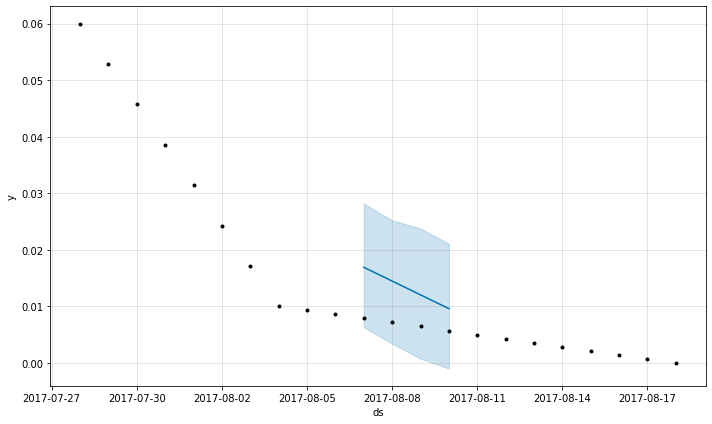

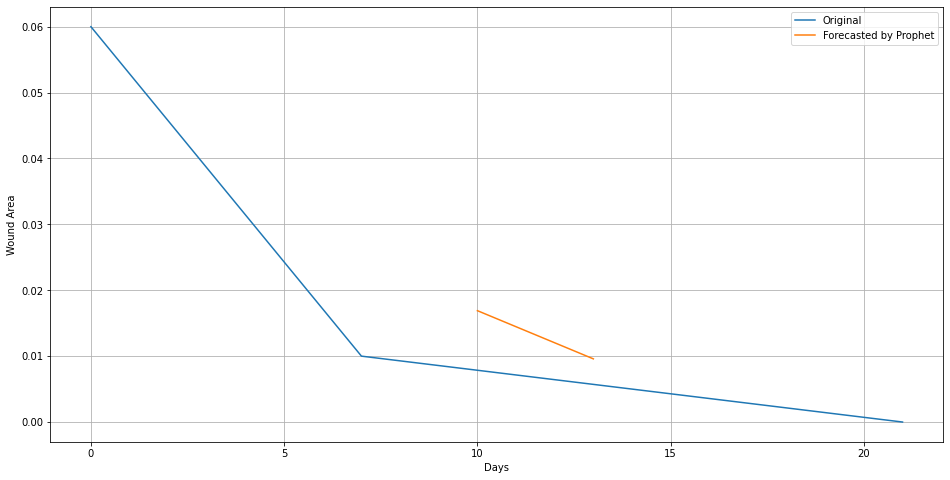

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 121
5
11

Initial log joint probability = -28.4814
Iteration  1. Log joint probability =    12.8198. Improved by 41.3012.
Iteration  2. Log joint probability =    55.5137. Improved by 42.6939.
Iteration  3. Log joint probability =    70.2299. Improved by 14.7163.
Iteration  4. Log joint probability =    72.5588. Improved by 2.32887.
Iteration  5. Log joint probability =    72.5975. Improved by 0.0386701.
Iteration  6. Log joint probability =    72.6341. Improved by 0.0366792.
Iteration  7. Log joint probability =    72.6789. Improved by 0.0447477.
Iteration  8. Log joint probability =    72.6817. Improved by 0.00277665.
Iteration  9. Log joint probability =    72.7594. Improved by 0.0777552.
Iteration 10. Log joint probability =    72.8544. Improved by 0.0949678.
Iteration 11. Log joint probability =     72.922. Improved by 0.0676567.
Iteration 12. Log joint probability =    72.9412. Improved by 0.0191599.
Iteration 13. Log joint probability =    74.0118. Improved by 1.07061.
It

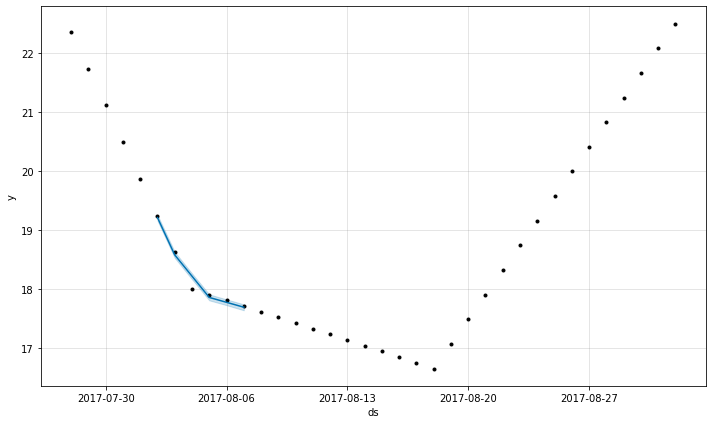

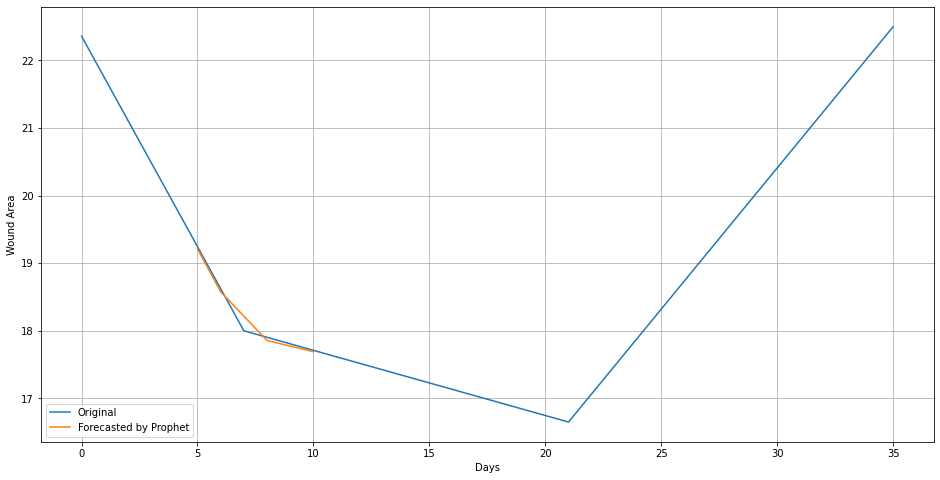

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 122
223
268
Initial log joint probability = -6.82381
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       471.056     0.0170369       79.4197      0.4016           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       476.241    0.00240525       146.989   2.634e-05       0.001      298  LS failed, Hessian reset 
     199       478.268    0.00235458       68.9159           1           1      319   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     240       478.852   0.000330738       83.5407   4.458e-06       0.001      411  LS failed, Hessian reset 
     296       478.872   1.04119e-08       63.9169      0.3108           1      485   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


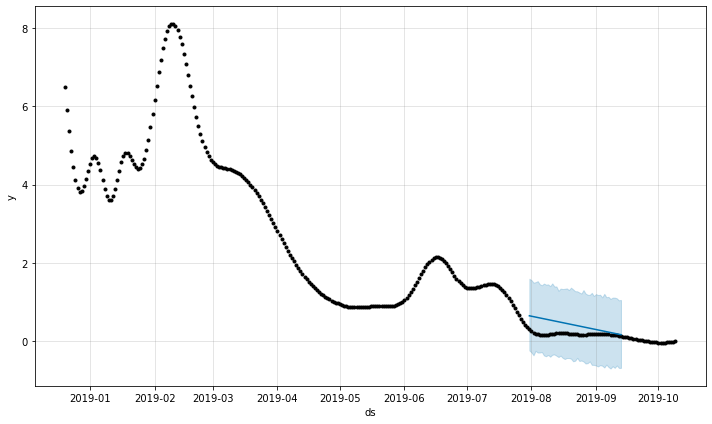

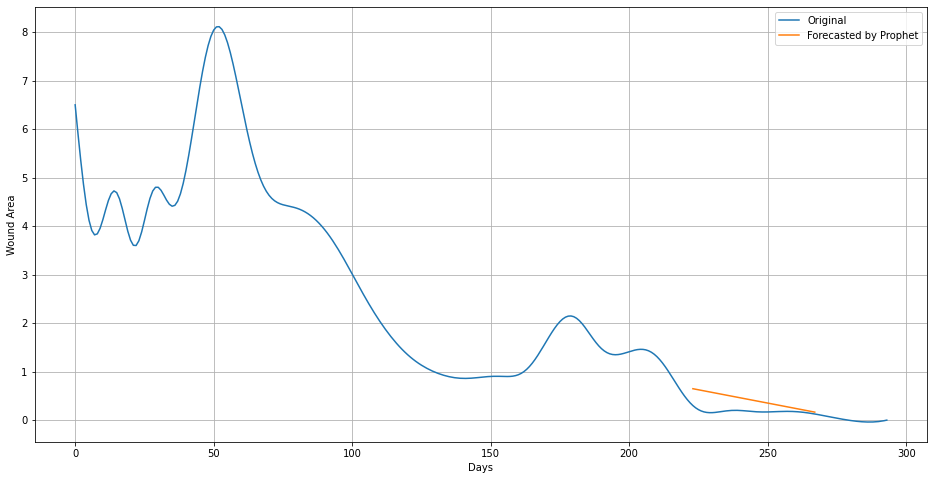

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 123
50
64

Initial log joint probability = -81.364
Iteration  1. Log joint probability =    94.2416. Improved by 175.606.
Iteration  2. Log joint probability =    137.909. Improved by 43.667.
Iteration  3. Log joint probability =    139.303. Improved by 1.39417.
Iteration  4. Log joint probability =    144.151. Improved by 4.84827.
Iteration  5. Log joint probability =    144.157. Improved by 0.00642412.
Iteration  6. Log joint probability =    144.165. Improved by 0.00773366.
Iteration  7. Log joint probability =    144.177. Improved by 0.0115446.
Iteration  8. Log joint probability =    144.262. Improved by 0.0854347.
Iteration  9. Log joint probability =    144.781. Improved by 0.518808.
Iteration 10. Log joint probability =    144.791. Improved by 0.0102512.
Iteration 11. Log joint probability =    144.794. Improved by 0.00289194.
Iteration 12. Log joint probability =    144.803. Improved by 0.00909369.
Iteration 13. Log joint probability =    144.856. Improved by 0.0527956.

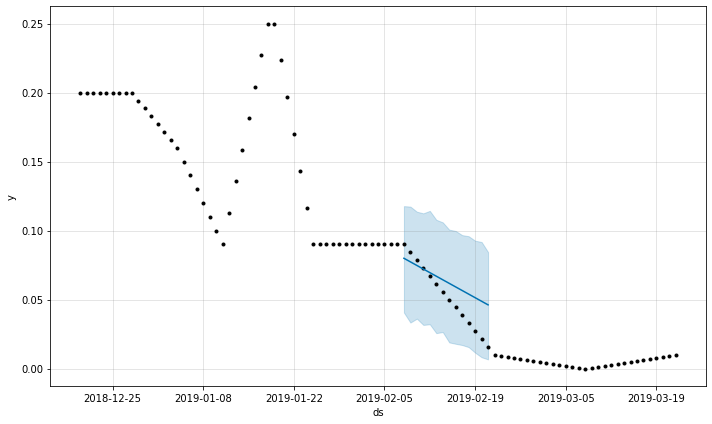

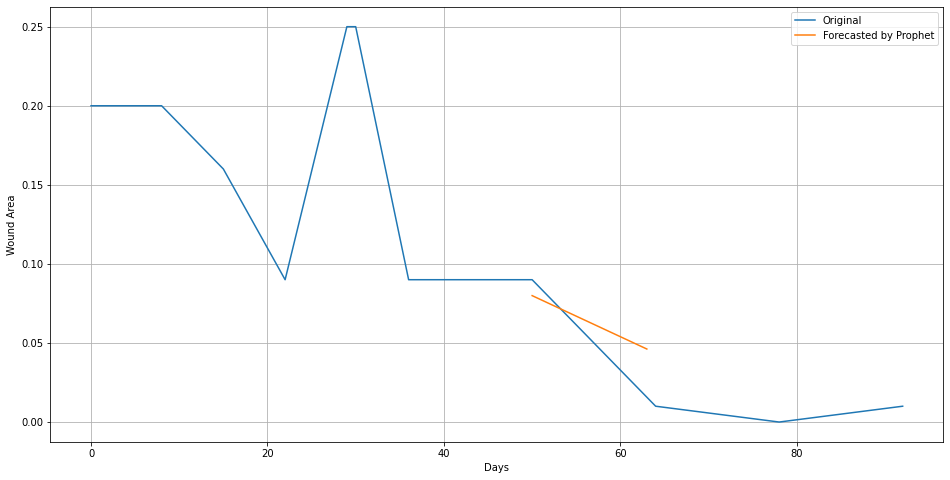

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 124
47
72
Initial log joint probability = -2.25821
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      75       463.612   0.000636538        156.36   8.127e-06       0.001      135  LS failed, Hessian reset 
      99       465.124    0.00164058       130.035           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       467.144    0.00268534         103.4   3.042e-05       0.001      248  LS failed, Hessian reset 
     199       467.985   0.000845242       87.5529           1           1      324   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       469.782   0.000267056        83.635   3.207e-06       0.001      411  LS failed, Hessian reset 
     299       471.611   0.000268492       62.8828      0.3069           1      489   
    Iter      log prob        ||dx||      ||grad||       alpha      alph

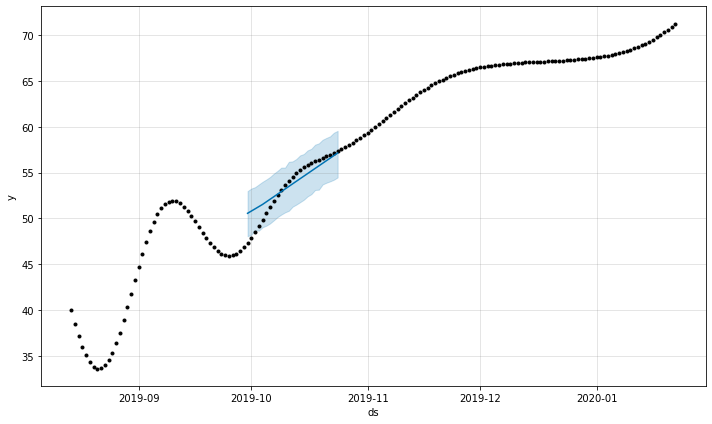

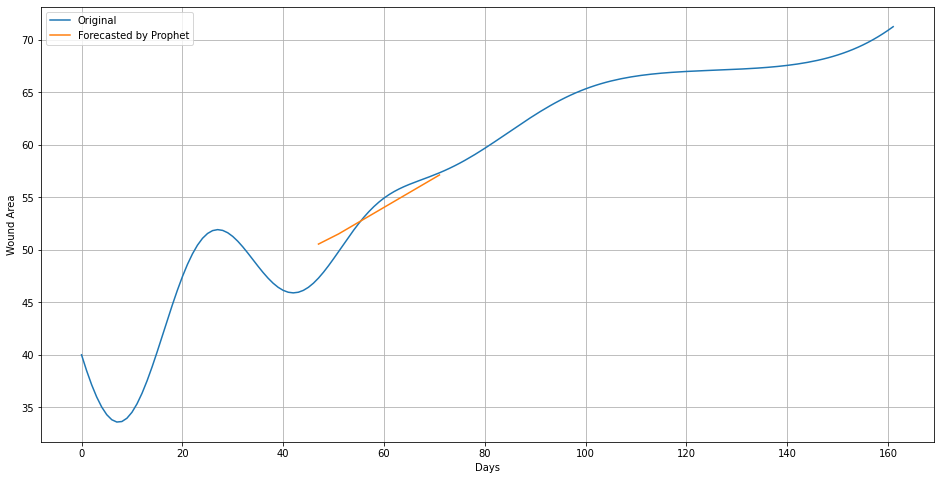

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 125
27
35

Initial log joint probability = -41.3732
Iteration  1. Log joint probability =    44.3038. Improved by 85.677.
Iteration  2. Log joint probability =    75.2716. Improved by 30.9678.
Iteration  3. Log joint probability =    103.267. Improved by 27.9956.
Iteration  4. Log joint probability =    110.868. Improved by 7.60038.
Iteration  5. Log joint probability =    112.072. Improved by 1.2041.
Iteration  6. Log joint probability =    112.152. Improved by 0.0803457.
Iteration  7. Log joint probability =    112.178. Improved by 0.0263071.
Iteration  8. Log joint probability =    112.198. Improved by 0.0201183.
Iteration  9. Log joint probability =    112.515. Improved by 0.316917.
Iteration 10. Log joint probability =    112.562. Improved by 0.0464094.
Iteration 11. Log joint probability =     112.67. Improved by 0.108193.
Iteration 12. Log joint probability =     112.69. Improved by 0.0198682.
Iteration 13. Log joint probability =    112.981. Improved by 0.290733.
Iterati

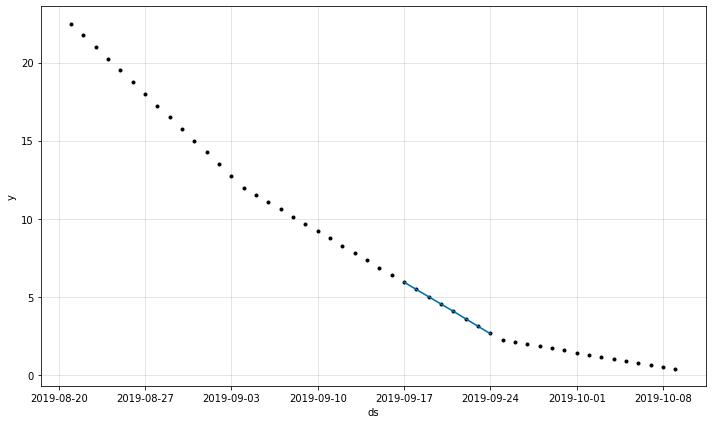

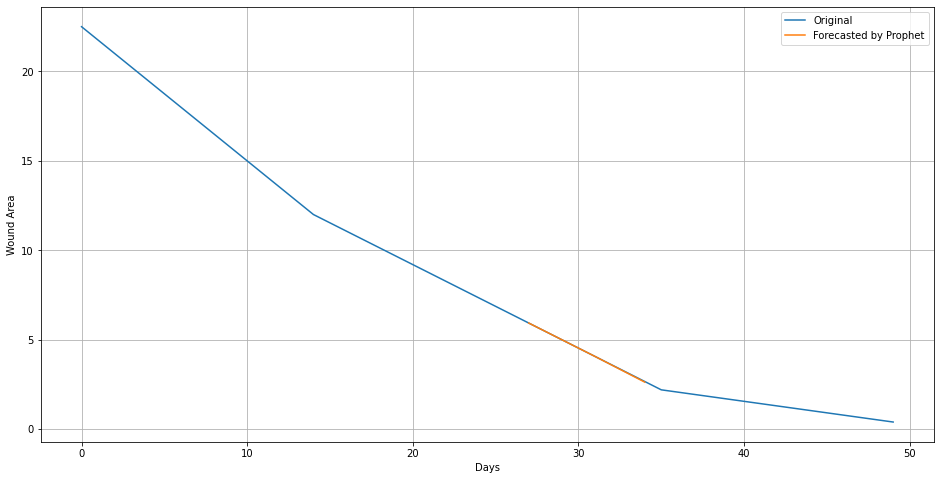

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 126
2
8

Initial log joint probability = -29.5614
Iteration  1. Log joint probability =  -0.685877. Improved by 28.8755.
Iteration  2. Log joint probability =    23.7882. Improved by 24.4741.
Iteration  3. Log joint probability =    50.6361. Improved by 26.8479.
Iteration  4. Log joint probability =    52.5169. Improved by 1.88076.
Iteration  5. Log joint probability =    52.5184. Improved by 0.00150931.
Iteration  6. Log joint probability =    52.7688. Improved by 0.250368.
Iteration  7. Log joint probability =    52.8245. Improved by 0.0557061.
Iteration  8. Log joint probability =    52.8746. Improved by 0.0501175.
Iteration  9. Log joint probability =    52.9199. Improved by 0.0453322.
Iteration 10. Log joint probability =    52.9949. Improved by 0.0749696.
Iteration 11. Log joint probability =    53.0136. Improved by 0.018749.
Iteration 12. Log joint probability =    53.3094. Improved by 0.295726.
Iteration 13. Log joint probability =    53.3366. Improved by 0.027221.
Itera

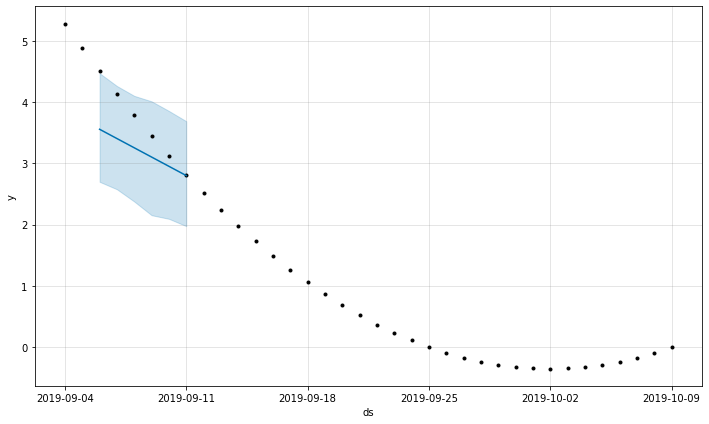

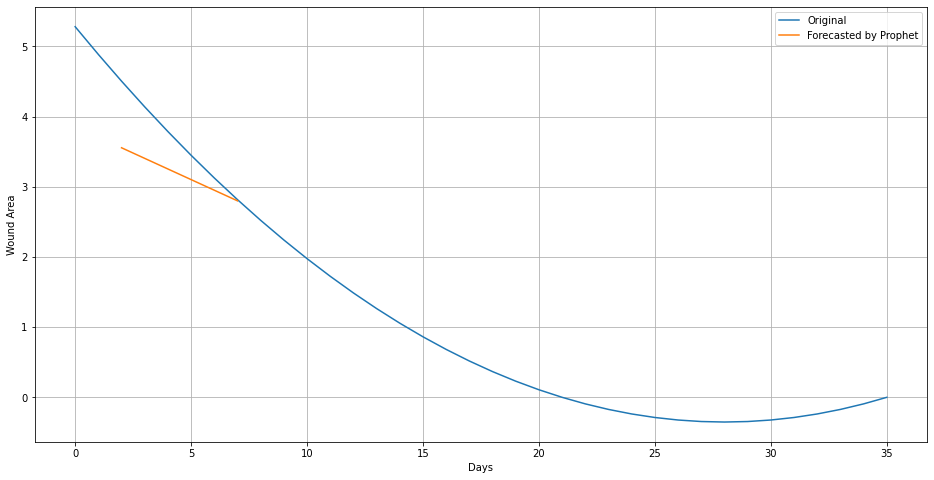

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 127
5
13

Initial log joint probability = -41.1106
Iteration  1. Log joint probability =    61.5762. Improved by 102.687.
Iteration  2. Log joint probability =    76.2793. Improved by 14.7031.
Iteration  3. Log joint probability =    76.6037. Improved by 0.324419.
Iteration  4. Log joint probability =    90.4897. Improved by 13.886.
Iteration  5. Log joint probability =    90.5007. Improved by 0.0109841.
Iteration  6. Log joint probability =    90.5191. Improved by 0.018383.
Iteration  7. Log joint probability =    90.5784. Improved by 0.0593134.
Iteration  8. Log joint probability =    90.6991. Improved by 0.120732.
Iteration  9. Log joint probability =    90.7407. Improved by 0.041597.
Iteration 10. Log joint probability =    90.8885. Improved by 0.14779.
Iteration 11. Log joint probability =    91.3298. Improved by 0.441244.
Iteration 12. Log joint probability =    91.7113. Improved by 0.381576.
Iteration 13. Log joint probability =    91.8349. Improved by 0.12355.
Iteration 

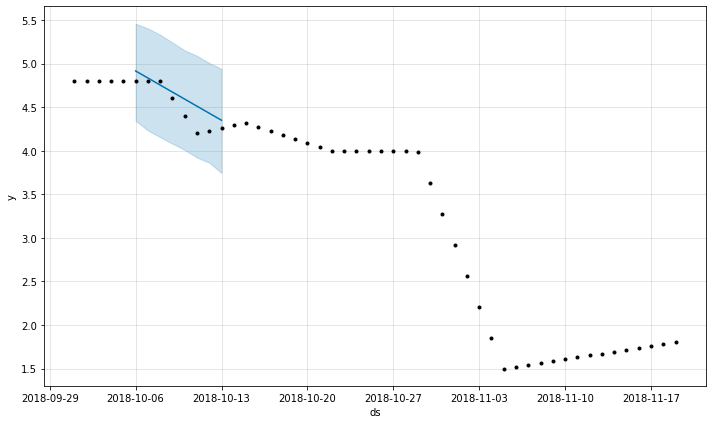

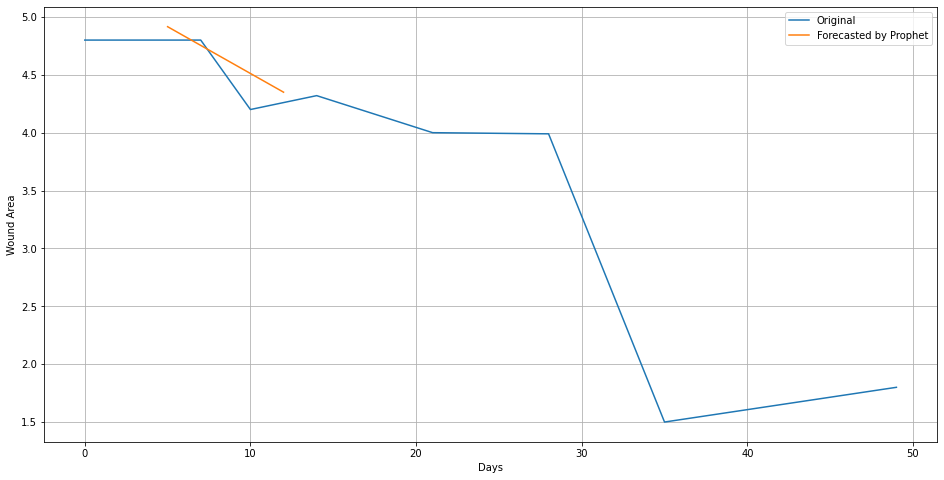

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 128
5
8

Initial log joint probability = -41.3868
Iteration  1. Log joint probability =    7.46095. Improved by 48.8478.
Iteration  2. Log joint probability =    8.12179. Improved by 0.660838.
Iteration  3. Log joint probability =     10.804. Improved by 2.68222.
Iteration  4. Log joint probability =      11.55. Improved by 0.746032.
Iteration  5. Log joint probability =    11.6669. Improved by 0.11684.
Iteration  6. Log joint probability =     11.766. Improved by 0.0990717.
Iteration  7. Log joint probability =     11.966. Improved by 0.200019.
Iteration  8. Log joint probability =    12.0539. Improved by 0.0879632.
Iteration  9. Log joint probability =    17.2081. Improved by 5.15422.
Iteration 10. Log joint probability =     17.263. Improved by 0.0548158.
Iteration 11. Log joint probability =    17.2715. Improved by 0.00858306.
Iteration 12. Log joint probability =    17.3031. Improved by 0.0315484.
Iteration 13. Log joint probability =    17.3086. Improved by 0.00552387.
Ite

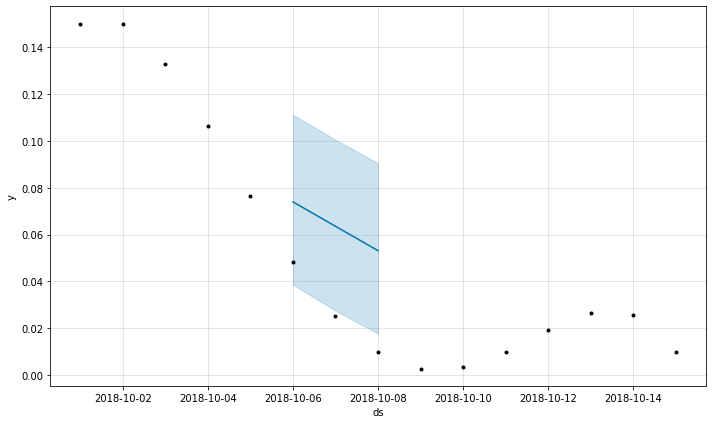

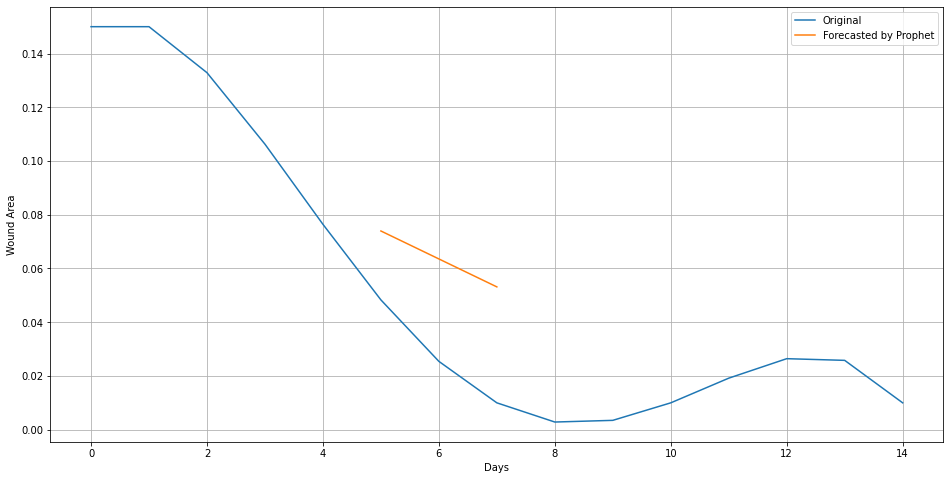

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 129
44
57

Initial log joint probability = -76.3139
Iteration  1. Log joint probability =    55.9789. Improved by 132.293.
Iteration  2. Log joint probability =    104.399. Improved by 48.4203.
Iteration  3. Log joint probability =    124.171. Improved by 19.7721.
Iteration  4. Log joint probability =    124.246. Improved by 0.0750094.
Iteration  5. Log joint probability =    124.258. Improved by 0.0112751.
Iteration  6. Log joint probability =    124.402. Improved by 0.144446.
Iteration  7. Log joint probability =    124.437. Improved by 0.0354011.
Iteration  8. Log joint probability =    124.474. Improved by 0.0368936.
Iteration  9. Log joint probability =    124.638. Improved by 0.164102.
Iteration 10. Log joint probability =    124.693. Improved by 0.0541412.
Iteration 11. Log joint probability =     124.82. Improved by 0.127385.
Iteration 12. Log joint probability =    124.889. Improved by 0.0695196.
Iteration 13. Log joint probability =    124.977. Improved by 0.087544.
It

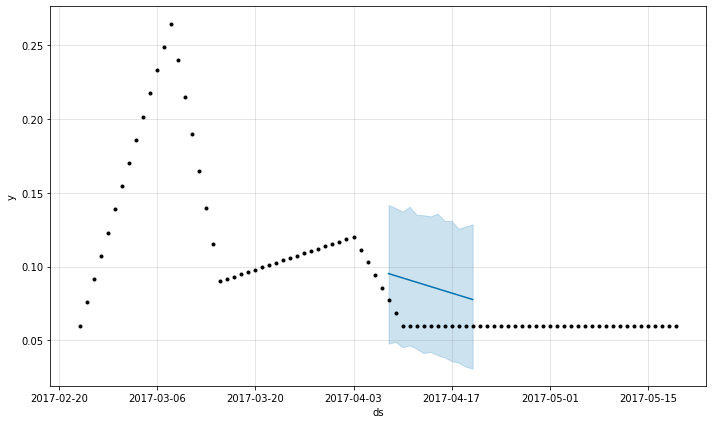

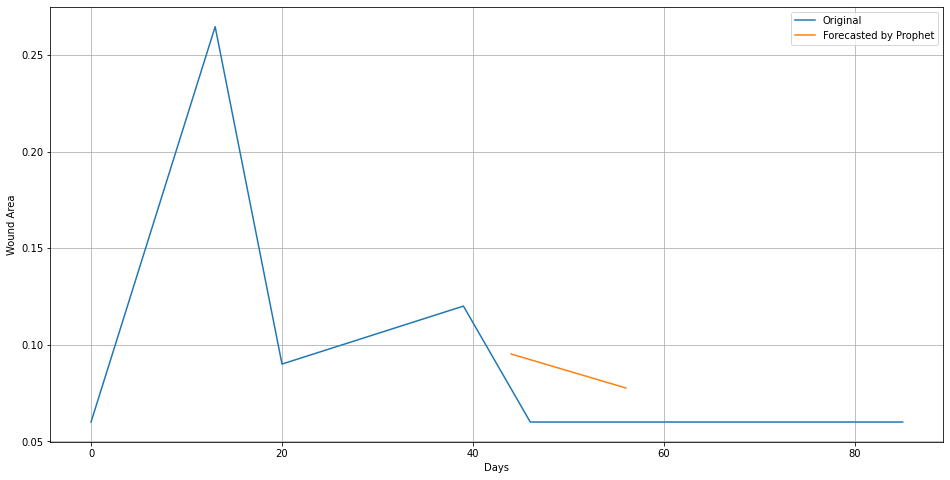

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 130
28
54
Initial log joint probability = -8.92899
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       320.723     0.0032157       90.2571   3.644e-05       0.001      103  LS failed, Hessian reset 
      99       321.006   0.000457296       81.3219           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       321.158    0.00158136       84.2966   1.943e-05       0.001      214  LS failed, Hessian reset 
     164       321.316    1.5042e-05       77.4783    2.13e-07       0.001      313  LS failed, Hessian reset 
     193       321.318   2.13691e-06       84.8879    2.94e-08       0.001      388  LS failed, Hessian reset 
     199       321.318   1.86765e-07       68.8257      0.5796      0.1667      398   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       321.318   5.08331e-07       75.86

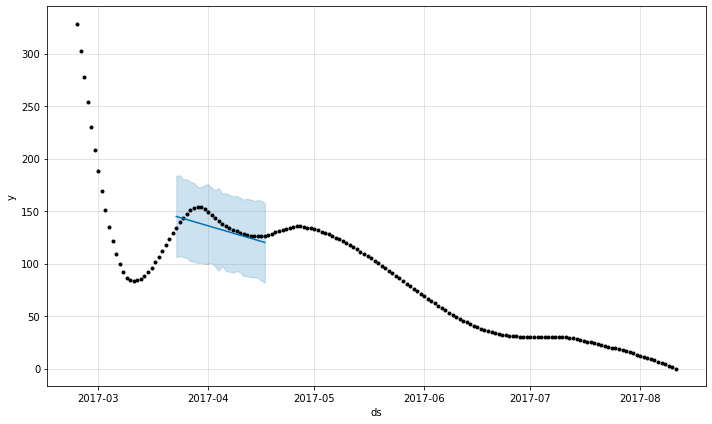

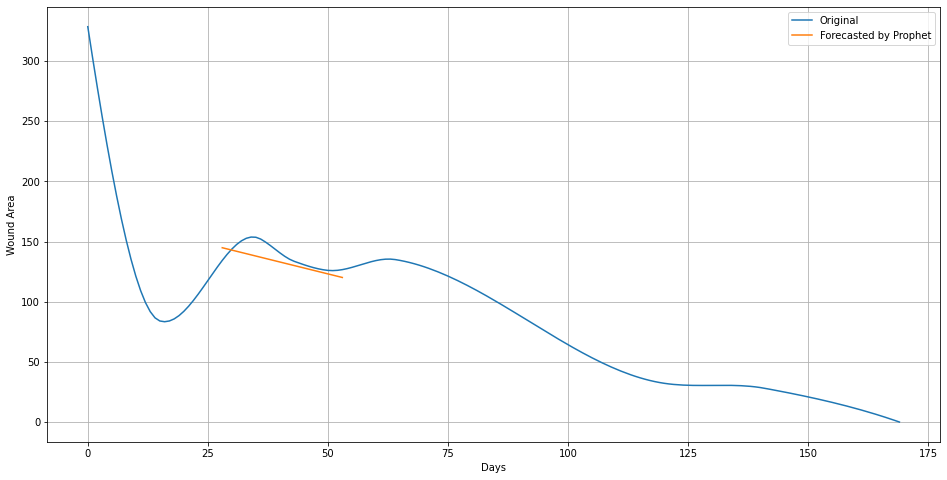

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 131
9
15

Initial log joint probability = -29.573
Iteration  1. Log joint probability =    10.4773. Improved by 40.0504.
Iteration  2. Log joint probability =    39.8536. Improved by 29.3762.
Iteration  3. Log joint probability =    48.4393. Improved by 8.58572.
Iteration  4. Log joint probability =    52.1896. Improved by 3.75034.
Iteration  5. Log joint probability =    52.2021. Improved by 0.0124316.
Iteration  6. Log joint probability =    52.2191. Improved by 0.017066.
Iteration  7. Log joint probability =    52.2214. Improved by 0.00231179.
Iteration  8. Log joint probability =    52.2382. Improved by 0.0167624.
Iteration  9. Log joint probability =    52.2454. Improved by 0.00724812.
Iteration 10. Log joint probability =    52.2691. Improved by 0.0236652.
Iteration 11. Log joint probability =    52.2737. Improved by 0.00457094.
Iteration 12. Log joint probability =    52.2962. Improved by 0.0225112.
Iteration 13. Log joint probability =     52.313. Improved by 0.0167833.


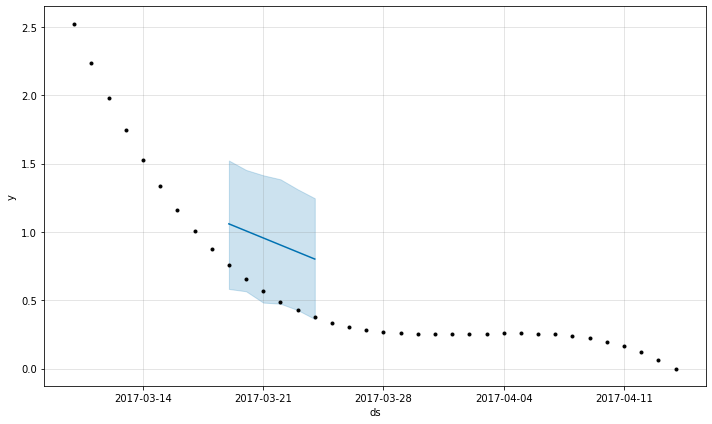

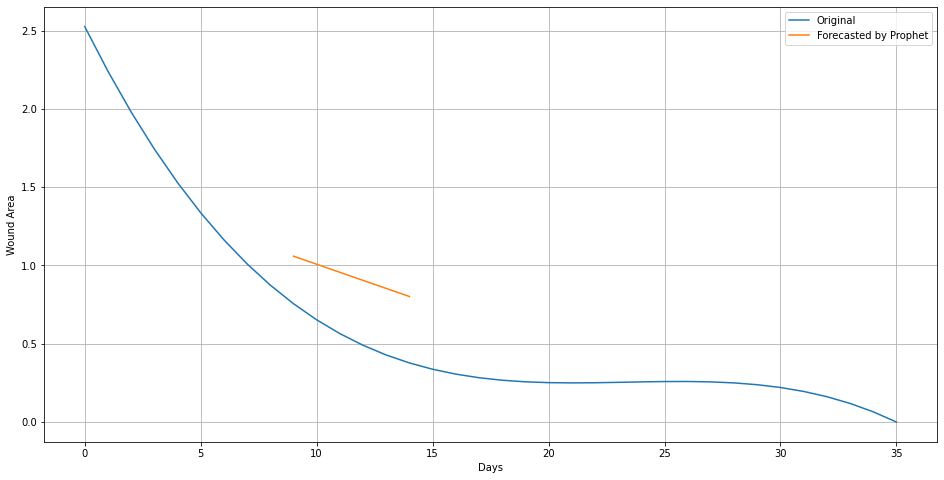

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 132
1
7

Initial log joint probability = -28.2132
Iteration  1. Log joint probability =    35.9266. Improved by 64.1398.
Iteration  2. Log joint probability =    49.1934. Improved by 13.2667.
Iteration  3. Log joint probability =    74.2707. Improved by 25.0773.
Iteration  4. Log joint probability =    85.3876. Improved by 11.117.
Iteration  5. Log joint probability =    85.7941. Improved by 0.406442.
Iteration  6. Log joint probability =    85.8239. Improved by 0.0298013.
Iteration  7. Log joint probability =    85.8358. Improved by 0.0119246.
Iteration  8. Log joint probability =    85.9001. Improved by 0.0642929.
Iteration  9. Log joint probability =    85.9131. Improved by 0.0130462.
Iteration 10. Log joint probability =    85.9215. Improved by 0.00839749.
Iteration 11. Log joint probability =    85.9307. Improved by 0.00915733.
Iteration 12. Log joint probability =     85.943. Improved by 0.0122823.
Iteration 13. Log joint probability =    85.9483. Improved by 0.00533295.
I

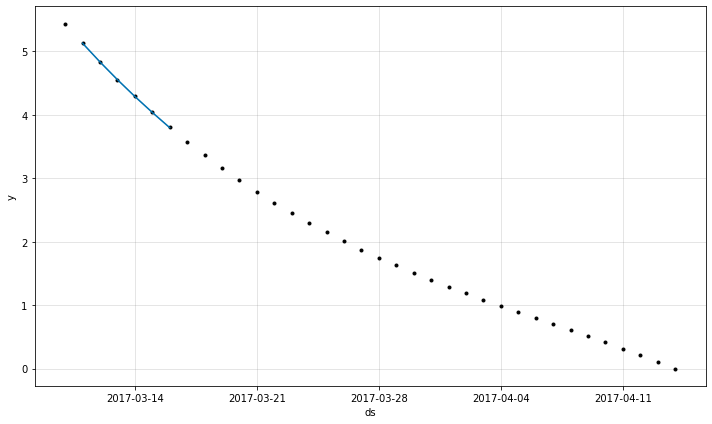

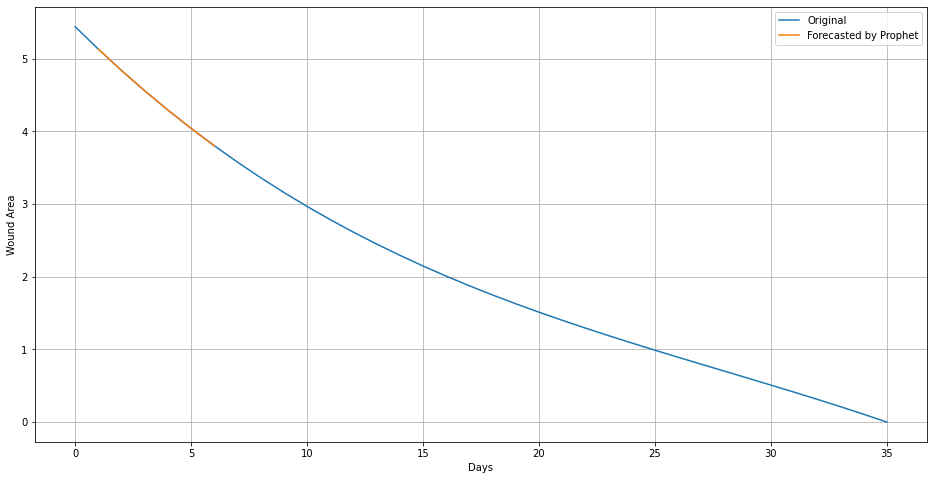

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 133
142
171
Initial log joint probability = -24.0331
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       289.443   0.000506148       87.4921       2.179      0.2179      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     140       290.231     0.0016532       73.1383   9.877e-06       0.001      235  LS failed, Hessian reset 
     199       290.507   1.49402e-06        76.364      0.6675      0.6675      313   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       290.528    4.2467e-05       74.7186   7.207e-07       0.001      362  LS failed, Hessian reset 
     265       290.545   7.70277e-09        61.077      0.3453      0.3453      432   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


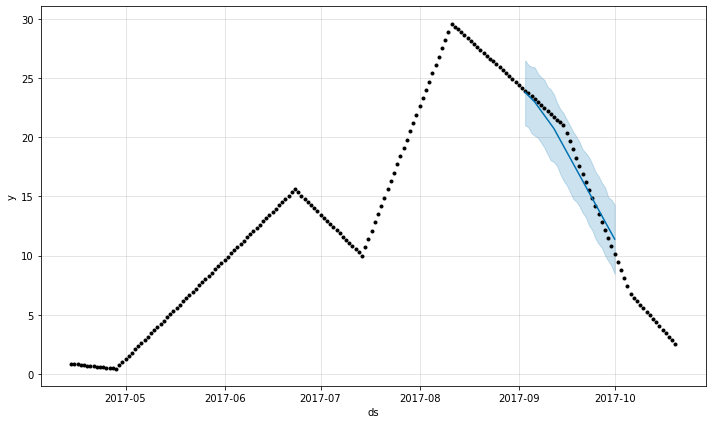

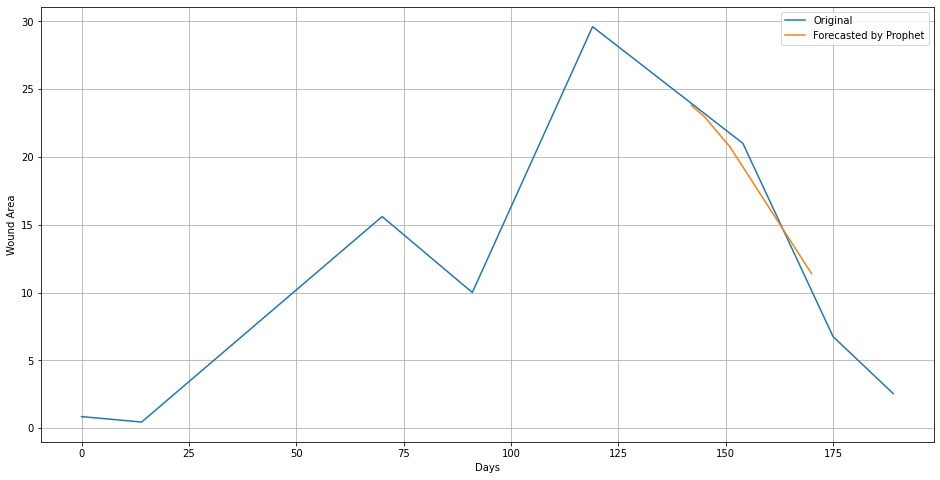

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 134
110
131
Initial log joint probability = -26.9468
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       288.529      0.019795       392.693       5.021      0.5021      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       367.005      0.245779       1421.81           1           1      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       443.063    0.00180267       460.694      0.9597      0.9597      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       468.865    0.00290894       652.748      0.4009     0.04009      512   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       480.969    0.00328965       553.186      0.5037           1      644   
    Iter      log prob        ||dx||      ||g

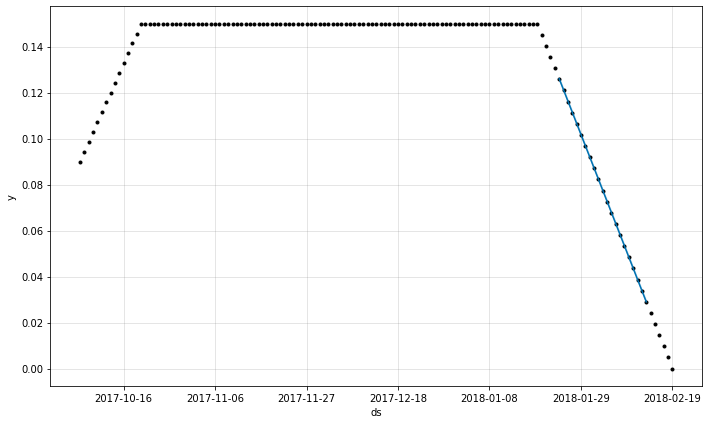

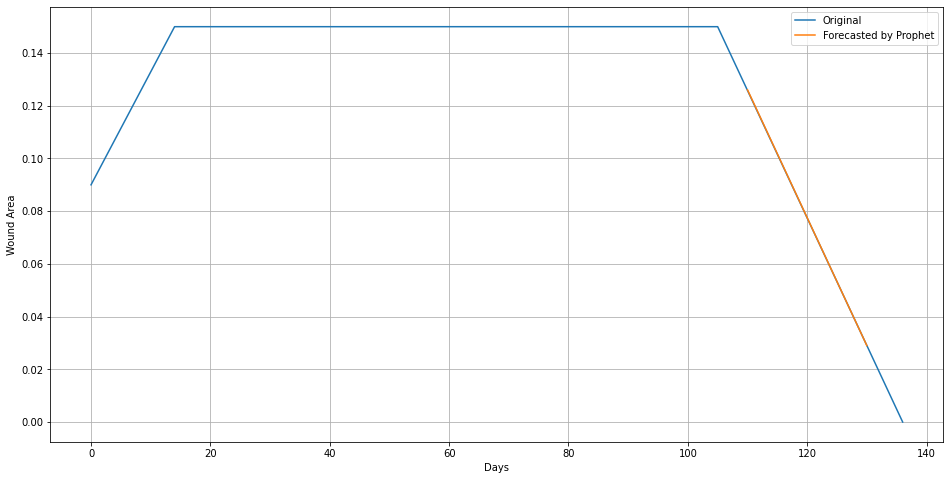

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 135
59
79
Initial log joint probability = -16.1583
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       429.972     0.0385794       1172.02           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        495.15    0.00596952       157.633       1.063      0.1063      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        550.21    0.00343451         305.6           1           1      360   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       595.816   0.000575482       1013.63      0.7027      0.7027      486   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       608.637    0.00241815       216.194           1           1      613   
    Iter      log prob        ||dx||      ||gra

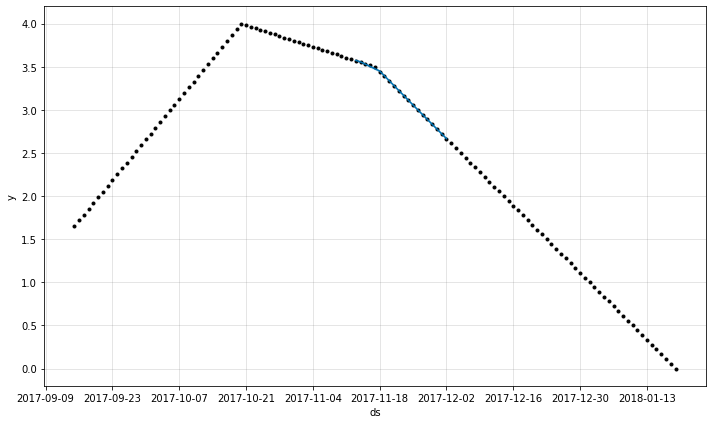

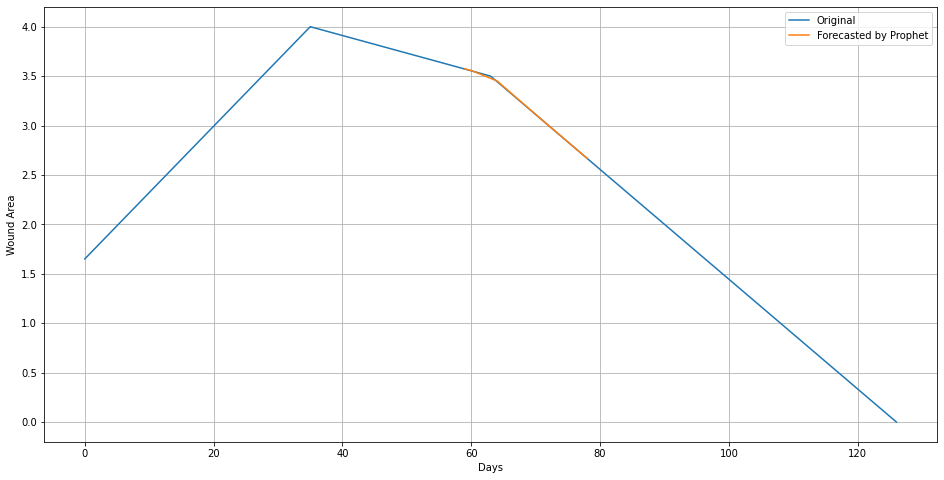

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 136
14
24

Initial log joint probability = -57.2022
Iteration  1. Log joint probability =   -5.34122. Improved by 51.8609.
Iteration  2. Log joint probability =    55.5276. Improved by 60.8688.
Iteration  3. Log joint probability =     57.653. Improved by 2.1254.
Iteration  4. Log joint probability =    57.7305. Improved by 0.0775043.
Iteration  5. Log joint probability =     57.832. Improved by 0.101524.
Iteration  6. Log joint probability =    57.8355. Improved by 0.00346003.
Iteration  7. Log joint probability =    57.8768. Improved by 0.0413097.
Iteration  8. Log joint probability =    58.0148. Improved by 0.138035.
Iteration  9. Log joint probability =    58.0294. Improved by 0.0145988.
Iteration 10. Log joint probability =    58.0373. Improved by 0.00783268.
Iteration 11. Log joint probability =    58.1393. Improved by 0.101985.
Iteration 12. Log joint probability =    58.1793. Improved by 0.0400305.
Iteration 13. Log joint probability =    58.2079. Improved by 0.0286565.


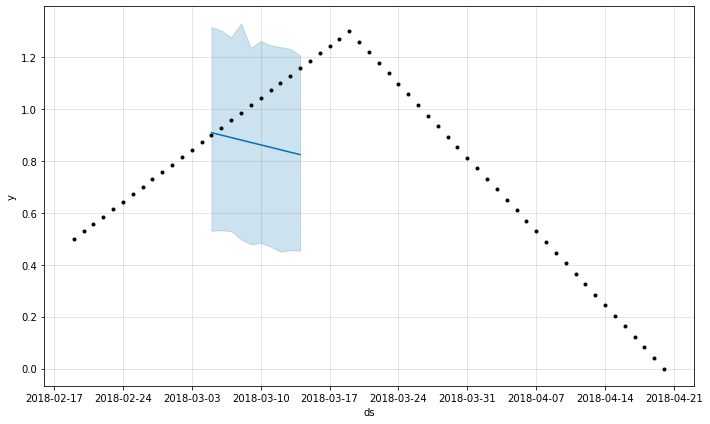

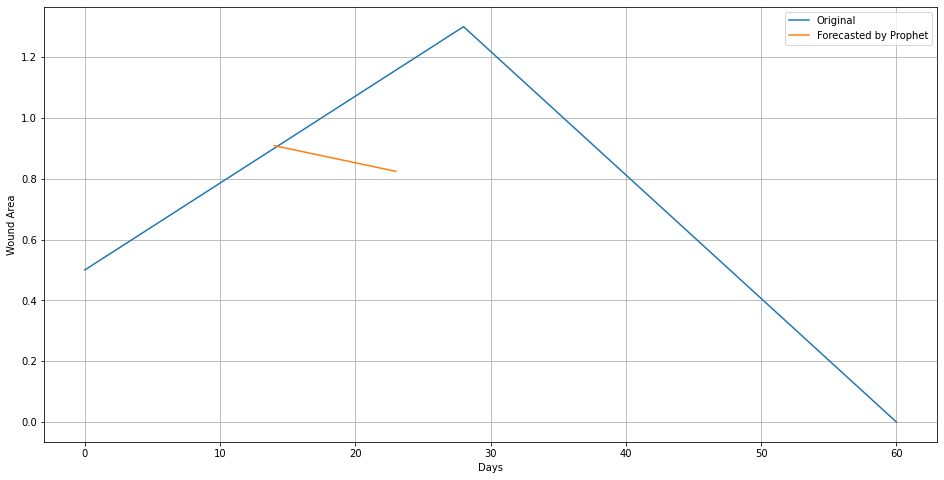

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 137
11
21

Initial log joint probability = -53.7605
Iteration  1. Log joint probability =    40.1362. Improved by 93.8968.
Iteration  2. Log joint probability =    57.8685. Improved by 17.7323.
Iteration  3. Log joint probability =    74.1834. Improved by 16.315.
Iteration  4. Log joint probability =    82.1291. Improved by 7.94566.
Iteration  5. Log joint probability =    82.3388. Improved by 0.209713.
Iteration  6. Log joint probability =    82.3849. Improved by 0.0460907.
Iteration  7. Log joint probability =    82.4071. Improved by 0.0222005.
Iteration  8. Log joint probability =     82.412. Improved by 0.00489422.
Iteration  9. Log joint probability =    82.5146. Improved by 0.10262.
Iteration 10. Log joint probability =    82.5295. Improved by 0.01491.
Iteration 11. Log joint probability =    82.5471. Improved by 0.0175846.
Iteration 12. Log joint probability =    82.5756. Improved by 0.0284964.
Iteration 13. Log joint probability =    101.702. Improved by 19.1262.
Iterati

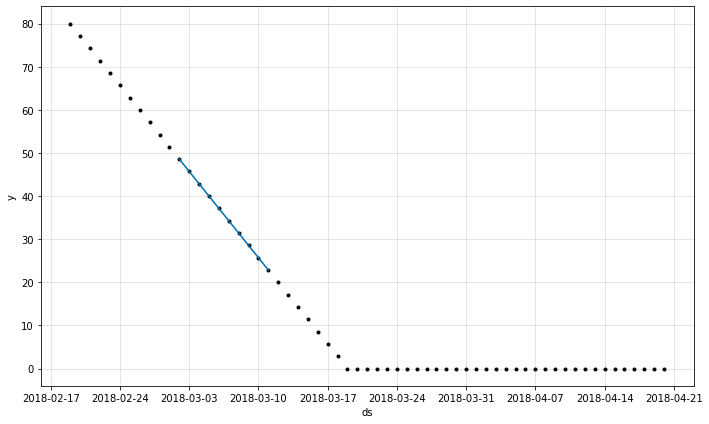

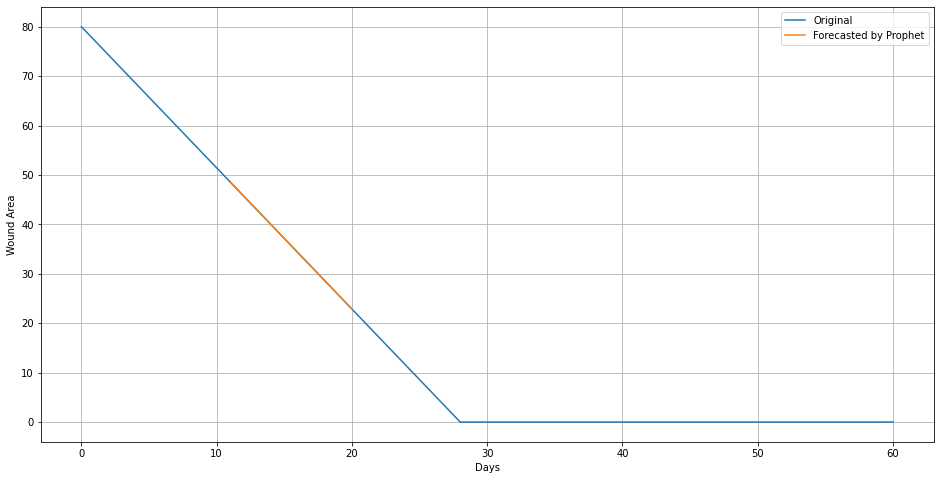

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 138
47
59

Initial log joint probability = -74.647
Iteration  1. Log joint probability =    37.2169. Improved by 111.864.
Iteration  2. Log joint probability =     68.893. Improved by 31.6761.
Iteration  3. Log joint probability =    71.2258. Improved by 2.33278.
Iteration  4. Log joint probability =    72.6461. Improved by 1.42035.
Iteration  5. Log joint probability =    72.6826. Improved by 0.0364708.
Iteration  6. Log joint probability =    72.7248. Improved by 0.0421741.
Iteration  7. Log joint probability =    72.7606. Improved by 0.0358121.
Iteration  8. Log joint probability =    72.7996. Improved by 0.0390428.
Iteration  9. Log joint probability =     72.998. Improved by 0.198357.
Iteration 10. Log joint probability =    73.1193. Improved by 0.121307.
Iteration 11. Log joint probability =    73.1642. Improved by 0.0449275.
Iteration 12. Log joint probability =    73.2089. Improved by 0.0447069.
Iteration 13. Log joint probability =    73.2423. Improved by 0.0334096.
Ite

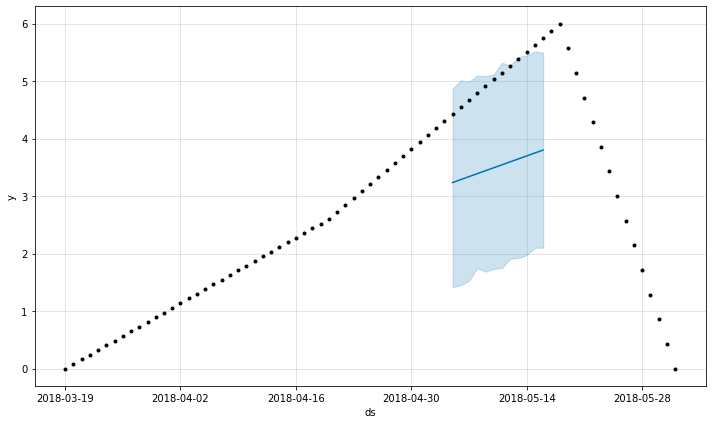

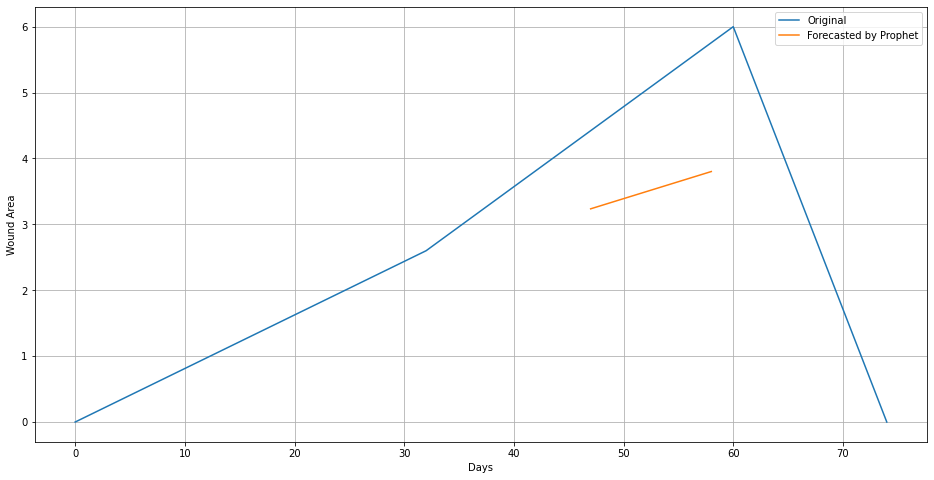

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 139
7
17

Initial log joint probability = -52.8244
Iteration  1. Log joint probability =    45.3769. Improved by 98.2013.
Iteration  2. Log joint probability =    80.2516. Improved by 34.8748.
Iteration  3. Log joint probability =    91.9887. Improved by 11.7371.
Iteration  4. Log joint probability =    93.1024. Improved by 1.11363.
Iteration  5. Log joint probability =    103.173. Improved by 10.0711.
Iteration  6. Log joint probability =    103.205. Improved by 0.0315076.
Iteration  7. Log joint probability =    103.213. Improved by 0.00849848.
Iteration  8. Log joint probability =    103.309. Improved by 0.0950612.
Iteration  9. Log joint probability =    103.534. Improved by 0.22523.
Iteration 10. Log joint probability =    103.563. Improved by 0.0289977.
Iteration 11. Log joint probability =    103.823. Improved by 0.259922.
Iteration 12. Log joint probability =    104.376. Improved by 0.553652.
Iteration 13. Log joint probability =     105.26. Improved by 0.883995.
Iterati

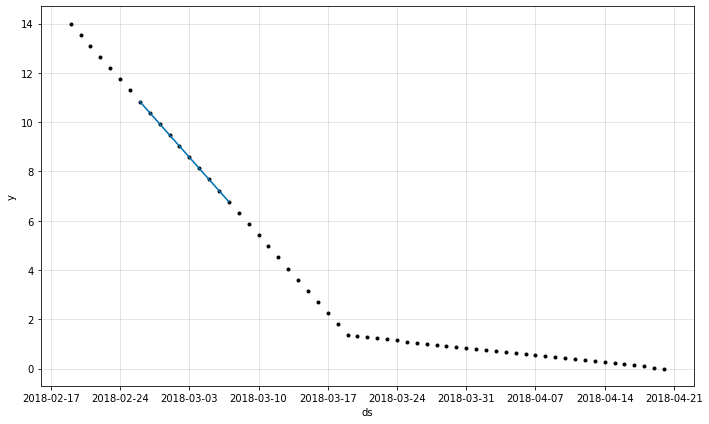

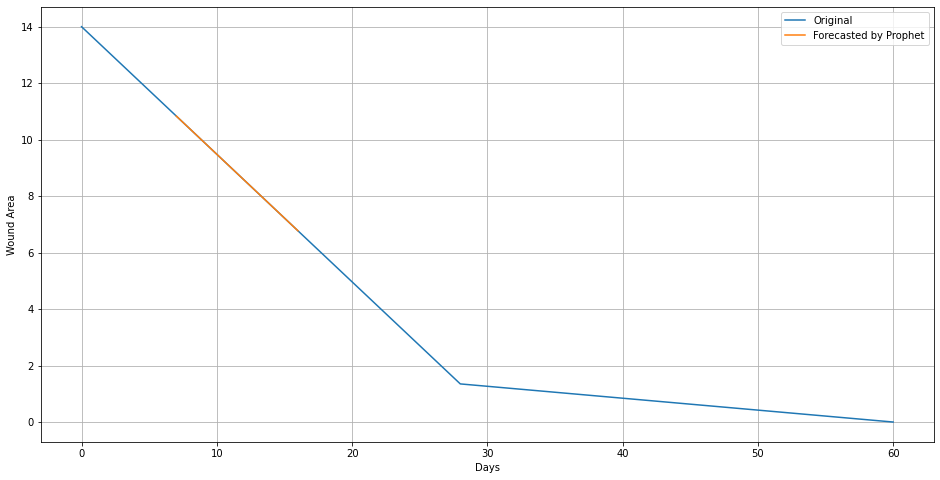

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 140
0
1
Wound: 141
93
152
Initial log joint probability = -67.6153
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       710.904    0.00161286       67.4708           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       716.646    0.00142418       139.279   1.245e-05       0.001      250  LS failed, Hessian reset 
     199       719.893   0.000115882       71.2093       0.403       0.403      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     273       721.706    0.00316504       109.743   3.358e-05       0.001      461  LS failed, Hessian reset 
     299        721.95   4.13021e-05       72.6039      0.2739           1      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     337       722.005   6.39918e-05       71.8301   7.519e-07       0.001 

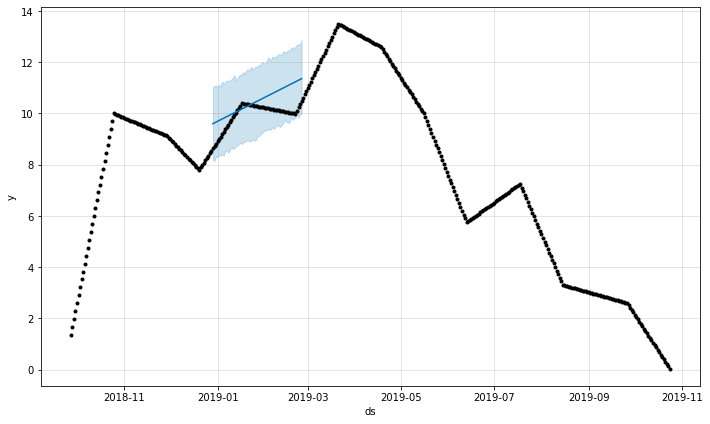

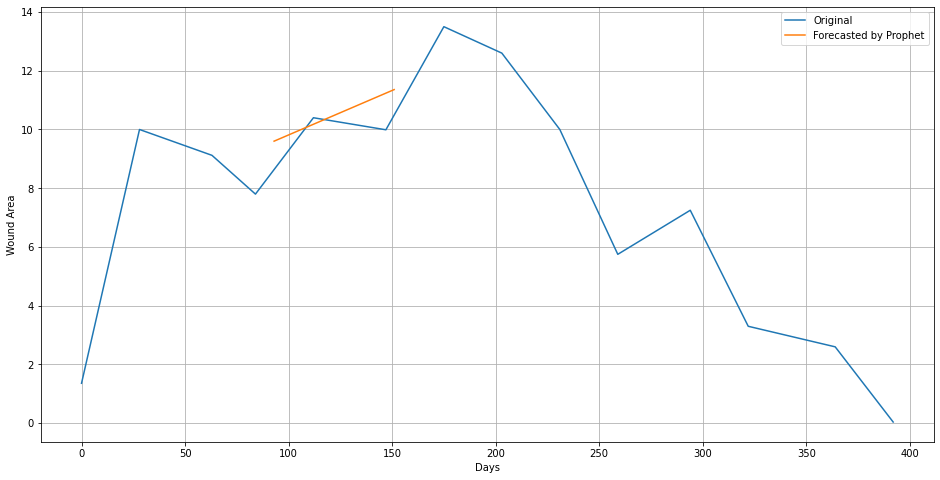

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 142
198
253
Initial log joint probability = -14.28
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       987.408    0.00035927       250.856    4.34e-06       0.001      159  LS failed, Hessian reset 
      99       998.825      0.027845       441.917       1.461    0.001461      174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1050.43     0.0437635       494.793      0.2246           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1083.06    0.00851072       520.395           1           1      432   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       1121.23      0.127387       1145.55           1           1      548   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       1144.79 

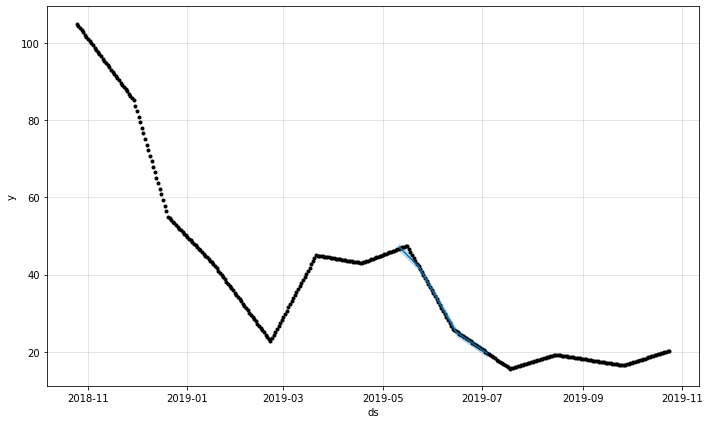

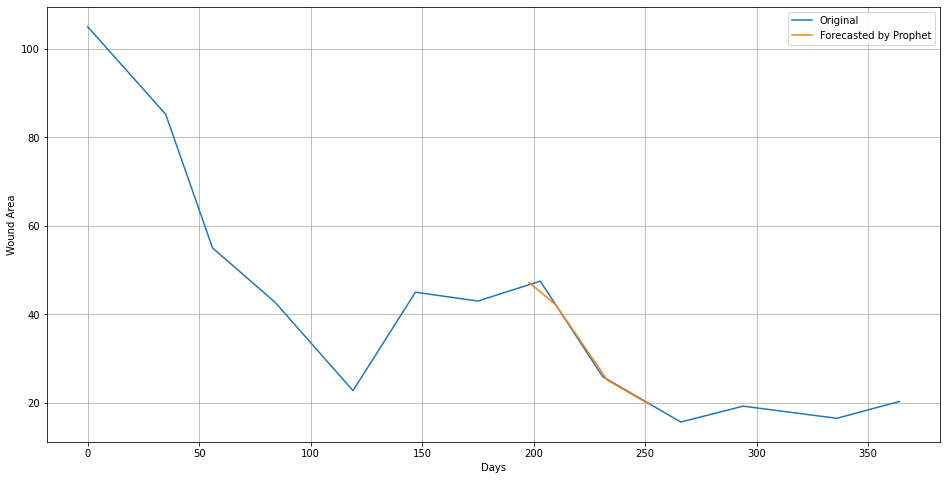

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 143
114
164
Initial log joint probability = -27.8082
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       338.527   0.000225364       84.3838      0.4099      0.4099      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       338.582   0.000192967       78.5824   2.483e-06       0.001      237  LS failed, Hessian reset 
     199       338.599   5.00033e-05       80.3432      0.8878      0.8878      303   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       338.649   0.000107947       72.7302   1.208e-06       0.001      364  LS failed, Hessian reset 
     272        338.69   6.58935e-07       84.4712   8.699e-09       0.001      472  LS failed, Hessian reset 
     293        338.69   3.19087e-08       79.5593      0.2514           1      498   
Optimization terminated normally: 
  Convergence detected: relative gr

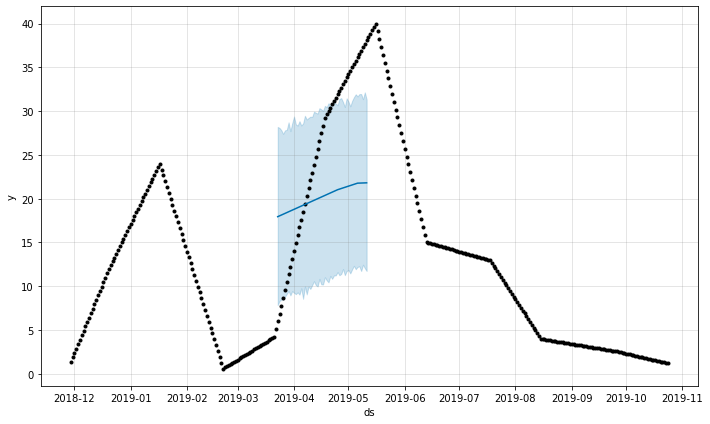

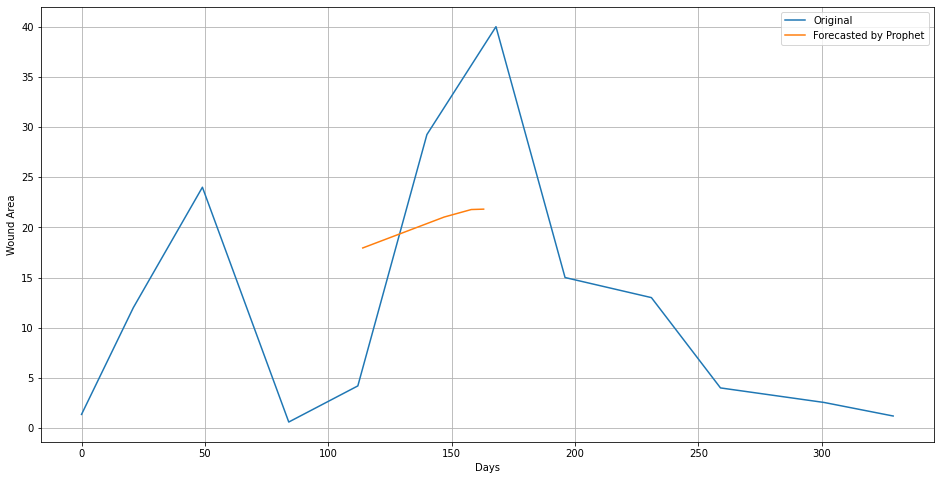

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 144
124
153
Initial log joint probability = -4.59493
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       619.481     0.0416946        2433.7           1           1      114   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       687.307    0.00896184       425.281           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       759.464     0.0073219       704.463           1           1      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       778.645    0.00552564       628.883           1           1      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       789.601   0.000848324       715.317      0.1938           1      609   
    Iter      log prob        ||dx||      ||g

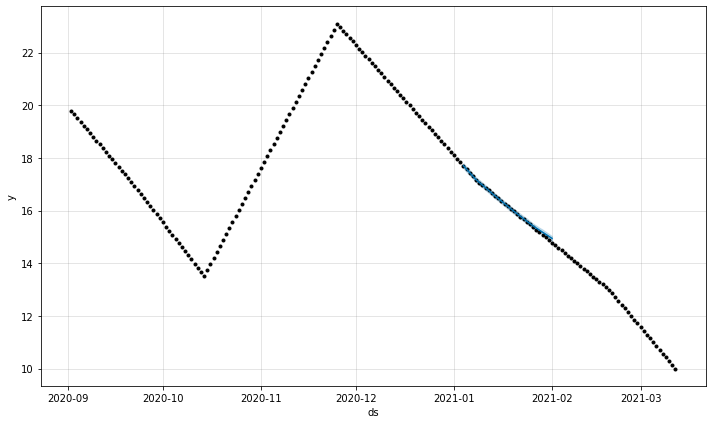

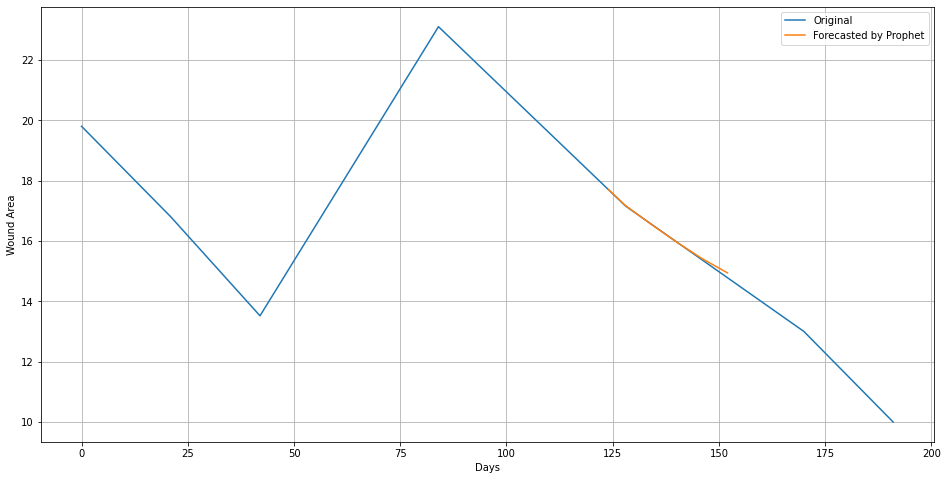

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 145
31
38

Initial log joint probability = -34.3848
Iteration  1. Log joint probability =    60.8123. Improved by 95.1971.
Iteration  2. Log joint probability =    131.659. Improved by 70.8466.
Iteration  3. Log joint probability =    161.728. Improved by 30.0691.
Iteration  4. Log joint probability =    167.803. Improved by 6.07546.
Iteration  5. Log joint probability =     167.87. Improved by 0.066283.
Iteration  6. Log joint probability =    167.887. Improved by 0.0175839.
Iteration  7. Log joint probability =    168.047. Improved by 0.160111.
Iteration  8. Log joint probability =    168.066. Improved by 0.0181971.
Iteration  9. Log joint probability =    168.203. Improved by 0.137802.
Iteration 10. Log joint probability =    168.244. Improved by 0.0404552.
Iteration 11. Log joint probability =    168.354. Improved by 0.110159.
Iteration 12. Log joint probability =    168.406. Improved by 0.0520546.
Iteration 13. Log joint probability =    168.494. Improved by 0.0878455.
Iter

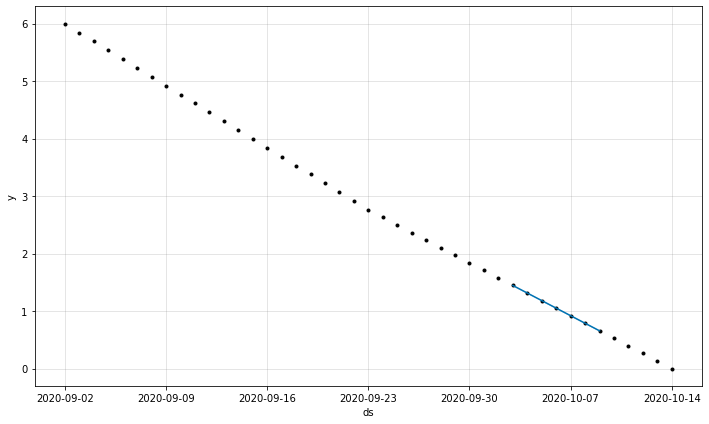

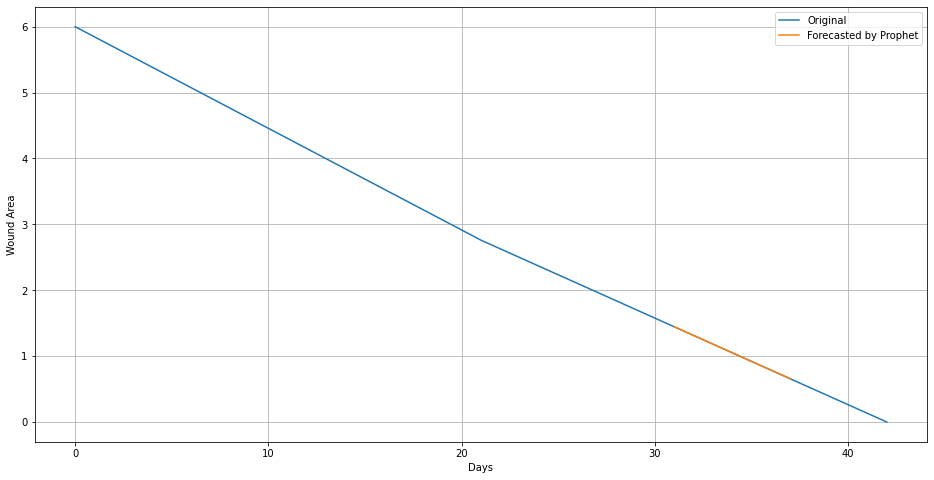

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 146
44
57

Initial log joint probability = -73.6896
Iteration  1. Log joint probability =     66.407. Improved by 140.097.
Iteration  2. Log joint probability =    136.339. Improved by 69.9322.
Iteration  3. Log joint probability =     136.36. Improved by 0.0209098.
Iteration  4. Log joint probability =    136.391. Improved by 0.0308637.
Iteration  5. Log joint probability =    149.977. Improved by 13.5863.
Iteration  6. Log joint probability =    149.995. Improved by 0.0180162.
Iteration  7. Log joint probability =    150.083. Improved by 0.0875579.
Iteration  8. Log joint probability =    151.162. Improved by 1.07871.
Iteration  9. Log joint probability =    151.495. Improved by 0.333367.
Iteration 10. Log joint probability =    153.412. Improved by 1.91683.
Iteration 11. Log joint probability =    153.574. Improved by 0.162601.
Iteration 12. Log joint probability =    153.697. Improved by 0.122557.
Iteration 13. Log joint probability =     153.78. Improved by 0.0830736.
Itera

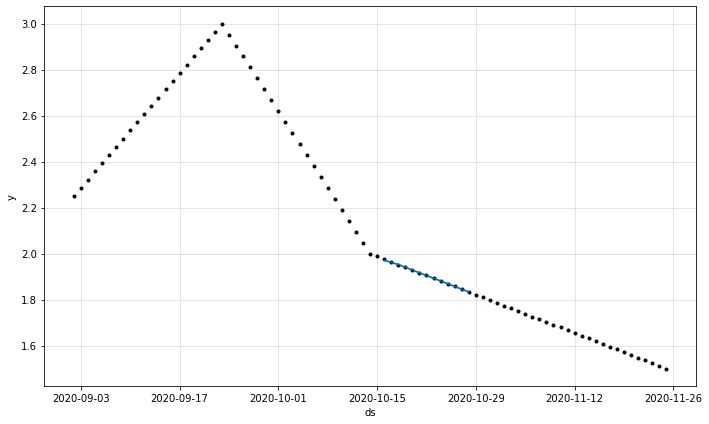

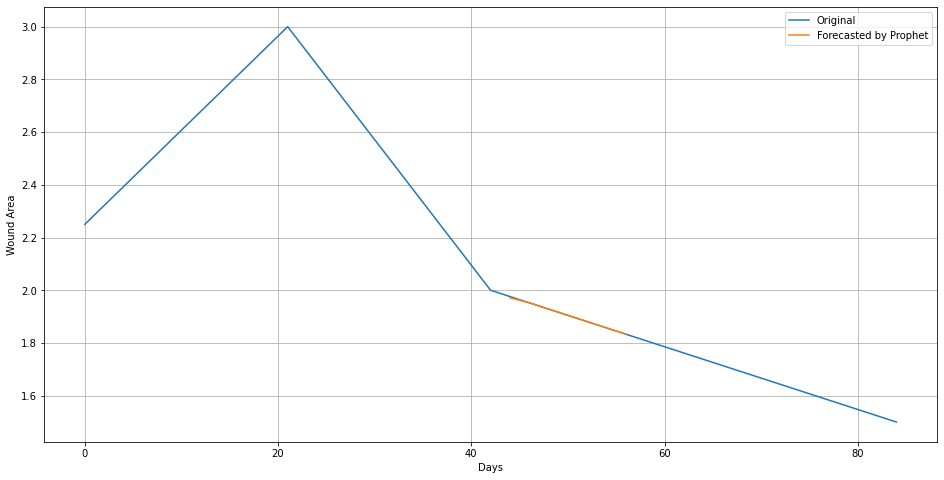

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 147
18
23

Initial log joint probability = -27.5373
Iteration  1. Log joint probability =    14.6719. Improved by 42.2092.
Iteration  2. Log joint probability =    33.1337. Improved by 18.4617.
Iteration  3. Log joint probability =    39.0407. Improved by 5.90702.
Iteration  4. Log joint probability =    40.9428. Improved by 1.90211.
Iteration  5. Log joint probability =    41.3803. Improved by 0.437518.
Iteration  6. Log joint probability =     41.386. Improved by 0.00565486.
Iteration  7. Log joint probability =    41.4439. Improved by 0.0578965.
Iteration  8. Log joint probability =    41.6114. Improved by 0.167571.
Iteration  9. Log joint probability =    41.6125. Improved by 0.00109465.
Iteration 10. Log joint probability =    41.6877. Improved by 0.0751212.
Iteration 11. Log joint probability =    41.6989. Improved by 0.0112752.
Iteration 12. Log joint probability =    41.7116. Improved by 0.0126601.
Iteration 13. Log joint probability =     41.753. Improved by 0.0414522.


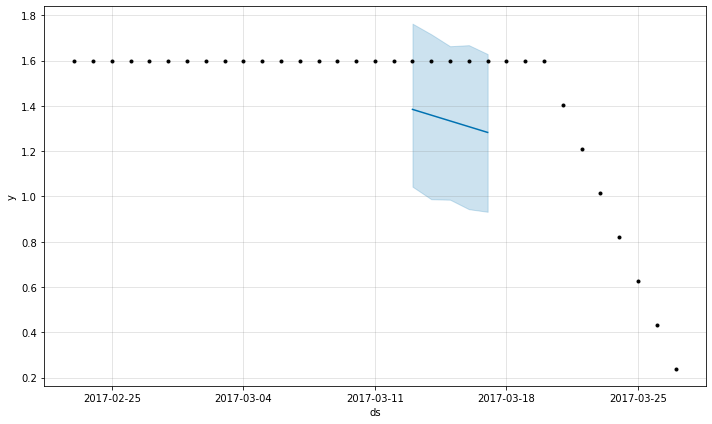

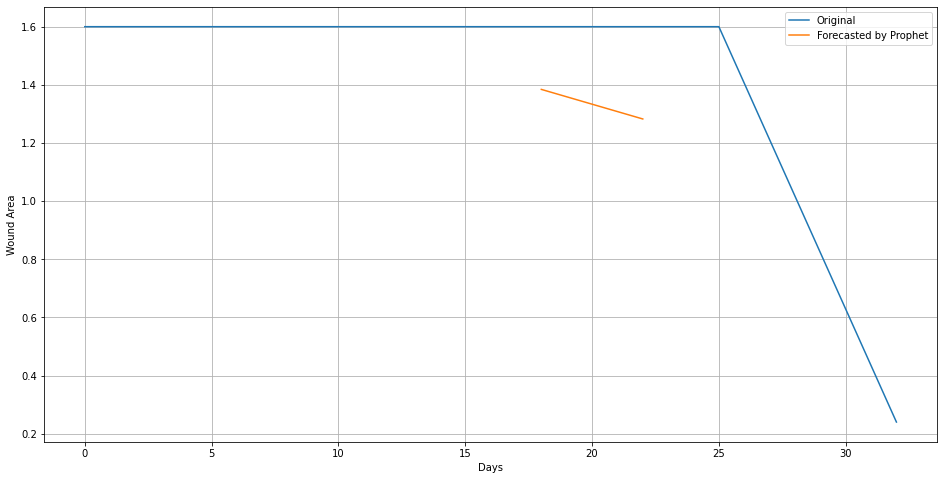

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 148
3
10

Initial log joint probability = -34.4965
Iteration  1. Log joint probability =    54.7494. Improved by 89.2459.
Iteration  2. Log joint probability =    84.1308. Improved by 29.3814.
Iteration  3. Log joint probability =    103.926. Improved by 19.7947.
Iteration  4. Log joint probability =    107.502. Improved by 3.57656.
Iteration  5. Log joint probability =    116.117. Improved by 8.61472.
Iteration  6. Log joint probability =    116.159. Improved by 0.0421228.
Iteration  7. Log joint probability =    116.159. Improved by 0.000482317.
Iteration  8. Log joint probability =    116.198. Improved by 0.038844.
Iteration  9. Log joint probability =    116.244. Improved by 0.0453194.
Iteration 10. Log joint probability =    116.617. Improved by 0.373638.
Iteration 11. Log joint probability =     116.67. Improved by 0.0526878.
Iteration 12. Log joint probability =    116.678. Improved by 0.00777731.
Iteration 13. Log joint probability =     116.83. Improved by 0.152469.
Ite

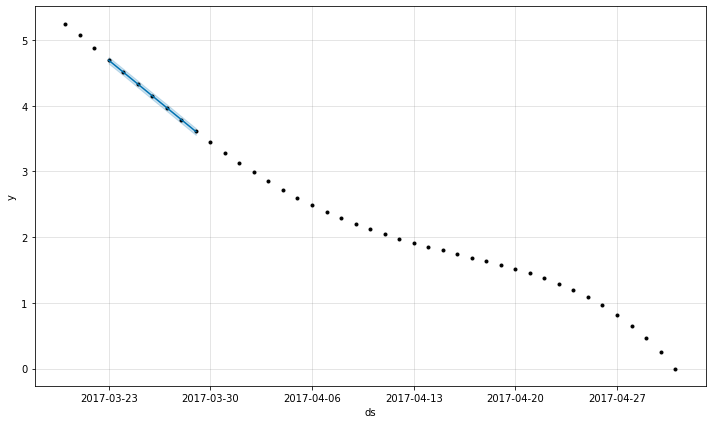

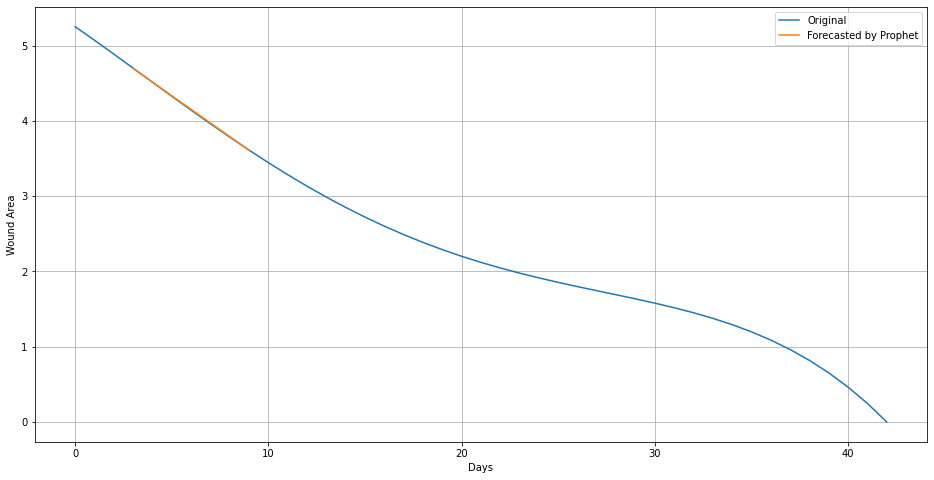

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 149
39
54
Initial log joint probability = -5.97149
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      94       96.1203   0.000133692       91.3639   1.462e-06       0.001      160  LS failed, Hessian reset 
      99       96.1246    1.9549e-05       101.129      0.5732      0.5732      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     139       96.1467   7.36516e-05       95.9644   8.004e-07       0.001      254  LS failed, Hessian reset 
     199       96.1537   3.62301e-08       71.5631      0.2827           1      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       96.1537   9.05348e-09       85.8029      0.4789      0.4789      342   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


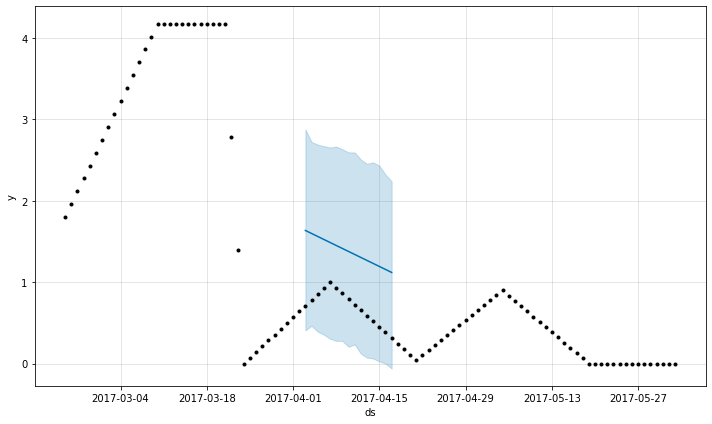

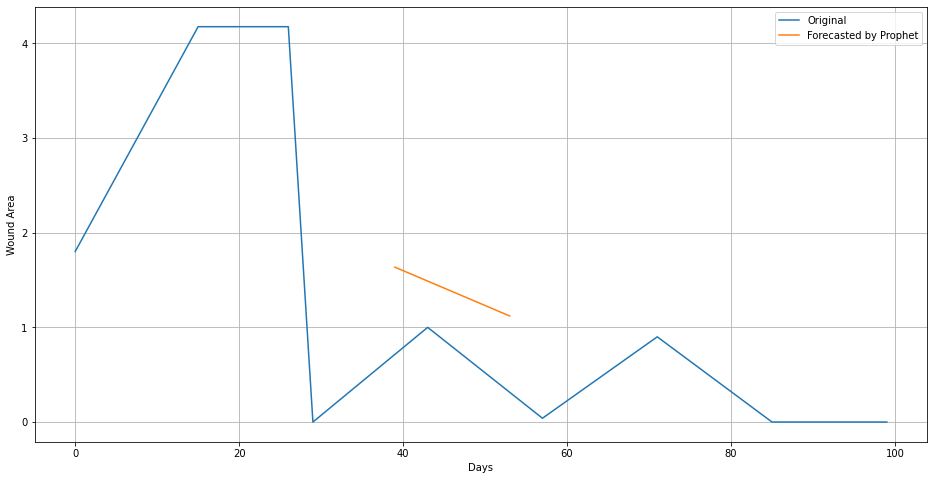

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


Wound: 150
16
21

Initial log joint probability = -36.7667
Iteration  1. Log joint probability =    10.9785. Improved by 47.7451.
Iteration  2. Log joint probability =    22.0306. Improved by 11.0521.
Iteration  3. Log joint probability =    23.0481. Improved by 1.01747.
Iteration  4. Log joint probability =    23.2546. Improved by 0.206517.
Iteration  5. Log joint probability =    23.5488. Improved by 0.294214.
Iteration  6. Log joint probability =     23.599. Improved by 0.0501801.
Iteration  7. Log joint probability =    23.6163. Improved by 0.0173285.
Iteration  8. Log joint probability =    23.6353. Improved by 0.0190122.
Iteration  9. Log joint probability =    23.6519. Improved by 0.0166184.
Iteration 10. Log joint probability =     23.705. Improved by 0.0530319.
Iteration 11. Log joint probability =    23.7111. Improved by 0.00617015.
Iteration 12. Log joint probability =    23.7151. Improved by 0.00394878.
Iteration 13. Log joint probability =    23.7169. Improved by 0.0018581

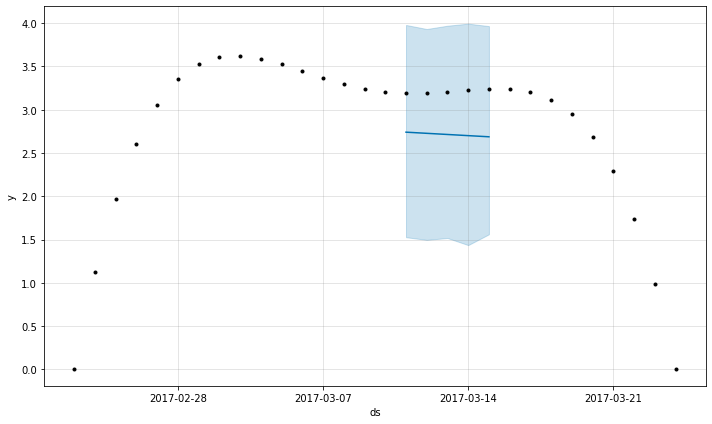

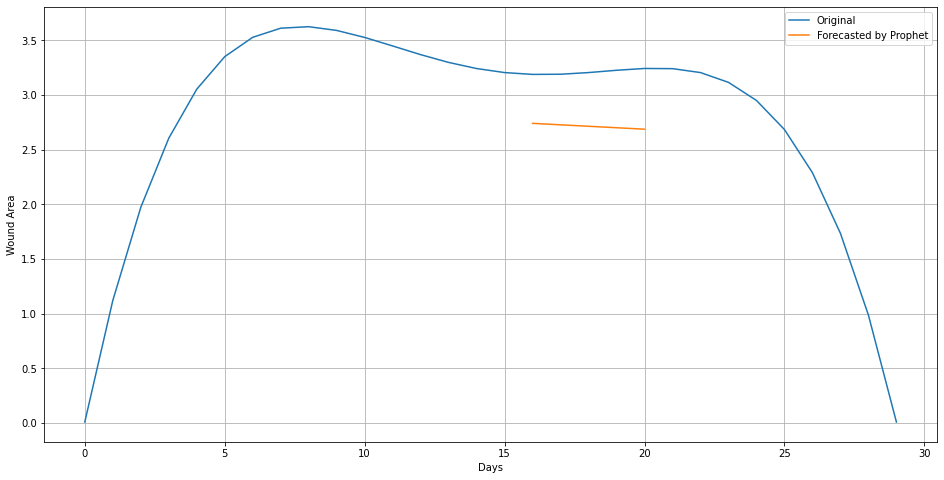

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 151
143
216
Initial log joint probability = -14.928
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1130.15     0.0151433       185.496           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     189       1133.79   0.000369116        62.864   1.567e-06       0.001      275  LS failed, Hessian reset 
     199       1134.23    0.00900426       232.714           1           1      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     282       1134.89   0.000248702       97.1586   2.354e-06       0.001      431  LS failed, Hessian reset 
     299       1135.01   0.000370344       53.1561      0.2771           1      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     380       1135.03   1.23257e-08       62.7716     0.02807           1      581   
Opt

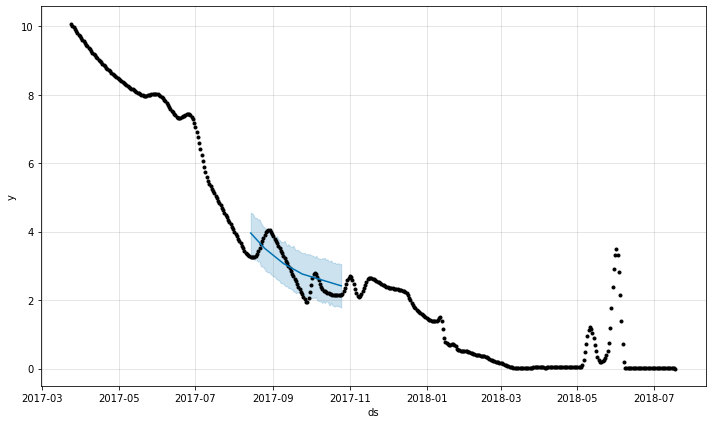

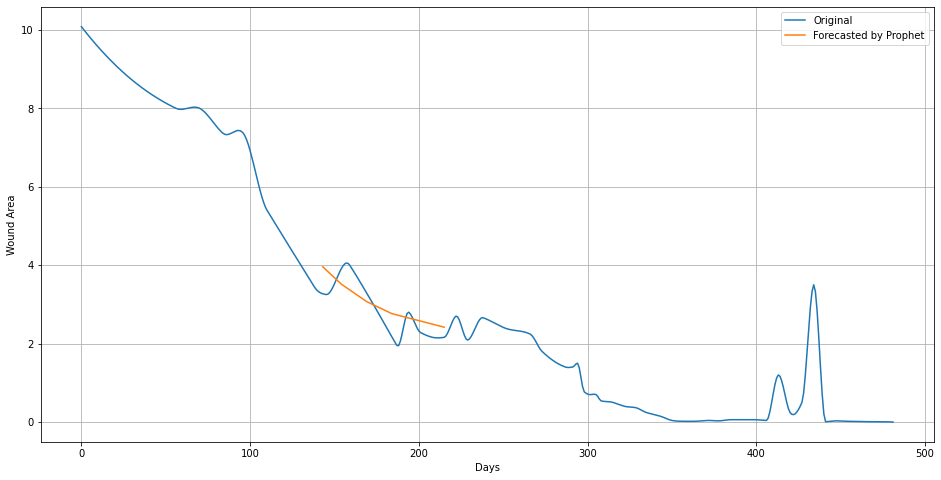

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 152
17
22

Initial log joint probability = -29.0781
Iteration  1. Log joint probability =    21.8856. Improved by 50.9637.
Iteration  2. Log joint probability =    35.3379. Improved by 13.4523.
Iteration  3. Log joint probability =    36.2501. Improved by 0.912215.
Iteration  4. Log joint probability =    36.6807. Improved by 0.430558.
Iteration  5. Log joint probability =    36.8973. Improved by 0.216647.
Iteration  6. Log joint probability =    36.9167. Improved by 0.0193493.
Iteration  7. Log joint probability =    36.9593. Improved by 0.0426254.
Iteration  8. Log joint probability =    37.0304. Improved by 0.0711241.
Iteration  9. Log joint probability =     37.248. Improved by 0.217531.
Iteration 10. Log joint probability =    37.3509. Improved by 0.102961.
Iteration 11. Log joint probability =    37.4594. Improved by 0.108447.
Iteration 12. Log joint probability =    37.5721. Improved by 0.112738.
Iteration 13. Log joint probability =    37.6001. Improved by 0.0279667.
Ite

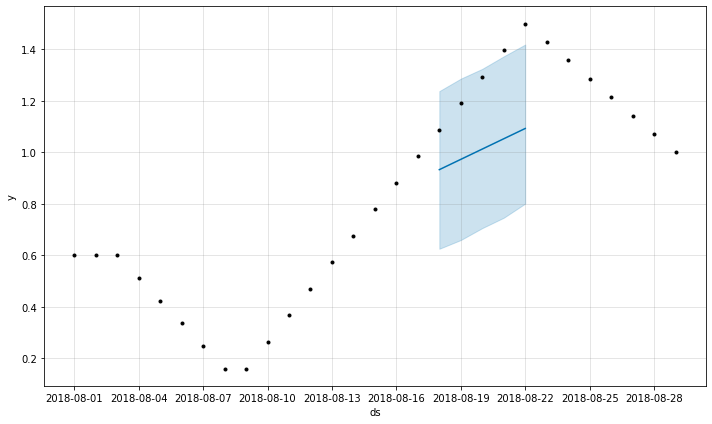

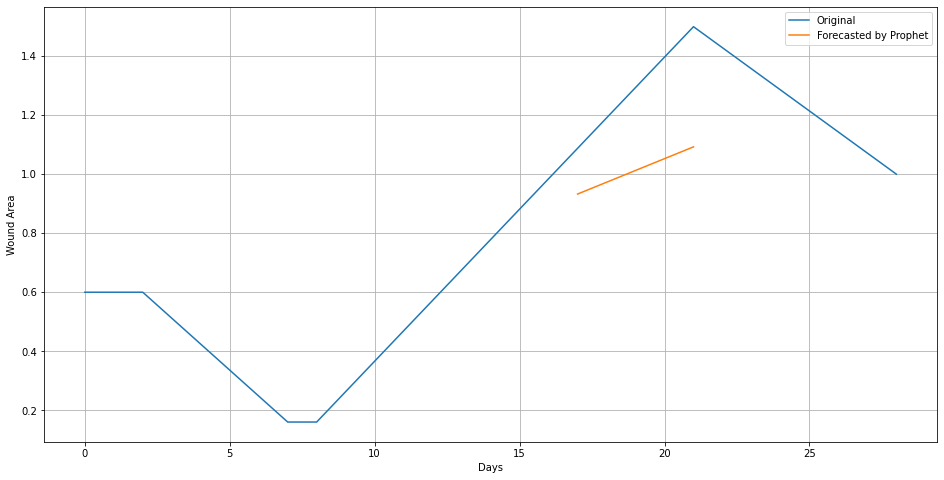

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 153
8
11

Initial log joint probability = -40.9209
Iteration  1. Log joint probability =    15.4392. Improved by 56.3601.
Iteration  2. Log joint probability =    22.2015. Improved by 6.76221.
Iteration  3. Log joint probability =    32.3305. Improved by 10.129.
Iteration  4. Log joint probability =    39.1655. Improved by 6.83506.
Iteration  5. Log joint probability =    39.7801. Improved by 0.614602.
Iteration  6. Log joint probability =    39.8261. Improved by 0.0459259.
Iteration  7. Log joint probability =    39.8576. Improved by 0.0315101.
Iteration  8. Log joint probability =     39.867. Improved by 0.00945698.
Iteration  9. Log joint probability =    42.8497. Improved by 2.98262.
Iteration 10. Log joint probability =    44.6035. Improved by 1.75382.
Iteration 11. Log joint probability =    45.4268. Improved by 0.823342.
Iteration 12. Log joint probability =    47.7543. Improved by 2.32752.
Iteration 13. Log joint probability =    49.6795. Improved by 1.92517.
Iteration 1

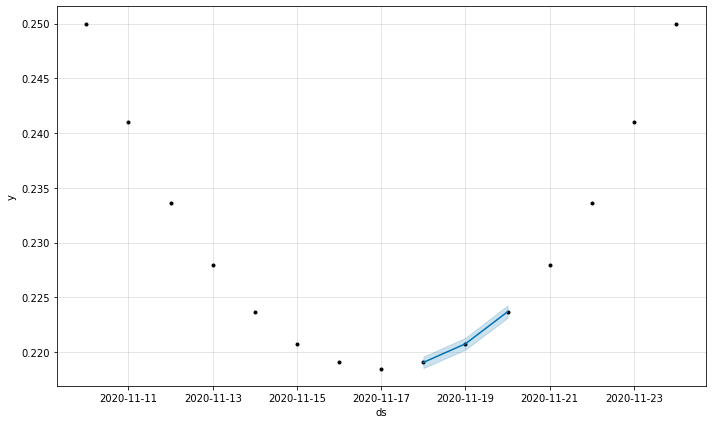

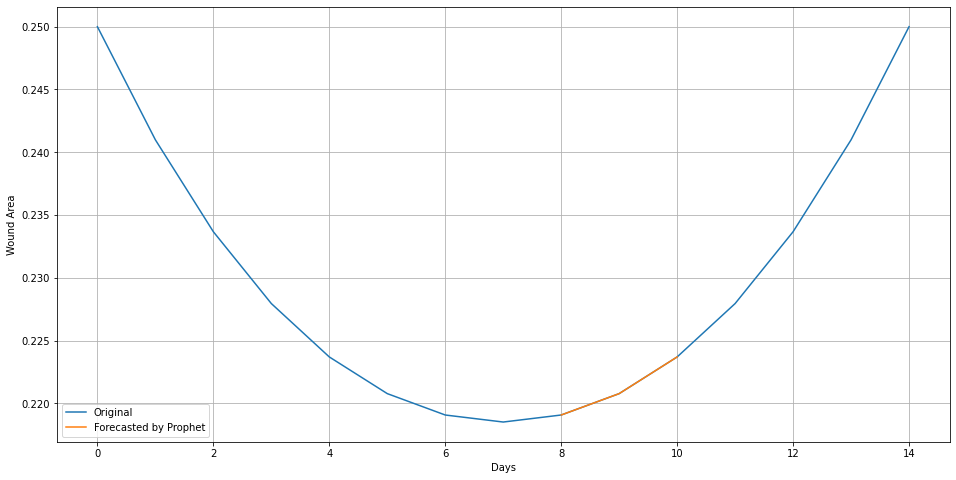

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 154
37
88
Initial log joint probability = -6.6314
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       469.921    0.00245364       71.0978   2.867e-05       0.001      137  LS failed, Hessian reset 
      99       470.068   1.54939e-05       83.3795      0.3884      0.3884      170   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       470.094   3.22912e-07       73.8287   3.816e-09       0.001      305  LS failed, Hessian reset 
     174       470.094   2.34858e-08       70.9181      0.1035      0.2576      321   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


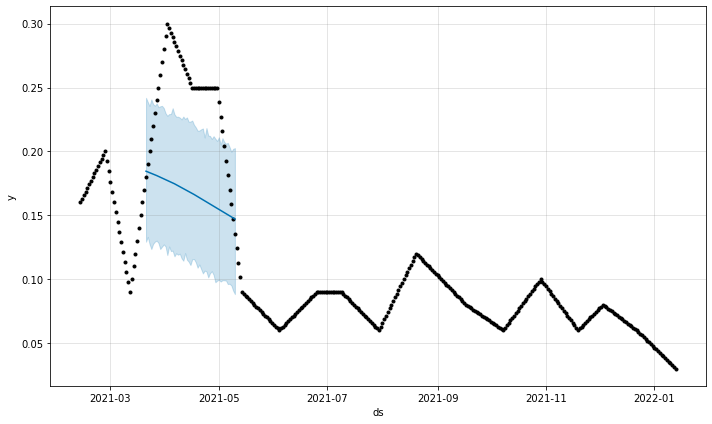

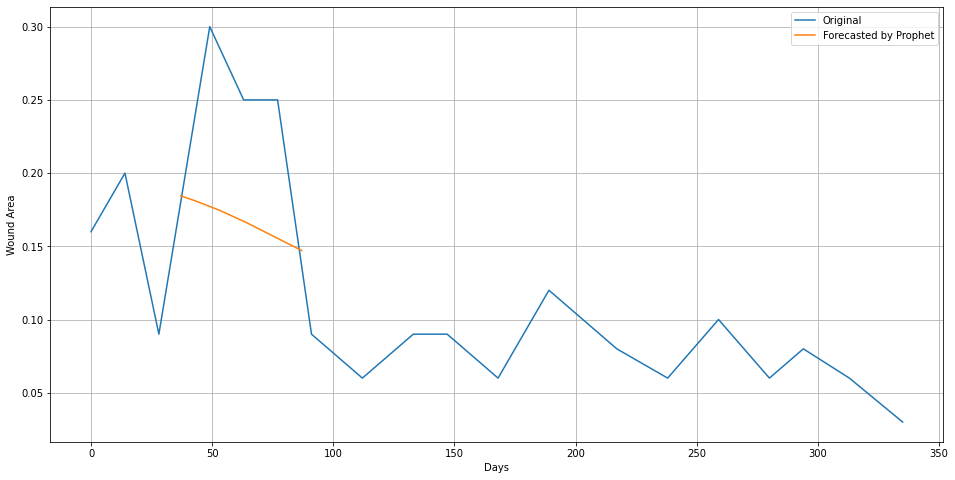

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 155
36
44

Initial log joint probability = -43.4317
Iteration  1. Log joint probability =    32.5981. Improved by 76.0298.
Iteration  2. Log joint probability =    54.5595. Improved by 21.9614.
Iteration  3. Log joint probability =    68.8978. Improved by 14.3383.
Iteration  4. Log joint probability =    69.9839. Improved by 1.08609.
Iteration  5. Log joint probability =      69.99. Improved by 0.0061731.
Iteration  6. Log joint probability =    69.9975. Improved by 0.00747502.
Iteration  7. Log joint probability =    70.3581. Improved by 0.360632.
Iteration  8. Log joint probability =    70.4037. Improved by 0.0456027.
Iteration  9. Log joint probability =    70.4191. Improved by 0.0153575.
Iteration 10. Log joint probability =    70.4615. Improved by 0.0424137.
Iteration 11. Log joint probability =    70.4804. Improved by 0.0189201.
Iteration 12. Log joint probability =    70.6362. Improved by 0.155768.
Iteration 13. Log joint probability =    70.6653. Improved by 0.0290716.
I

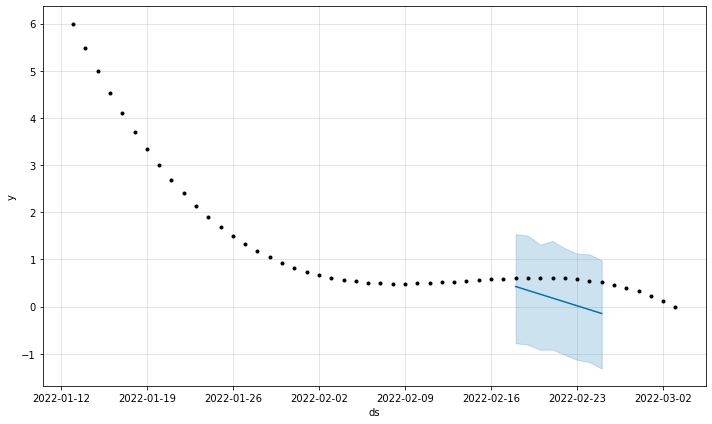

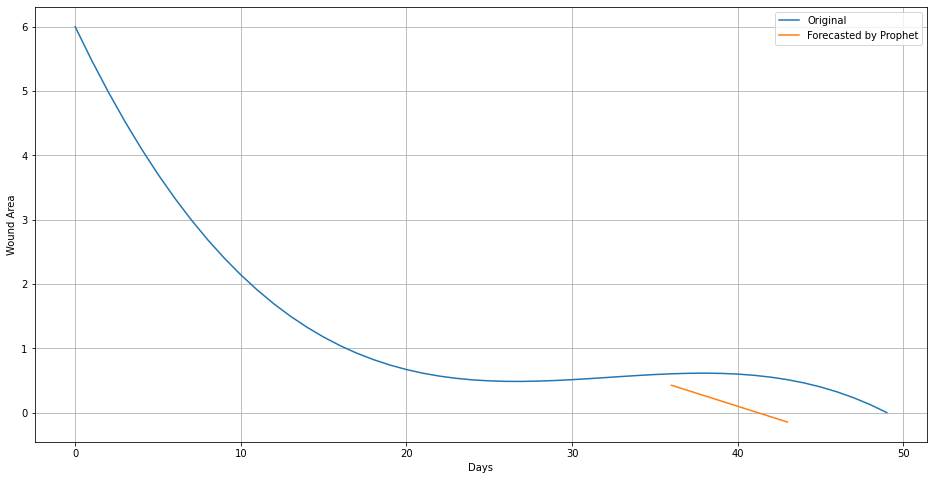

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 156
35
47

Initial log joint probability = -71.9487
Iteration  1. Log joint probability =    40.9598. Improved by 112.909.
Iteration  2. Log joint probability =    69.6796. Improved by 28.7198.
Iteration  3. Log joint probability =    72.7624. Improved by 3.08277.
Iteration  4. Log joint probability =    73.0595. Improved by 0.297172.
Iteration  5. Log joint probability =    73.0619. Improved by 0.0023526.
Iteration  6. Log joint probability =    73.0907. Improved by 0.0287717.
Iteration  7. Log joint probability =    73.1428. Improved by 0.052105.
Iteration  8. Log joint probability =    73.5403. Improved by 0.397501.
Iteration  9. Log joint probability =    73.6719. Improved by 0.131592.
Iteration 10. Log joint probability =    73.6762. Improved by 0.00430311.
Iteration 11. Log joint probability =    73.7148. Improved by 0.0386056.
Iteration 12. Log joint probability =    73.7425. Improved by 0.0276894.
Iteration 13. Log joint probability =    73.7851. Improved by 0.0426723.
I

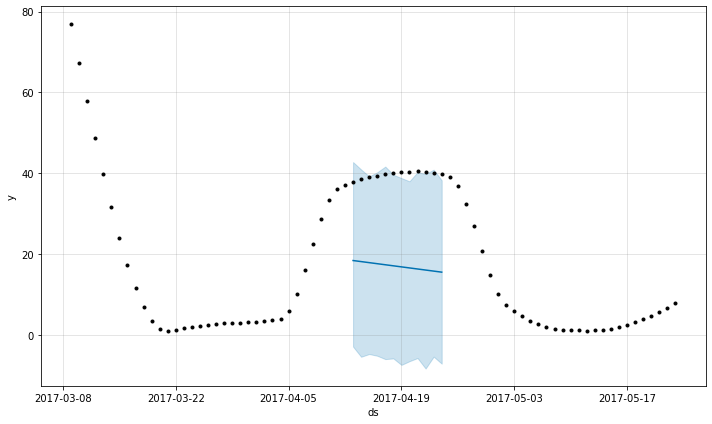

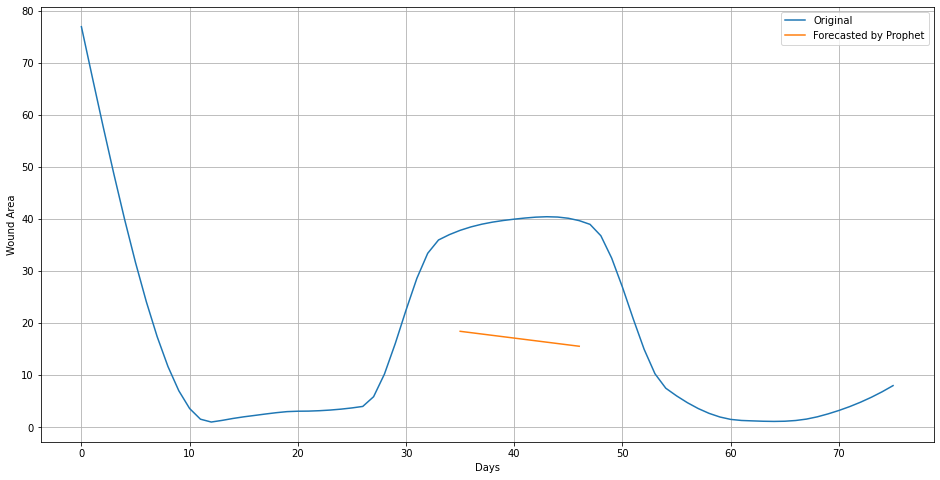

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 157
25
31

Initial log joint probability = -26.5139
Iteration  1. Log joint probability =    40.3724. Improved by 66.8864.
Iteration  2. Log joint probability =    45.5116. Improved by 5.13914.
Iteration  3. Log joint probability =    45.8994. Improved by 0.387831.
Iteration  4. Log joint probability =    45.9035. Improved by 0.00407228.
Iteration  5. Log joint probability =    45.9051. Improved by 0.001653.
Iteration  6. Log joint probability =    45.9187. Improved by 0.0135821.
Iteration  7. Log joint probability =    45.9442. Improved by 0.0255275.
Iteration  8. Log joint probability =    45.9602. Improved by 0.015998.
Iteration  9. Log joint probability =    46.1799. Improved by 0.219672.
Iteration 10. Log joint probability =    46.3435. Improved by 0.163564.
Iteration 11. Log joint probability =    46.3759. Improved by 0.0324019.
Iteration 12. Log joint probability =    46.3983. Improved by 0.022453.
Iteration 13. Log joint probability =    46.6761. Improved by 0.277817.
It

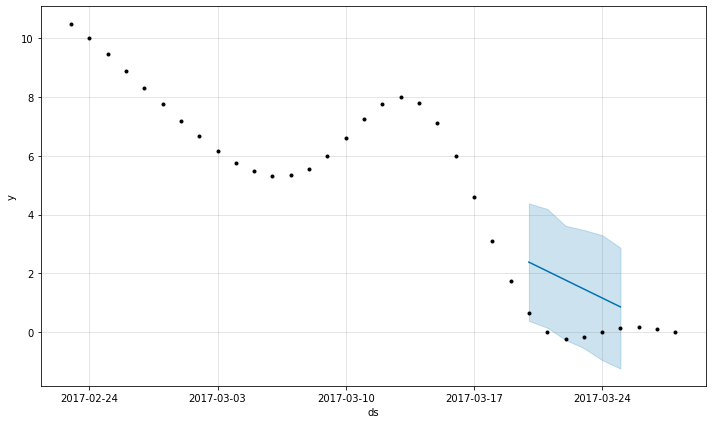

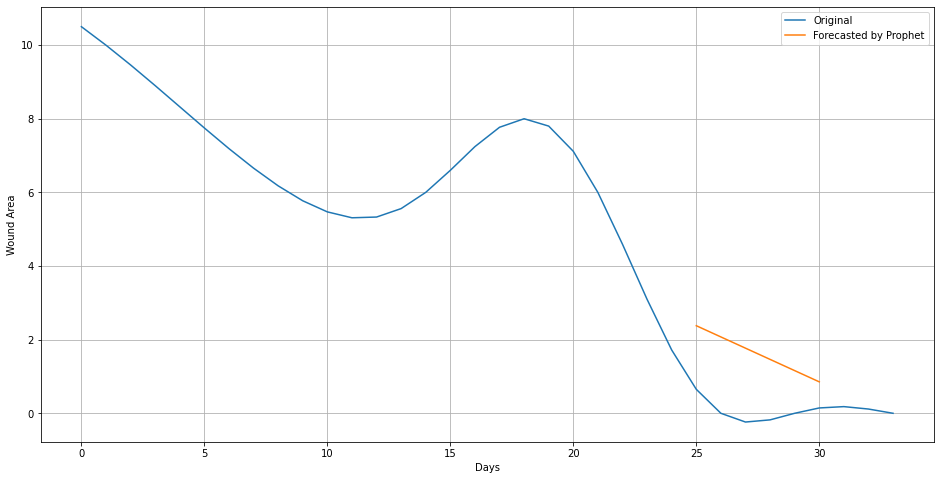

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 158
76
92
Initial log joint probability = -15.1097
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       90.2081    0.00111983       79.7029   1.009e-05       0.001      157  LS failed, Hessian reset 
      99       90.2264   6.55963e-05       60.0993      0.6422      0.6422      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       90.2608   4.60021e-05       58.9224   6.542e-07       0.001      308  LS failed, Hessian reset 
     199       90.2638   1.25061e-06       70.0653      0.2439      0.7345      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       90.2897    0.00168301       97.8164      0.2398      0.7055      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       90.3474   4.53856e-06       102.507           1           1      607   
    

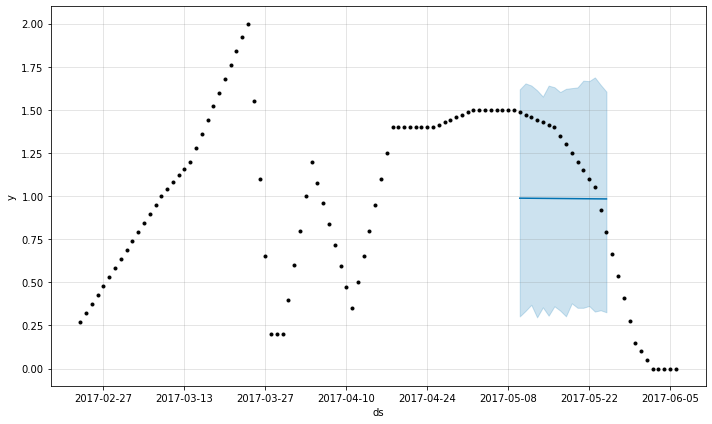

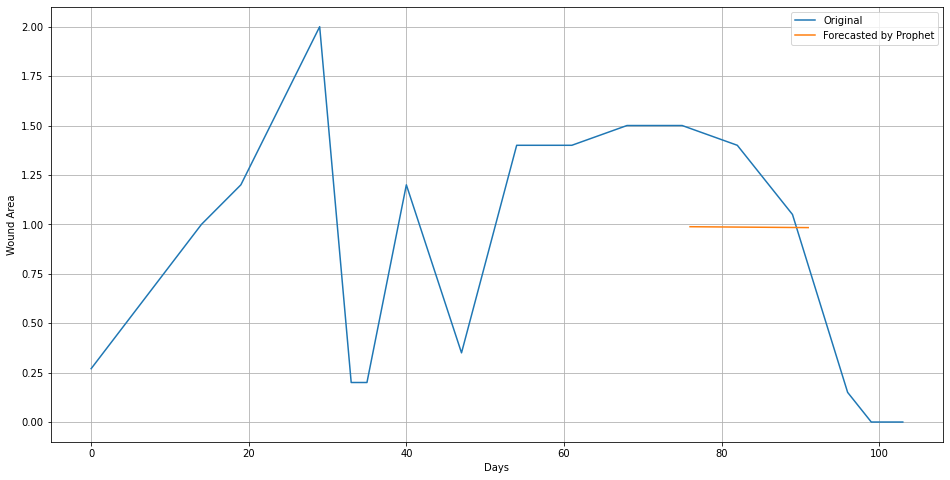

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 159
10
23

Initial log joint probability = -75.0693
Iteration  1. Log joint probability =    63.2869. Improved by 138.356.
Iteration  2. Log joint probability =    105.384. Improved by 42.0973.
Iteration  3. Log joint probability =    108.085. Improved by 2.70129.
Iteration  4. Log joint probability =    110.641. Improved by 2.55601.
Iteration  5. Log joint probability =    110.645. Improved by 0.00327591.
Iteration  6. Log joint probability =    110.656. Improved by 0.0115271.
Iteration  7. Log joint probability =    110.727. Improved by 0.0711385.
Iteration  8. Log joint probability =     111.21. Improved by 0.482154.
Iteration  9. Log joint probability =    111.254. Improved by 0.0442891.
Iteration 10. Log joint probability =     111.26. Improved by 0.00635848.
Iteration 11. Log joint probability =    111.296. Improved by 0.035292.
Iteration 12. Log joint probability =    111.408. Improved by 0.112616.
Iteration 13. Log joint probability =    111.425. Improved by 0.0166613.
I

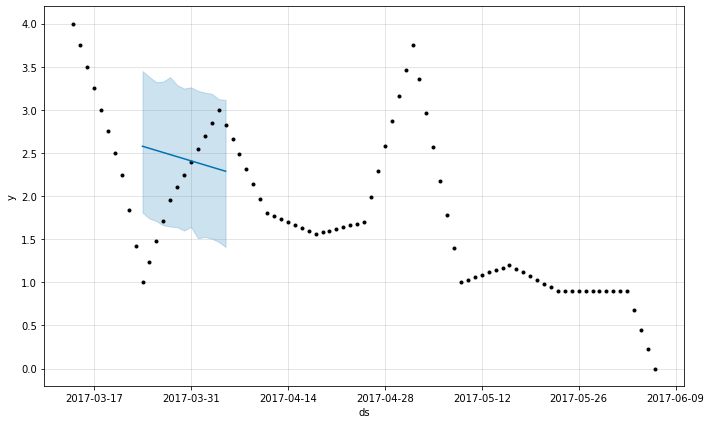

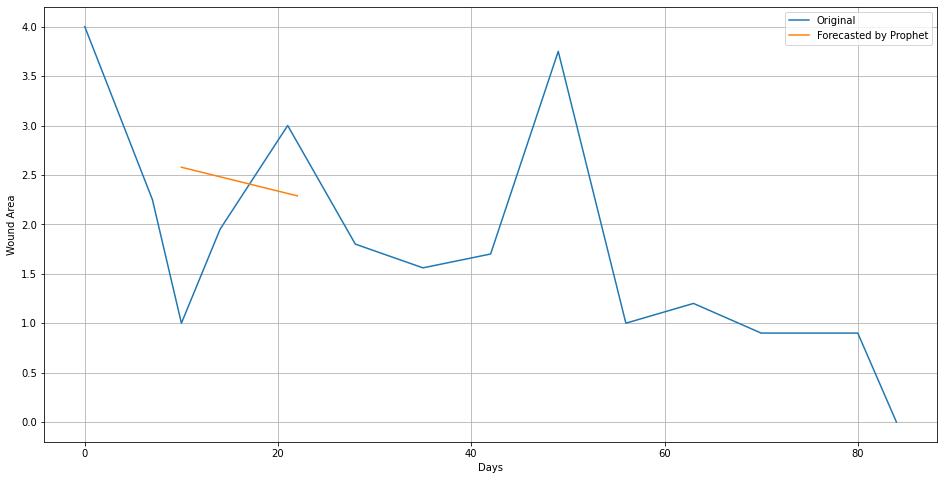

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


Wound: 160
6
8

Initial log joint probability = -27.1818
Iteration  1. Log joint probability =   -1.70602. Improved by 25.4758.
Iteration  2. Log joint probability =    4.03388. Improved by 5.7399.
Iteration  3. Log joint probability =    6.12724. Improved by 2.09337.
Iteration  4. Log joint probability =    6.97295. Improved by 0.845709.
Iteration  5. Log joint probability =    6.98752. Improved by 0.0145669.
Iteration  6. Log joint probability =    7.05422. Improved by 0.0666978.
Iteration  7. Log joint probability =     7.0663. Improved by 0.012084.
Iteration  8. Log joint probability =    7.21753. Improved by 0.151229.
Iteration  9. Log joint probability =    7.24498. Improved by 0.0274457.
Iteration 10. Log joint probability =    7.25508. Improved by 0.0101053.
Iteration 11. Log joint probability =    7.26181. Improved by 0.00672738.
Iteration 12. Log joint probability =    7.26603. Improved by 0.00422666.
Iteration 13. Log joint probability =    7.26613. Improved by 0.000100239.


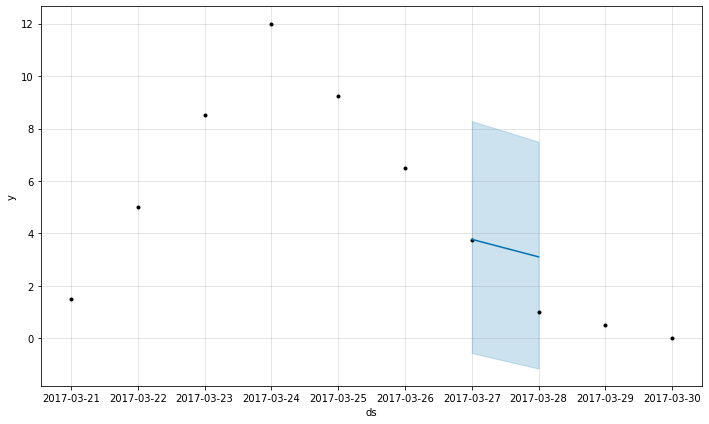

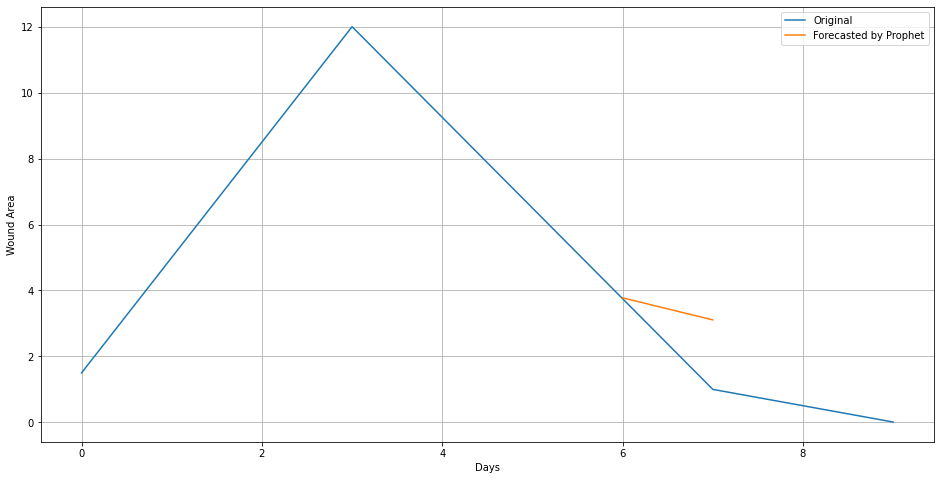

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 161
73
87

Initial log joint probability = -82.8748
Iteration  1. Log joint probability =    61.2115. Improved by 144.086.
Iteration  2. Log joint probability =     128.58. Improved by 67.3681.
Iteration  3. Log joint probability =    163.632. Improved by 35.052.
Iteration  4. Log joint probability =    168.811. Improved by 5.17909.
Iteration  5. Log joint probability =    168.913. Improved by 0.102433.
Iteration  6. Log joint probability =    169.226. Improved by 0.312756.
Iteration  7. Log joint probability =    169.767. Improved by 0.541209.
Iteration  8. Log joint probability =    169.889. Improved by 0.121453.
Iteration  9. Log joint probability =    170.224. Improved by 0.335789.
Iteration 10. Log joint probability =    170.231. Improved by 0.0070486.
Iteration 11. Log joint probability =    172.132. Improved by 1.90094.
Iteration 12. Log joint probability =    173.027. Improved by 0.894259.
Iteration 13. Log joint probability =    173.941. Improved by 0.914149.
Iteration 

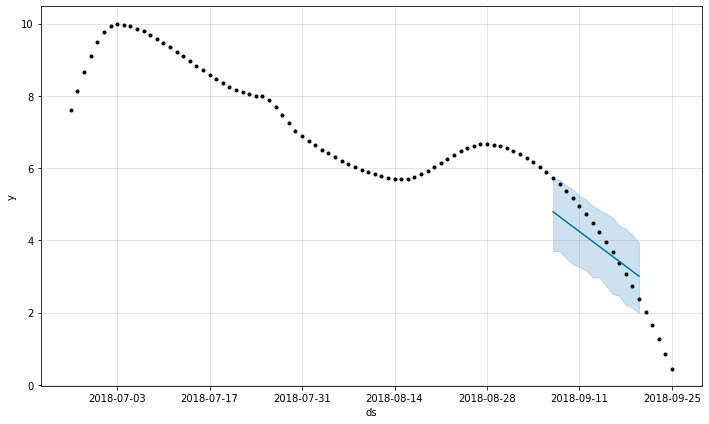

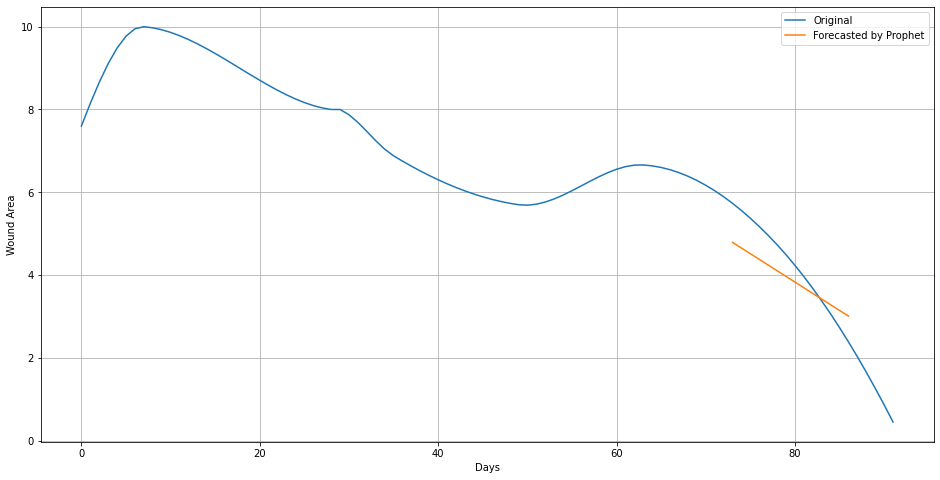

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


Wound: 162
7
12

Initial log joint probability = -27.2597
Iteration  1. Log joint probability =    28.5803. Improved by 55.8401.
Iteration  2. Log joint probability =    36.5574. Improved by 7.97705.
Iteration  3. Log joint probability =     61.638. Improved by 25.0806.
Iteration  4. Log joint probability =    65.5476. Improved by 3.90961.
Iteration  5. Log joint probability =    65.9847. Improved by 0.437077.
Iteration  6. Log joint probability =    66.0199. Improved by 0.0352124.
Iteration  7. Log joint probability =    66.0574. Improved by 0.0374923.
Iteration  8. Log joint probability =    66.0668. Improved by 0.00940056.
Iteration  9. Log joint probability =    66.0848. Improved by 0.0179414.
Iteration 10. Log joint probability =    66.1526. Improved by 0.0678093.
Iteration 11. Log joint probability =    66.1863. Improved by 0.0337442.
Iteration 12. Log joint probability =     66.764. Improved by 0.577632.
Iteration 13. Log joint probability =    69.7671. Improved by 3.00315.
Iter

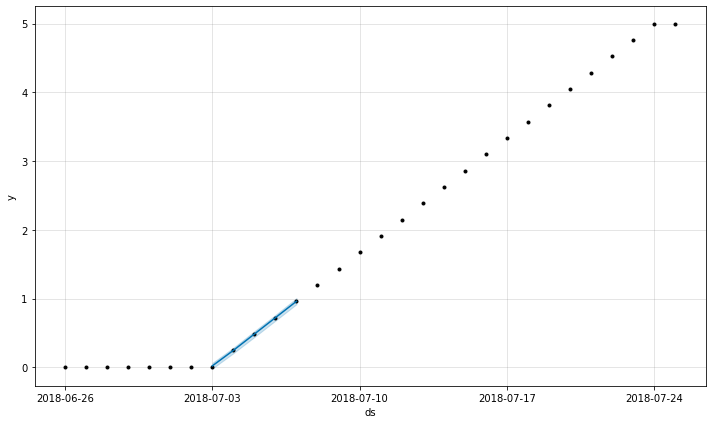

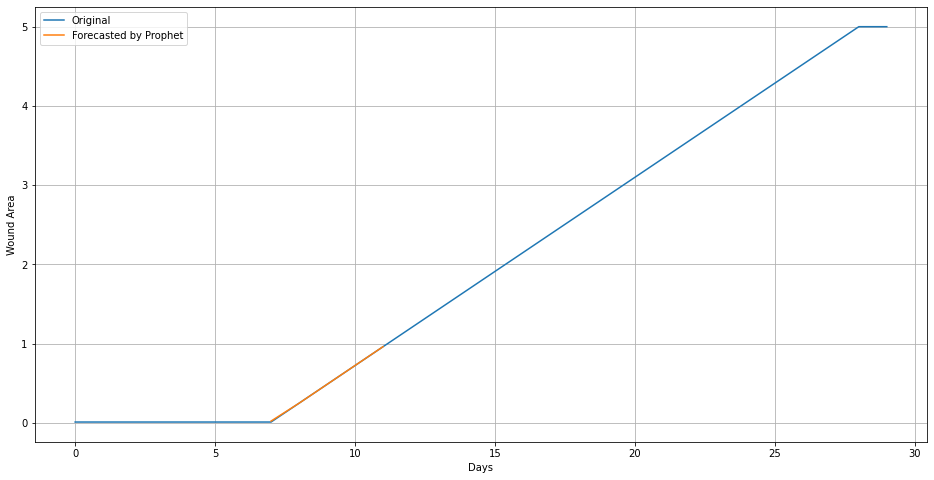

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 163
24
30

Initial log joint probability = -31.1435
Iteration  1. Log joint probability =     18.543. Improved by 49.6865.
Iteration  2. Log joint probability =    39.4852. Improved by 20.9422.
Iteration  3. Log joint probability =    42.6856. Improved by 3.20037.
Iteration  4. Log joint probability =    42.7816. Improved by 0.0960379.
Iteration  5. Log joint probability =      42.81. Improved by 0.0283373.
Iteration  6. Log joint probability =    42.8263. Improved by 0.0163433.
Iteration  7. Log joint probability =    42.8304. Improved by 0.00414389.
Iteration  8. Log joint probability =    42.8383. Improved by 0.00788418.
Iteration  9. Log joint probability =    42.8405. Improved by 0.00214631.
Iteration 10. Log joint probability =    42.8575. Improved by 0.0170276.
Iteration 11. Log joint probability =    42.8646. Improved by 0.0071215.
Iteration 12. Log joint probability =     42.868. Improved by 0.00333307.
Iteration 13. Log joint probability =    42.8702. Improved by 0.002

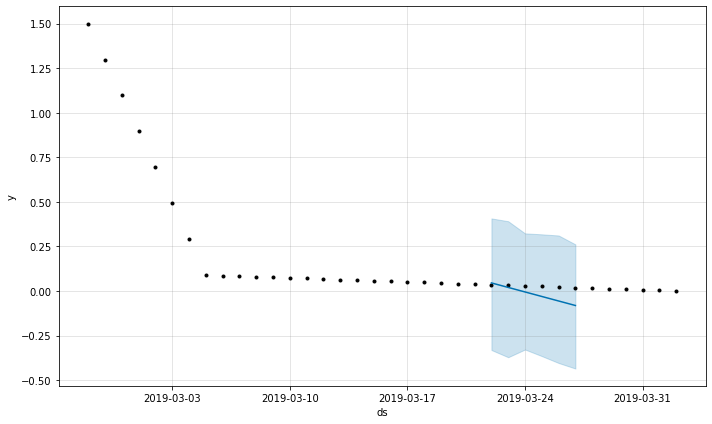

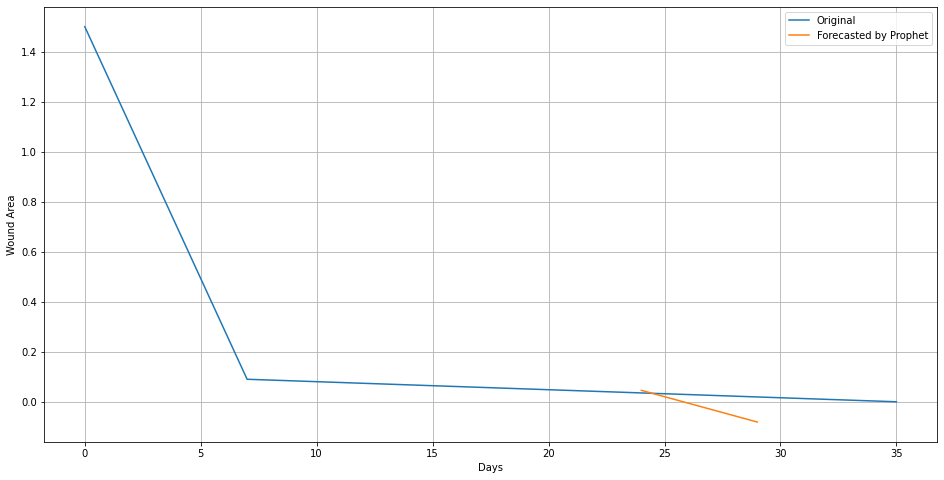

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 164
6
12

Initial log joint probability = -28.8767
Iteration  1. Log joint probability =    26.6631. Improved by 55.5398.
Iteration  2. Log joint probability =     49.495. Improved by 22.8319.
Iteration  3. Log joint probability =    59.1232. Improved by 9.62818.
Iteration  4. Log joint probability =    63.9914. Improved by 4.86819.
Iteration  5. Log joint probability =    64.2738. Improved by 0.282419.
Iteration  6. Log joint probability =    64.2966. Improved by 0.0227912.
Iteration  7. Log joint probability =    64.3491. Improved by 0.0524944.
Iteration  8. Log joint probability =     64.498. Improved by 0.148903.
Iteration  9. Log joint probability =    64.5282. Improved by 0.0302915.
Iteration 10. Log joint probability =    64.6822. Improved by 0.153942.
Iteration 11. Log joint probability =    64.6874. Improved by 0.00522652.
Iteration 12. Log joint probability =    64.6914. Improved by 0.00393533.
Iteration 13. Log joint probability =    64.7116. Improved by 0.0202488.
It

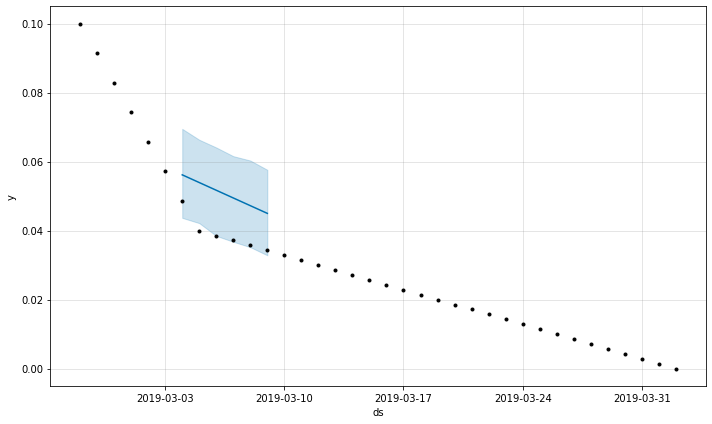

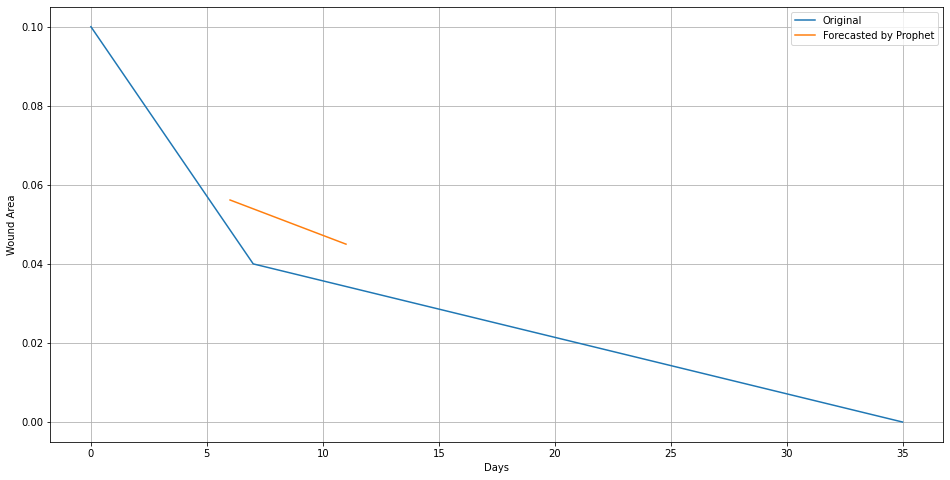

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 165
30
43

Initial log joint probability = -75.5691
Iteration  1. Log joint probability =    45.4601. Improved by 121.029.
Iteration  2. Log joint probability =    103.444. Improved by 57.9842.
Iteration  3. Log joint probability =    108.057. Improved by 4.61246.
Iteration  4. Log joint probability =    118.133. Improved by 10.0758.
Iteration  5. Log joint probability =    119.105. Improved by 0.972515.
Iteration  6. Log joint probability =    119.174. Improved by 0.0685409.
Iteration  7. Log joint probability =    119.185. Improved by 0.0117917.
Iteration  8. Log joint probability =    119.244. Improved by 0.0583965.
Iteration  9. Log joint probability =    119.362. Improved by 0.118214.
Iteration 10. Log joint probability =    119.368. Improved by 0.00643498.
Iteration 11. Log joint probability =    119.383. Improved by 0.0143951.
Iteration 12. Log joint probability =    119.536. Improved by 0.153445.
Iteration 13. Log joint probability =    119.576. Improved by 0.0396241.
It

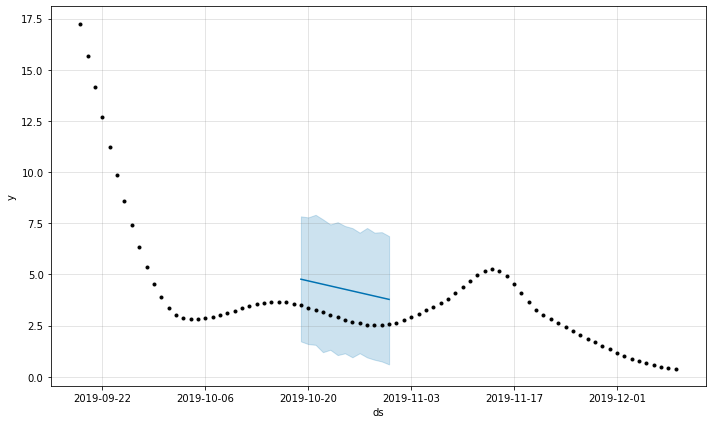

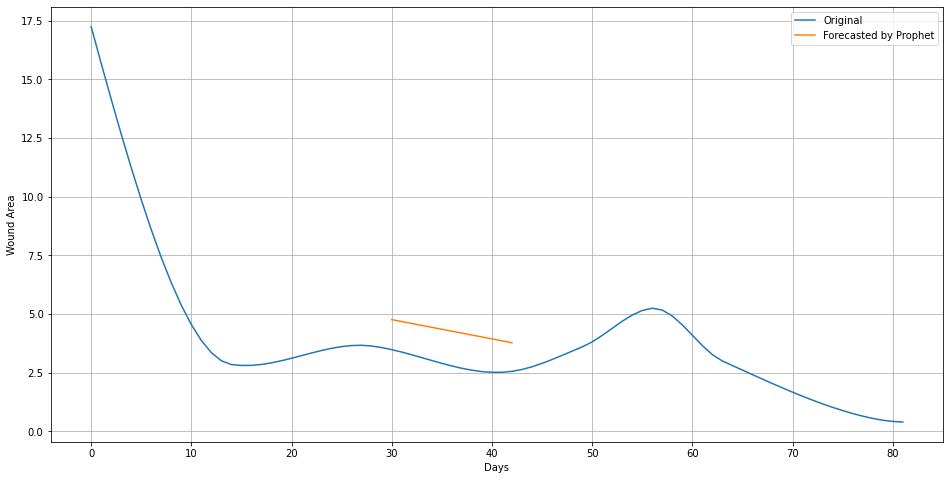

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 166
94
123
Initial log joint probability = -9.89034
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       643.743     0.0335929       600.816           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        679.44    0.00648817       983.195      0.1956     0.01956      254   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       693.444    0.00637231       281.619           1           1      392   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       718.716     0.0175587        1298.1     0.06761           1      523   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       738.744   0.000421329       2044.64      0.1681      0.1681      641   
    Iter      log prob        ||dx||      ||gr

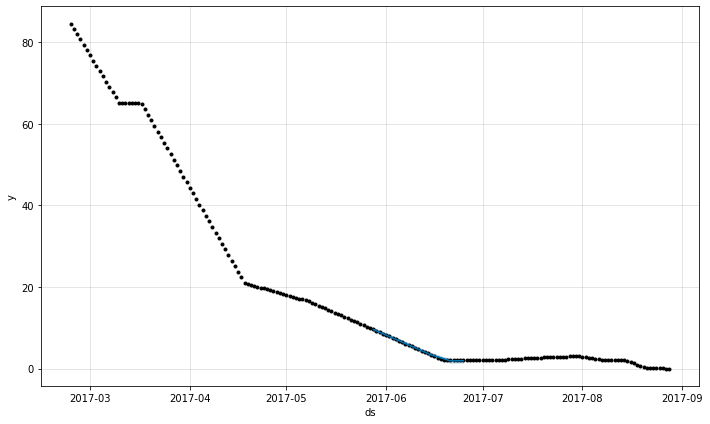

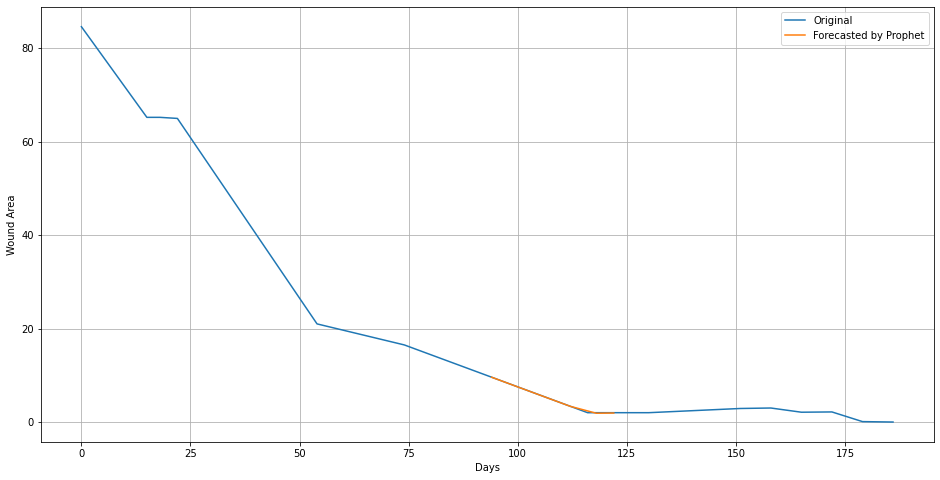

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 167
36
62
Initial log joint probability = -12.1672
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       301.255    0.00439003       82.6333   0.0001043       0.001      162  LS failed, Hessian reset 
      99       301.714     0.0133655       48.4071           1           1      174   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       303.039    0.00938083       91.7836   0.0001302       0.001      339  LS failed, Hessian reset 
     199       303.935    0.00059436       66.0074      0.3019      0.3019      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       304.001   0.000333967       57.5588   8.198e-06       0.001      439  LS failed, Hessian reset 
     232       304.016   2.71887e-07       40.9952   5.985e-09       0.001      517  LS failed, Hessian reset 
     240       304.016   6.65326e-09       35.11

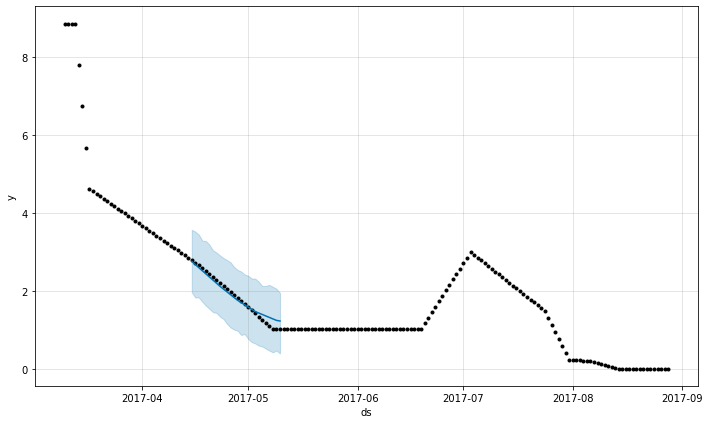

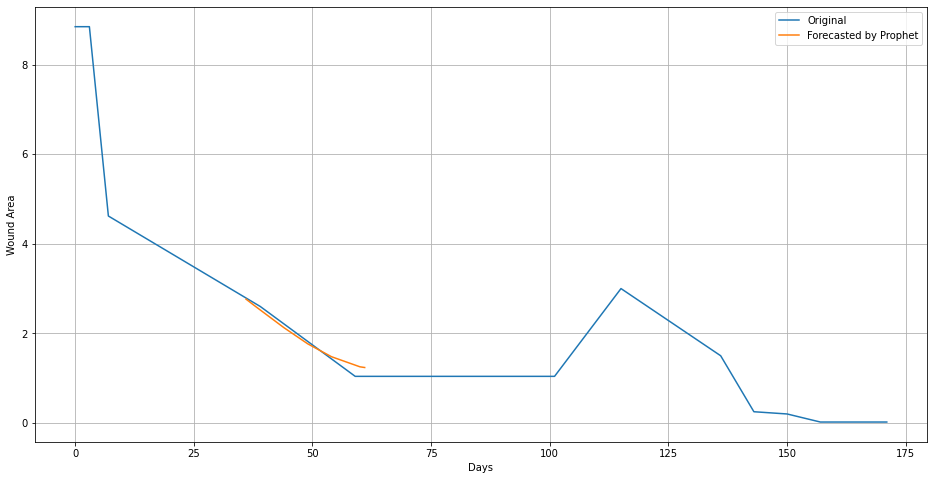

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 168
9
25
Initial log joint probability = -2.61022
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       304.307     0.0524556       578.363           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        331.31      0.026066       314.314      0.8009      0.8009      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       347.213     0.0230848        1261.1      0.9223      0.9223      381   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     328       353.853   9.35702e-05        266.16   2.441e-07       0.001      449  LS failed, Hessian reset 
     399        364.16   0.000361173       373.642     0.08234     0.08234      550   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       374.094  

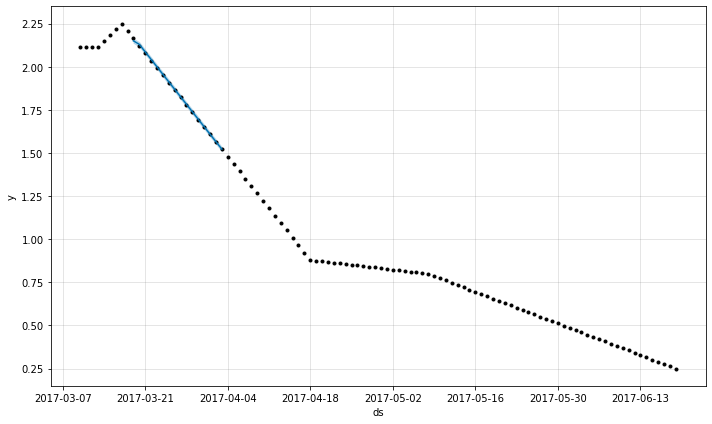

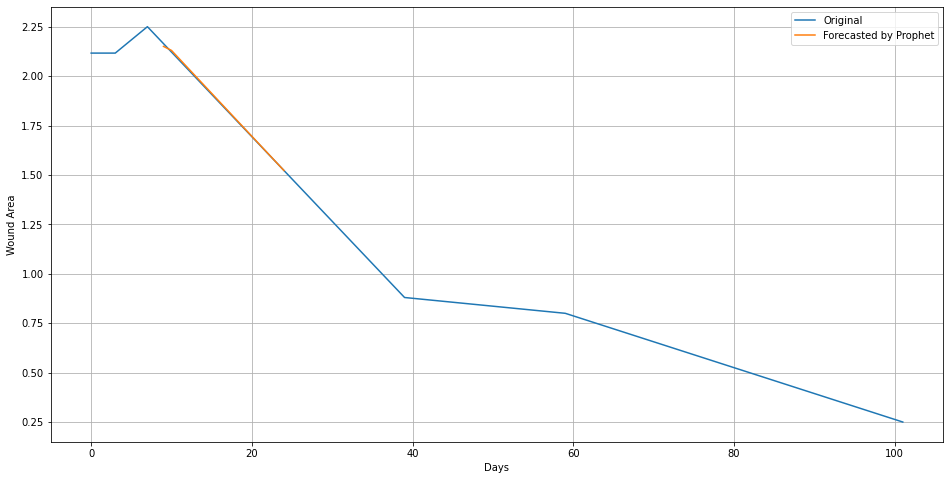

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 169
84
106
Initial log joint probability = -3.16662
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       295.047   3.78131e-05       99.6807           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       295.358   0.000420162       90.2688    4.77e-06       0.001      220  LS failed, Hessian reset 
     199       295.397   3.94135e-06       58.2769      0.5629      0.5629      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       295.426    6.4549e-06        79.075      0.1504           1      421   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     340       295.429   2.24296e-05       70.2115    2.36e-07       0.001      520  LS failed, Hessian reset 
     399       295.433   1.13663e-05        68.661           1           1      597   
   

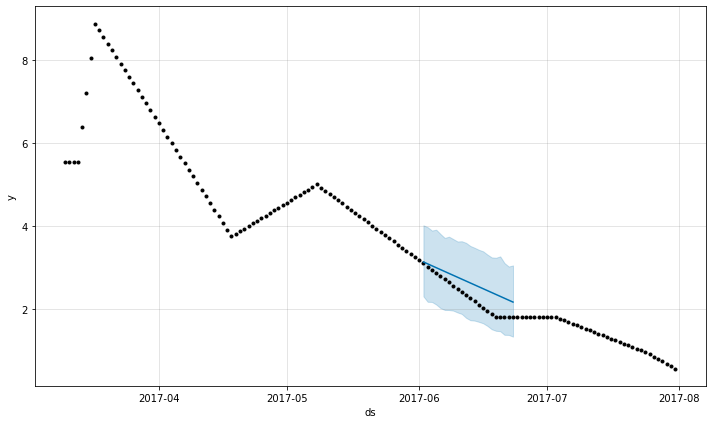

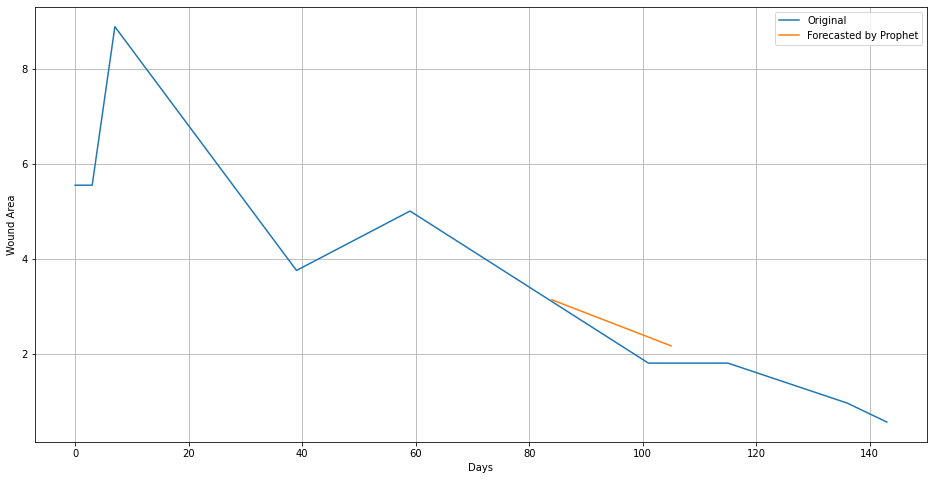

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 170
9
35
Initial log joint probability = -8.10654
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       232.253   2.19647e-06       58.3495           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       232.266   7.32806e-05       87.2193   7.182e-07       0.001      213  LS failed, Hessian reset 
     199       232.275   4.55618e-06       85.4205      0.8568      0.8568      302   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     236       232.432   0.000924107       96.7041   9.449e-06       0.001      392  LS failed, Hessian reset 
     299       232.568   0.000449921       62.8058           1           1      466   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       232.862   4.92619e-06       88.4499      0.7441      0.7441      594   
    I

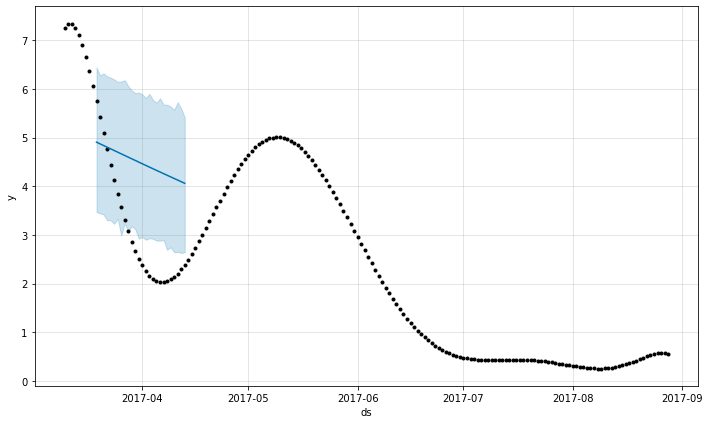

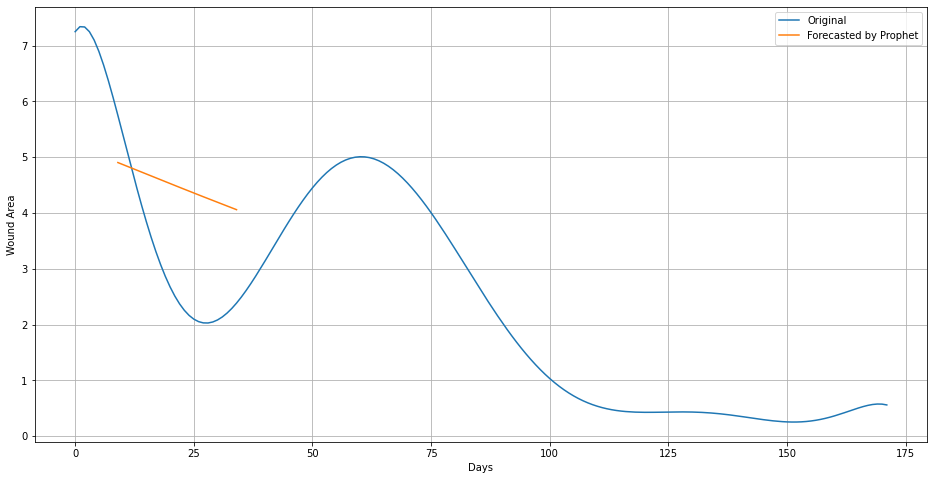

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 171
10
17

Initial log joint probability = -37.3986
Iteration  1. Log joint probability =    20.9922. Improved by 58.3908.
Iteration  2. Log joint probability =    28.0028. Improved by 7.01058.
Iteration  3. Log joint probability =    50.7523. Improved by 22.7496.
Iteration  4. Log joint probability =    54.5689. Improved by 3.81656.
Iteration  5. Log joint probability =    54.5724. Improved by 0.00353768.
Iteration  6. Log joint probability =    54.5753. Improved by 0.00285054.
Iteration  7. Log joint probability =    54.5816. Improved by 0.00627519.
Iteration  8. Log joint probability =    54.5847. Improved by 0.0031366.
Iteration  9. Log joint probability =    54.5991. Improved by 0.0144287.
Iteration 10. Log joint probability =    54.6218. Improved by 0.0226132.
Iteration 11. Log joint probability =    54.8177. Improved by 0.195957.
Iteration 12. Log joint probability =    54.8534. Improved by 0.0356874.
Iteration 13. Log joint probability =    54.9776. Improved by 0.124251.

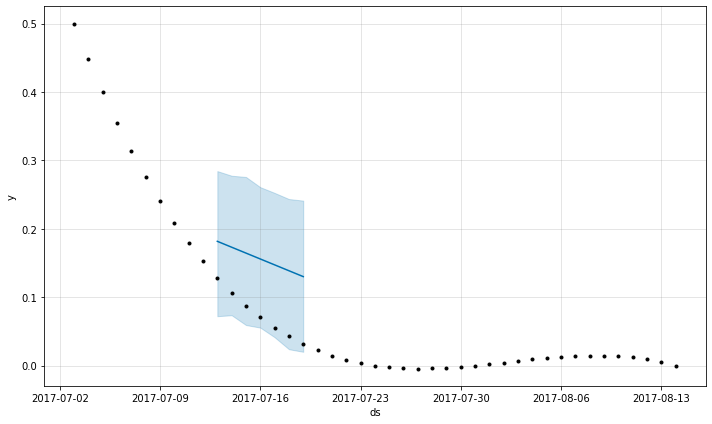

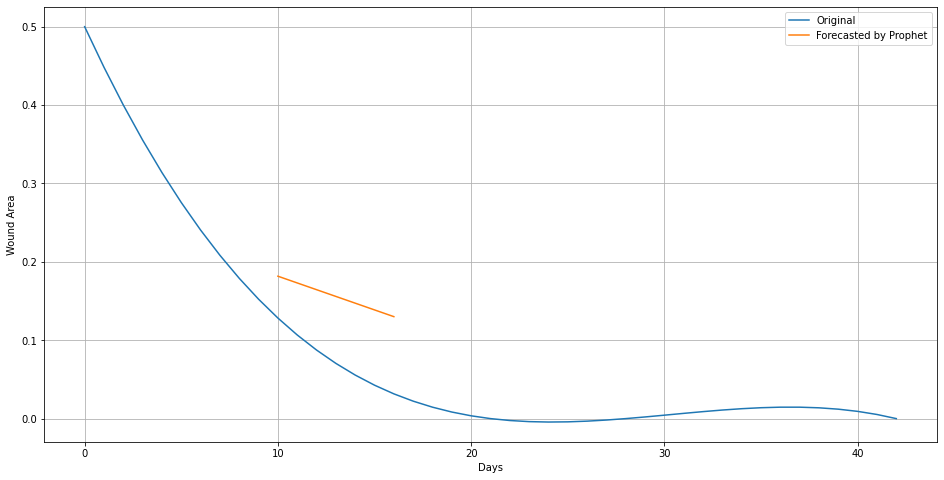

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 172
16
23

Initial log joint probability = -36.9393
Iteration  1. Log joint probability =    24.4799. Improved by 61.4192.
Iteration  2. Log joint probability =    40.7381. Improved by 16.2582.
Iteration  3. Log joint probability =    41.7969. Improved by 1.05882.
Iteration  4. Log joint probability =    41.9703. Improved by 0.173394.
Iteration  5. Log joint probability =    42.0447. Improved by 0.0743587.
Iteration  6. Log joint probability =    42.0498. Improved by 0.00513151.
Iteration  7. Log joint probability =    42.0677. Improved by 0.0178504.
Iteration  8. Log joint probability =    42.0765. Improved by 0.00885145.
Iteration  9. Log joint probability =    42.1059. Improved by 0.029329.
Iteration 10. Log joint probability =    42.1144. Improved by 0.00854236.
Iteration 11. Log joint probability =    42.1224. Improved by 0.00799262.
Iteration 12. Log joint probability =    42.1297. Improved by 0.00730837.
Iteration 13. Log joint probability =    42.1375. Improved by 0.0077

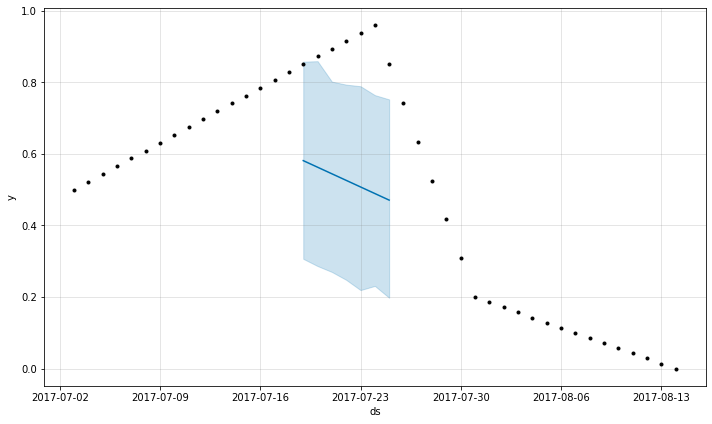

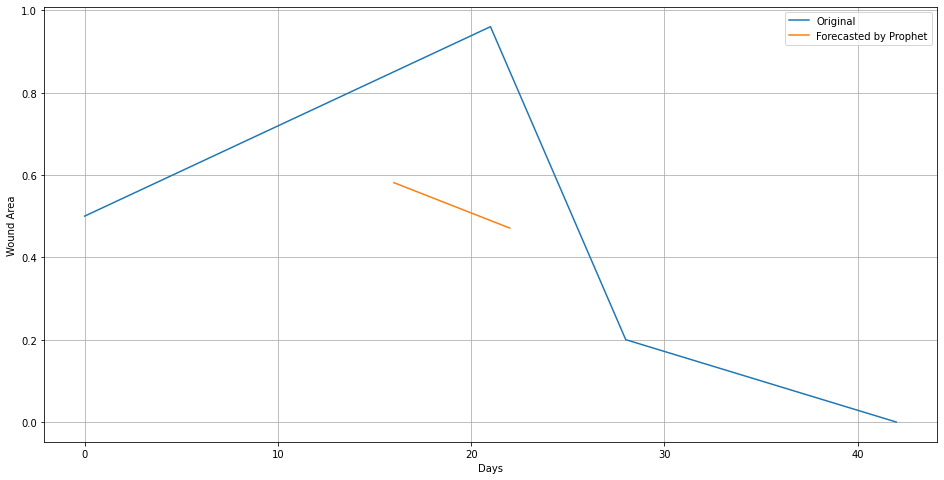

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 173
9
12

Initial log joint probability = -41.8396
Iteration  1. Log joint probability =     7.7211. Improved by 49.5607.
Iteration  2. Log joint probability =    15.1118. Improved by 7.39074.
Iteration  3. Log joint probability =    15.5423. Improved by 0.430473.
Iteration  4. Log joint probability =    16.1439. Improved by 0.601543.
Iteration  5. Log joint probability =    16.2769. Improved by 0.133026.
Iteration  6. Log joint probability =    16.3747. Improved by 0.0978156.
Iteration  7. Log joint probability =    16.3911. Improved by 0.0163957.
Iteration  8. Log joint probability =     16.418. Improved by 0.0269289.
Iteration  9. Log joint probability =    16.4358. Improved by 0.0177644.
Iteration 10. Log joint probability =    16.4454. Improved by 0.00964134.
Iteration 11. Log joint probability =    16.4468. Improved by 0.00138299.
Iteration 12. Log joint probability =    16.4487. Improved by 0.00184186.
Iteration 13. Log joint probability =    16.4498. Improved by 0.001118

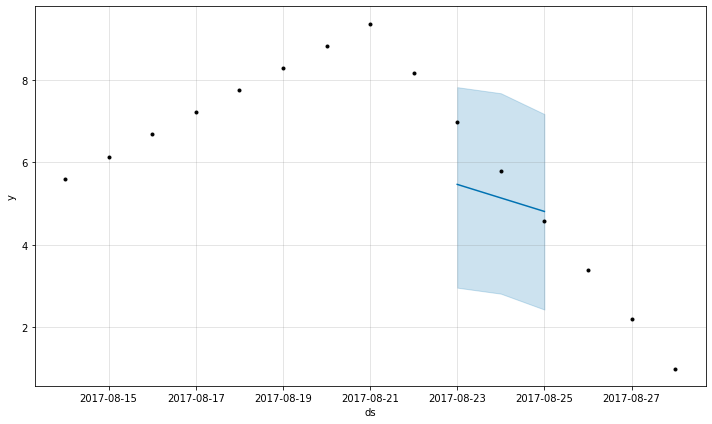

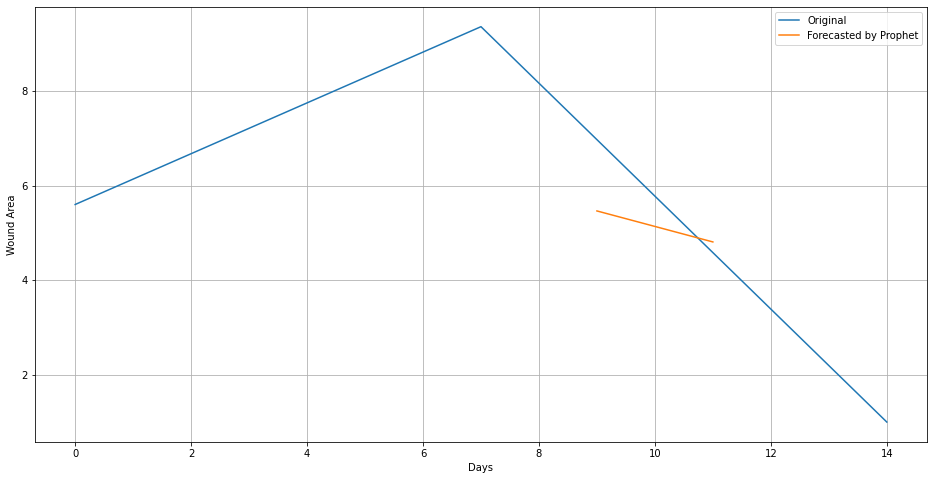

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 174
12
17

Initial log joint probability = -29.0452
Iteration  1. Log joint probability =    20.3711. Improved by 49.4163.
Iteration  2. Log joint probability =    38.0302. Improved by 17.6592.
Iteration  3. Log joint probability =    41.6757. Improved by 3.6455.
Iteration  4. Log joint probability =    46.6476. Improved by 4.97184.
Iteration  5. Log joint probability =    46.6661. Improved by 0.0184963.
Iteration  6. Log joint probability =    46.7321. Improved by 0.065984.
Iteration  7. Log joint probability =    47.9575. Improved by 1.22549.
Iteration  8. Log joint probability =     48.013. Improved by 0.0554628.
Iteration  9. Log joint probability =    48.0884. Improved by 0.0753523.
Iteration 10. Log joint probability =    48.0945. Improved by 0.00609784.
Iteration 11. Log joint probability =    48.2703. Improved by 0.175883.
Iteration 12. Log joint probability =    48.5618. Improved by 0.291407.
Iteration 13. Log joint probability =      48.79. Improved by 0.228239.
Iterat

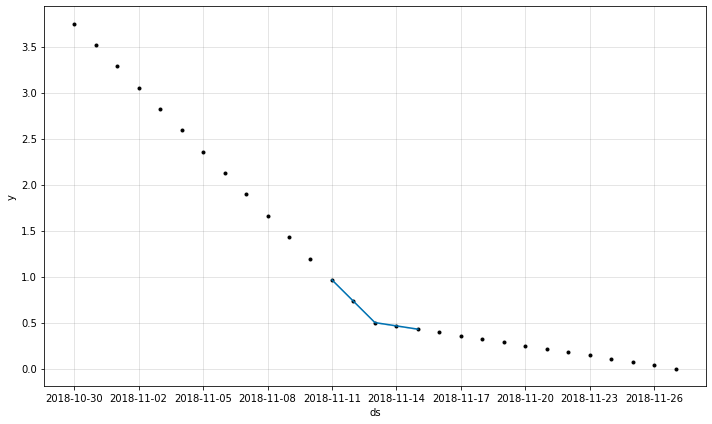

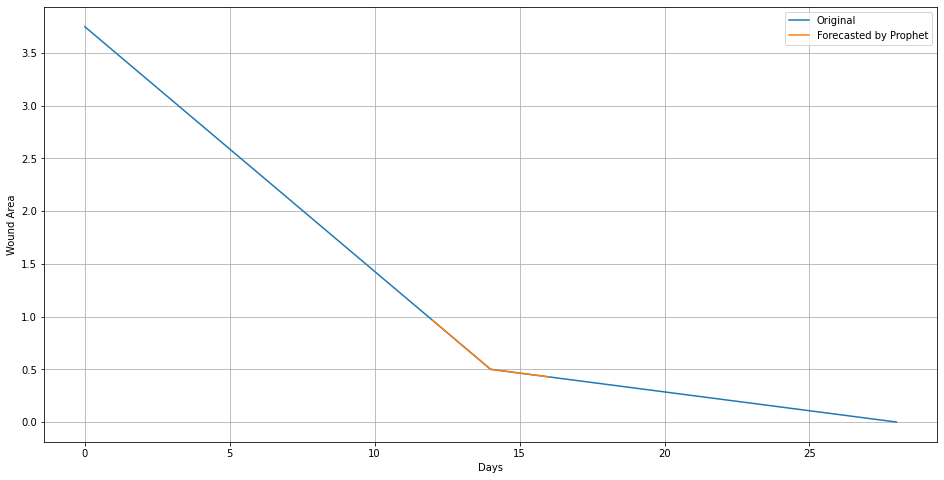

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 175
8
13

Initial log joint probability = -28.5215
Iteration  1. Log joint probability =    3.33482. Improved by 31.8563.
Iteration  2. Log joint probability =    60.2575. Improved by 56.9226.
Iteration  3. Log joint probability =    73.4996. Improved by 13.2422.
Iteration  4. Log joint probability =    75.0656. Improved by 1.56595.
Iteration  5. Log joint probability =    77.2618. Improved by 2.1962.
Iteration  6. Log joint probability =     77.338. Improved by 0.0762568.
Iteration  7. Log joint probability =    77.3426. Improved by 0.00461155.
Iteration  8. Log joint probability =    77.6182. Improved by 0.275521.
Iteration  9. Log joint probability =    77.6785. Improved by 0.0603906.
Iteration 10. Log joint probability =    78.1208. Improved by 0.442294.
Iteration 11. Log joint probability =      78.37. Improved by 0.249164.
Iteration 12. Log joint probability =    78.5258. Improved by 0.155787.
Iteration 13. Log joint probability =    78.5284. Improved by 0.00265353.
Iterat

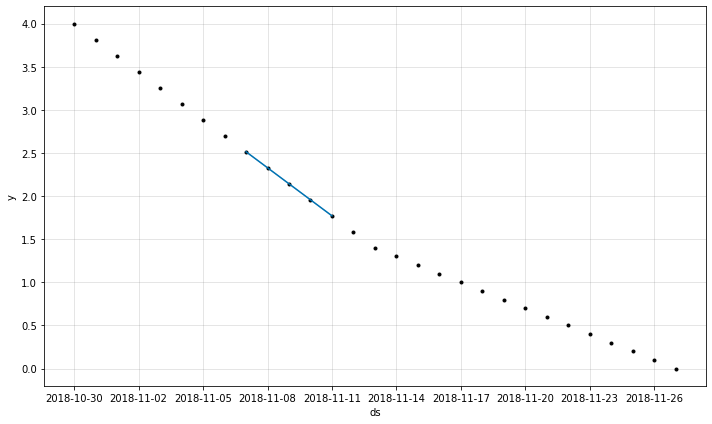

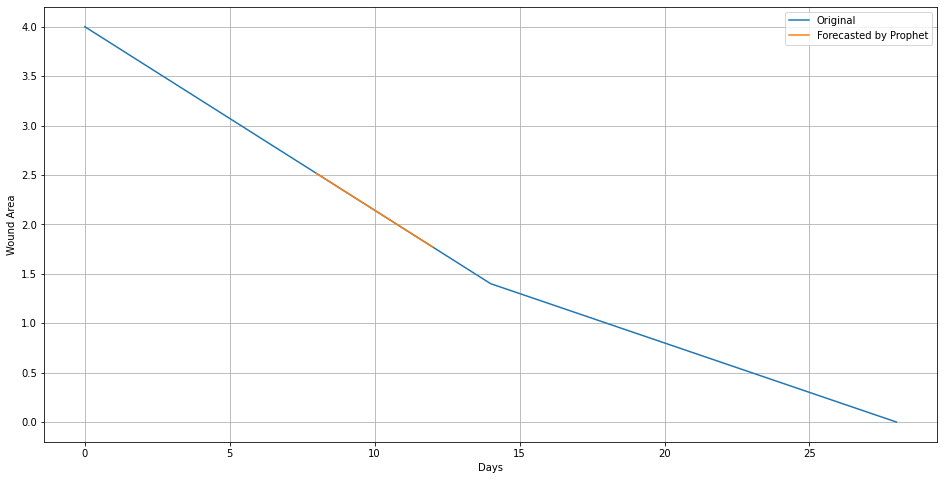

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 176
39
65
Initial log joint probability = -8.8979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      57       291.688    0.00249145       75.4536    2.82e-05       0.001      111  LS failed, Hessian reset 
      99       291.854   0.000268387       67.7772      0.2768           1      167   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       292.059    0.00161758       98.9704   2.329e-05       0.001      284  LS failed, Hessian reset 
     199       292.219    0.00038708       71.9295       0.678       0.678      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     278       292.292   0.000251978       56.8113   2.989e-06       0.001      481  LS failed, Hessian reset 
     299       292.307   0.000170723       65.1545      0.7577      0.7577      510   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha

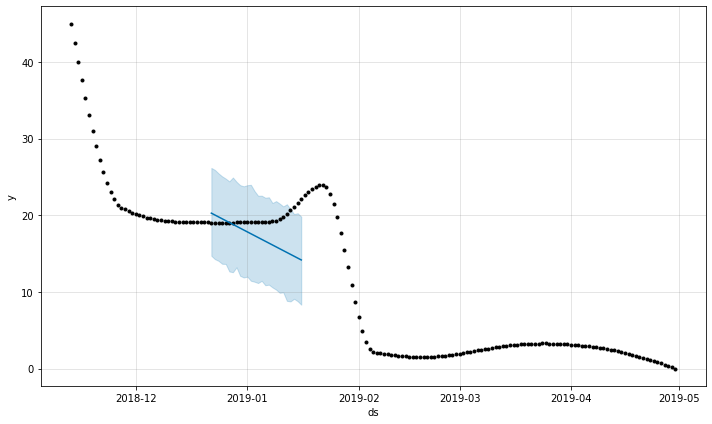

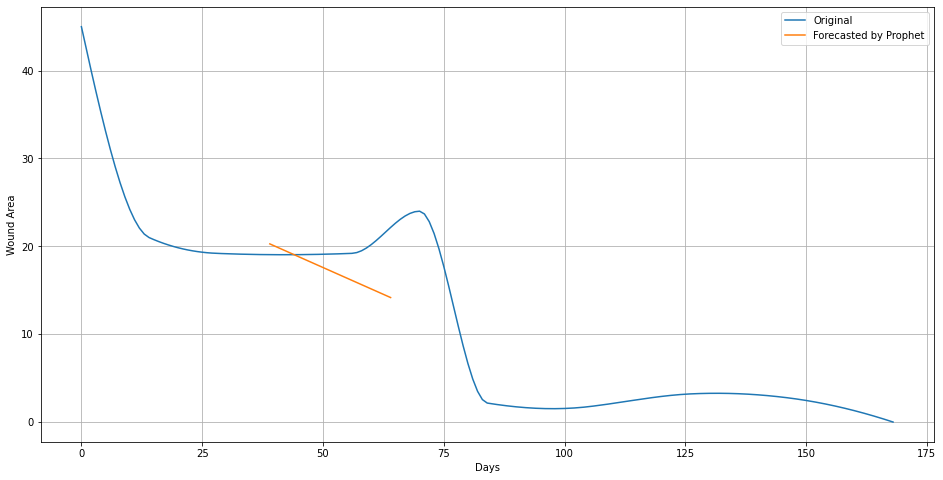

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 177
119
151
Initial log joint probability = -5.85347
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       304.208    0.00970659       82.0551           1           1      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       311.642    0.00464579       70.8606     0.05649           1      265   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       312.706   3.07226e-06       77.3256       0.531       0.531      397   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     390       315.348    0.00205985       123.158    1.65e-05       0.001      558  LS failed, Hessian reset 
     399       315.838   0.000402847       59.2669      0.4166      0.4166      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     489       316.65

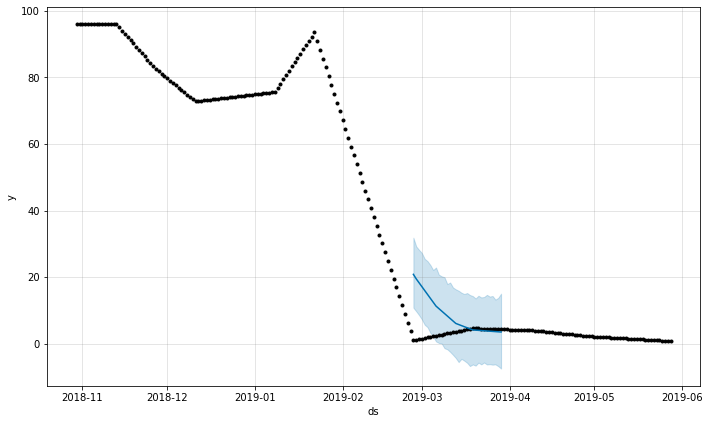

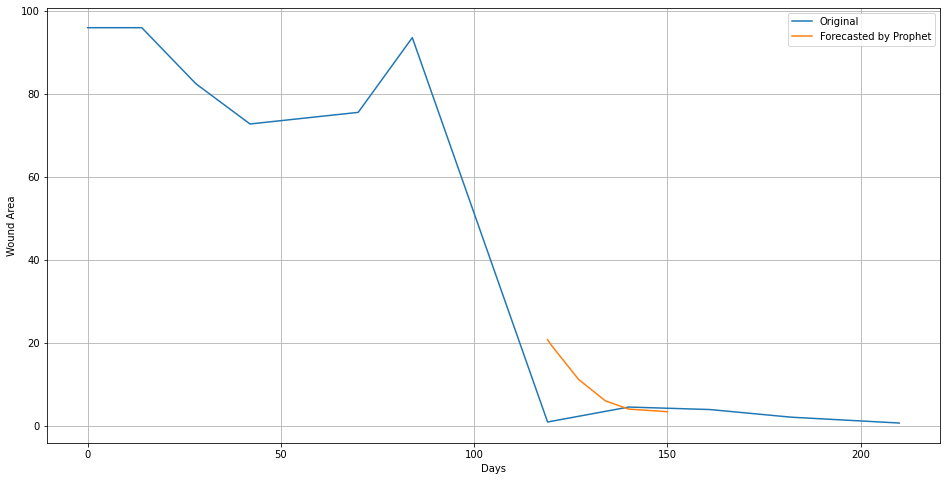

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 178
64
84
Initial log joint probability = -12.6371
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       128.016   0.000244194       80.7835      0.9403      0.9403      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       128.509    0.00329812       80.8908   3.595e-05       0.001      161  LS failed, Hessian reset 
     178       128.869   8.52501e-09       81.9056      0.3185      0.3185      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


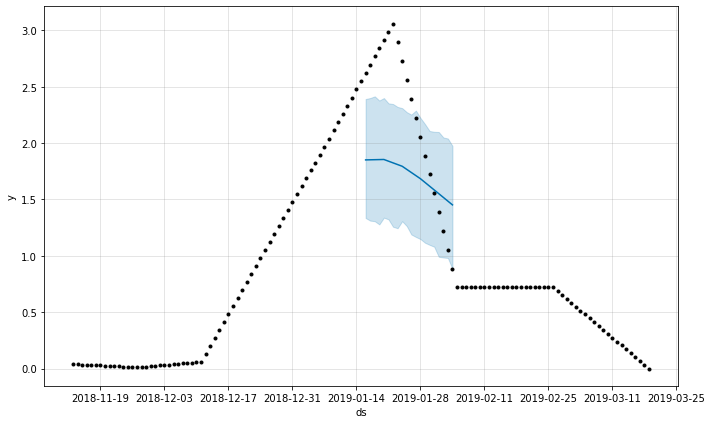

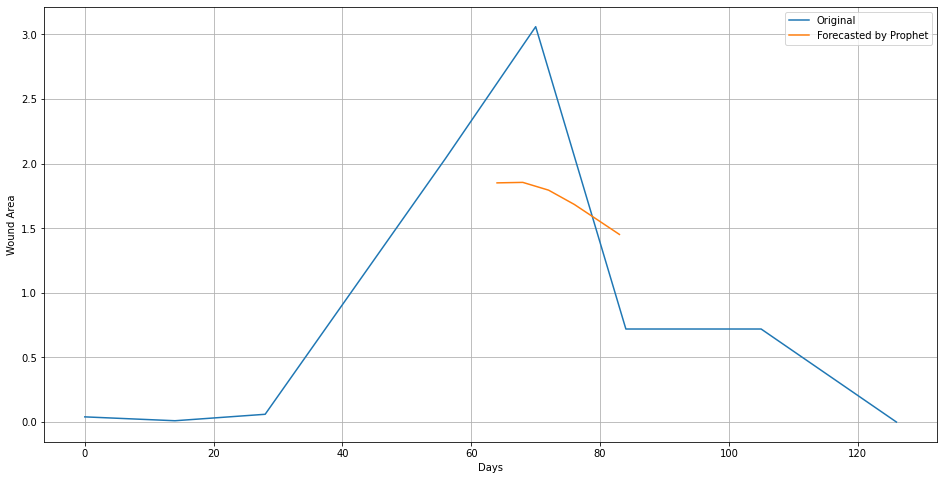

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 179
11
16

Initial log joint probability = -28.4317
Iteration  1. Log joint probability =    42.4706. Improved by 70.9024.
Iteration  2. Log joint probability =     65.068. Improved by 22.5973.
Iteration  3. Log joint probability =    80.4329. Improved by 15.365.
Iteration  4. Log joint probability =    92.5159. Improved by 12.0829.
Iteration  5. Log joint probability =    92.7952. Improved by 0.279349.
Iteration  6. Log joint probability =    92.8685. Improved by 0.0732528.
Iteration  7. Log joint probability =    92.8962. Improved by 0.02774.
Iteration  8. Log joint probability =    92.9084. Improved by 0.0122347.
Iteration  9. Log joint probability =    93.0709. Improved by 0.16249.
Iteration 10. Log joint probability =     93.202. Improved by 0.131034.
Iteration 11. Log joint probability =    93.2696. Improved by 0.0676621.
Iteration 12. Log joint probability =    93.4091. Improved by 0.139455.
Iteration 13. Log joint probability =    93.7497. Improved by 0.34065.
Iteration 

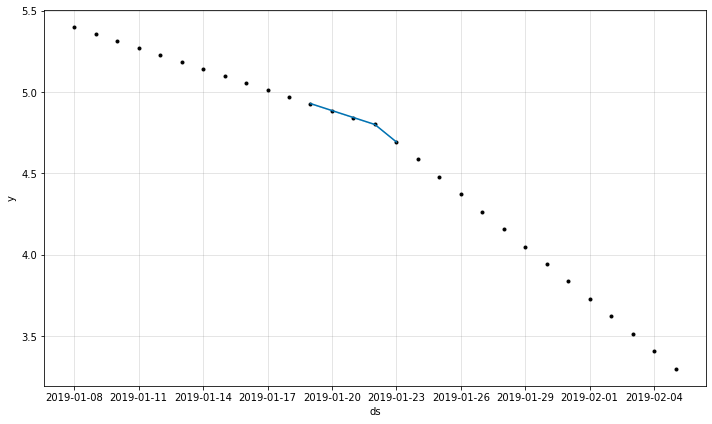

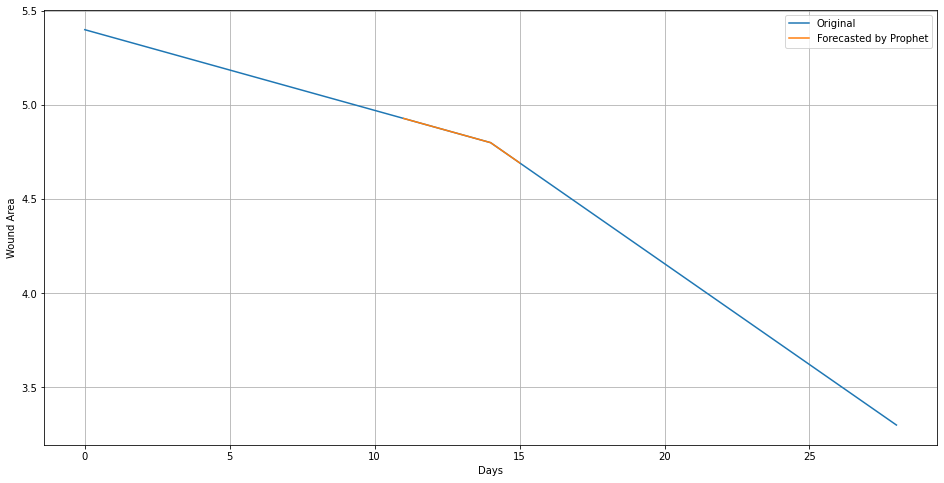

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 180
13
20

Initial log joint probability = -37.0112
Iteration  1. Log joint probability =     23.727. Improved by 60.7381.
Iteration  2. Log joint probability =    48.2264. Improved by 24.4994.
Iteration  3. Log joint probability =    50.2929. Improved by 2.06651.
Iteration  4. Log joint probability =     50.641. Improved by 0.348112.
Iteration  5. Log joint probability =    50.6718. Improved by 0.030846.
Iteration  6. Log joint probability =    50.7466. Improved by 0.0747291.
Iteration  7. Log joint probability =      50.78. Improved by 0.0333837.
Iteration  8. Log joint probability =    50.7838. Improved by 0.00383551.
Iteration  9. Log joint probability =    50.8033. Improved by 0.0194914.
Iteration 10. Log joint probability =    50.8082. Improved by 0.00487162.
Iteration 11. Log joint probability =    50.8235. Improved by 0.015322.
Iteration 12. Log joint probability =    50.8519. Improved by 0.028459.
Iteration 13. Log joint probability =     50.859. Improved by 0.00711138.

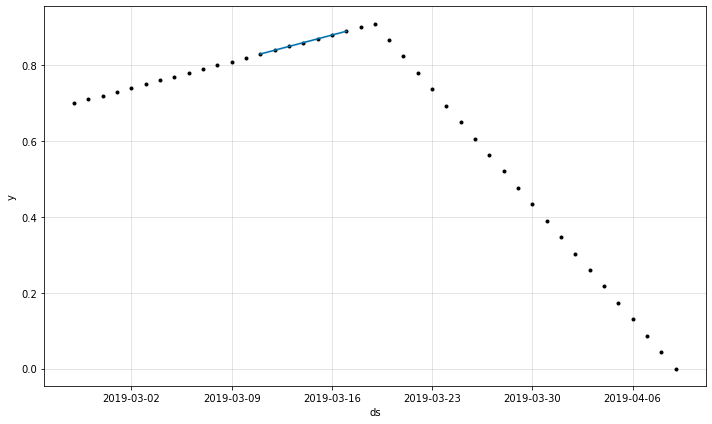

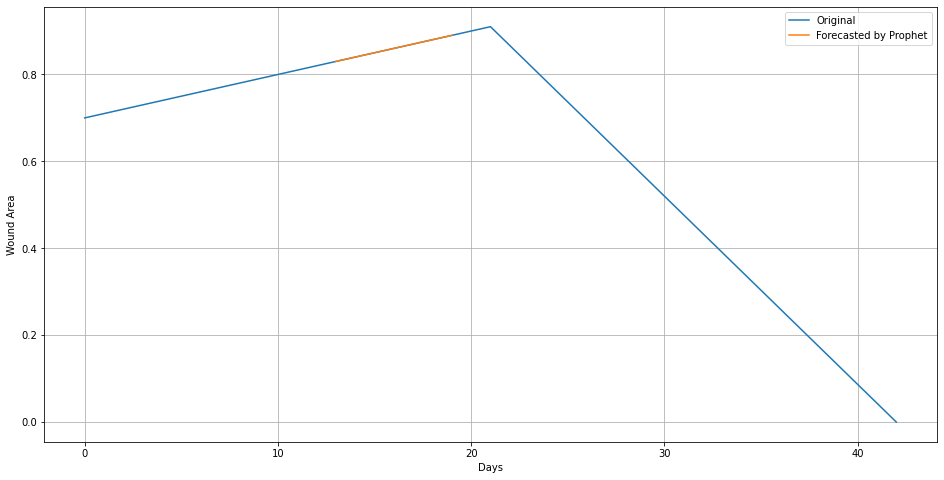

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 181
200
263
Initial log joint probability = -39.4719
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       441.026   0.000243318       58.6505      0.4118      0.4118      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       441.138    0.00034853       80.2213   4.521e-06       0.001      242  LS failed, Hessian reset 
     199       441.156   1.39582e-05       77.0386      0.8512      0.8512      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     292       441.267   0.000827631       96.1764    8.55e-06       0.001      448  LS failed, Hessian reset 
     299       441.311   0.000266709       93.0903      0.6782      0.6782      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     372        441.35   3.68325e-08       67.4799      0.2145           1      570   
Op

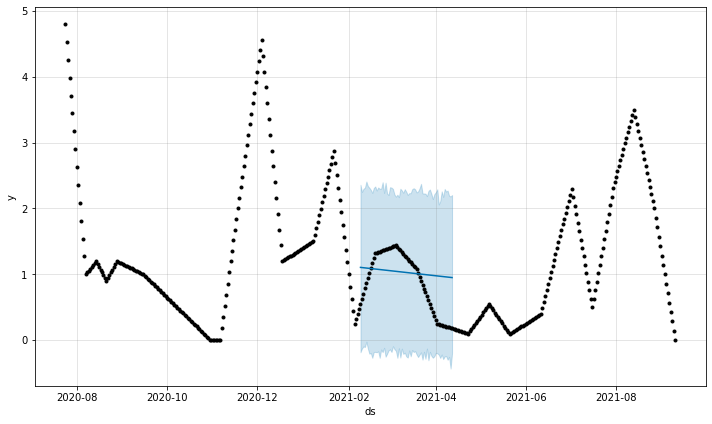

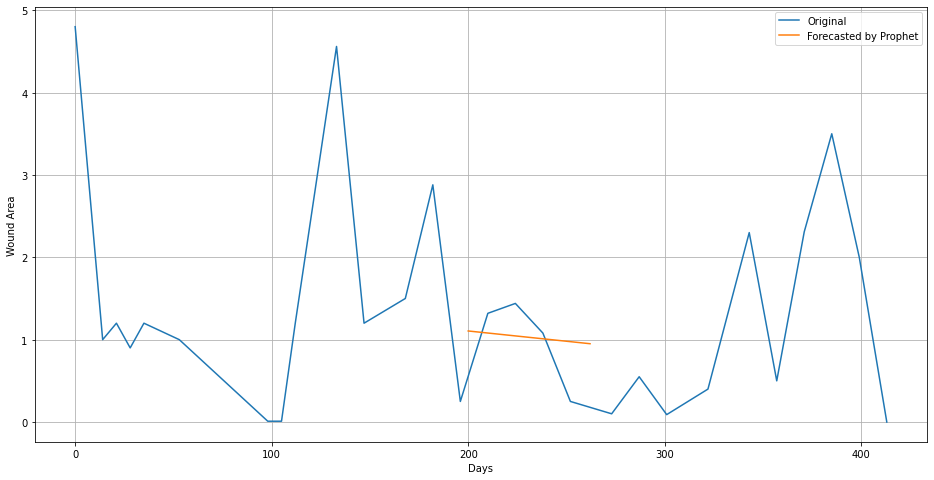

Wound: 182
147
281
Initial log joint probability = -21.9383
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      83       1389.81    0.00337572       90.0778   5.886e-05       0.001      148  LS failed, Hessian reset 
      99       1390.63    0.00232519       65.5618      0.2484           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       1392.43   0.000795871       88.1832   6.981e-06       0.001      247  LS failed, Hessian reset 
     199       1394.38   0.000216641       47.5471      0.2218           1      320   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     246       1395.09   0.000704869       67.7221   1.123e-05       0.001      424  LS failed, Hessian reset 
     299       1395.88    0.00423942       75.3043           1           1      489   
    Iter      log prob        ||dx||      ||grad||       alpha      al

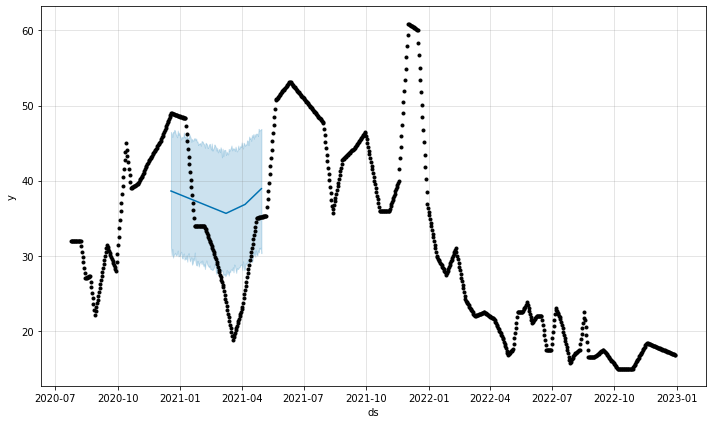

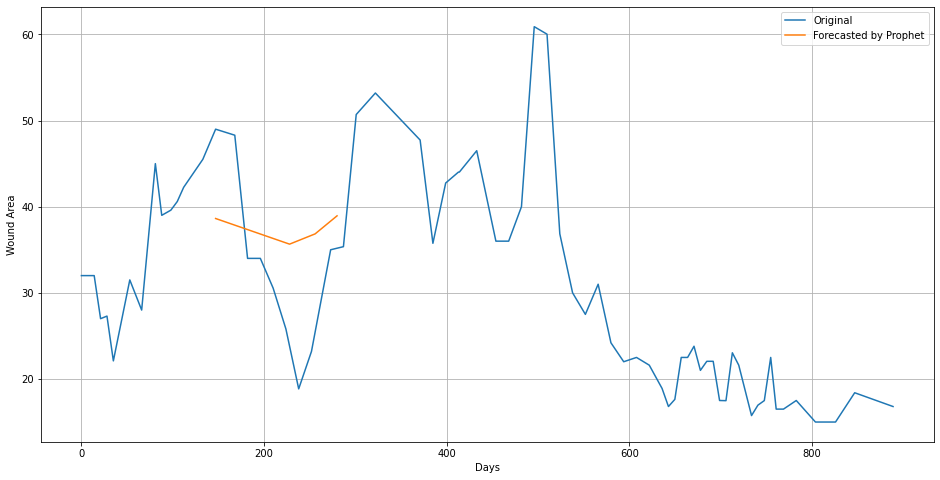

Wound: 183
63
197
Initial log joint probability = -29.888
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1079.98   9.40908e-06       74.0238           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       1079.99    1.5539e-05       78.3995   1.841e-07       0.001      182  LS failed, Hessian reset 
     145       1079.99   2.68836e-08       82.5557      0.3229           1      226   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


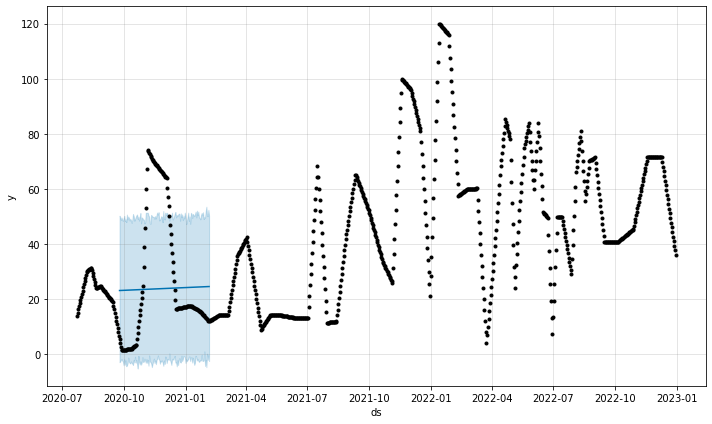

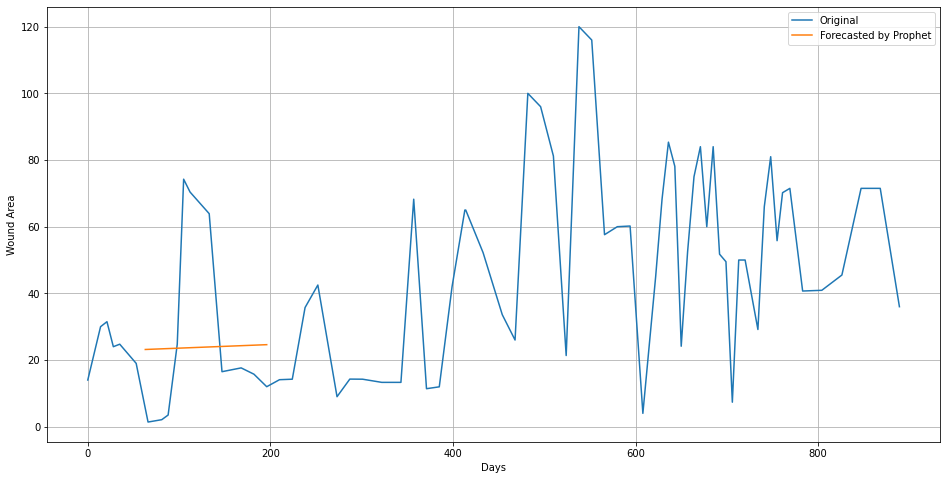

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 184
118
141
Initial log joint probability = -14.551
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      53       168.782    0.00459535       80.5611   5.633e-05       0.001      106  LS failed, Hessian reset 
      85       171.834     0.0108885       69.8751   0.0001681       0.001      186  LS failed, Hessian reset 
      99       172.221   0.000169552       61.8977      0.3136      0.3136      207   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     170       173.011   0.000179483       75.7193   2.242e-06       0.001      334  LS failed, Hessian reset 
     199       173.021   1.15401e-06       60.1355      0.3017      0.7004      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       173.021   2.22866e-09       57.7784     0.06693     0.06693      392   
Optimization terminated normally: 
  Convergence detected: absolute par

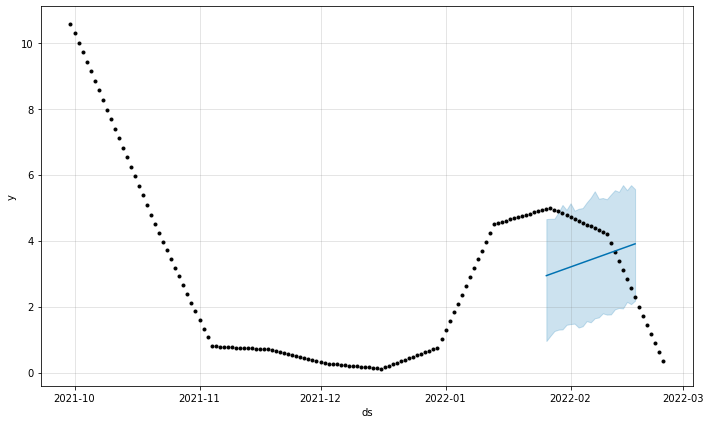

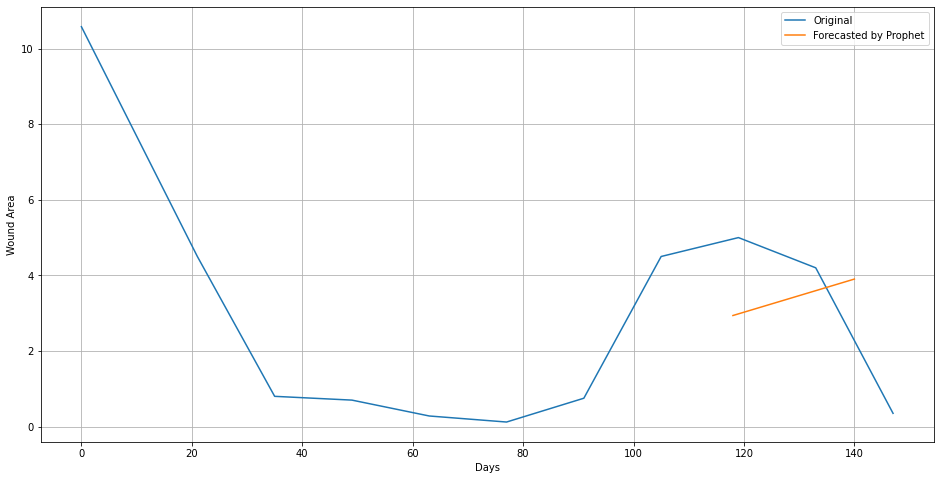

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 185
37
48

Initial log joint probability = -68.5828
Iteration  1. Log joint probability =    18.6183. Improved by 87.2011.
Iteration  2. Log joint probability =    50.5451. Improved by 31.9268.
Iteration  3. Log joint probability =    63.3183. Improved by 12.7733.
Iteration  4. Log joint probability =    65.2033. Improved by 1.88495.
Iteration  5. Log joint probability =    65.2192. Improved by 0.0158832.
Iteration  6. Log joint probability =    65.8452. Improved by 0.626006.
Iteration  7. Log joint probability =     65.869. Improved by 0.0238125.
Iteration  8. Log joint probability =    65.9632. Improved by 0.0941963.
Iteration  9. Log joint probability =    65.9969. Improved by 0.033743.
Iteration 10. Log joint probability =    66.0668. Improved by 0.0698777.
Iteration 11. Log joint probability =    66.1763. Improved by 0.109517.
Iteration 12. Log joint probability =    66.1976. Improved by 0.0213247.
Iteration 13. Log joint probability =    66.2179. Improved by 0.0202835.
Ite

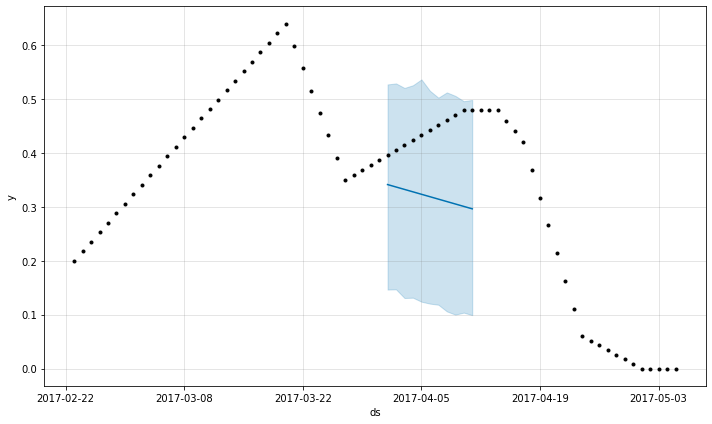

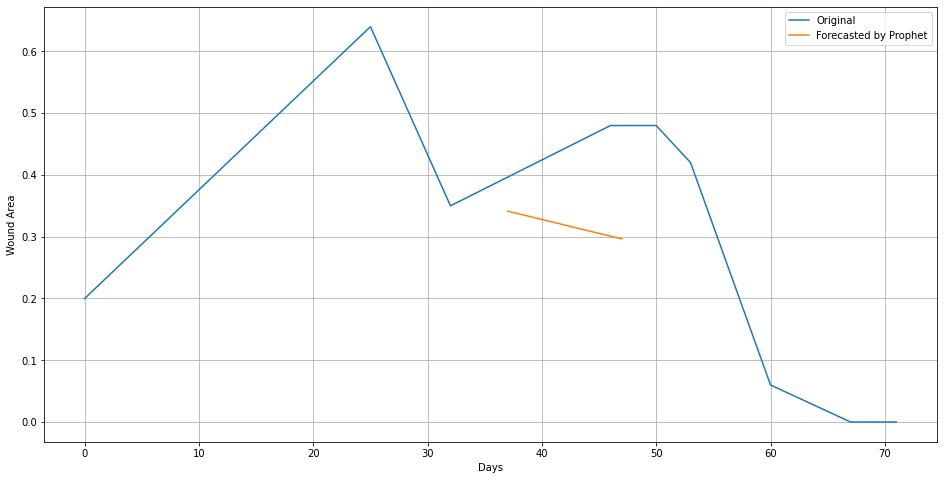

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 186
216
256
Initial log joint probability = -4.9183
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       523.828    0.00034347       49.1305           1           1      140   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     174       524.806   0.000651973       44.7803   1.512e-05       0.001      291  LS failed, Hessian reset 
     181       524.831   0.000231851       38.0611   3.649e-06       0.001      334  LS failed, Hessian reset 
     187       524.839   8.93822e-05       27.8339   1.958e-06       0.001      380  LS failed, Hessian reset 
     194       524.844   1.34305e-06       37.5464   4.607e-08       0.001      443  LS failed, Hessian reset 
     199       524.844   1.85683e-05       37.6699           1           1      449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       524.847   2.62598e-05       48.8

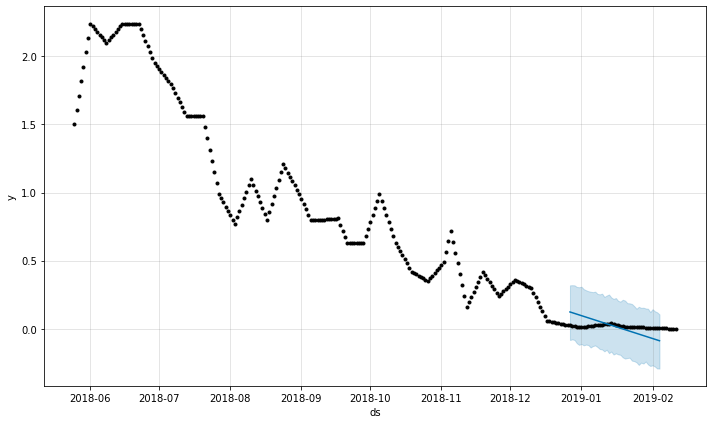

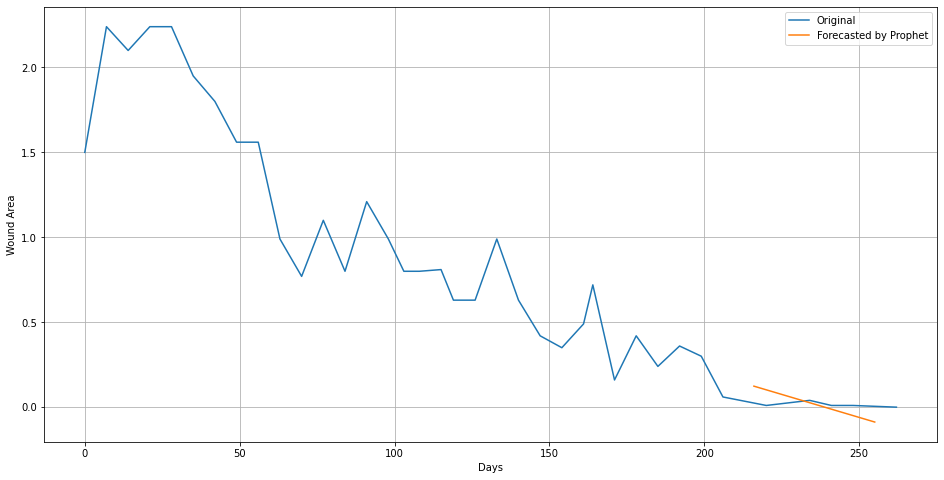

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 7.


Wound: 187
0
2

Initial log joint probability = -27.51
Iteration  1. Log joint probability =    5.30419. Improved by 32.8142.
Iteration  2. Log joint probability =    8.49565. Improved by 3.19146.
Iteration  3. Log joint probability =    13.0688. Improved by 4.57316.
Iteration  4. Log joint probability =    14.2339. Improved by 1.16513.
Iteration  5. Log joint probability =    14.3535. Improved by 0.11956.
Iteration  6. Log joint probability =    14.3699. Improved by 0.0163858.
Iteration  7. Log joint probability =    14.4118. Improved by 0.0419455.
Iteration  8. Log joint probability =    14.4641. Improved by 0.0522983.
Iteration  9. Log joint probability =    14.4799. Improved by 0.0157634.
Iteration 10. Log joint probability =    14.4856. Improved by 0.00569431.
Iteration 11. Log joint probability =    14.5133. Improved by 0.0277214.
Iteration 12. Log joint probability =     14.547. Improved by 0.0336835.
Iteration 13. Log joint probability =    14.5567. Improved by 0.00968972.
Iter

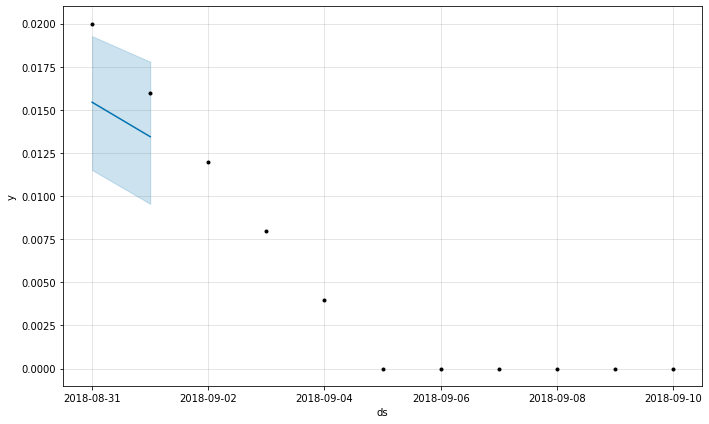

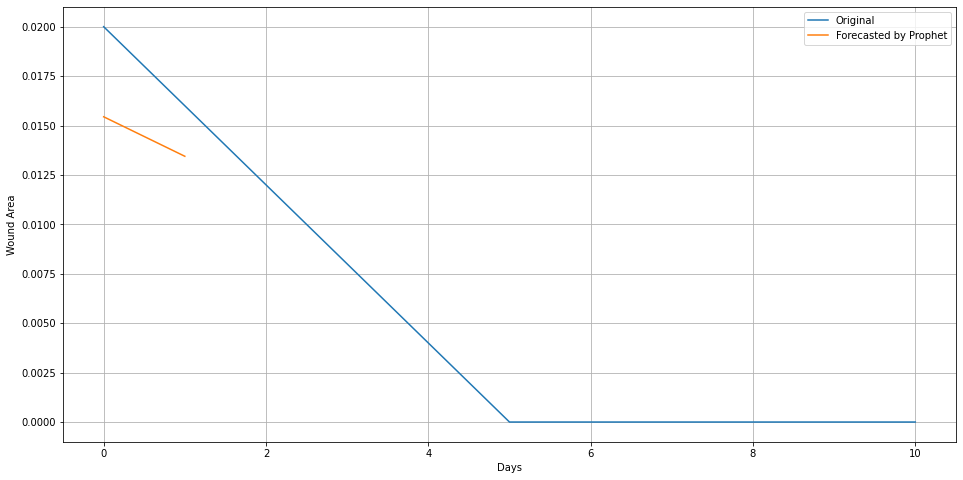

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 188
17
35
Initial log joint probability = -6.7318
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       346.045     0.0479351       323.463           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       372.804   9.62398e-05       161.936   3.385e-07       0.001      261  LS failed, Hessian reset 
     199        395.28    0.00913778        159.08           1           1      307   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       407.062   0.000918257       192.934      0.9451      0.9451      427   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        410.83    0.00906682       582.311      0.6513      0.6513      545   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     418       411.711  

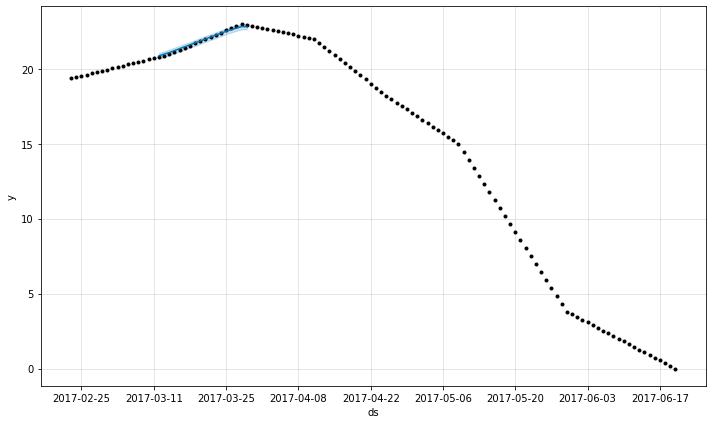

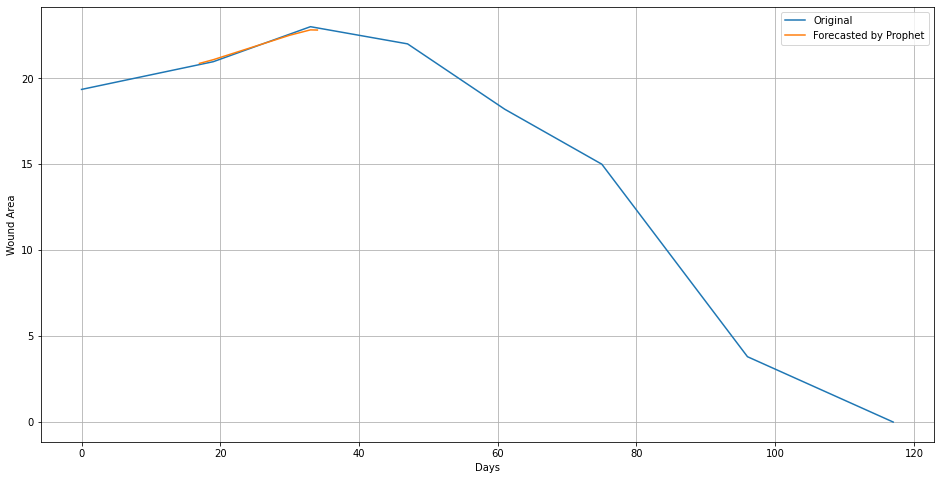

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 189
12
30
Initial log joint probability = -3.03561
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       436.172     0.0151414       404.357           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       492.831    0.00825096       824.521      0.1742           1      249   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       514.094    0.00126965       898.231           1           1      367   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       547.024    0.00384086          2026      0.2925      0.2925      487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       557.987    0.00655613       828.602           1           1      616   
    Iter      log prob        ||dx||      ||gra

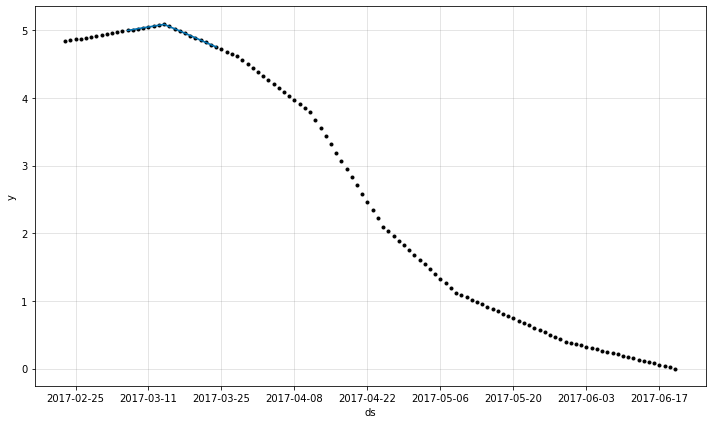

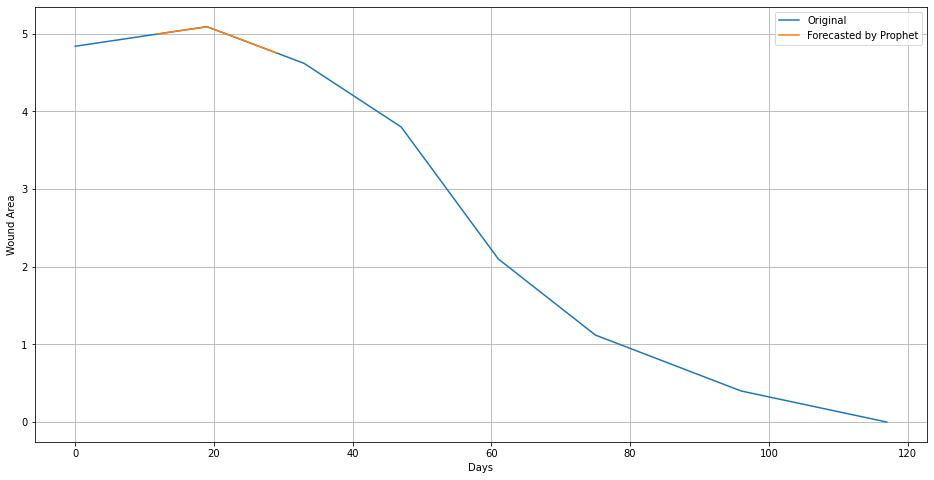

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 190
1
7

Initial log joint probability = -29.4012
Iteration  1. Log joint probability =    14.2454. Improved by 43.6466.
Iteration  2. Log joint probability =    40.6066. Improved by 26.3612.
Iteration  3. Log joint probability =     55.947. Improved by 15.3404.
Iteration  4. Log joint probability =    57.3769. Improved by 1.42989.
Iteration  5. Log joint probability =    57.5598. Improved by 0.182872.
Iteration  6. Log joint probability =    57.6603. Improved by 0.100533.
Iteration  7. Log joint probability =    57.6908. Improved by 0.0305084.
Iteration  8. Log joint probability =    57.7151. Improved by 0.0242383.
Iteration  9. Log joint probability =    57.7216. Improved by 0.00653098.
Iteration 10. Log joint probability =    57.7265. Improved by 0.00490029.
Iteration 11. Log joint probability =    57.7305. Improved by 0.00399425.
Iteration 12. Log joint probability =    57.7327. Improved by 0.00221772.
Iteration 13. Log joint probability =    57.7333. Improved by 0.000616334

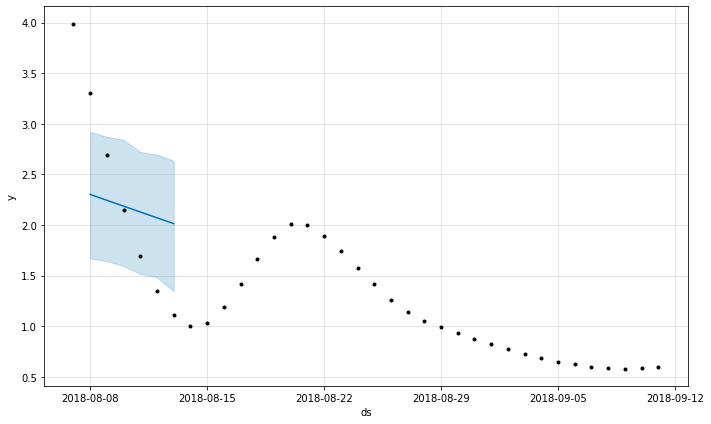

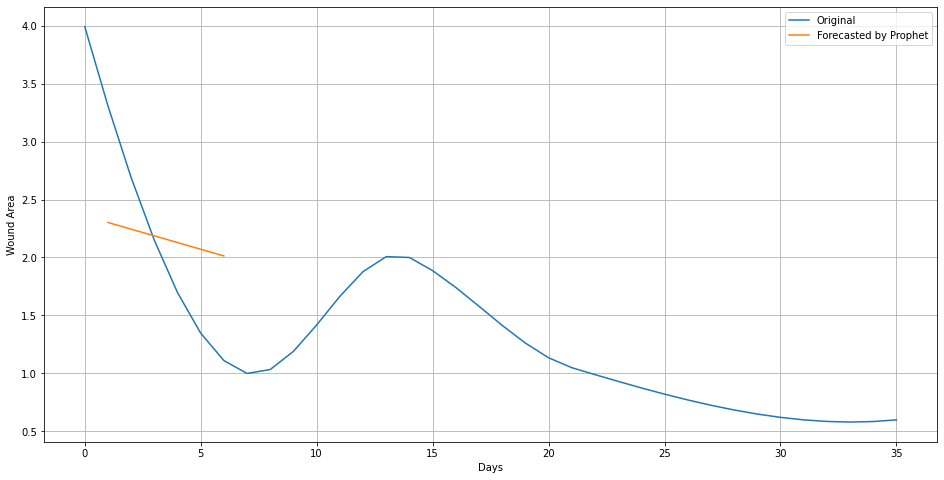

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 191
11
16

Initial log joint probability = -28.7581
Iteration  1. Log joint probability =  -0.121388. Improved by 28.6368.
Iteration  2. Log joint probability =    40.6765. Improved by 40.7979.
Iteration  3. Log joint probability =    40.6858. Improved by 0.00927096.
Iteration  4. Log joint probability =    40.7143. Improved by 0.0284935.
Iteration  5. Log joint probability =    40.7511. Improved by 0.0368368.
Iteration  6. Log joint probability =    40.7613. Improved by 0.0101536.
Iteration  7. Log joint probability =    40.8185. Improved by 0.05718.
Iteration  8. Log joint probability =    40.8444. Improved by 0.0259229.
Iteration  9. Log joint probability =    40.8827. Improved by 0.0383302.
Iteration 10. Log joint probability =    40.8896. Improved by 0.00691811.
Iteration 11. Log joint probability =    40.9458. Improved by 0.056141.
Iteration 12. Log joint probability =    41.0621. Improved by 0.116318.
Iteration 13. Log joint probability =    42.8093. Improved by 1.74718.


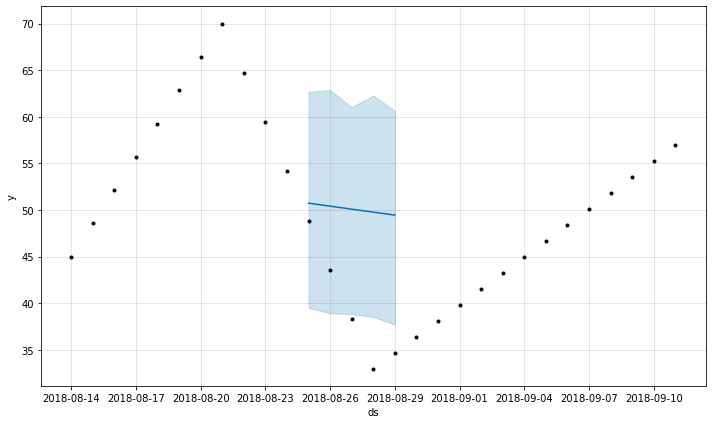

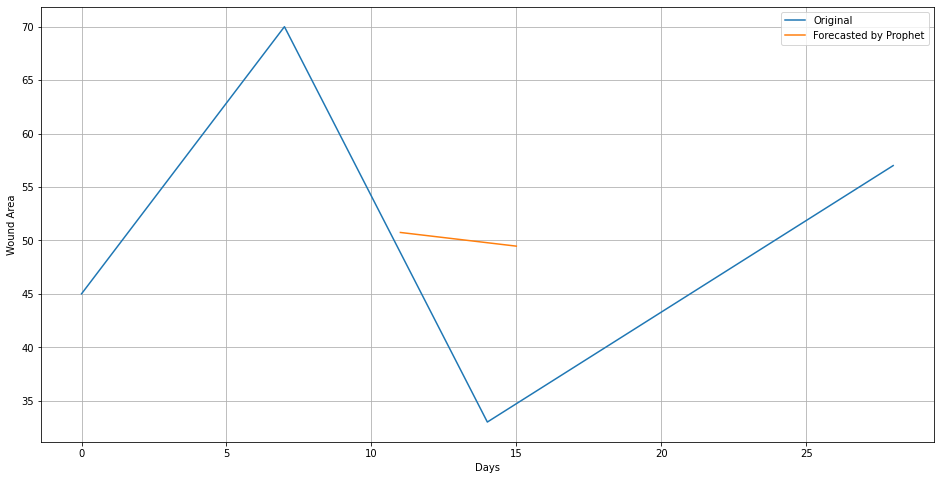

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 192
1
4


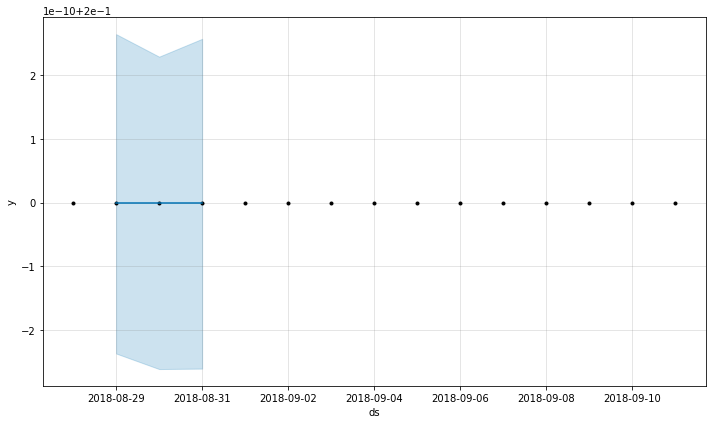

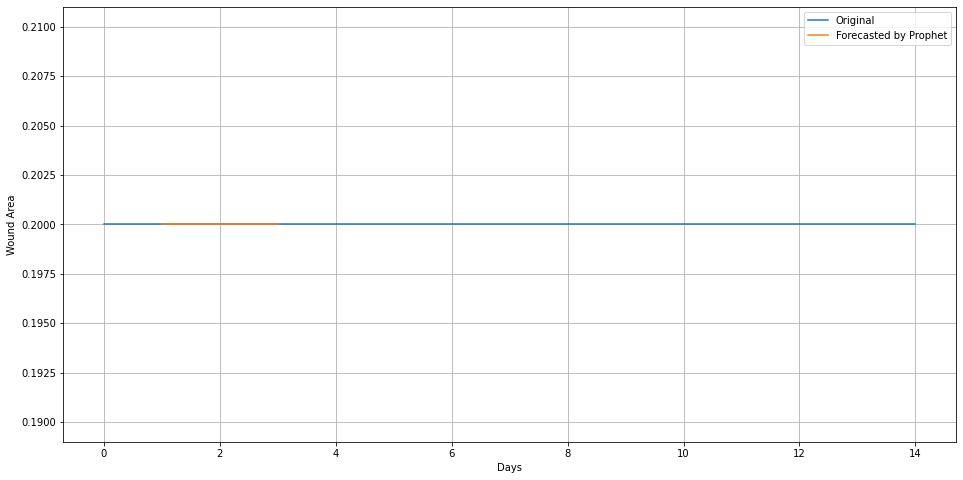

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


Wound: 193
24
29

Initial log joint probability = -28.6578
Iteration  1. Log joint probability =    13.8604. Improved by 42.5182.
Iteration  2. Log joint probability =    29.1971. Improved by 15.3367.
Iteration  3. Log joint probability =    41.4473. Improved by 12.2501.
Iteration  4. Log joint probability =    41.6513. Improved by 0.204014.
Iteration  5. Log joint probability =     41.658. Improved by 0.00673859.
Iteration  6. Log joint probability =    41.6673. Improved by 0.00930269.
Iteration  7. Log joint probability =    41.6753. Improved by 0.00799572.
Iteration  8. Log joint probability =    41.6826. Improved by 0.00733491.
Iteration  9. Log joint probability =    41.6954. Improved by 0.0127543.
Iteration 10. Log joint probability =    41.7022. Improved by 0.00681505.
Iteration 11. Log joint probability =    41.7138. Improved by 0.0116321.
Iteration 12. Log joint probability =     41.727. Improved by 0.0131705.
Iteration 13. Log joint probability =    41.7597. Improved by 0.032

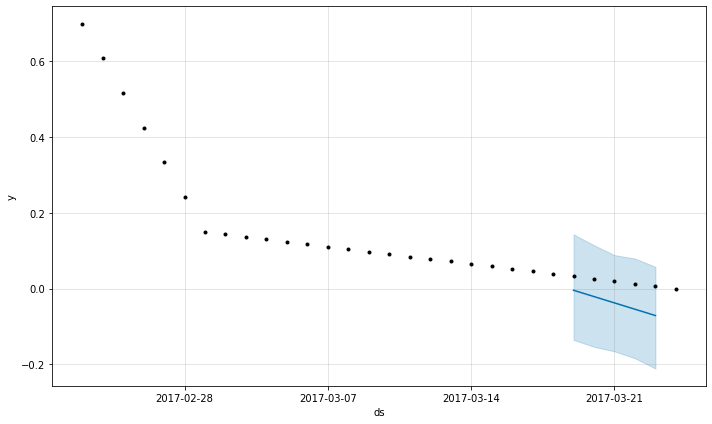

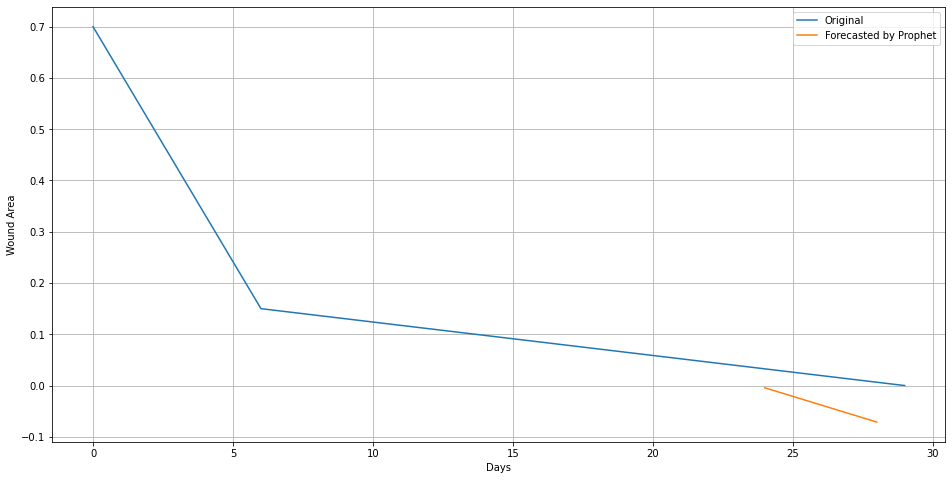

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 194
37
46

Initial log joint probability = -49.7846
Iteration  1. Log joint probability =    44.5272. Improved by 94.3118.
Iteration  2. Log joint probability =    67.2806. Improved by 22.7534.
Iteration  3. Log joint probability =    100.628. Improved by 33.3472.
Iteration  4. Log joint probability =    101.707. Improved by 1.07918.
Iteration  5. Log joint probability =    102.391. Improved by 0.684487.
Iteration  6. Log joint probability =    102.436. Improved by 0.0447588.
Iteration  7. Log joint probability =    102.513. Improved by 0.0763987.
Iteration  8. Log joint probability =    102.613. Improved by 0.0999315.
Iteration  9. Log joint probability =    102.643. Improved by 0.0305059.
Iteration 10. Log joint probability =    102.655. Improved by 0.0121832.
Iteration 11. Log joint probability =    102.711. Improved by 0.0560692.
Iteration 12. Log joint probability =    102.726. Improved by 0.014517.
Iteration 13. Log joint probability =    102.827. Improved by 0.101051.
Ite

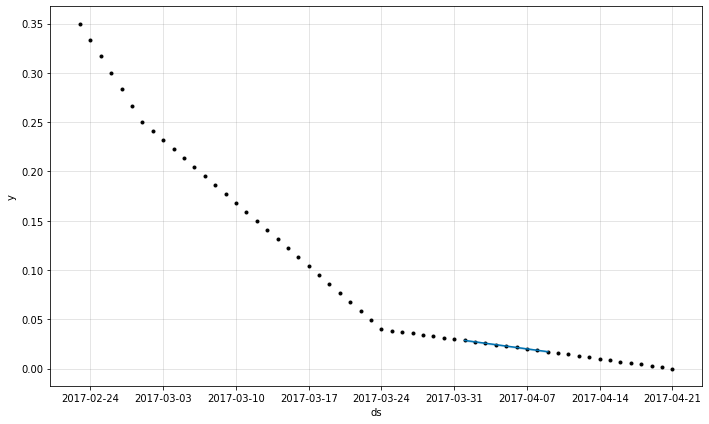

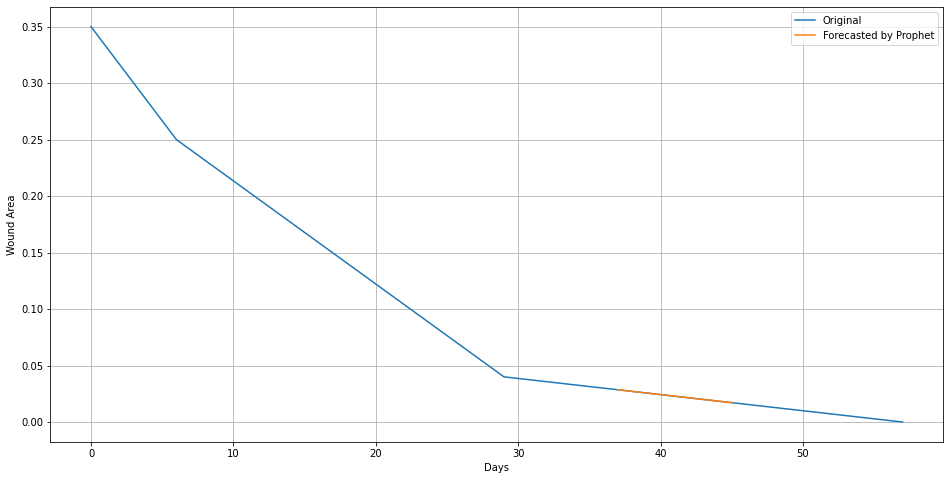

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 195
26
34

Initial log joint probability = -38.9629
Iteration  1. Log joint probability =    72.7022. Improved by 111.665.
Iteration  2. Log joint probability =    108.239. Improved by 35.5365.
Iteration  3. Log joint probability =    138.495. Improved by 30.2566.
Iteration  4. Log joint probability =     145.78. Improved by 7.28442.
Iteration  5. Log joint probability =    201.611. Improved by 55.8311.
Iteration  6. Log joint probability =    228.507. Improved by 26.8964.
Iteration  7. Log joint probability =    240.031. Improved by 11.5242.
Iteration  8. Log joint probability =    267.767. Improved by 27.7355.
Iteration  9. Log joint probability =    299.095. Improved by 31.3276.
Iteration 10. Log joint probability =    325.837. Improved by 26.742.
Iteration 11. Log joint probability =      353.8. Improved by 27.9636.
Iteration 12. Log joint probability =     356.02. Improved by 2.21947.
Iteration 13. Log joint probability =     357.56. Improved by 1.54037.
Iteration 14. Log j

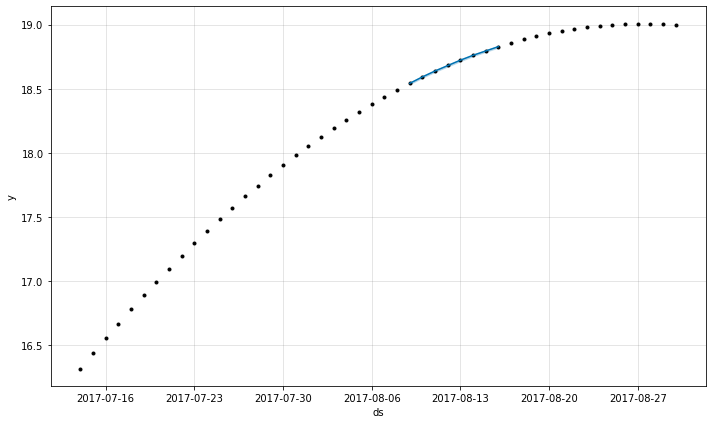

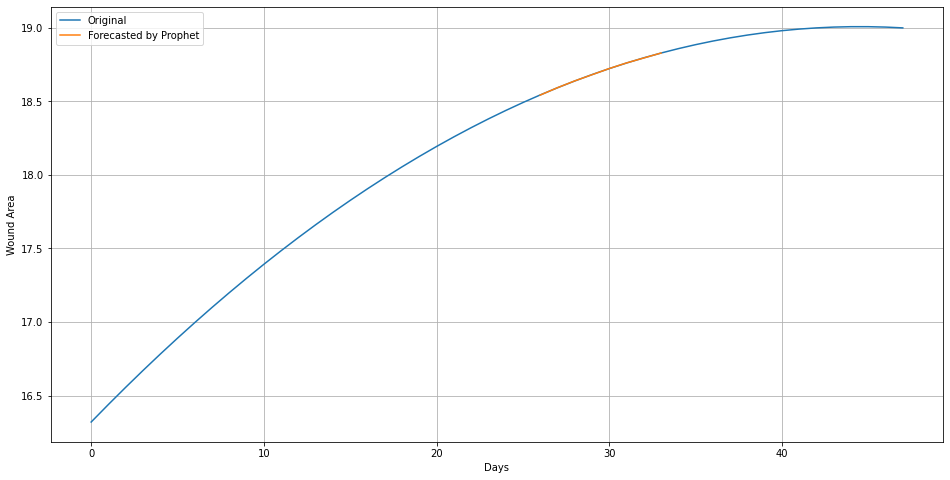

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 196
27
36

Initial log joint probability = -45.4203
Iteration  1. Log joint probability =    41.9283. Improved by 87.3486.
Iteration  2. Log joint probability =     72.881. Improved by 30.9526.
Iteration  3. Log joint probability =    80.5153. Improved by 7.6343.
Iteration  4. Log joint probability =    81.8569. Improved by 1.3416.
Iteration  5. Log joint probability =     81.867. Improved by 0.0101518.
Iteration  6. Log joint probability =    81.9058. Improved by 0.0387451.
Iteration  7. Log joint probability =    81.9261. Improved by 0.020382.
Iteration  8. Log joint probability =    82.4935. Improved by 0.567362.
Iteration  9. Log joint probability =    82.5284. Improved by 0.0349454.
Iteration 10. Log joint probability =    82.5907. Improved by 0.0622448.
Iteration 11. Log joint probability =    82.6066. Improved by 0.0158609.
Iteration 12. Log joint probability =    82.6491. Improved by 0.0425647.
Iteration 13. Log joint probability =    85.7567. Improved by 3.10758.
Iterat

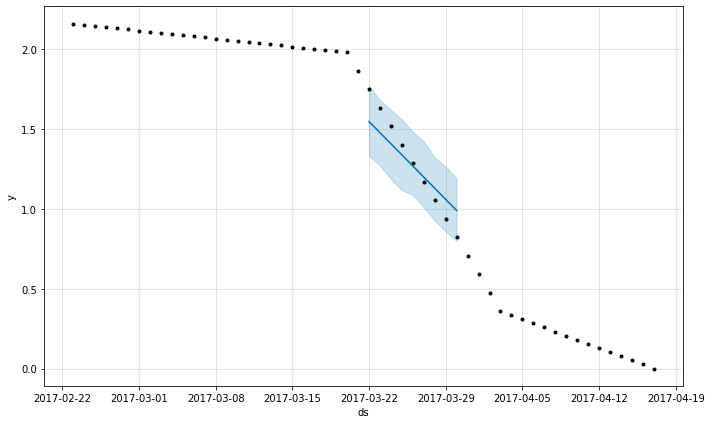

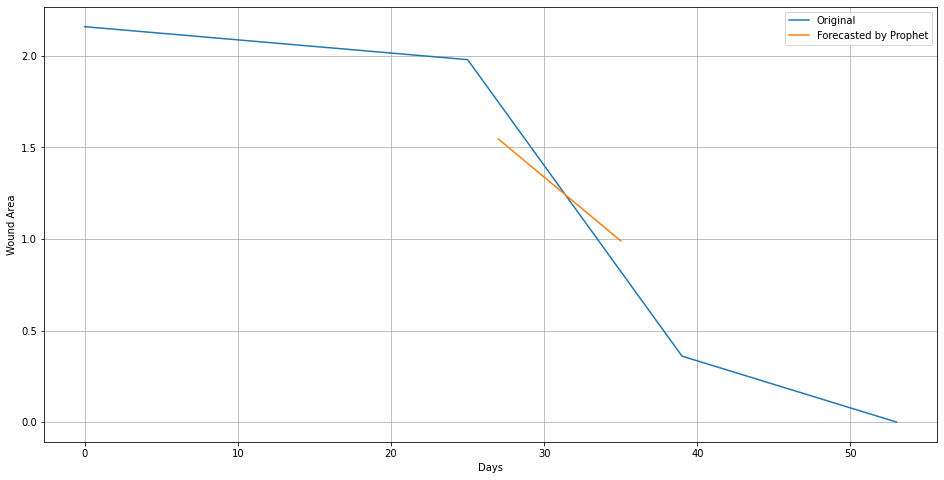

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 197
31
45

Initial log joint probability = -81.1221
Iteration  1. Log joint probability =      89.08. Improved by 170.202.
Iteration  2. Log joint probability =    150.611. Improved by 61.5313.
Iteration  3. Log joint probability =    180.704. Improved by 30.0931.
Iteration  4. Log joint probability =     180.73. Improved by 0.0257976.
Iteration  5. Log joint probability =    180.748. Improved by 0.0174366.
Iteration  6. Log joint probability =    180.762. Improved by 0.0141454.
Iteration  7. Log joint probability =    180.795. Improved by 0.0334705.
Iteration  8. Log joint probability =    180.836. Improved by 0.0402573.
Iteration  9. Log joint probability =    181.155. Improved by 0.319323.
Iteration 10. Log joint probability =    181.247. Improved by 0.0917561.
Iteration 11. Log joint probability =     181.28. Improved by 0.0336241.
Iteration 12. Log joint probability =    181.389. Improved by 0.109015.
Iteration 13. Log joint probability =    181.512. Improved by 0.122239.
I

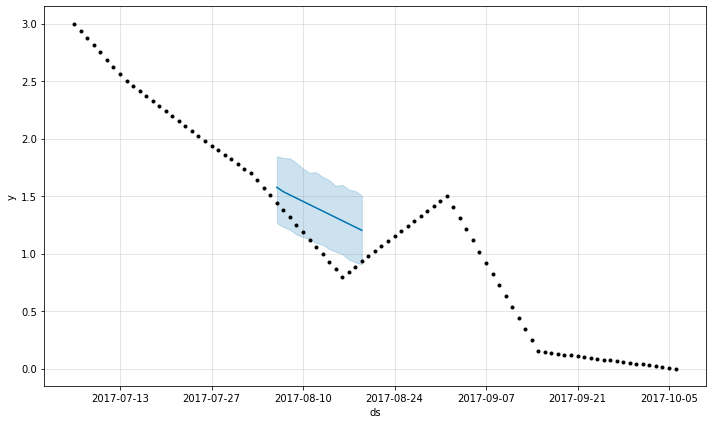

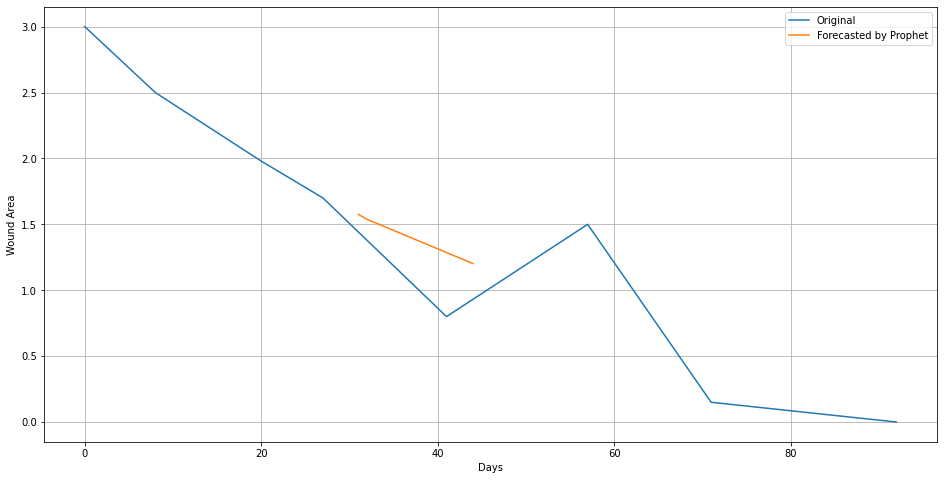

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 198
4
18

Initial log joint probability = -88.5047
Iteration  1. Log joint probability =     39.063. Improved by 127.568.
Iteration  2. Log joint probability =    67.0784. Improved by 28.0154.
Iteration  3. Log joint probability =    67.6923. Improved by 0.613893.
Iteration  4. Log joint probability =    67.7935. Improved by 0.101244.
Iteration  5. Log joint probability =    67.8274. Improved by 0.0338437.
Iteration  6. Log joint probability =    67.8813. Improved by 0.0539471.
Iteration  7. Log joint probability =    68.0189. Improved by 0.137552.
Iteration  8. Log joint probability =    68.0405. Improved by 0.0216278.
Iteration  9. Log joint probability =    68.0532. Improved by 0.0126503.
Iteration 10. Log joint probability =    68.1486. Improved by 0.0954729.
Iteration 11. Log joint probability =    68.1659. Improved by 0.0173118.
Iteration 12. Log joint probability =     68.192. Improved by 0.026035.
Iteration 13. Log joint probability =     68.203. Improved by 0.0110619.
I

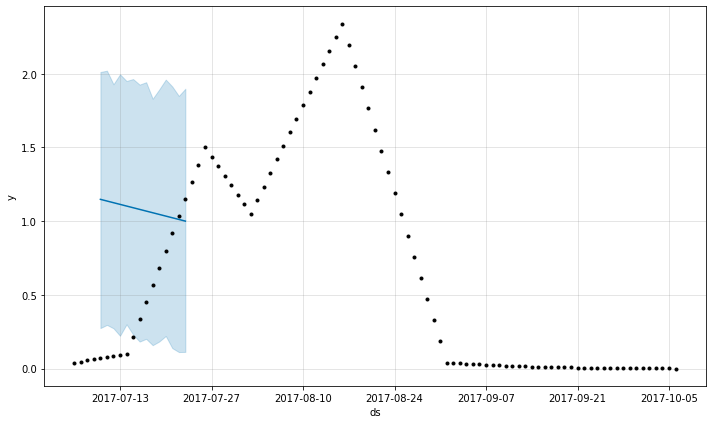

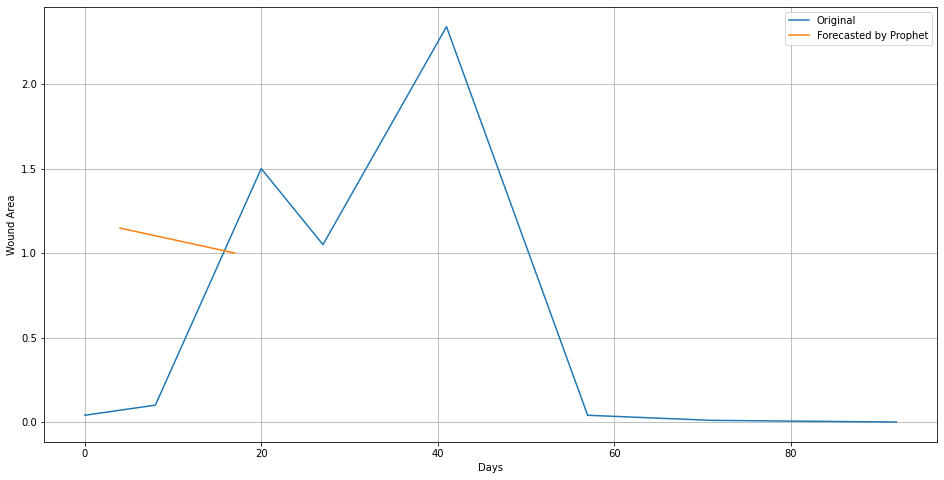

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 199
29
37

Initial log joint probability = -49.1269
Iteration  1. Log joint probability =    25.5828. Improved by 74.7097.
Iteration  2. Log joint probability =    50.7413. Improved by 25.1585.
Iteration  3. Log joint probability =    51.7347. Improved by 0.993428.
Iteration  4. Log joint probability =    54.7474. Improved by 3.01269.
Iteration  5. Log joint probability =    54.7485. Improved by 0.00112398.
Iteration  6. Log joint probability =    54.7622. Improved by 0.0136456.
Iteration  7. Log joint probability =    54.7656. Improved by 0.00340982.
Iteration  8. Log joint probability =    54.8065. Improved by 0.0409182.
Iteration  9. Log joint probability =    54.8094. Improved by 0.00295576.
Iteration 10. Log joint probability =    54.8186. Improved by 0.00916353.
Iteration 11. Log joint probability =     54.835. Improved by 0.0164112.
Iteration 12. Log joint probability =    54.8432. Improved by 0.00819691.
Iteration 13. Log joint probability =    54.8572. Improved by 0.013

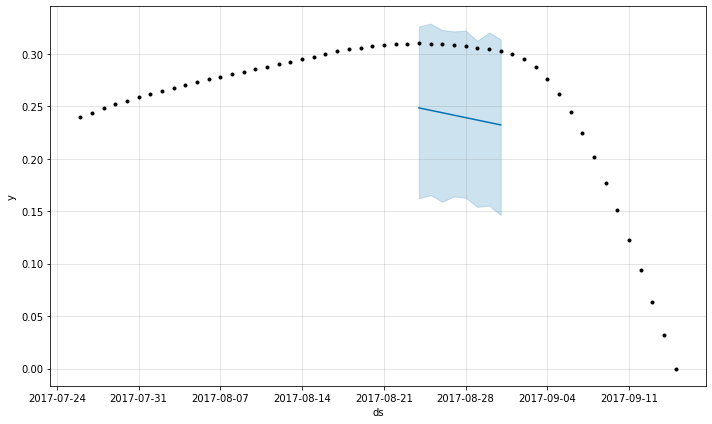

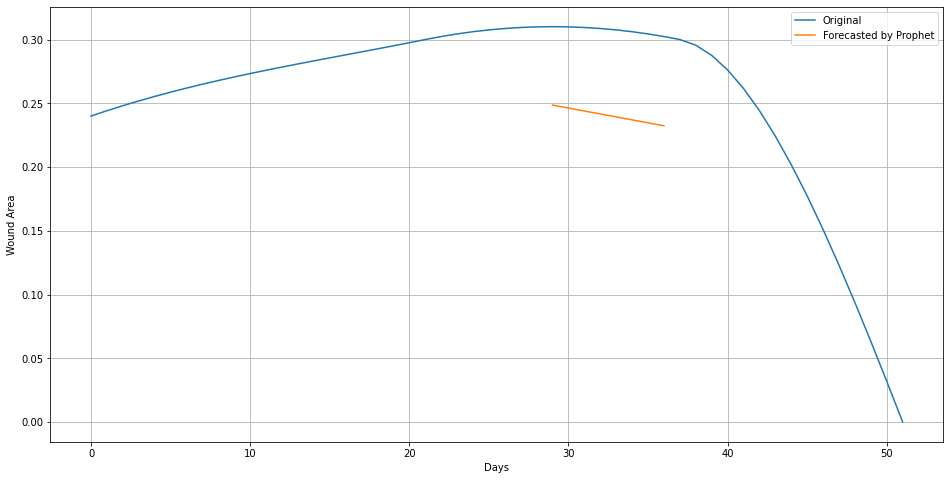

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 200
86
127
Initial log joint probability = -10.9014
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77        446.29    0.00466481       131.926   5.584e-05       0.001      130  LS failed, Hessian reset 
      99       446.942   0.000766693        72.465           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       448.343    0.00481859       85.0241   5.376e-05       0.001      259  LS failed, Hessian reset 
     199       449.085   5.36867e-06       54.4718       2.201      0.2201      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     258       449.087   2.48128e-08       68.2914       0.256           1      431   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


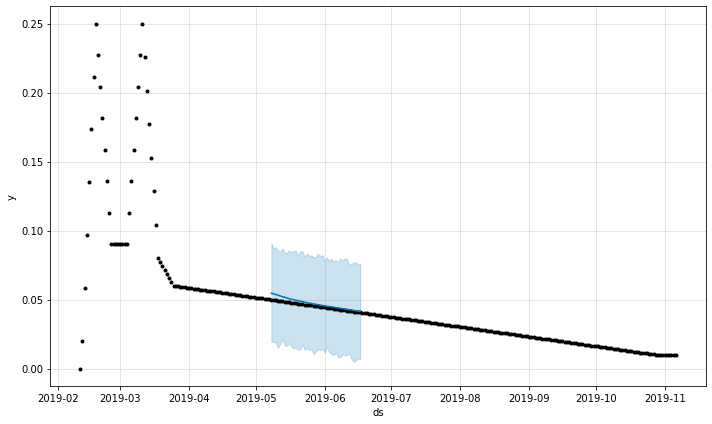

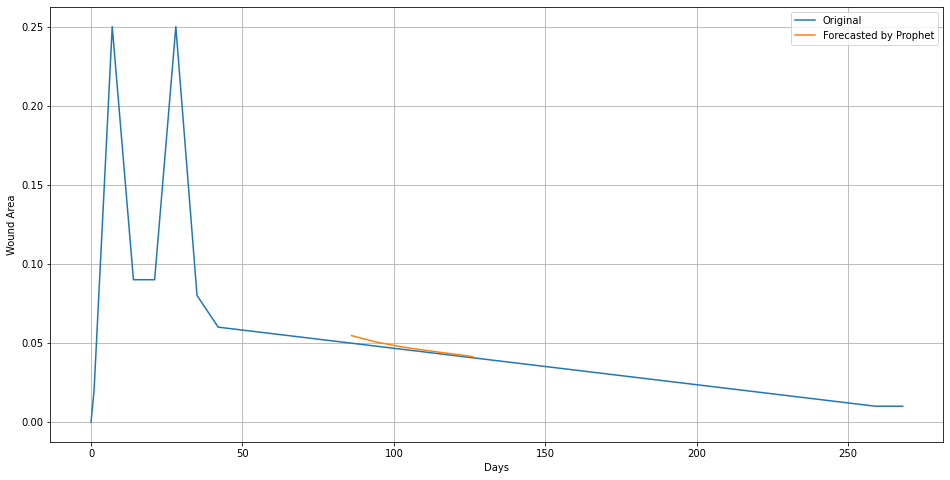

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 201
9
18

Initial log joint probability = -49.9104
Iteration  1. Log joint probability =    27.0853. Improved by 76.9957.
Iteration  2. Log joint probability =    34.5076. Improved by 7.42226.
Iteration  3. Log joint probability =    37.1856. Improved by 2.67805.
Iteration  4. Log joint probability =    37.1943. Improved by 0.00864705.
Iteration  5. Log joint probability =     37.204. Improved by 0.00973349.
Iteration  6. Log joint probability =    37.2136. Improved by 0.0095917.
Iteration  7. Log joint probability =    37.2314. Improved by 0.0178326.
Iteration  8. Log joint probability =    37.2352. Improved by 0.00378692.
Iteration  9. Log joint probability =    37.2535. Improved by 0.0182456.
Iteration 10. Log joint probability =    37.2667. Improved by 0.0132025.
Iteration 11. Log joint probability =    37.3088. Improved by 0.042172.
Iteration 12. Log joint probability =    37.5816. Improved by 0.272806.
Iteration 13. Log joint probability =     37.602. Improved by 0.020362.

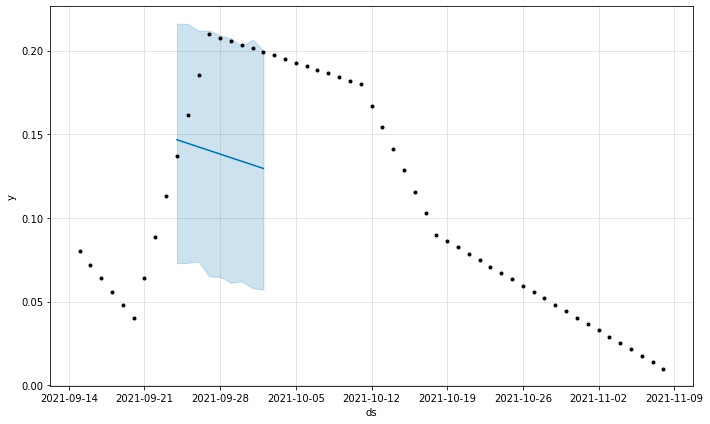

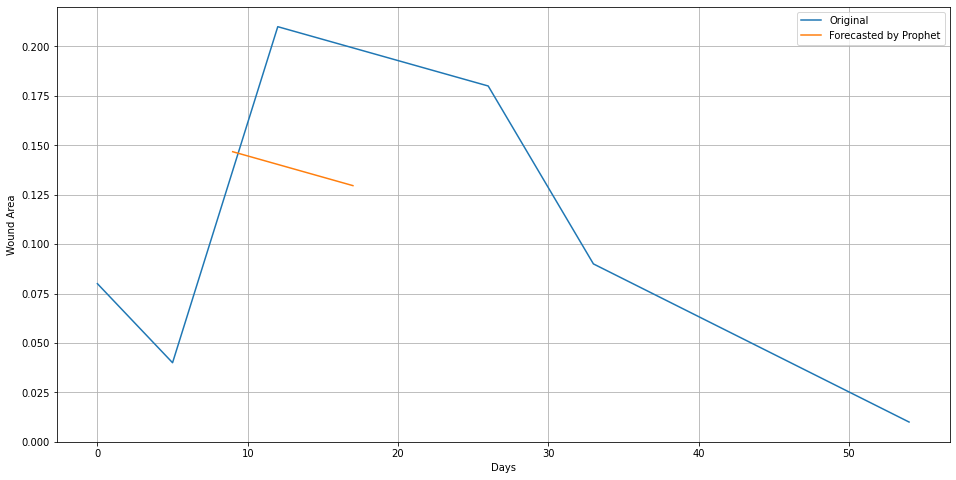

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 10.


Wound: 202
2
5

Initial log joint probability = -23.1052
Iteration  1. Log joint probability =    10.7318. Improved by 33.837.
Iteration  2. Log joint probability =    18.1328. Improved by 7.40097.
Iteration  3. Log joint probability =    26.4702. Improved by 8.33745.
Iteration  4. Log joint probability =    27.3032. Improved by 0.832945.
Iteration  5. Log joint probability =    27.4994. Improved by 0.196208.
Iteration  6. Log joint probability =    27.4997. Improved by 0.000340671.
Iteration  7. Log joint probability =    27.5326. Improved by 0.032876.
Iteration  8. Log joint probability =    27.5518. Improved by 0.0192108.
Iteration  9. Log joint probability =    27.5728. Improved by 0.0210373.
Iteration 10. Log joint probability =    27.6124. Improved by 0.0395834.
Iteration 11. Log joint probability =    27.6939. Improved by 0.0814382.
Iteration 12. Log joint probability =    27.8208. Improved by 0.126984.
Iteration 13. Log joint probability =      27.85. Improved by 0.0291258.
Ite

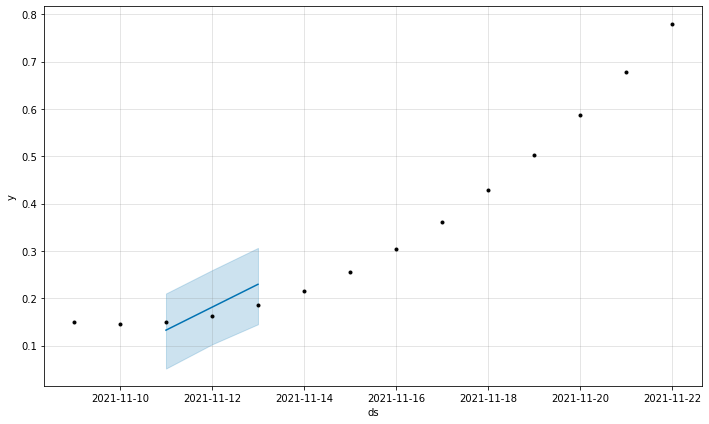

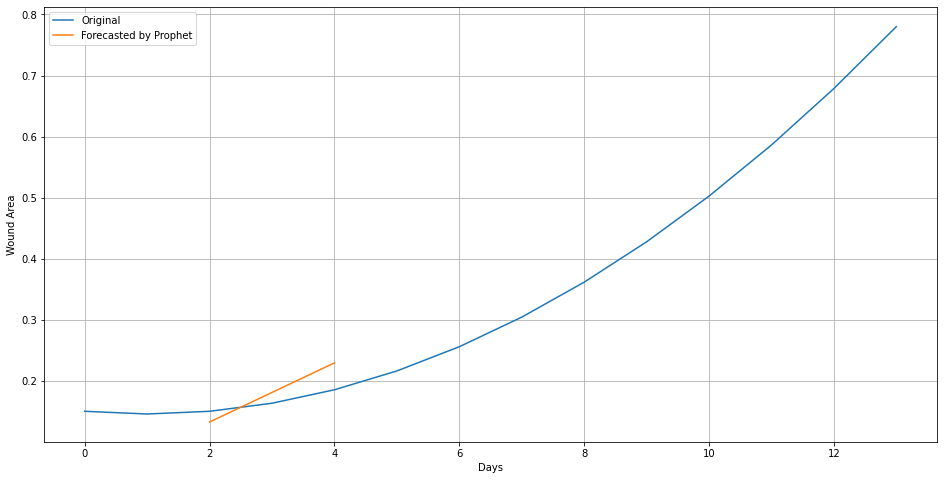

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 203
41
64
Initial log joint probability = -8.42327
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       156.267    0.00012016       77.8813           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       156.319   0.000549186       95.4764   5.755e-06       0.001      175  LS failed, Hessian reset 
     172       156.349   9.68358e-09       81.5008       0.254       0.254      265   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


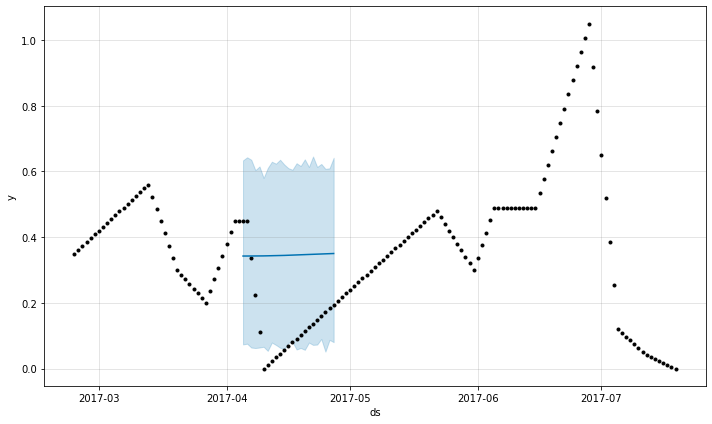

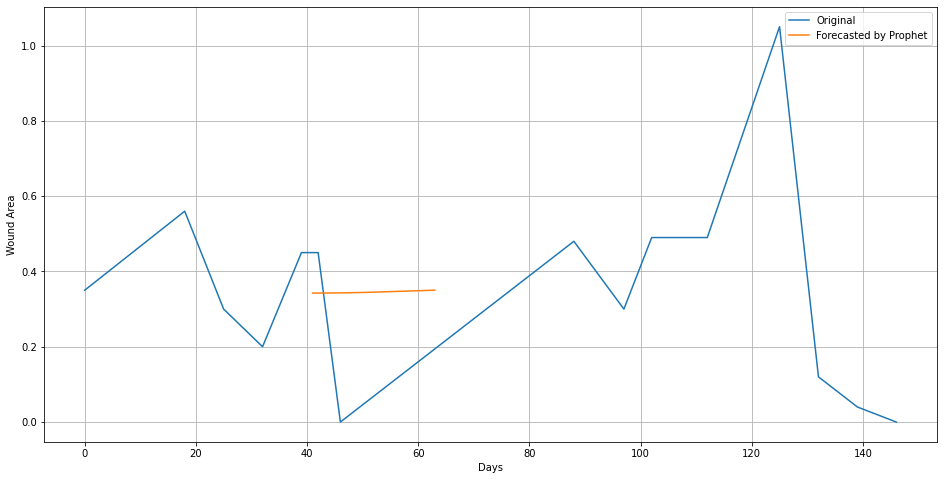

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 204
58
76
Initial log joint probability = -6.73903
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        213.33    0.00355834       81.6685     0.05388      0.8597      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100       213.377    0.00169513       80.3759   2.076e-05       0.001      174  LS failed, Hessian reset 
     125       213.641   0.000107109       84.3704   1.684e-06       0.001      239  LS failed, Hessian reset 
     157       213.649   3.84862e-06       97.5405   5.018e-08       0.001      317  LS failed, Hessian reset 
     189       213.649   5.63824e-09       95.9224      0.5266      0.5266      357   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


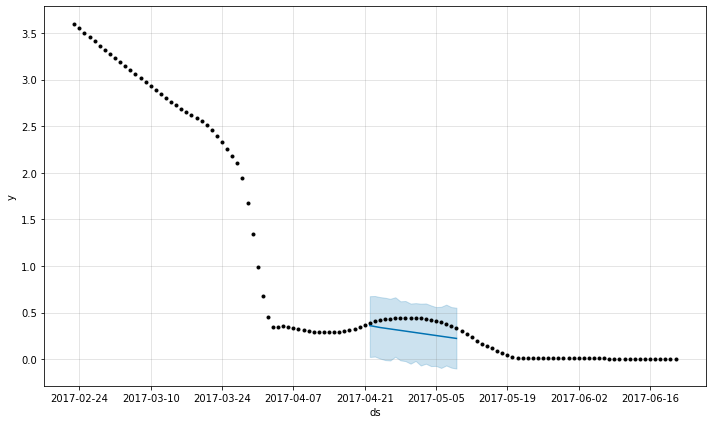

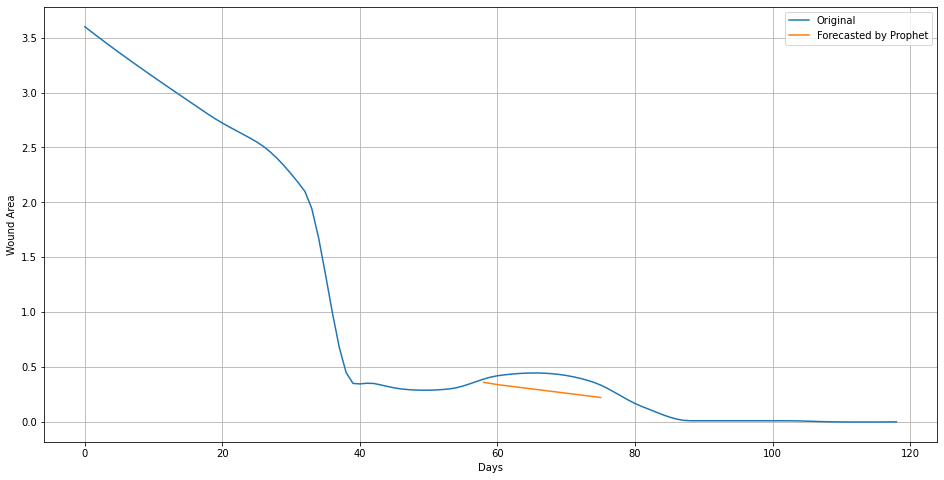

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 205
11
14

Initial log joint probability = -42.1045
Iteration  1. Log joint probability =    6.81366. Improved by 48.9182.
Iteration  2. Log joint probability =    13.6583. Improved by 6.84462.
Iteration  3. Log joint probability =    14.2938. Improved by 0.635518.
Iteration  4. Log joint probability =    14.3842. Improved by 0.0904292.
Iteration  5. Log joint probability =    14.4298. Improved by 0.0456278.
Iteration  6. Log joint probability =    14.5899. Improved by 0.160081.
Iteration  7. Log joint probability =    14.6086. Improved by 0.0186717.
Iteration  8. Log joint probability =    14.6297. Improved by 0.0210671.
Iteration  9. Log joint probability =    14.6495. Improved by 0.0198559.
Iteration 10. Log joint probability =    14.6577. Improved by 0.00816134.
Iteration 11. Log joint probability =    14.6613. Improved by 0.00360311.
Iteration 12. Log joint probability =    14.6614. Improved by 7.31782e-05.
Iteration 13. Log joint probability =    14.6615. Improved by 0.000

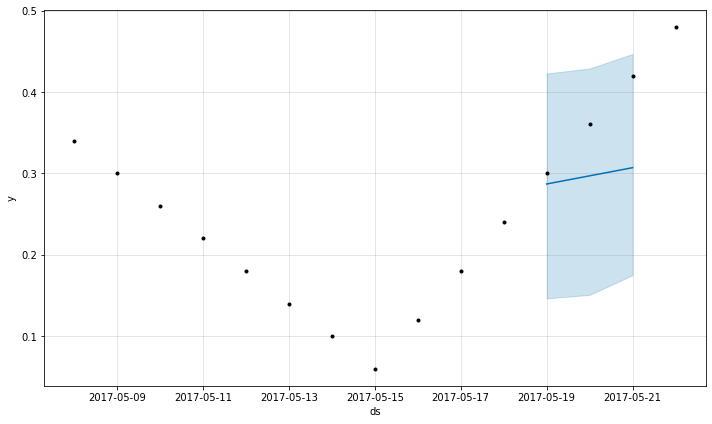

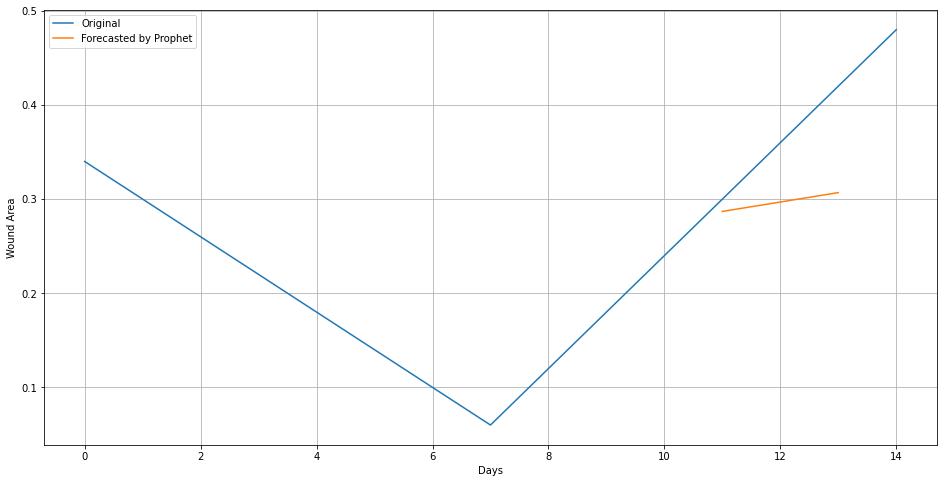

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 12.


Wound: 206
8
11

Initial log joint probability = -41.3756
Iteration  1. Log joint probability =    8.75401. Improved by 50.1296.
Iteration  2. Log joint probability =    19.1601. Improved by 10.4061.
Iteration  3. Log joint probability =    22.4572. Improved by 3.29713.
Iteration  4. Log joint probability =    22.5862. Improved by 0.129041.
Iteration  5. Log joint probability =    22.5932. Improved by 0.0070027.
Iteration  6. Log joint probability =    22.6069. Improved by 0.013638.
Iteration  7. Log joint probability =    22.6101. Improved by 0.00327432.
Iteration  8. Log joint probability =    22.6154. Improved by 0.00526454.
Iteration  9. Log joint probability =    22.6245. Improved by 0.00912436.
Iteration 10. Log joint probability =    22.6276. Improved by 0.00309457.
Iteration 11. Log joint probability =    22.6326. Improved by 0.00499552.
Iteration 12. Log joint probability =     22.638. Improved by 0.00536642.
Iteration 13. Log joint probability =    22.6399. Improved by 0.0019

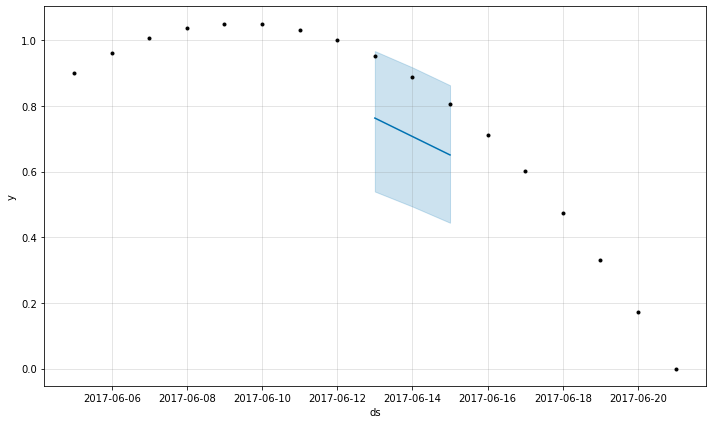

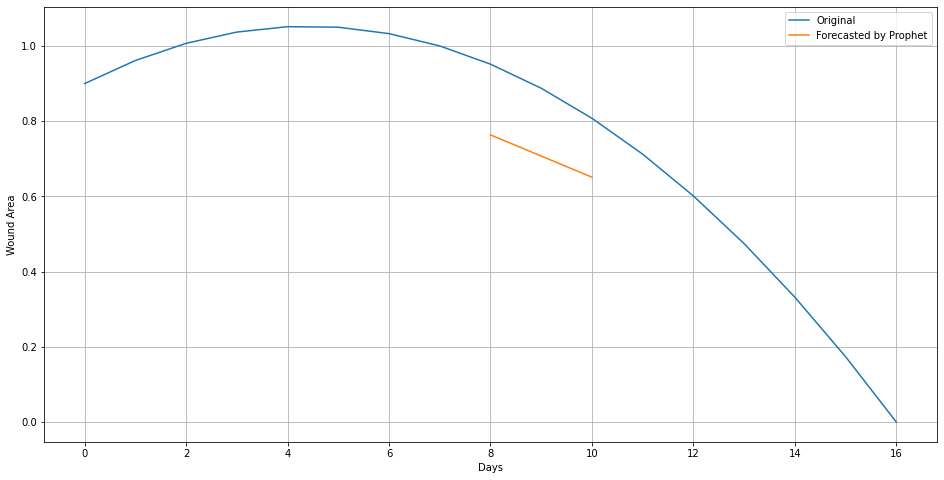

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 207
96
182
Initial log joint probability = -14.8064
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       637.737   7.14237e-05       73.6541           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     168       638.463    0.00218678       69.9195   2.934e-05       0.001      254  LS failed, Hessian reset 
     199       638.675   0.000224313       68.3873           1           1      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243           639   0.000115436       80.2228   1.462e-06       0.001      379  LS failed, Hessian reset 
     296       639.013   1.74927e-08       64.0151      0.1264      0.5471      454   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


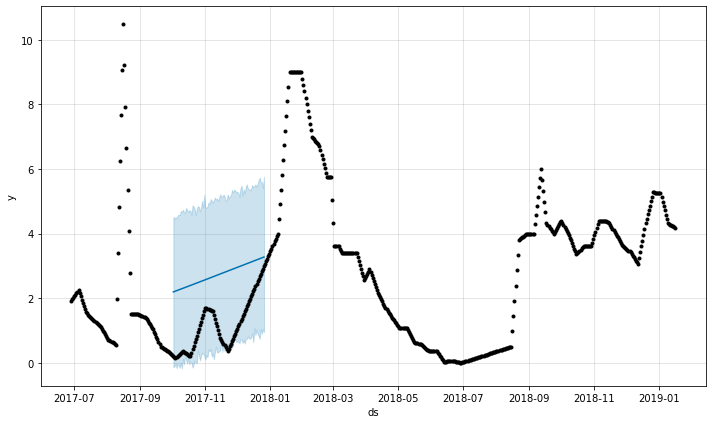

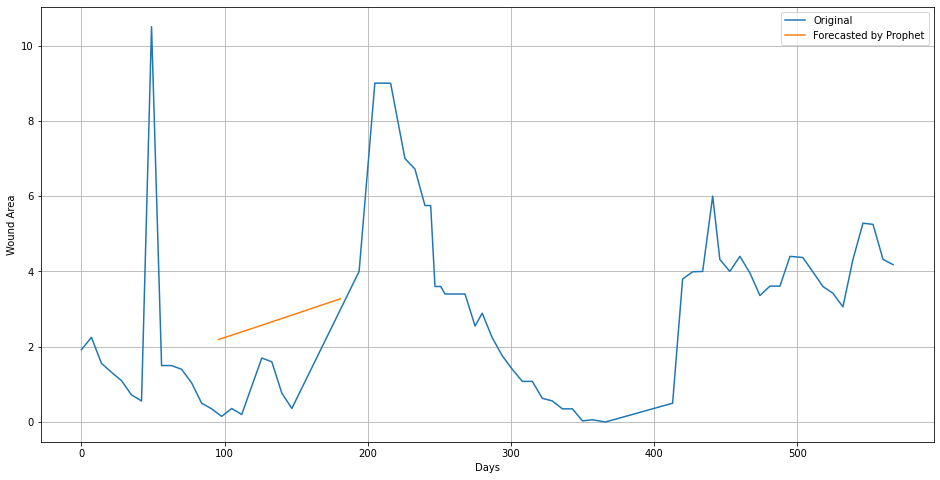

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 208
29
51
Initial log joint probability = -4.84787
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       216.542    0.00268716        69.006      0.5421      0.5421      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       216.814   0.000322231       87.0946    4.63e-06       0.001      201  LS failed, Hessian reset 
     199       216.835   4.06058e-08       69.9384           1           1      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       216.835   5.09374e-09       77.9895      0.2036      0.2036      315   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


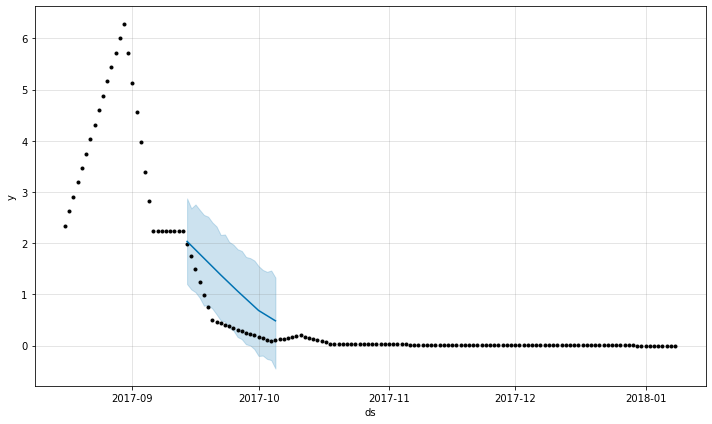

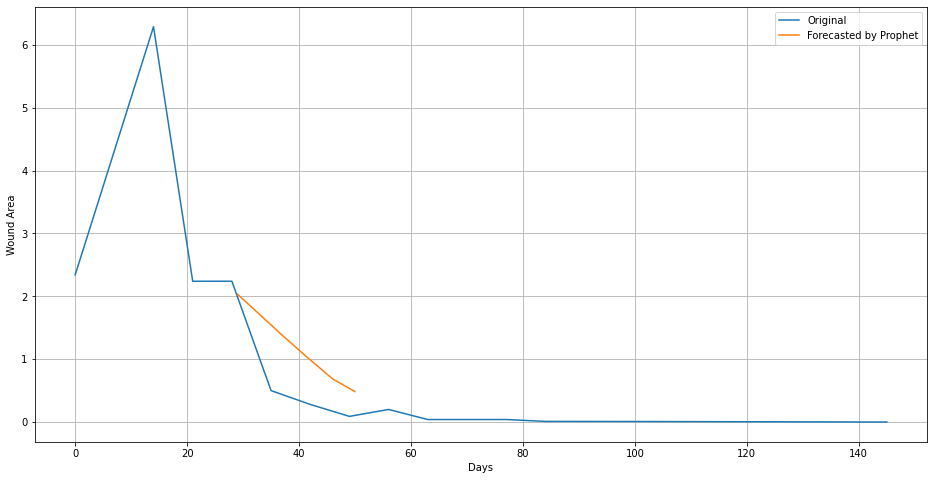

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 16.


Wound: 209
3
7

Initial log joint probability = -38.4557
Iteration  1. Log joint probability =    1.42438. Improved by 39.8801.
Iteration  2. Log joint probability =     20.534. Improved by 19.1096.
Iteration  3. Log joint probability =    21.2382. Improved by 0.704204.
Iteration  4. Log joint probability =    21.4053. Improved by 0.167074.
Iteration  5. Log joint probability =    21.5173. Improved by 0.11206.
Iteration  6. Log joint probability =    21.5437. Improved by 0.0263471.
Iteration  7. Log joint probability =     21.548. Improved by 0.00428101.
Iteration  8. Log joint probability =     21.595. Improved by 0.0470059.
Iteration  9. Log joint probability =    21.6151. Improved by 0.0200749.
Iteration 10. Log joint probability =    21.6245. Improved by 0.00948892.
Iteration 11. Log joint probability =    21.6387. Improved by 0.0141872.
Iteration 12. Log joint probability =    21.6429. Improved by 0.00417892.
Iteration 13. Log joint probability =    21.6452. Improved by 0.00226378

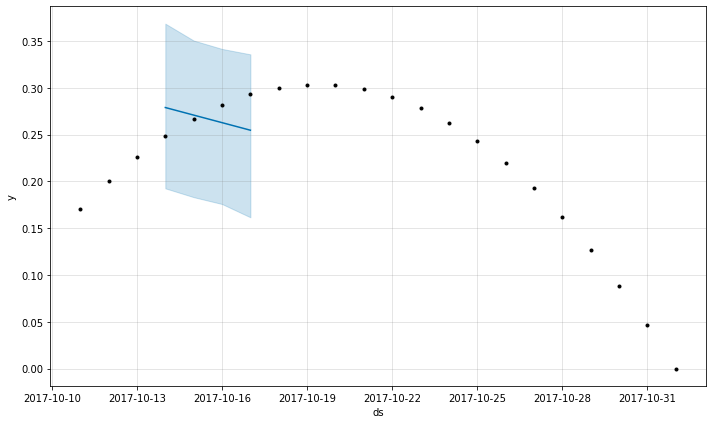

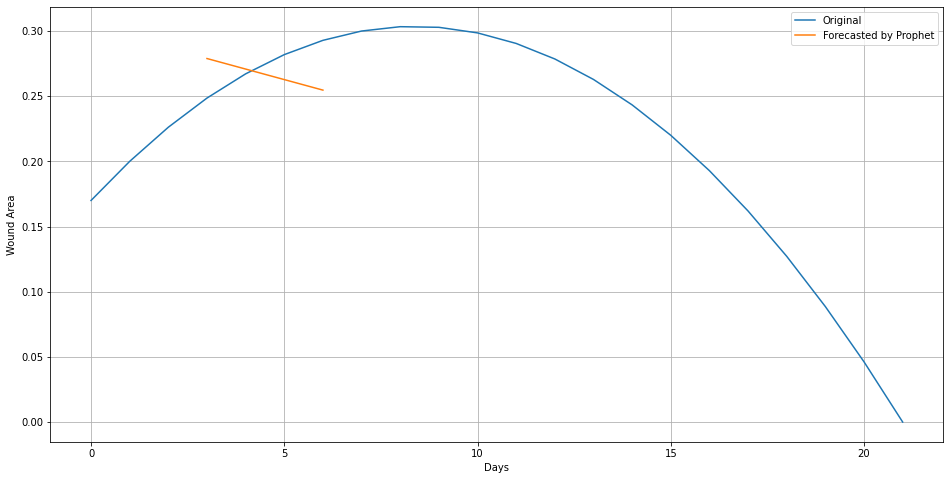

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 210
6
12

Initial log joint probability = -35.4584
Iteration  1. Log joint probability =    17.6474. Improved by 53.1057.
Iteration  2. Log joint probability =    27.5532. Improved by 9.9058.
Iteration  3. Log joint probability =    27.9692. Improved by 0.416022.
Iteration  4. Log joint probability =    28.1016. Improved by 0.132438.
Iteration  5. Log joint probability =    28.1902. Improved by 0.0885768.
Iteration  6. Log joint probability =    28.2277. Improved by 0.0375.
Iteration  7. Log joint probability =    28.2278. Improved by 5.98407e-05.
Iteration  8. Log joint probability =    28.2543. Improved by 0.026565.
Iteration  9. Log joint probability =    28.2919. Improved by 0.0375457.
Iteration 10. Log joint probability =    28.3035. Improved by 0.0116028.
Iteration 11. Log joint probability =    28.3069. Improved by 0.00345455.
Iteration 12. Log joint probability =    28.3106. Improved by 0.00361628.
Iteration 13. Log joint probability =    28.3122. Improved by 0.00163165.

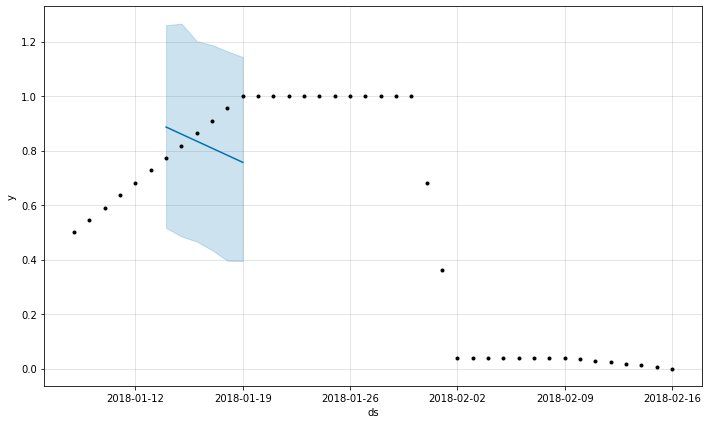

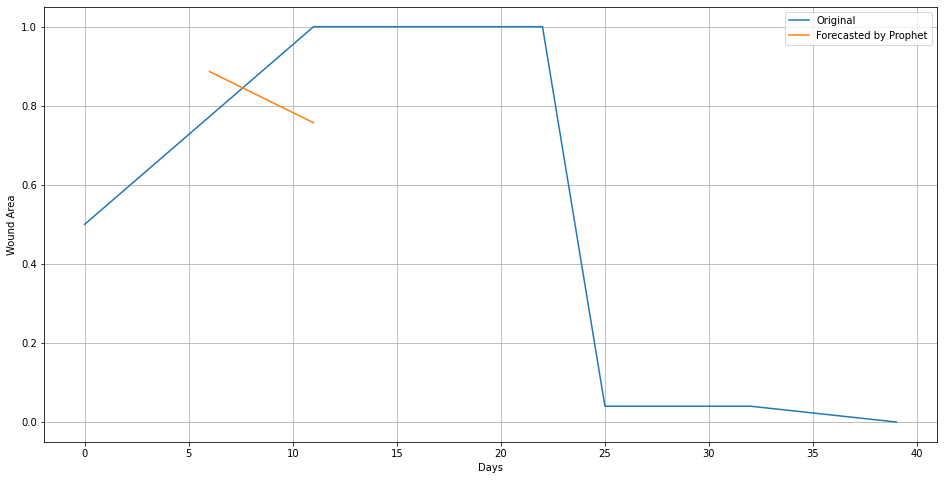

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 14.


Wound: 211
3
6

Initial log joint probability = -39.0661
Iteration  1. Log joint probability =    1.78695. Improved by 40.853.
Iteration  2. Log joint probability =    19.3813. Improved by 17.5944.
Iteration  3. Log joint probability =    20.0396. Improved by 0.658326.
Iteration  4. Log joint probability =    20.1203. Improved by 0.0806164.
Iteration  5. Log joint probability =     20.217. Improved by 0.0967322.
Iteration  6. Log joint probability =    20.2322. Improved by 0.0151844.
Iteration  7. Log joint probability =    20.2754. Improved by 0.0432602.
Iteration  8. Log joint probability =    20.2934. Improved by 0.0179785.
Iteration  9. Log joint probability =    20.2965. Improved by 0.00309167.
Iteration 10. Log joint probability =    20.3007. Improved by 0.00416103.
Iteration 11. Log joint probability =    20.3083. Improved by 0.00761023.
Iteration 12. Log joint probability =    20.3112. Improved by 0.00287988.
Iteration 13. Log joint probability =    20.3126. Improved by 0.00141

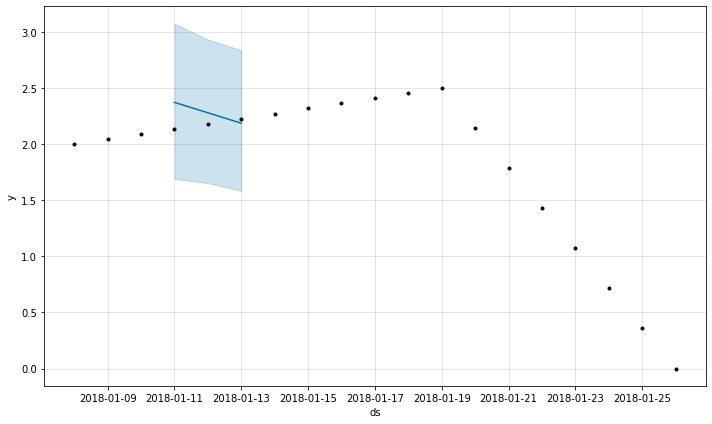

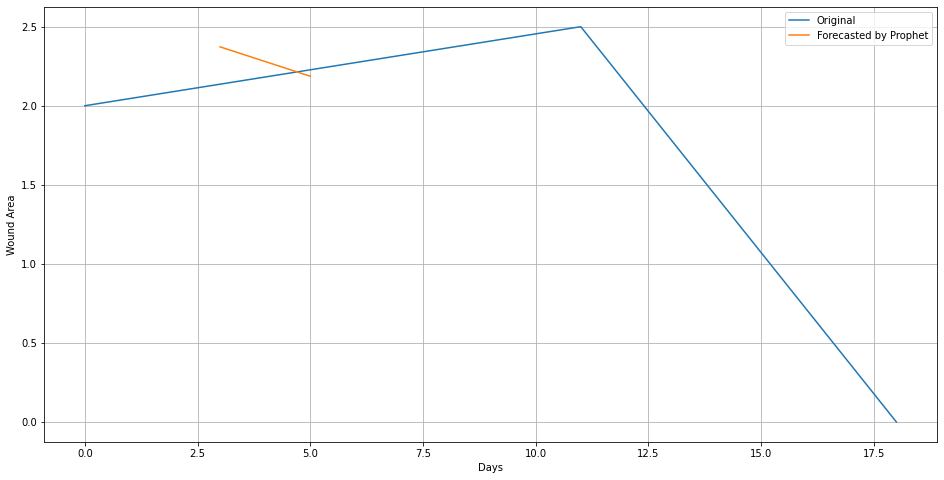

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 212
6
20

Initial log joint probability = -83.9328
Iteration  1. Log joint probability =    67.6743. Improved by 151.607.
Iteration  2. Log joint probability =    124.549. Improved by 56.8751.
Iteration  3. Log joint probability =    146.389. Improved by 21.8393.
Iteration  4. Log joint probability =    146.926. Improved by 0.537076.
Iteration  5. Log joint probability =    146.981. Improved by 0.0553081.
Iteration  6. Log joint probability =    147.008. Improved by 0.0271233.
Iteration  7. Log joint probability =    147.039. Improved by 0.0308162.
Iteration  8. Log joint probability =    147.054. Improved by 0.0151025.
Iteration  9. Log joint probability =    147.073. Improved by 0.0185044.
Iteration 10. Log joint probability =    147.079. Improved by 0.00623521.
Iteration 11. Log joint probability =    147.085. Improved by 0.00593064.
Iteration 12. Log joint probability =    147.093. Improved by 0.00804551.
Iteration 13. Log joint probability =    147.093. Improved by 0.000290

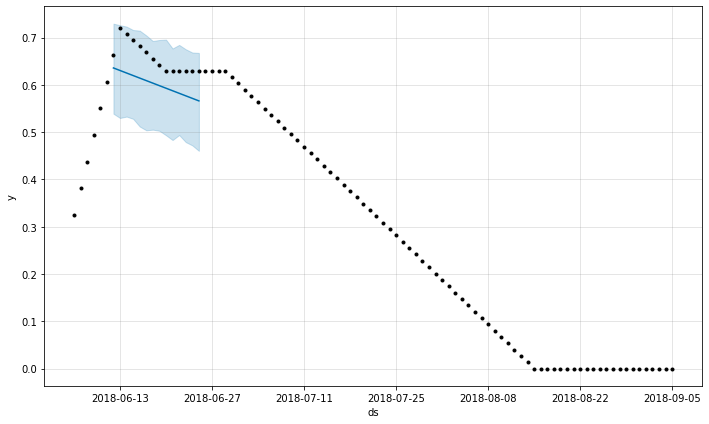

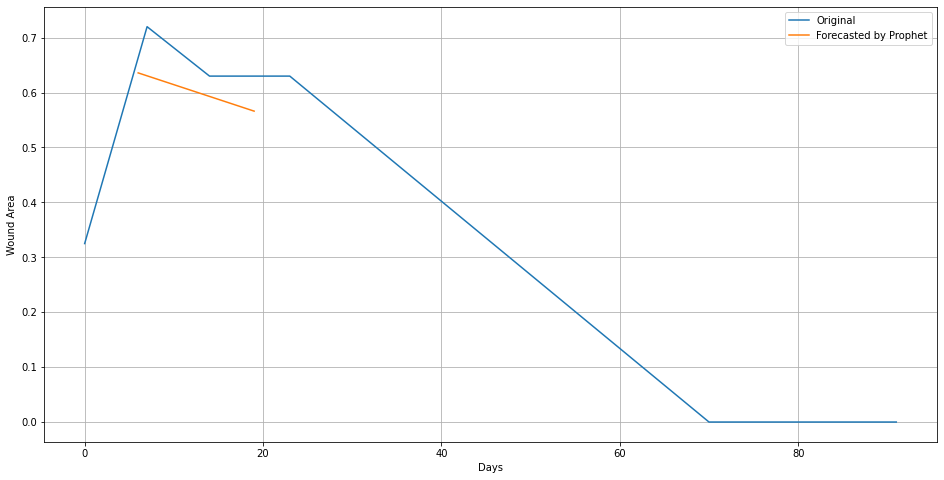

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 213
3
6

Initial log joint probability = -41.1065
Iteration  1. Log joint probability =    11.0467. Improved by 52.1532.
Iteration  2. Log joint probability =    20.5481. Improved by 9.5014.
Iteration  3. Log joint probability =    26.4739. Improved by 5.92584.
Iteration  4. Log joint probability =    27.2976. Improved by 0.823703.
Iteration  5. Log joint probability =    27.3859. Improved by 0.0882429.
Iteration  6. Log joint probability =    27.4681. Improved by 0.0822505.
Iteration  7. Log joint probability =    27.4745. Improved by 0.00641344.
Iteration  8. Log joint probability =    27.4766. Improved by 0.00209654.
Iteration  9. Log joint probability =    27.4927. Improved by 0.0160624.
Iteration 10. Log joint probability =    27.4981. Improved by 0.00544388.
Iteration 11. Log joint probability =    27.5086. Improved by 0.0104239.
Iteration 12. Log joint probability =     27.513. Improved by 0.00447997.
Iteration 13. Log joint probability =    27.5142. Improved by 0.0011620

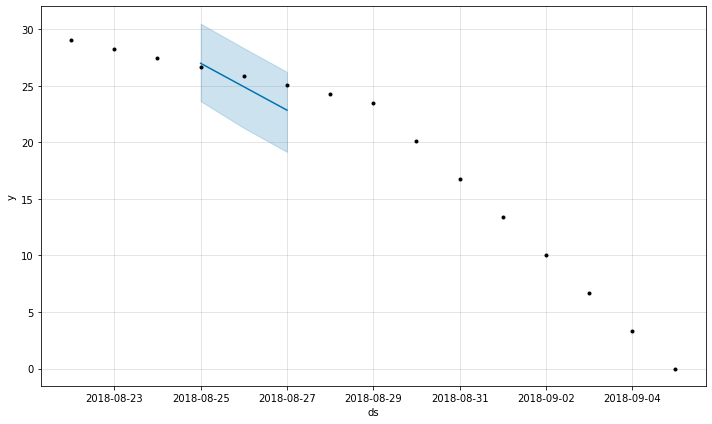

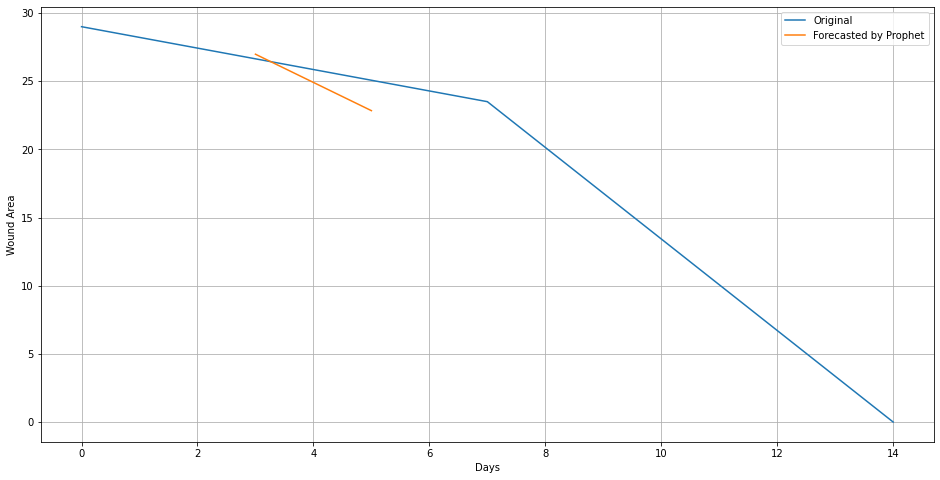

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 214
31
42

Initial log joint probability = -63.7251
Iteration  1. Log joint probability =     58.158. Improved by 121.883.
Iteration  2. Log joint probability =    90.4397. Improved by 32.2816.
Iteration  3. Log joint probability =    93.3845. Improved by 2.94489.
Iteration  4. Log joint probability =    93.6642. Improved by 0.279626.
Iteration  5. Log joint probability =    93.7519. Improved by 0.0877721.
Iteration  6. Log joint probability =    93.7595. Improved by 0.00754025.
Iteration  7. Log joint probability =    93.7681. Improved by 0.0085753.
Iteration  8. Log joint probability =    93.7779. Improved by 0.00980199.
Iteration  9. Log joint probability =    93.7922. Improved by 0.0143803.
Iteration 10. Log joint probability =    93.8086. Improved by 0.0163777.
Iteration 11. Log joint probability =    93.8119. Improved by 0.0032615.
Iteration 12. Log joint probability =    93.8189. Improved by 0.00706987.
Iteration 13. Log joint probability =    93.8222. Improved by 0.00320

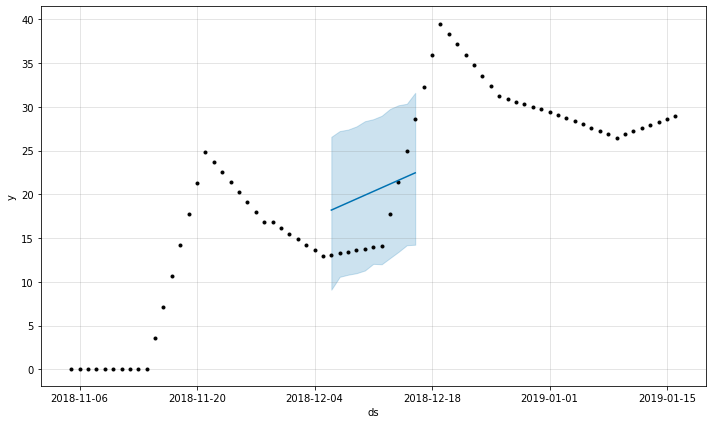

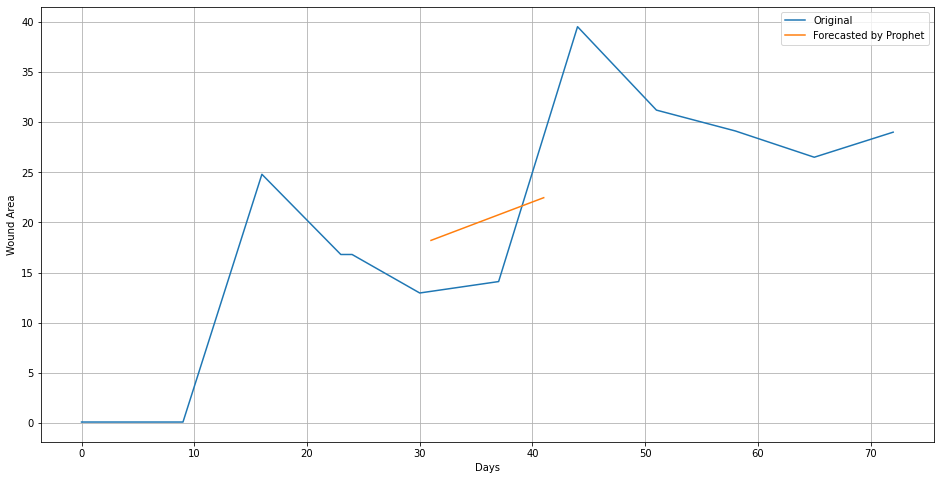

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


Wound: 215
16
20

Initial log joint probability = -33.37
Iteration  1. Log joint probability =    9.48572. Improved by 42.8557.
Iteration  2. Log joint probability =    35.3011. Improved by 25.8154.
Iteration  3. Log joint probability =    35.4422. Improved by 0.141078.
Iteration  4. Log joint probability =    37.4913. Improved by 2.04918.
Iteration  5. Log joint probability =    39.0364. Improved by 1.54502.
Iteration  6. Log joint probability =    39.0775. Improved by 0.0411115.
Iteration  7. Log joint probability =    39.2896. Improved by 0.212128.
Iteration  8. Log joint probability =    39.3561. Improved by 0.0664764.
Iteration  9. Log joint probability =    39.4126. Improved by 0.0565532.
Iteration 10. Log joint probability =    39.4232. Improved by 0.0105365.
Iteration 11. Log joint probability =     39.664. Improved by 0.240794.
Iteration 12. Log joint probability =    39.6912. Improved by 0.0272633.
Iteration 13. Log joint probability =    39.9311. Improved by 0.239854.
Iterat

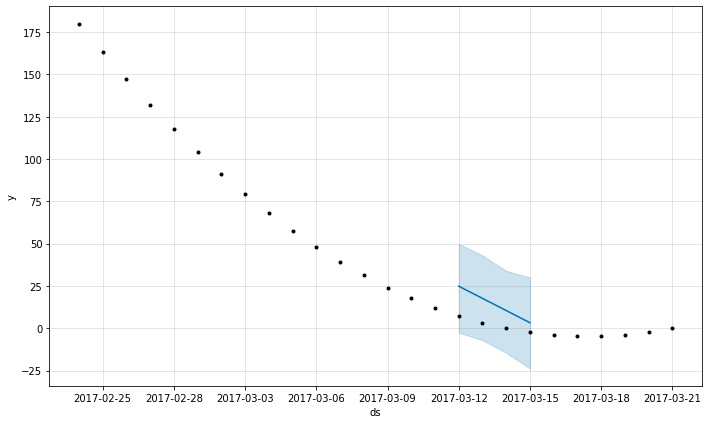

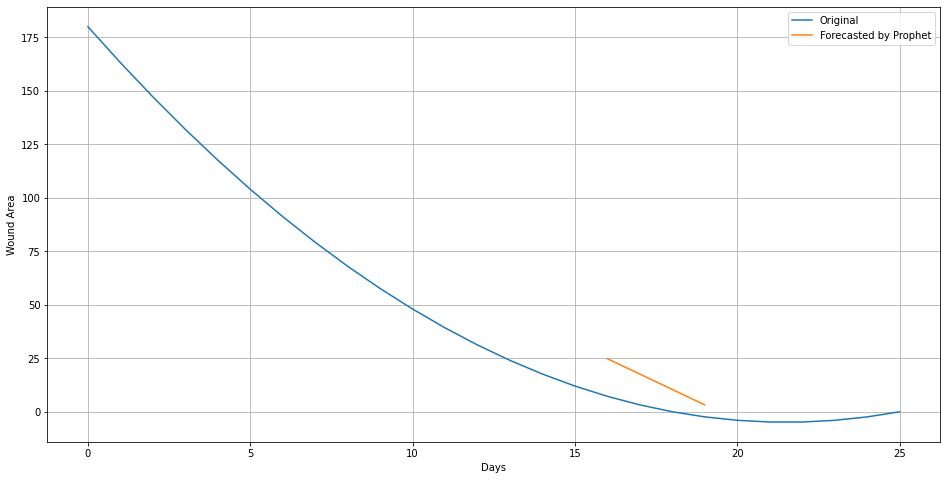

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 19.


Wound: 216
2
6

Initial log joint probability = -33.3401
Iteration  1. Log joint probability =     11.212. Improved by 44.5521.
Iteration  2. Log joint probability =    35.8553. Improved by 24.6433.
Iteration  3. Log joint probability =    40.1425. Improved by 4.2872.
Iteration  4. Log joint probability =    42.3655. Improved by 2.223.
Iteration  5. Log joint probability =    42.8778. Improved by 0.512292.
Iteration  6. Log joint probability =    42.9241. Improved by 0.0463152.
Iteration  7. Log joint probability =    43.0244. Improved by 0.100258.
Iteration  8. Log joint probability =    43.0406. Improved by 0.0162656.
Iteration  9. Log joint probability =    43.0805. Improved by 0.0398405.
Iteration 10. Log joint probability =     43.099. Improved by 0.0184659.
Iteration 11. Log joint probability =    43.1647. Improved by 0.0657352.
Iteration 12. Log joint probability =    43.1922. Improved by 0.0275066.
Iteration 13. Log joint probability =    43.9418. Improved by 0.749592.
Iteratio

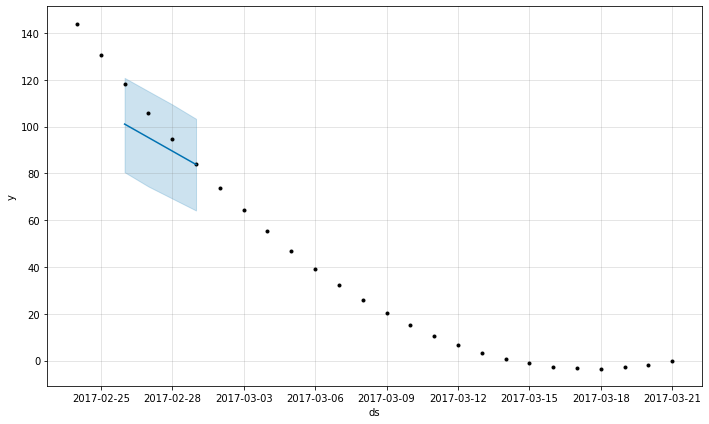

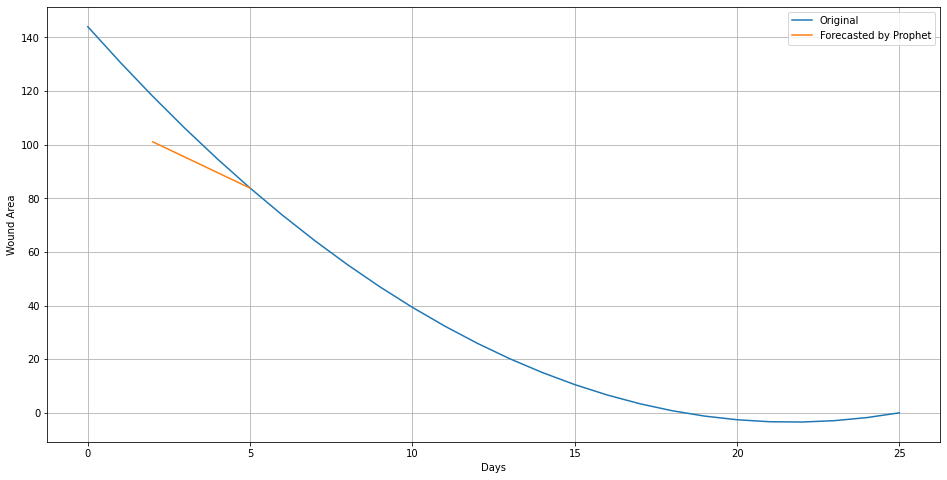

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 217
58
73

Initial log joint probability = -89.1498
Iteration  1. Log joint probability =    77.8237. Improved by 166.973.
Iteration  2. Log joint probability =    86.4282. Improved by 8.60453.
Iteration  3. Log joint probability =    86.5112. Improved by 0.083032.
Iteration  4. Log joint probability =    86.6038. Improved by 0.0925208.
Iteration  5. Log joint probability =    86.6278. Improved by 0.0240709.
Iteration  6. Log joint probability =     86.687. Improved by 0.0591296.
Iteration  7. Log joint probability =    86.6874. Improved by 0.000405714.
Iteration  8. Log joint probability =    86.7024. Improved by 0.0150302.
Iteration  9. Log joint probability =    86.7103. Improved by 0.00788334.
Iteration 10. Log joint probability =    86.7147. Improved by 0.00438701.
Iteration 11. Log joint probability =    86.7196. Improved by 0.00494317.
Iteration 12. Log joint probability =    86.7252. Improved by 0.00560873.
Iteration 13. Log joint probability =    86.7275. Improved by 0.

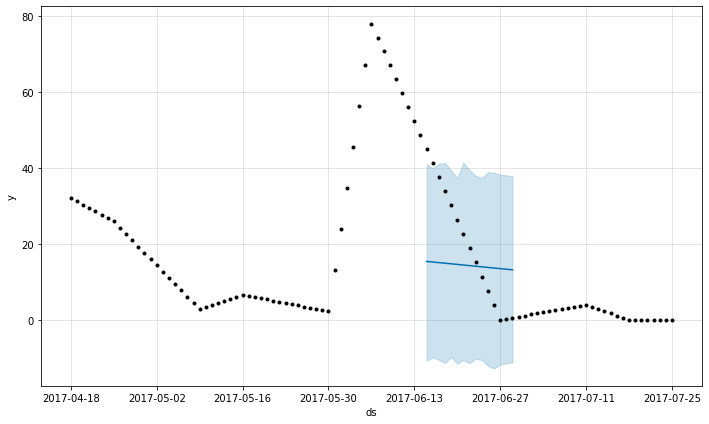

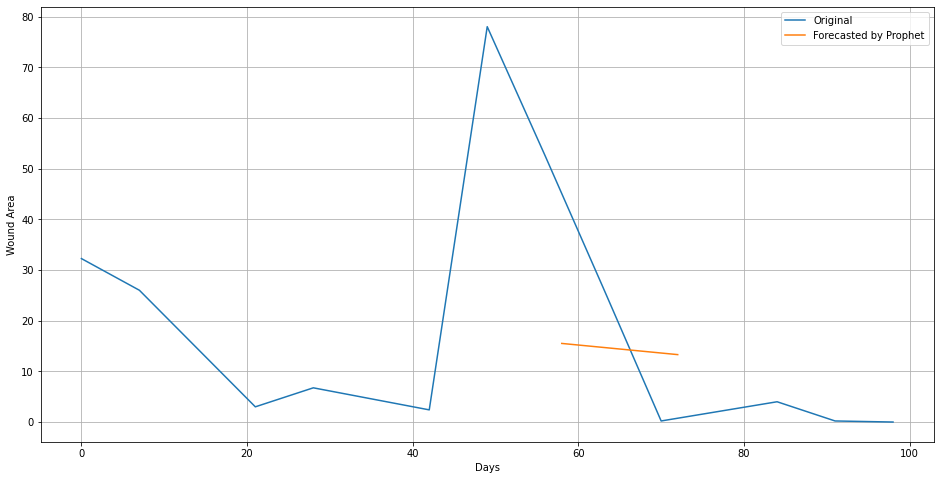

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 218
36
44

Initial log joint probability = -43.7629
Iteration  1. Log joint probability =    24.4046. Improved by 68.1675.
Iteration  2. Log joint probability =    31.8923. Improved by 7.48762.
Iteration  3. Log joint probability =    32.0409. Improved by 0.148688.
Iteration  4. Log joint probability =      32.14. Improved by 0.0990607.
Iteration  5. Log joint probability =    32.2111. Improved by 0.0711297.
Iteration  6. Log joint probability =    32.2184. Improved by 0.00728596.
Iteration  7. Log joint probability =    32.2623. Improved by 0.0438331.
Iteration  8. Log joint probability =    32.2667. Improved by 0.00449544.
Iteration  9. Log joint probability =    32.2797. Improved by 0.0129636.
Iteration 10. Log joint probability =    32.2852. Improved by 0.00544734.
Iteration 11. Log joint probability =    32.2887. Improved by 0.00352367.
Iteration 12. Log joint probability =    32.2983. Improved by 0.00965462.
Iteration 13. Log joint probability =    32.3006. Improved by 0.0

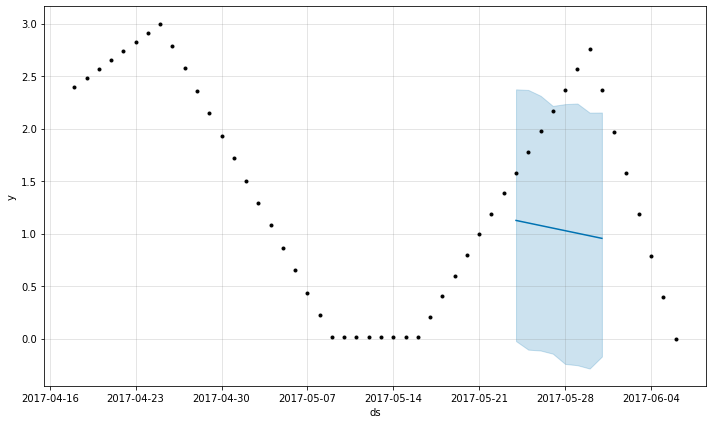

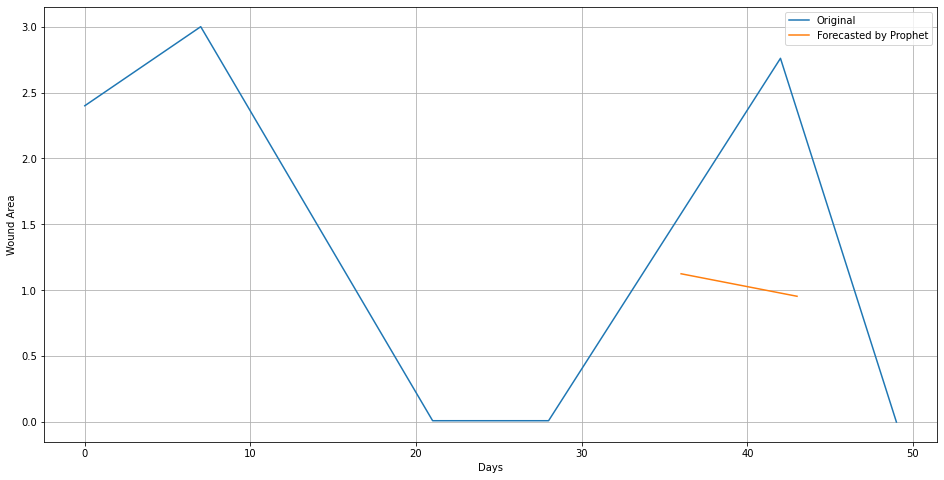

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 11.


Wound: 219
6
9

Initial log joint probability = -41.1027
Iteration  1. Log joint probability =     11.084. Improved by 52.1866.
Iteration  2. Log joint probability =     20.445. Improved by 9.36102.
Iteration  3. Log joint probability =    27.3944. Improved by 6.9494.
Iteration  4. Log joint probability =    27.5312. Improved by 0.136792.
Iteration  5. Log joint probability =    27.5777. Improved by 0.0465407.
Iteration  6. Log joint probability =    27.5928. Improved by 0.0151281.
Iteration  7. Log joint probability =    27.6173. Improved by 0.0244955.
Iteration  8. Log joint probability =    27.6272. Improved by 0.00983779.
Iteration  9. Log joint probability =    27.6274. Improved by 0.000210132.
Iteration 10. Log joint probability =    27.6281. Improved by 0.000677789.
Iteration 11. Log joint probability =    27.6478. Improved by 0.0197188.
Iteration 12. Log joint probability =    27.6483. Improved by 0.000519022.
Iteration 13. Log joint probability =    27.6525. Improved by 0.0042

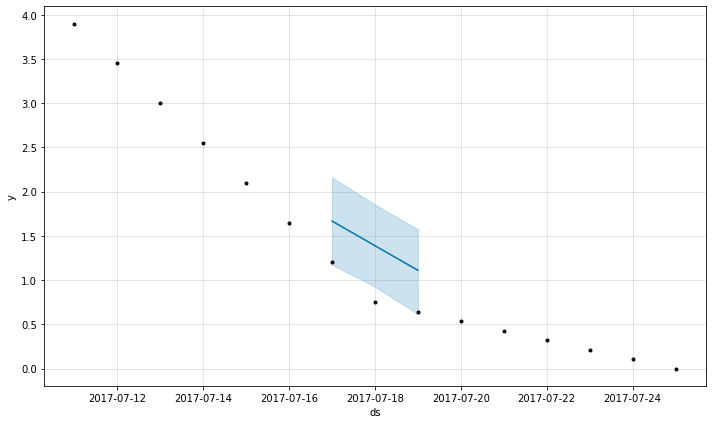

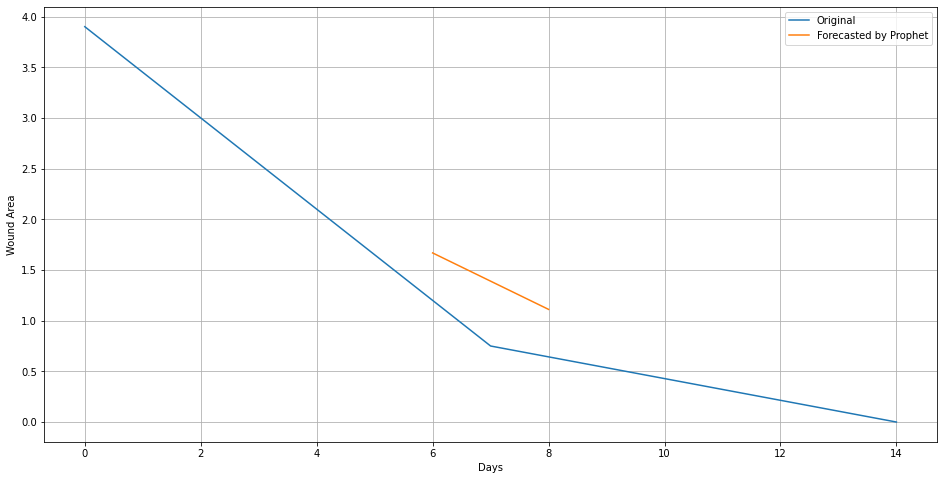

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 220
9
15

Initial log joint probability = -31.1682
Iteration  1. Log joint probability =    18.7679. Improved by 49.9361.
Iteration  2. Log joint probability =    21.2204. Improved by 2.45253.
Iteration  3. Log joint probability =    25.6849. Improved by 4.46445.
Iteration  4. Log joint probability =    32.0468. Improved by 6.36196.
Iteration  5. Log joint probability =    32.0741. Improved by 0.0272265.
Iteration  6. Log joint probability =    32.0989. Improved by 0.0248628.
Iteration  7. Log joint probability =    32.1365. Improved by 0.0376024.
Iteration  8. Log joint probability =    32.1524. Improved by 0.0158939.
Iteration  9. Log joint probability =    32.1809. Improved by 0.0284552.
Iteration 10. Log joint probability =    32.2239. Improved by 0.0429962.
Iteration 11. Log joint probability =    32.2336. Improved by 0.00969052.
Iteration 12. Log joint probability =    32.4254. Improved by 0.191856.
Iteration 13. Log joint probability =    32.4265. Improved by 0.00104956.


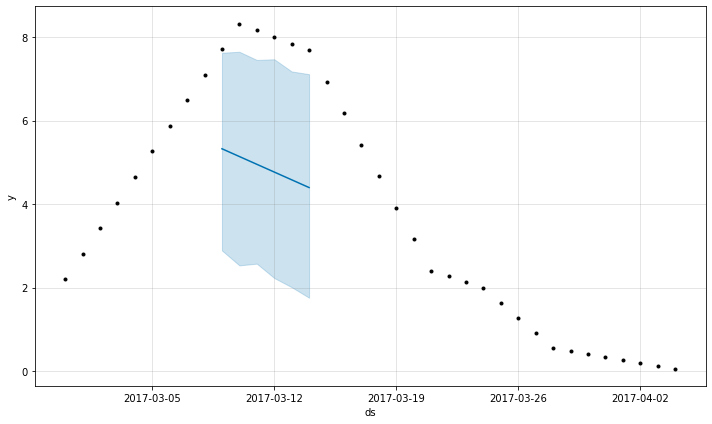

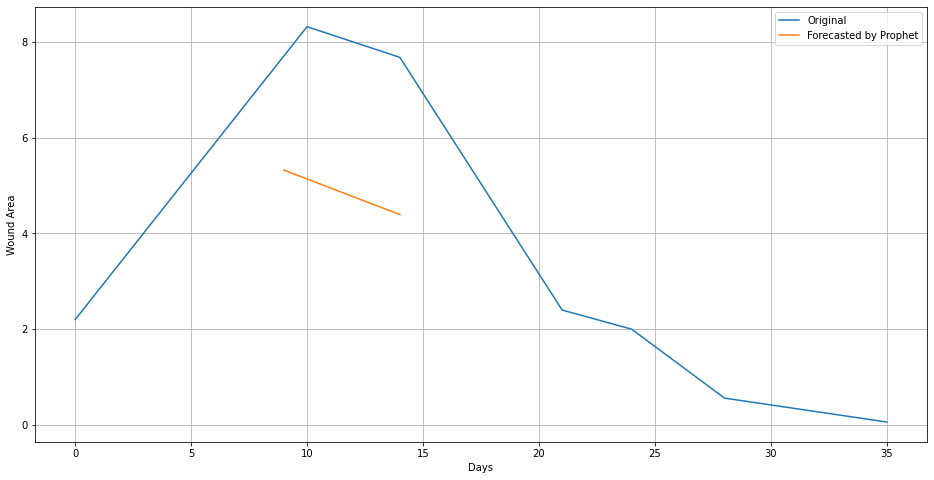

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 221
9
14

Initial log joint probability = -29.2676
Iteration  1. Log joint probability =    8.12831. Improved by 37.3959.
Iteration  2. Log joint probability =    31.7404. Improved by 23.6121.
Iteration  3. Log joint probability =    46.4331. Improved by 14.6927.
Iteration  4. Log joint probability =    46.5971. Improved by 0.164085.
Iteration  5. Log joint probability =    46.6387. Improved by 0.0415739.
Iteration  6. Log joint probability =    46.6859. Improved by 0.0471949.
Iteration  7. Log joint probability =    46.6994. Improved by 0.0134558.
Iteration  8. Log joint probability =    46.7074. Improved by 0.00804367.
Iteration  9. Log joint probability =    46.7091. Improved by 0.00169643.
Iteration 10. Log joint probability =    46.7126. Improved by 0.00345935.
Iteration 11. Log joint probability =    46.7165. Improved by 0.00393723.
Iteration 12. Log joint probability =    46.7247. Improved by 0.00821703.
Iteration 13. Log joint probability =    46.7263. Improved by 0.0016

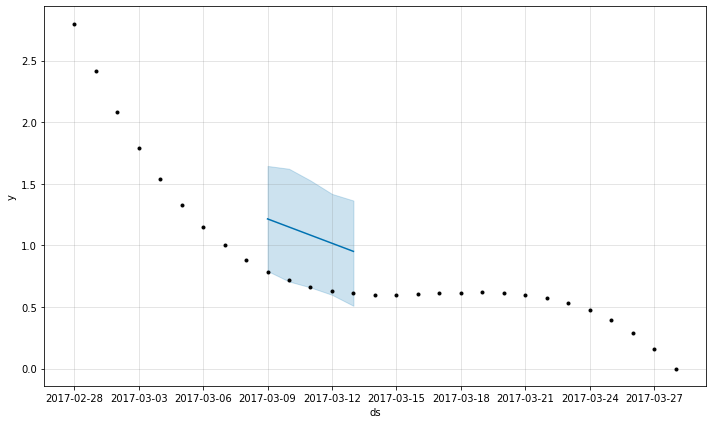

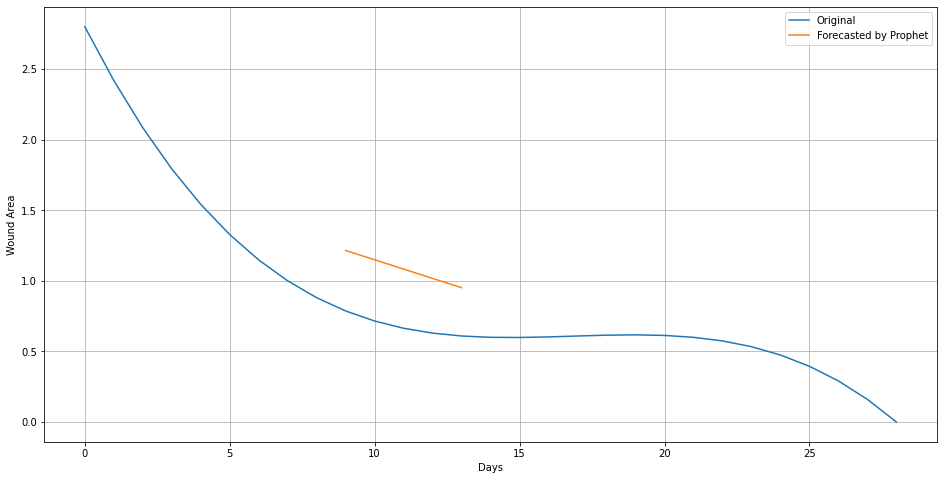

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 222
12
17

Initial log joint probability = -29.136
Iteration  1. Log joint probability =    17.0816. Improved by 46.2176.
Iteration  2. Log joint probability =    35.0174. Improved by 17.9358.
Iteration  3. Log joint probability =    47.4737. Improved by 12.4563.
Iteration  4. Log joint probability =    48.1097. Improved by 0.636009.
Iteration  5. Log joint probability =    48.1591. Improved by 0.0494597.
Iteration  6. Log joint probability =    48.1864. Improved by 0.0272987.
Iteration  7. Log joint probability =    48.2019. Improved by 0.0154859.
Iteration  8. Log joint probability =    48.2227. Improved by 0.0208199.
Iteration  9. Log joint probability =    48.2252. Improved by 0.00244001.
Iteration 10. Log joint probability =    48.2293. Improved by 0.00411222.
Iteration 11. Log joint probability =    48.2297. Improved by 0.000421965.
Iteration 12. Log joint probability =    48.2448. Improved by 0.0150477.
Iteration 13. Log joint probability =    48.2487. Improved by 0.00390

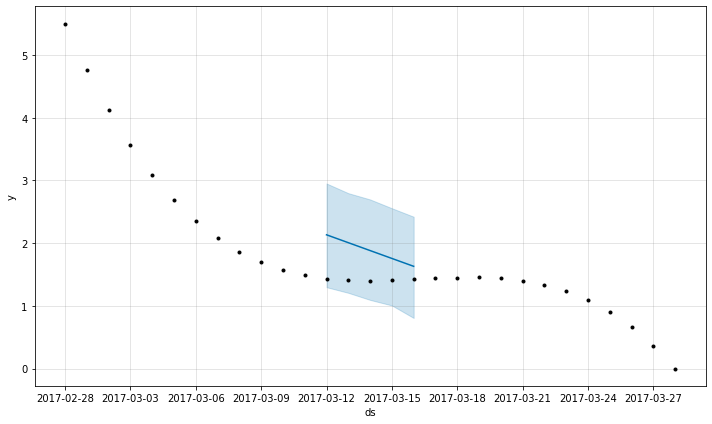

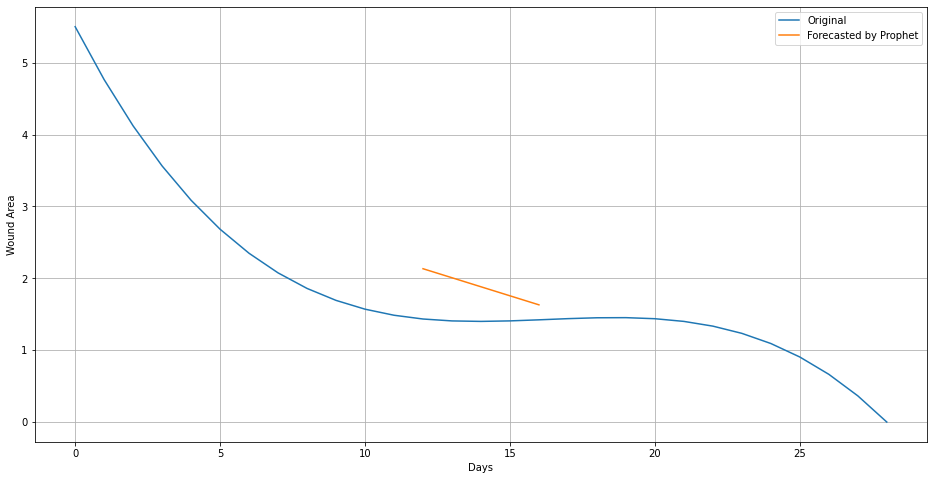

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 223
12
17

Initial log joint probability = -29.2301
Iteration  1. Log joint probability =    20.6538. Improved by 49.8838.
Iteration  2. Log joint probability =    32.5691. Improved by 11.9153.
Iteration  3. Log joint probability =    33.4024. Improved by 0.833335.
Iteration  4. Log joint probability =     33.849. Improved by 0.446614.
Iteration  5. Log joint probability =    33.8805. Improved by 0.0314495.
Iteration  6. Log joint probability =     33.894. Improved by 0.0135388.
Iteration  7. Log joint probability =    33.9082. Improved by 0.0142242.
Iteration  8. Log joint probability =    33.9828. Improved by 0.0746149.
Iteration  9. Log joint probability =    33.9866. Improved by 0.00379571.
Iteration 10. Log joint probability =    34.0281. Improved by 0.0414536.
Iteration 11. Log joint probability =    34.1579. Improved by 0.129798.
Iteration 12. Log joint probability =    34.2128. Improved by 0.0549597.
Iteration 13. Log joint probability =    34.2798. Improved by 0.0669634

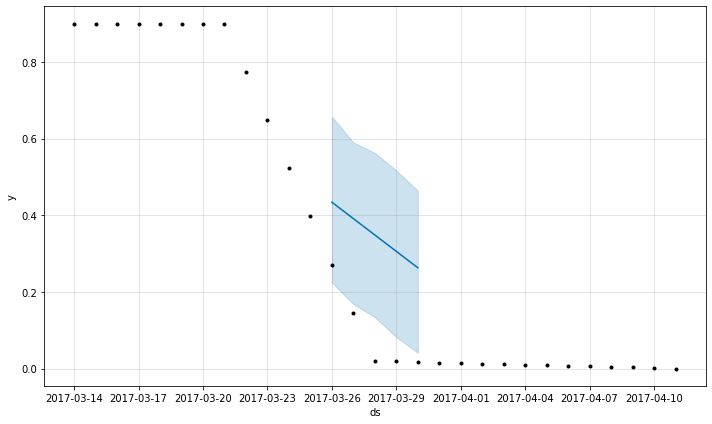

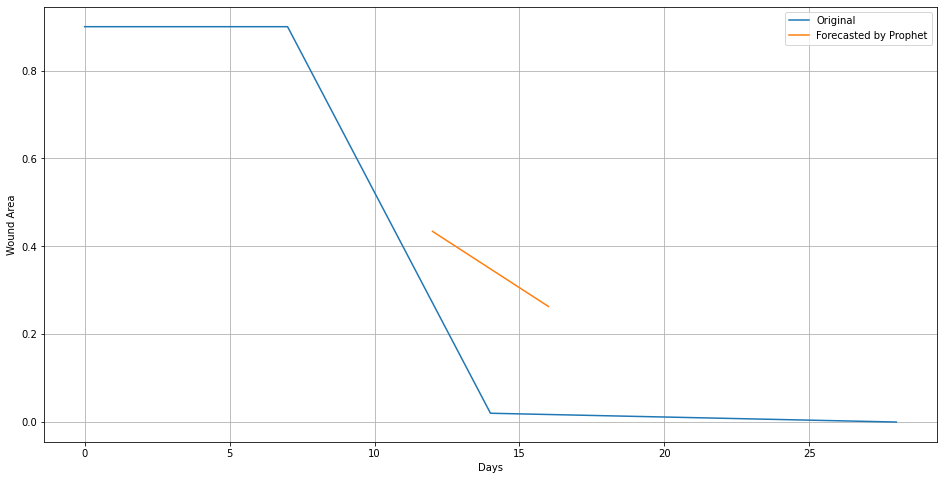

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 224
36
48

Initial log joint probability = -80.8773
Iteration  1. Log joint probability =    30.2124. Improved by 111.09.
Iteration  2. Log joint probability =    39.7399. Improved by 9.52754.
Iteration  3. Log joint probability =    42.9653. Improved by 3.22537.
Iteration  4. Log joint probability =    61.1848. Improved by 18.2195.
Iteration  5. Log joint probability =     61.248. Improved by 0.0632798.
Iteration  6. Log joint probability =    61.3238. Improved by 0.075787.
Iteration  7. Log joint probability =    61.4846. Improved by 0.160784.
Iteration  8. Log joint probability =    61.4911. Improved by 0.00646175.
Iteration  9. Log joint probability =     61.566. Improved by 0.0749034.
Iteration 10. Log joint probability =    61.5748. Improved by 0.00884148.
Iteration 11. Log joint probability =    61.9483. Improved by 0.373474.
Iteration 12. Log joint probability =    62.0418. Improved by 0.0934973.
Iteration 13. Log joint probability =    62.4263. Improved by 0.384553.
Ite

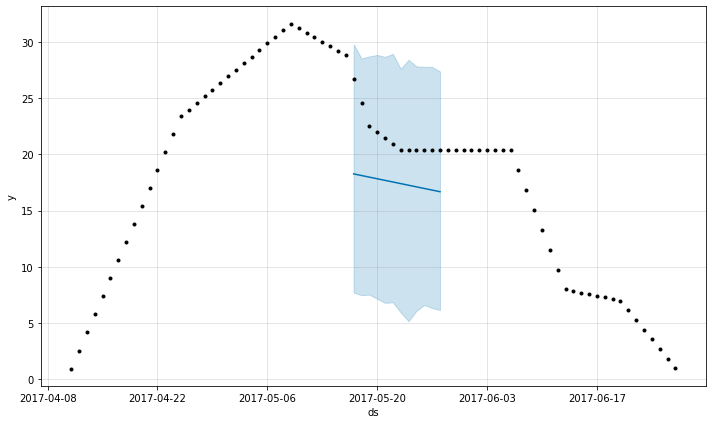

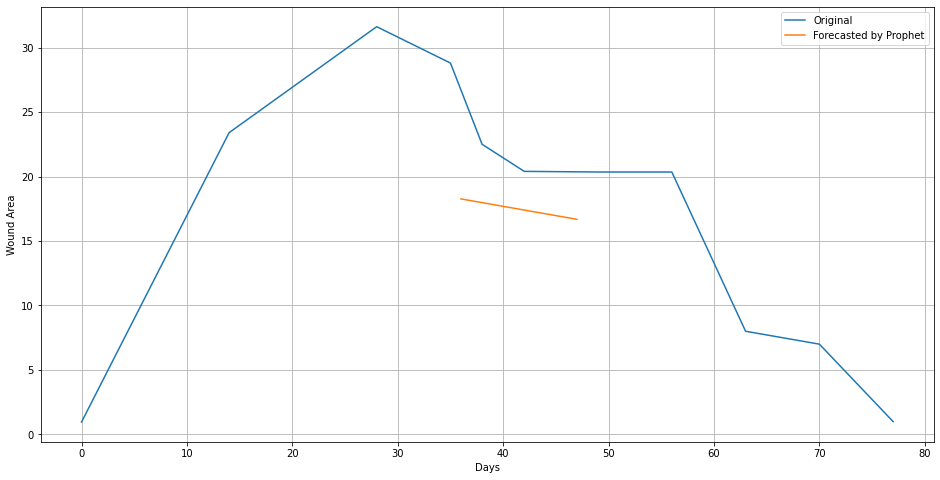

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 225
22
27

Initial log joint probability = -28.8987
Iteration  1. Log joint probability =    23.0115. Improved by 51.9102.
Iteration  2. Log joint probability =    36.3445. Improved by 13.3331.
Iteration  3. Log joint probability =    40.2853. Improved by 3.94075.
Iteration  4. Log joint probability =     40.476. Improved by 0.190675.
Iteration  5. Log joint probability =    40.6812. Improved by 0.205257.
Iteration  6. Log joint probability =    40.8634. Improved by 0.182216.
Iteration  7. Log joint probability =    40.8748. Improved by 0.0113558.
Iteration  8. Log joint probability =     40.899. Improved by 0.0242393.
Iteration  9. Log joint probability =    40.9368. Improved by 0.0378107.
Iteration 10. Log joint probability =    41.0131. Improved by 0.0762658.
Iteration 11. Log joint probability =    41.0839. Improved by 0.0708436.
Iteration 12. Log joint probability =    41.1133. Improved by 0.0293902.
Iteration 13. Log joint probability =    41.1253. Improved by 0.0119515.
I

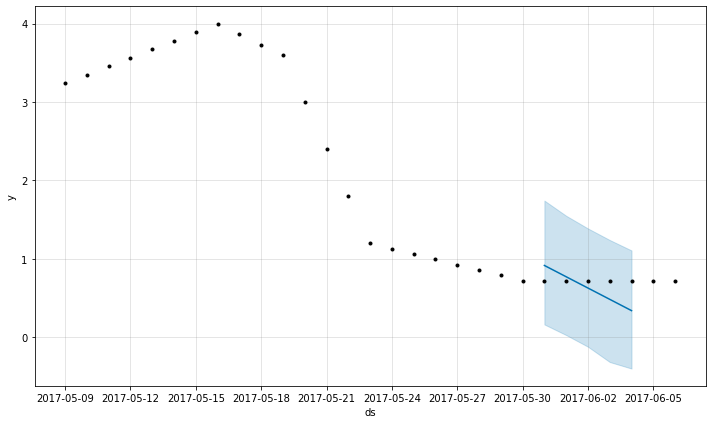

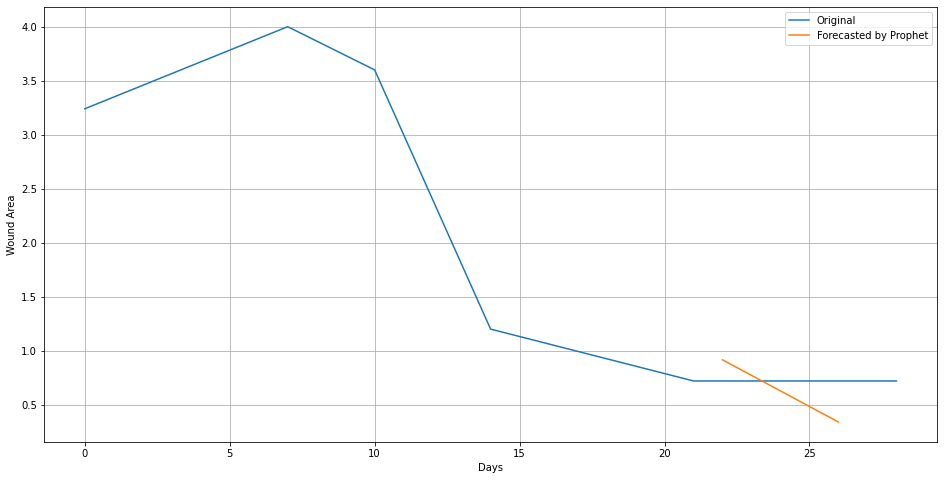

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


Wound: 226
7
11

Initial log joint probability = -39.4287
Iteration  1. Log joint probability =    2.46291. Improved by 41.8917.
Iteration  2. Log joint probability =    18.8642. Improved by 16.4013.
Iteration  3. Log joint probability =    19.6844. Improved by 0.820287.
Iteration  4. Log joint probability =    20.0429. Improved by 0.358409.
Iteration  5. Log joint probability =    20.1255. Improved by 0.0826479.
Iteration  6. Log joint probability =    20.1499. Improved by 0.0243947.
Iteration  7. Log joint probability =     20.199. Improved by 0.0491485.
Iteration  8. Log joint probability =    20.2518. Improved by 0.0527249.
Iteration  9. Log joint probability =     20.281. Improved by 0.029181.
Iteration 10. Log joint probability =     20.298. Improved by 0.0170375.
Iteration 11. Log joint probability =    20.3084. Improved by 0.0104521.
Iteration 12. Log joint probability =     20.311. Improved by 0.00259112.
Iteration 13. Log joint probability =    20.3185. Improved by 0.00749387

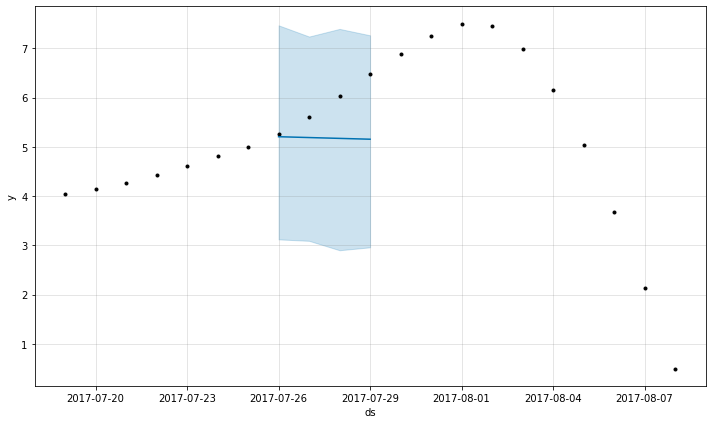

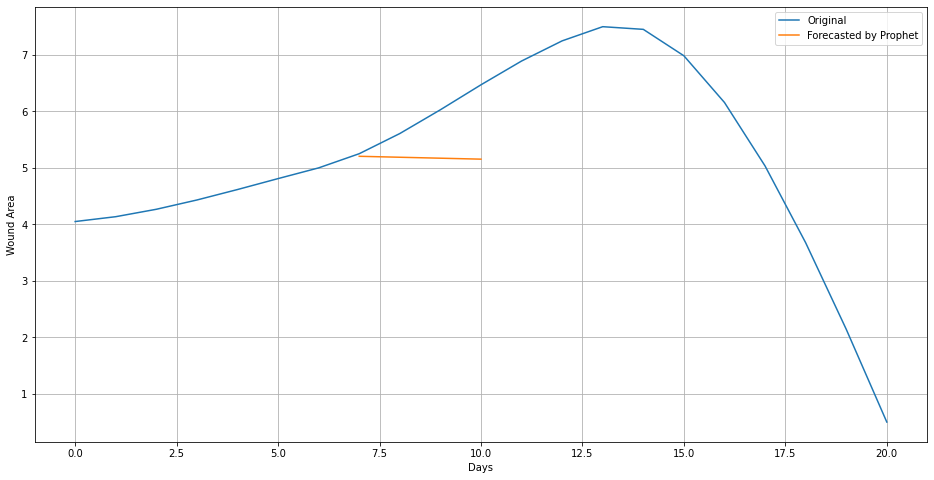

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 227
15
23

Initial log joint probability = -41.8509
Iteration  1. Log joint probability =    32.3793. Improved by 74.2302.
Iteration  2. Log joint probability =    55.7869. Improved by 23.4077.
Iteration  3. Log joint probability =    58.6846. Improved by 2.89774.
Iteration  4. Log joint probability =    59.1417. Improved by 0.457019.
Iteration  5. Log joint probability =    59.1473. Improved by 0.00569219.
Iteration  6. Log joint probability =    59.1512. Improved by 0.0038262.
Iteration  7. Log joint probability =     59.214. Improved by 0.0628256.
Iteration  8. Log joint probability =    59.2177. Improved by 0.00368154.
Iteration  9. Log joint probability =    59.2494. Improved by 0.0317209.
Iteration 10. Log joint probability =    59.2575. Improved by 0.00809223.
Iteration 11. Log joint probability =    59.2666. Improved by 0.00912106.
Iteration 12. Log joint probability =    59.2769. Improved by 0.0102369.
Iteration 13. Log joint probability =    59.2815. Improved by 0.0046

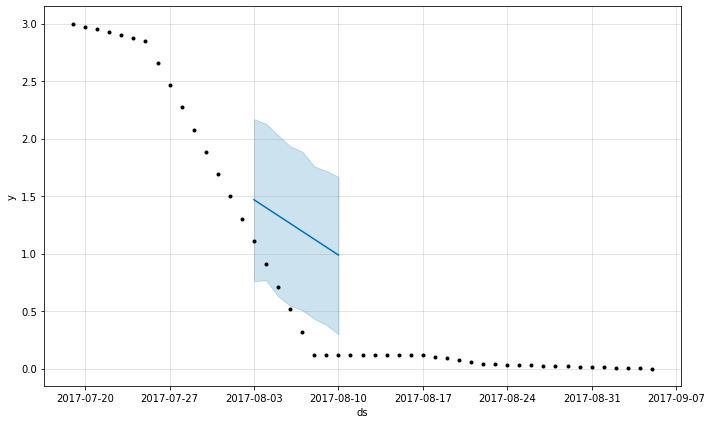

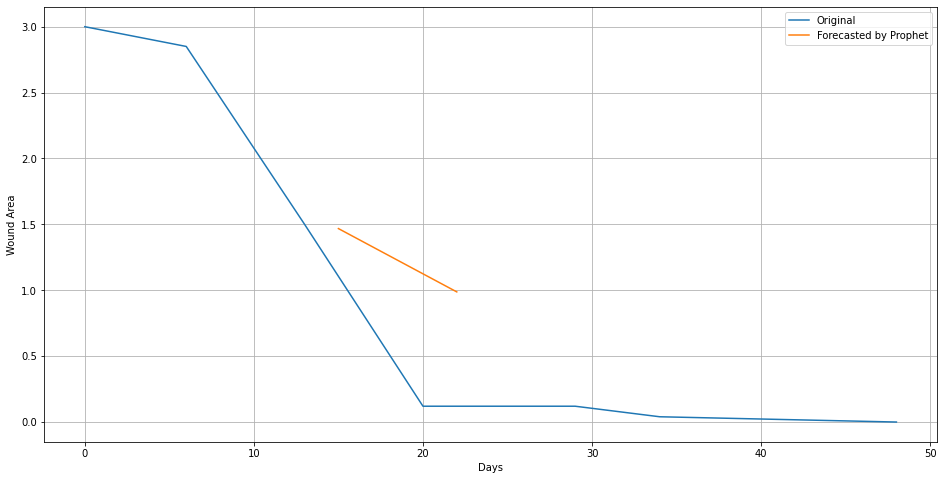

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


Wound: 228
4
8

Initial log joint probability = -37.1799
Iteration  1. Log joint probability =    31.3653. Improved by 68.5452.
Iteration  2. Log joint probability =    43.9323. Improved by 12.5671.
Iteration  3. Log joint probability =    43.9766. Improved by 0.0442478.
Iteration  4. Log joint probability =    44.0347. Improved by 0.0581078.
Iteration  5. Log joint probability =    44.1415. Improved by 0.106848.
Iteration  6. Log joint probability =    44.5243. Improved by 0.382798.
Iteration  7. Log joint probability =    45.1517. Improved by 0.627383.
Iteration  8. Log joint probability =    58.5618. Improved by 13.4101.
Iteration  9. Log joint probability =     58.591. Improved by 0.0292327.
Iteration 10. Log joint probability =    58.6267. Improved by 0.0356621.
Iteration 11. Log joint probability =    58.7693. Improved by 0.142621.
Iteration 12. Log joint probability =    58.8151. Improved by 0.0457723.
Iteration 13. Log joint probability =    58.8849. Improved by 0.0698241.
Iter

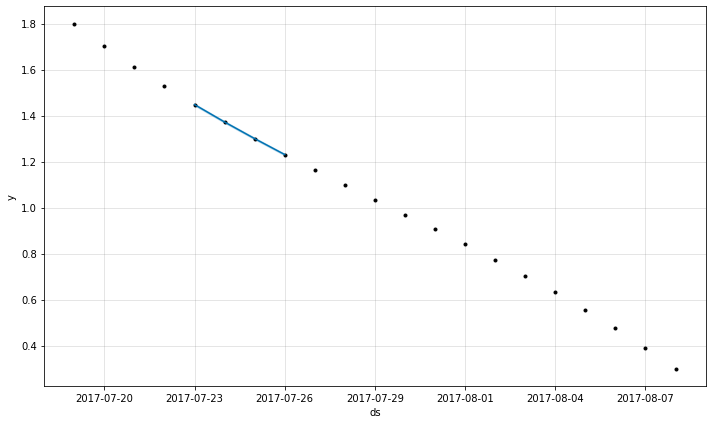

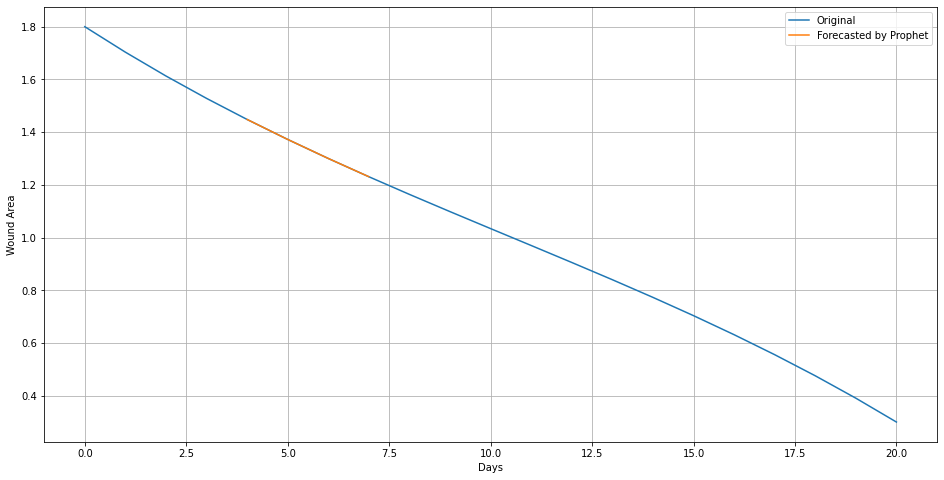

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 229
162
193
Initial log joint probability = -10.8251
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       205.929    0.00116275       82.9174           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       206.075    0.00116031       76.4961   1.303e-05       0.001      211  LS failed, Hessian reset 
     179       206.161   6.51841e-06       66.0995   6.574e-08       0.001      344  LS failed, Hessian reset 
     199       206.161   1.88207e-07        63.933      0.4653      0.4653      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       206.161   8.07472e-09       59.9176      0.5975      0.5975      397   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


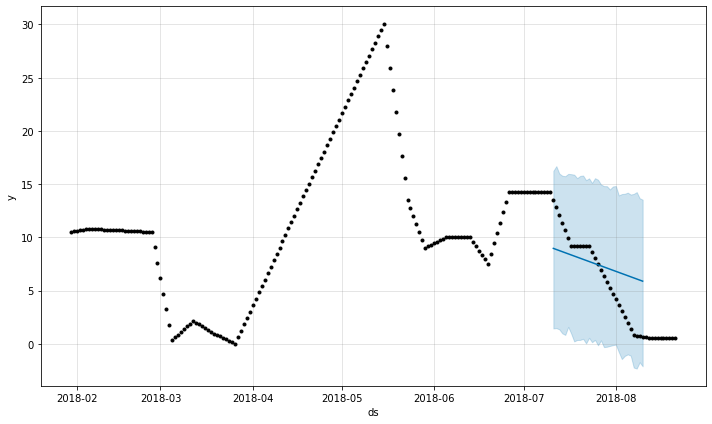

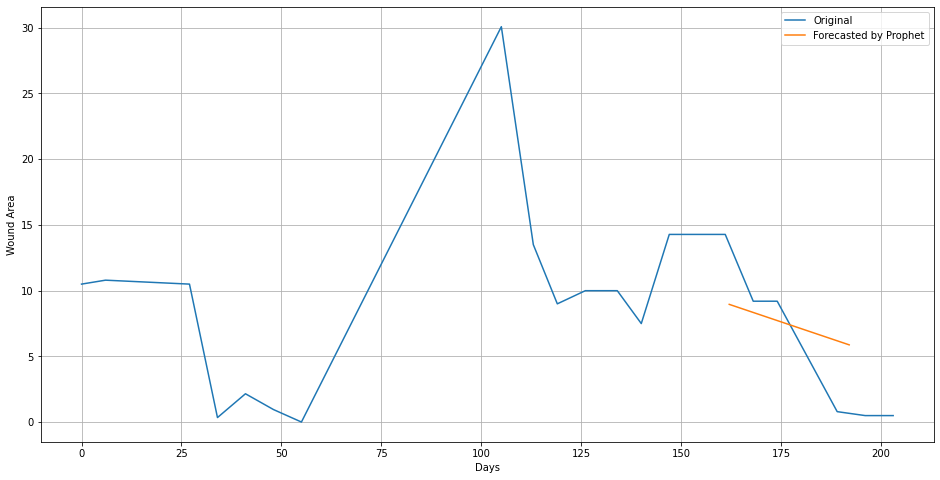

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 230
5
14

Initial log joint probability = -53.151
Iteration  1. Log joint probability =    25.3569. Improved by 78.508.
Iteration  2. Log joint probability =    45.5798. Improved by 20.2229.
Iteration  3. Log joint probability =    45.6109. Improved by 0.0310974.
Iteration  4. Log joint probability =    45.6748. Improved by 0.0639017.
Iteration  5. Log joint probability =    45.7052. Improved by 0.0304219.
Iteration  6. Log joint probability =    45.7347. Improved by 0.0295058.
Iteration  7. Log joint probability =    45.7349. Improved by 0.000131119.
Iteration  8. Log joint probability =    45.7429. Improved by 0.00804705.
Iteration  9. Log joint probability =    45.7506. Improved by 0.00769157.
Iteration 10. Log joint probability =    45.7595. Improved by 0.00890188.
Iteration 11. Log joint probability =    45.7639. Improved by 0.00442748.
Iteration 12. Log joint probability =    45.7682. Improved by 0.00424249.
Iteration 13. Log joint probability =    45.7694. Improved by 0.0

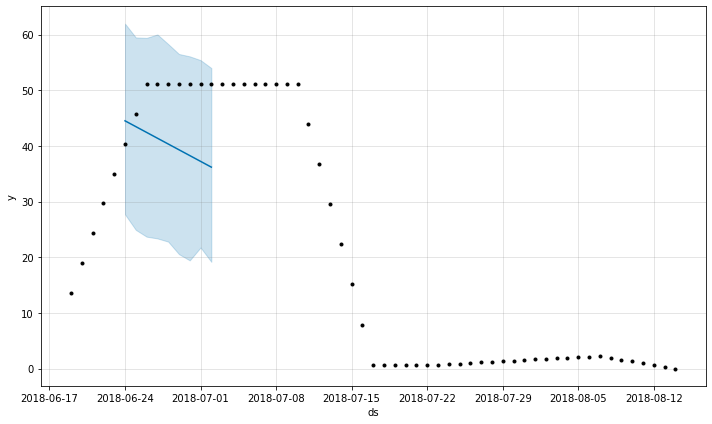

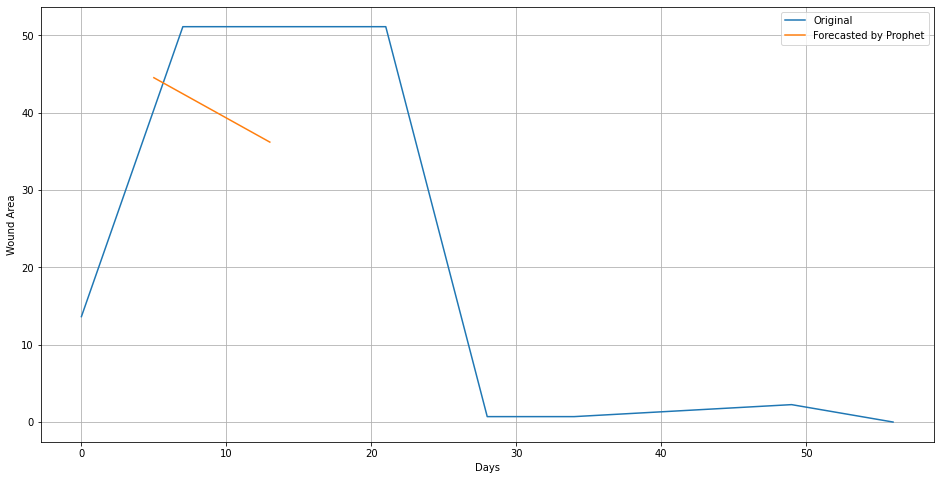

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 231
20
27

Initial log joint probability = -35.7108
Iteration  1. Log joint probability =    30.9203. Improved by 66.6311.
Iteration  2. Log joint probability =    32.2465. Improved by 1.32621.
Iteration  3. Log joint probability =    36.8114. Improved by 4.56494.
Iteration  4. Log joint probability =    38.5819. Improved by 1.77053.
Iteration  5. Log joint probability =    38.7061. Improved by 0.12414.
Iteration  6. Log joint probability =    38.7188. Improved by 0.0126731.
Iteration  7. Log joint probability =     38.788. Improved by 0.0692915.
Iteration  8. Log joint probability =    38.8416. Improved by 0.0535885.
Iteration  9. Log joint probability =    38.8746. Improved by 0.0329744.
Iteration 10. Log joint probability =    38.9446. Improved by 0.0699435.
Iteration 11. Log joint probability =    38.9962. Improved by 0.0516439.
Iteration 12. Log joint probability =    39.0097. Improved by 0.0134872.
Iteration 13. Log joint probability =    39.0486. Improved by 0.0389425.
It

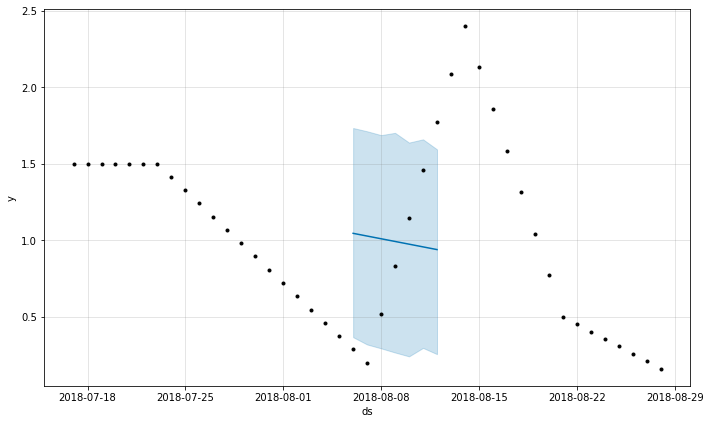

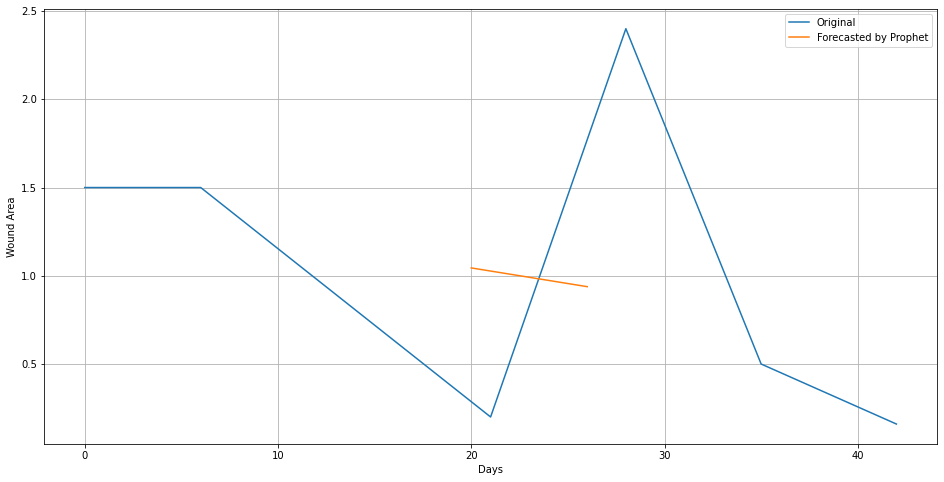

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 232
28
35

Initial log joint probability = -34.7181
Iteration  1. Log joint probability =    46.4433. Improved by 81.1613.
Iteration  2. Log joint probability =    72.4234. Improved by 25.9801.
Iteration  3. Log joint probability =    78.5331. Improved by 6.1097.
Iteration  4. Log joint probability =    78.5921. Improved by 0.0590008.
Iteration  5. Log joint probability =    78.6021. Improved by 0.00998399.
Iteration  6. Log joint probability =    78.6039. Improved by 0.0018034.
Iteration  7. Log joint probability =    78.6666. Improved by 0.0626932.
Iteration  8. Log joint probability =    78.6776. Improved by 0.0109823.
Iteration  9. Log joint probability =     78.682. Improved by 0.00439192.
Iteration 10. Log joint probability =    78.7088. Improved by 0.0267956.
Iteration 11. Log joint probability =    78.7121. Improved by 0.00336704.
Iteration 12. Log joint probability =    78.7218. Improved by 0.00968268.
Iteration 13. Log joint probability =    78.7262. Improved by 0.0043

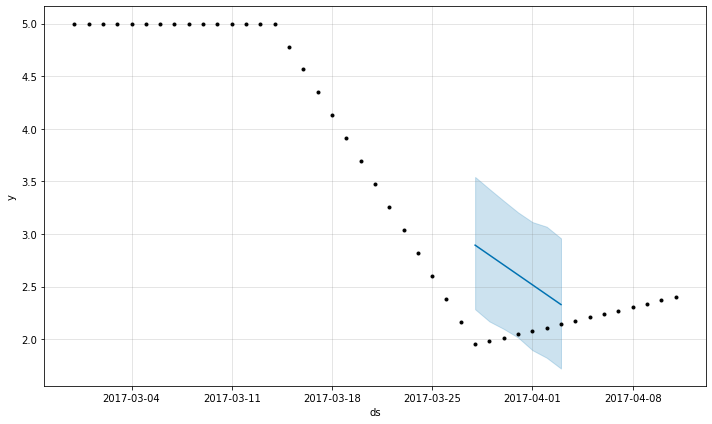

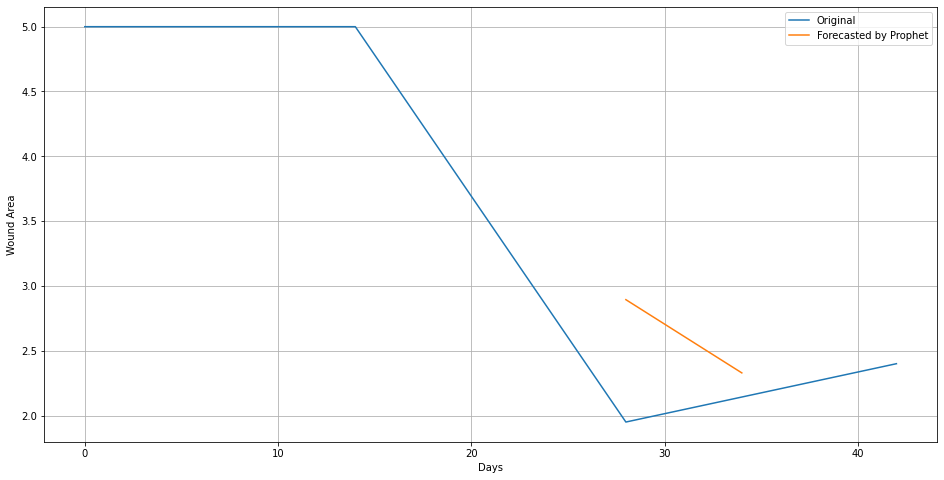

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 233
0
1
Wound: 234
16
32
Initial log joint probability = -3.24487
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       157.416    0.00968889       89.2819      0.9271      0.9271      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       158.042    0.00230278       86.6339   3.019e-05       0.001      174  LS failed, Hessian reset 
     189       158.816   0.000493727       84.5649   5.735e-06       0.001      306  LS failed, Hessian reset 
     199       158.851   0.000175169       82.2713           1           1      319   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     237       158.863   4.38109e-09       93.9282      0.1254      0.1254      367   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


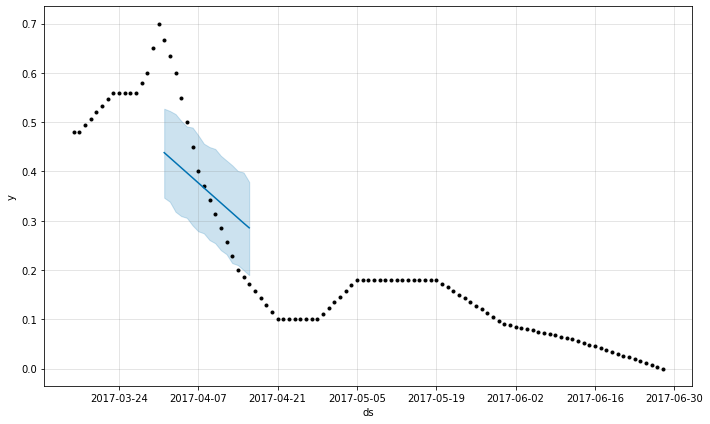

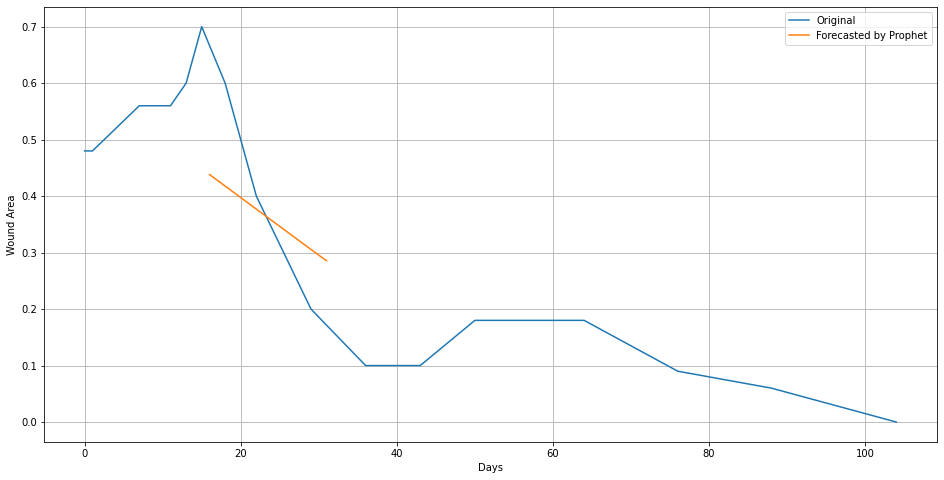

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 235
19
38
Initial log joint probability = -6.41802
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      85       158.472   0.000980971       96.0682   1.076e-05       0.001      154  LS failed, Hessian reset 
      99       158.586    0.00010259       68.1145       1.094      0.1094      172   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       158.614   4.57551e-05       92.3717   6.273e-07       0.001      262  LS failed, Hessian reset 
     192       158.617    1.2856e-06       78.5982   1.434e-08       0.001      368  LS failed, Hessian reset 
     199       158.617   3.93179e-08       69.8738      0.3226      0.3226      377   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     219       158.617   7.71234e-09       70.9063      0.4898      0.4898      401   
Optimization terminated normally: 
  Convergence detected: absolute para

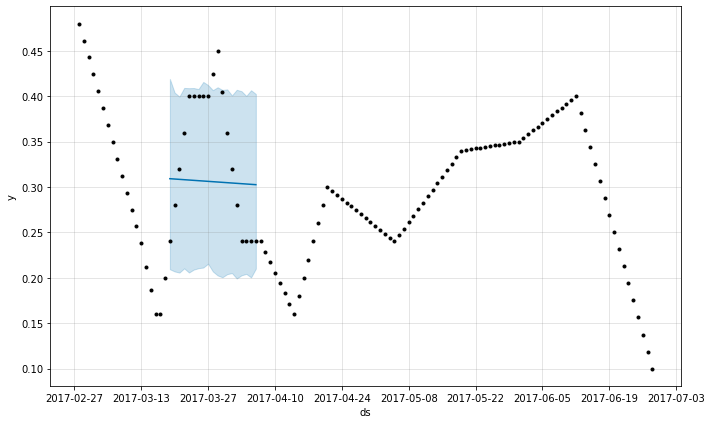

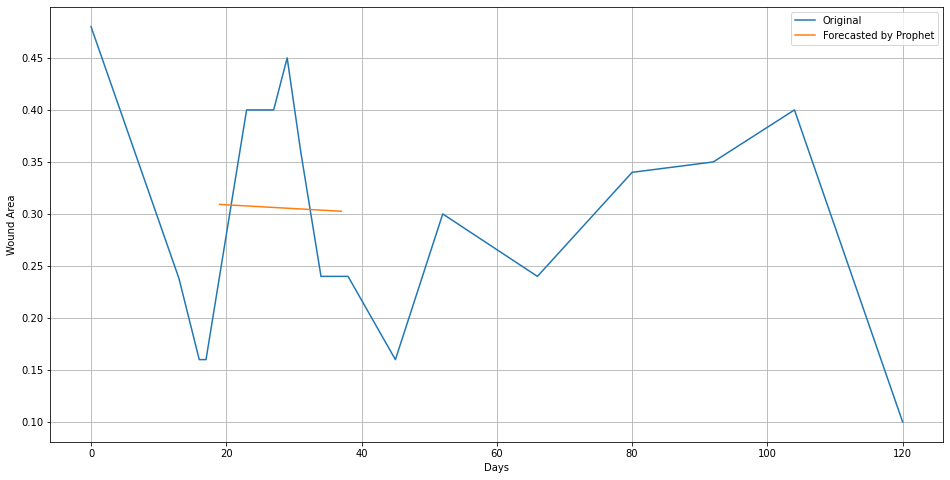

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 23.


Wound: 236
2
7

Initial log joint probability = -30.7741
Iteration  1. Log joint probability =      13.71. Improved by 44.4841.
Iteration  2. Log joint probability =     23.496. Improved by 9.78597.
Iteration  3. Log joint probability =    28.1175. Improved by 4.62155.
Iteration  4. Log joint probability =    28.1271. Improved by 0.00953514.
Iteration  5. Log joint probability =    28.1401. Improved by 0.0129926.
Iteration  6. Log joint probability =    28.1576. Improved by 0.0175462.
Iteration  7. Log joint probability =    28.1691. Improved by 0.0114997.
Iteration  8. Log joint probability =    28.1748. Improved by 0.00574845.
Iteration  9. Log joint probability =     28.189. Improved by 0.0141594.
Iteration 10. Log joint probability =    28.2122. Improved by 0.0231706.
Iteration 11. Log joint probability =    28.2238. Improved by 0.0116042.
Iteration 12. Log joint probability =     28.316. Improved by 0.0921916.
Iteration 13. Log joint probability =    29.0262. Improved by 0.710247.

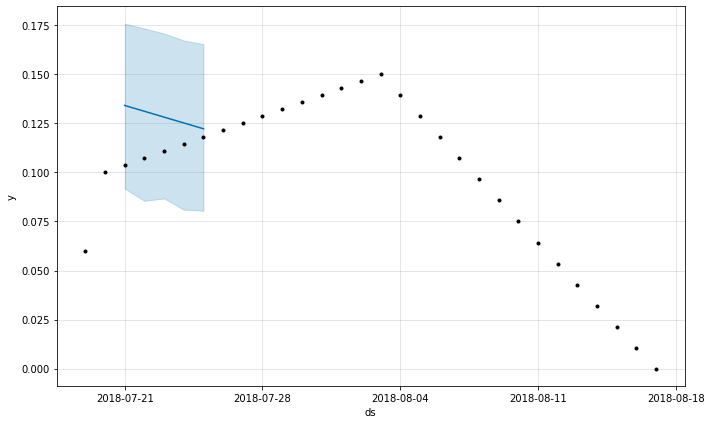

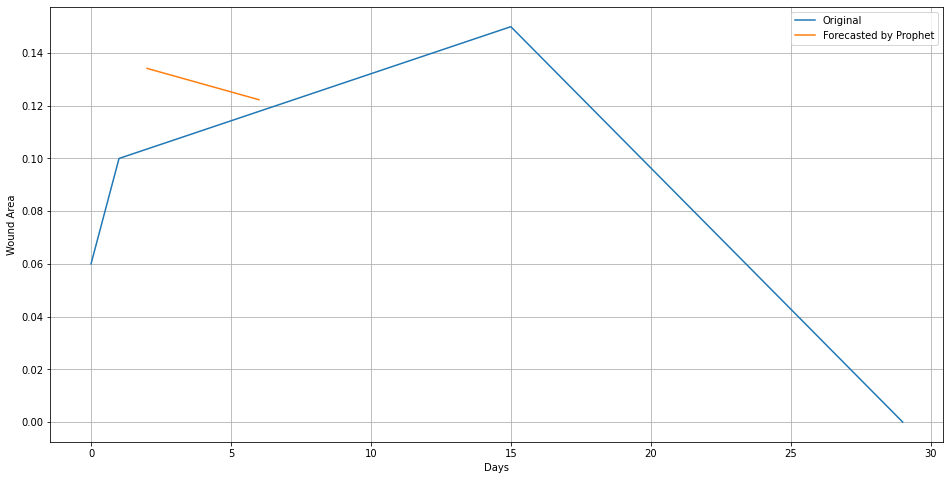

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 237
55
78
Initial log joint probability = -7.94364
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       246.793   8.99874e-06       65.0671      0.3191      0.3191      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     149       246.818   7.84315e-05       91.5195   9.109e-07       0.001      228  LS failed, Hessian reset 
     199       246.821    3.8983e-07       67.6726           1           1      293   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       247.474    0.00421858       89.3819   5.454e-05       0.001      345  LS failed, Hessian reset 
     299       248.904   0.000590829       48.8873      0.9512      0.9512      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     395       249.708   5.43229e-05       62.8636   7.653e-07       0.001      616  LS fai

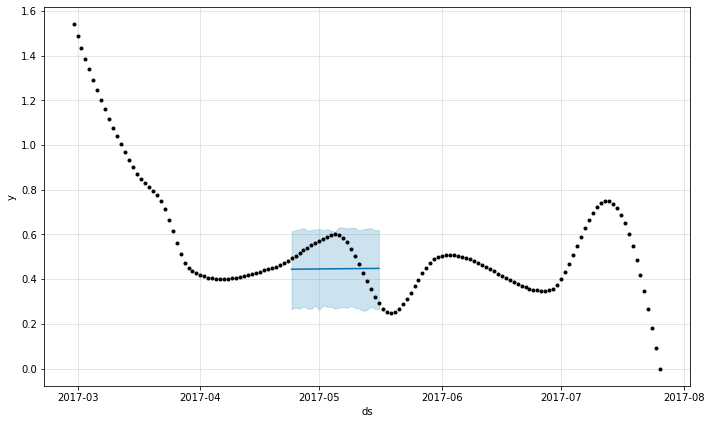

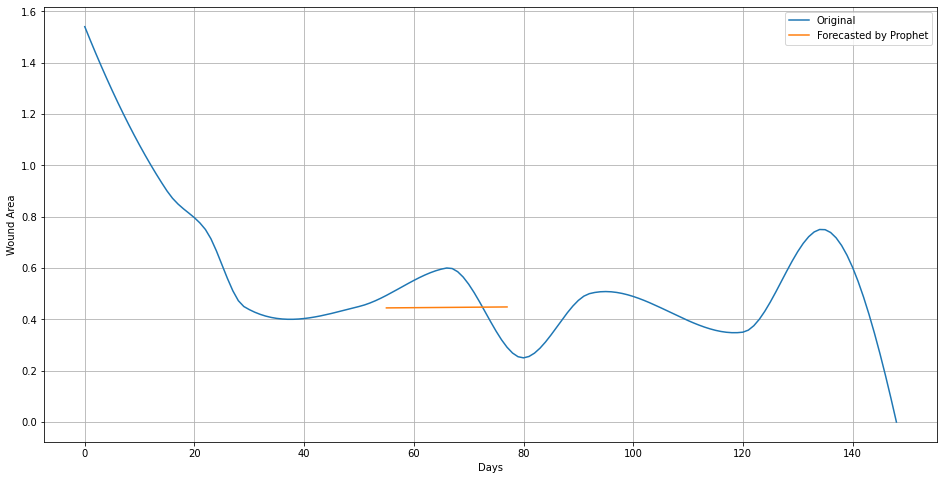

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 238
170
233
Initial log joint probability = -30.7775
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       918.613   0.000584545       90.3036   1.554e-06       0.001      129  LS failed, Hessian reset 
      99       934.513     0.0150408       113.038           1           1      153   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     158       948.094   0.000367626       106.626   2.413e-06       0.001      268  LS failed, Hessian reset 
     199       950.293   0.000394661       88.7326           1           1      320   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       955.469    0.00273605       176.088           1           1      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     342         960.8   0.000536178       168.542   4.707e-06       0.001      567  LS f

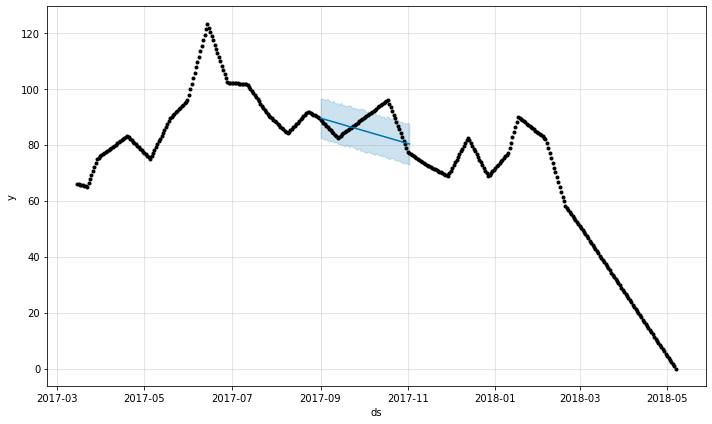

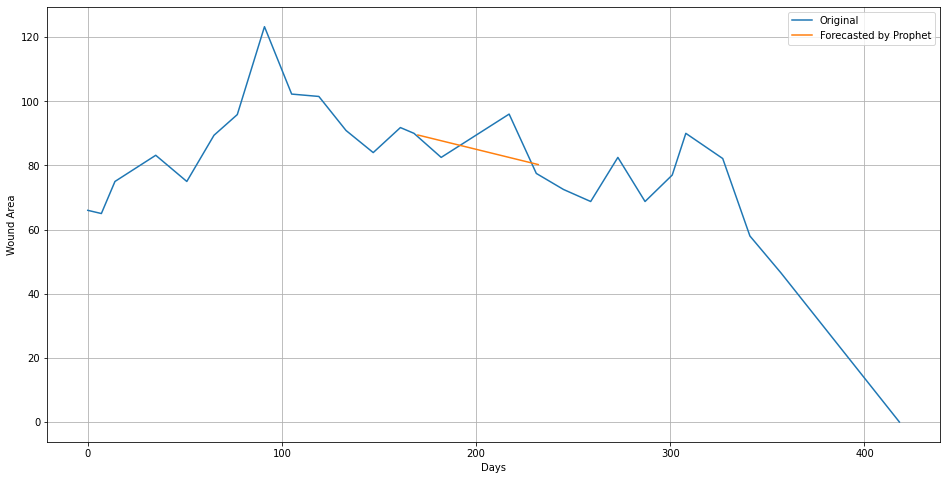

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 239
57
85
Initial log joint probability = -16.9636
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       242.505   0.000501707       58.1967           1           1      160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       242.749   4.37066e-05       90.5893           1           1      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       242.753    3.0349e-05       56.9414   6.097e-07       0.001      346  LS failed, Hessian reset 
     262       242.754   1.64103e-05       32.2551    1.87e-07       0.001      473  LS failed, Hessian reset 
     291       242.755   5.77305e-08       41.6463   9.848e-10       0.001      557  LS failed, Hessian reset 
     294       242.755    6.6999e-09       38.2793      0.1894           1      562   
Optimization terminated normally: 
  Convergence detected: absolute para

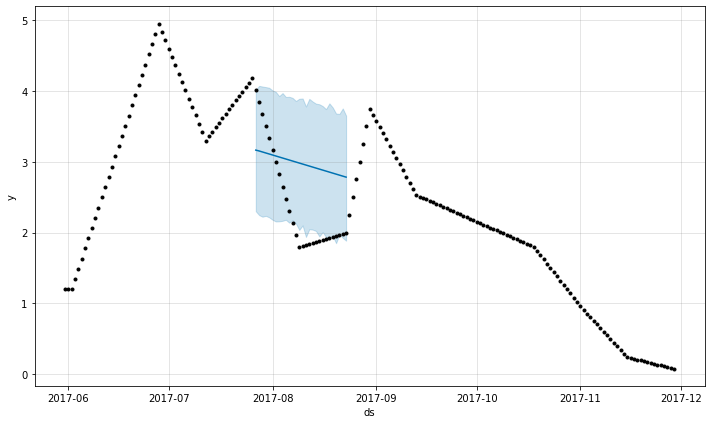

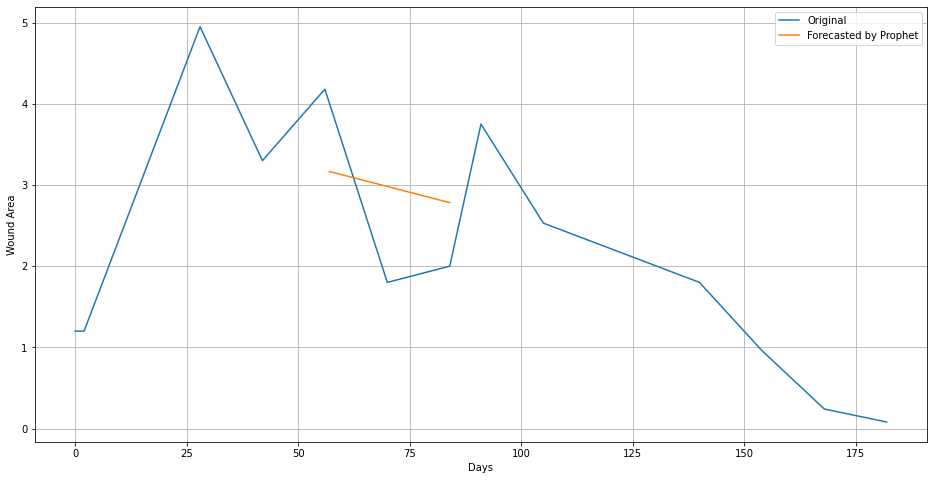

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Wound: 240
37
46

Initial log joint probability = -47.5142
Iteration  1. Log joint probability =    81.9694. Improved by 129.484.
Iteration  2. Log joint probability =    103.857. Improved by 21.8881.
Iteration  3. Log joint probability =     105.74. Improved by 1.88247.
Iteration  4. Log joint probability =    105.833. Improved by 0.0932042.
Iteration  5. Log joint probability =    105.898. Improved by 0.0645718.
Iteration  6. Log joint probability =    106.049. Improved by 0.151443.
Iteration  7. Log joint probability =    106.118. Improved by 0.0693245.
Iteration  8. Log joint probability =    106.183. Improved by 0.0647613.
Iteration  9. Log joint probability =    106.193. Improved by 0.0102393.
Iteration 10. Log joint probability =    113.945. Improved by 7.75134.
Iteration 11. Log joint probability =    113.987. Improved by 0.0425396.
Iteration 12. Log joint probability =        114. Improved by 0.0129751.
Iteration 13. Log joint probability =    114.004. Improved by 0.00343508.


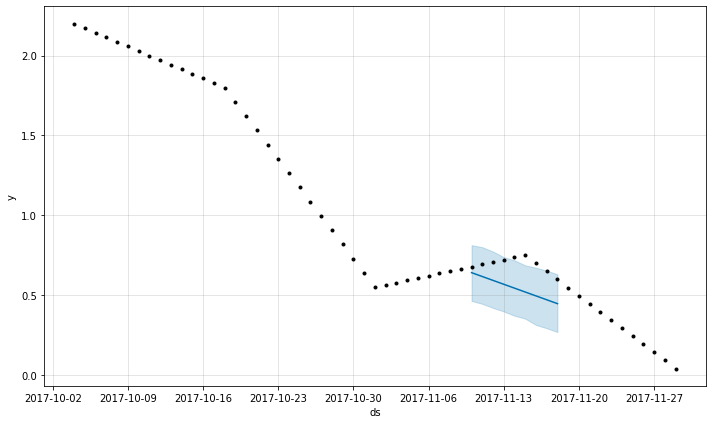

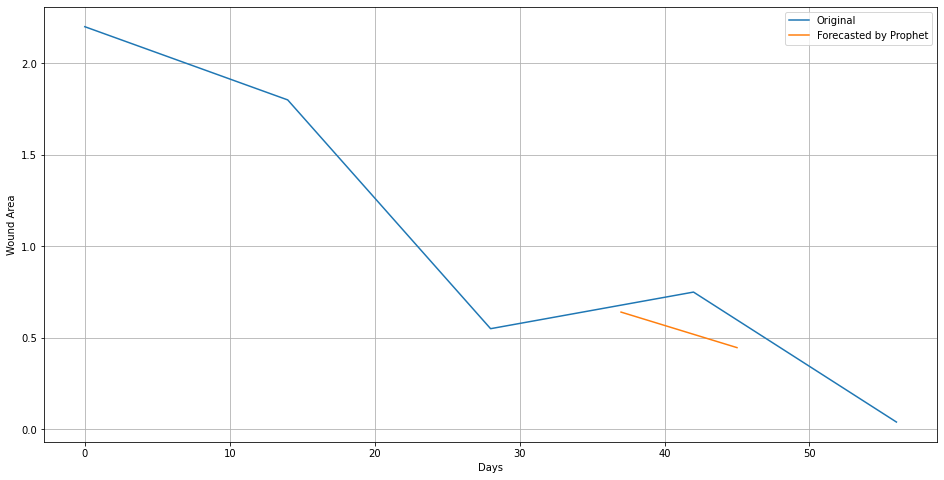

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 22.


Wound: 241
10
15

Initial log joint probability = -28.4196
Iteration  1. Log joint probability =    51.5205. Improved by 79.9401.
Iteration  2. Log joint probability =    69.3982. Improved by 17.8776.
Iteration  3. Log joint probability =    91.3808. Improved by 21.9826.
Iteration  4. Log joint probability =    109.727. Improved by 18.3467.
Iteration  5. Log joint probability =    120.789. Improved by 11.0616.
Iteration  6. Log joint probability =    123.257. Improved by 2.46806.
Iteration  7. Log joint probability =    126.724. Improved by 3.4669.
Iteration  8. Log joint probability =    127.426. Improved by 0.701513.
Iteration  9. Log joint probability =    128.307. Improved by 0.881446.
Iteration 10. Log joint probability =    129.715. Improved by 1.40834.
Iteration 11. Log joint probability =    130.219. Improved by 0.503591.
Iteration 12. Log joint probability =    130.437. Improved by 0.218291.
Iteration 13. Log joint probability =    130.539. Improved by 0.101786.
Iteration 14. 

SystemError: <class 'stanfit4anon_model_dfdaf2b8ece8a02eb11f050ec701c0ec_6977853972157458344.PyStanHolder'> returned a result with an error set

In [17]:
list_wounds=df_for["Wound"].unique()

result_df=pd.DataFrame(index=np.arange(len(list_wounds)))

result_df["Wound"]=np.nan
result_df["Gender"]=np.nan
result_df["Race"]=np.nan
result_df["Ethinicity"]=np.nan
result_df["RMSE"]=np.nan
result_df["MASE"]=np.nan
result_df["R-squared"]=np.nan
    

for i in range(0,len(list_wounds)):
#     if i>4:
#         break
    print("Wound:",i+1)
    wound=list_wounds[i]
    df_1=df_for.query("Wound==@wound")
    #display(df_1)
    df=df_1[["Date","Area"]]
    test,train=make_input_for_arima(df)
    
    
    result_df["Wound"][i]=int(df_1["Wound"].unique()[0])
    result_df["Gender"][i]=str(df_1["Gender"].unique()[0])
    result_df["Race"][i]=str(df_1["Race"].unique()[0])
    result_df["Ethinicity"][i]=str(df_1["Ethinicity"].unique()[0])

    df=df.reset_index()
    df=df.drop(["index"],axis=1)
    if train.shape[0]>1:
        if train.shape[0]==2 or train.shape[0]==3:
            if len(list(set(train.Area.values.tolist())))>1 & (datetime.strptime(train.reset_index()["Date"][train.shape[0]-1],'%Y-%m-%d')-datetime.strptime(train.reset_index()["Date"][0],'%Y-%m-%d')).days>2 and train["Area"].dropna().shape[0]!=0:
            
                rmse, mase, r_square=model_prophet(df, test, train)
                result_df["RMSE"][i]=rmse
                result_df["MASE"][i]=mase
                result_df["R-squared"][i]=r_square
                
        if train.shape[0]>3 and train["Area"].dropna().shape[0]!=0:
            
            rmse, mase, r_square=model_prophet(df, test, train)
            result_df["RMSE"][i]=rmse
            result_df["MASE"][i]=mase
            result_df["R-squared"][i]=r_square
                
#result_df["Wound"]=result_df["Wound"].astype(int)

In [12]:
df

,index,Date,Area
0,0,2016-10-26,4.00000
1,1,2016-10-27,4.00000
2,2,2016-10-28,4.00000
3,3,2016-10-29,4.00000
4,4,2016-10-30,4.00000
...,...,...,...
128,128,2017-03-03,0.79770
129,129,2017-03-04,0.79875
130,130,2017-03-05,0.79980
131,131,2017-03-06,0.80085


In [10]:
i

14917

In [24]:
result_df

,Wound,Gender,Race,Ethinicity,RMSE,MASE,R-squared
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
14913,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14914,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14915,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14916,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
result_df=result_df.dropna()
result_df

,Wound,Gender,Race,Ethinicity,RMSE,MASE,R-squared


In [13]:
result_df_prev=pd.read_csv("Prophet_result.csv")
result_df_prev=result_df_prev.drop(["Unnamed: 0"],axis=1)
result_df_prev=result_df_prev.dropna()
result_df_prev

,Wound,Gender,Race,Ethinicity,RMSE,MASE,R-squared
0,1.0,M,White,Non-Hispanic,1.016037e+00,3.270560e+00,2.864943e-01
1,2.0,M,White,Non-Hispanic,2.604508e-01,1.224672e+00,1.000000e+00
2,3.0,M,White,Non-Hispanic,4.404855e-03,1.748270e-01,1.000000e+00
3,5.0,M,White,Non-Hispanic,8.881784e-16,2.691450e-15,1.000000e+00
4,6.0,M,White,Non-Hispanic,1.606930e-01,1.689620e+00,9.959023e-01
...,...,...,...,...,...,...,...
11068,15057.0,M,White,Non-Hispanic,1.776950e-01,5.211385e+00,6.153844e-01
11069,15058.0,M,White,Non-Hispanic,1.173184e+00,3.448160e-01,6.264750e-01
11070,15059.0,M,White,Non-Hispanic,3.091327e-02,5.693464e+00,9.091157e-01
11071,15060.0,M,White,Non-Hispanic,1.439937e-02,1.197847e+00,1.000000e+00


In [14]:
new_df=pd.concat([result_df_prev,result_df],axis=0)
new_df

,Wound,Gender,Race,Ethinicity,RMSE,MASE,R-squared
0,1.0,M,White,Non-Hispanic,1.016037e+00,3.270560e+00,0.286494
1,2.0,M,White,Non-Hispanic,2.604508e-01,1.224672e+00,1.000000
2,3.0,M,White,Non-Hispanic,4.404855e-03,1.748270e-01,1.000000
3,5.0,M,White,Non-Hispanic,8.881784e-16,2.691450e-15,1.000000
4,6.0,M,White,Non-Hispanic,1.606930e-01,1.689620e+00,0.995902
...,...,...,...,...,...,...,...
14912,17876.0,F,White,Non-Hispanic,1.173213e-01,1.715447e-01,0.996477
14913,17877.0,M,White,Non-Hispanic,2.315166e-03,1.471648e-02,1.000000
14914,17879.0,F,White,Non-Hispanic,9.624515e-03,4.031102e-01,1.000000
14915,17880.0,F,White,Non-Hispanic,6.524080e-01,2.851928e+00,1.000000


In [15]:
new_df.to_csv("Prophet_result.csv")